### BADASS Analysis: tea

Can we train an ML model to distinguish three different classes of tea (black, grey and green) from one another? And can the model recognise the class label of a subclass of analyte it did not see during training (e.g. can it identify Sainsbury's Gold as black tea when Sainsbury's Gold is not one of the tea brands used to train the model)?

#### Analytes

Black:
- Clipper
- Diplomat
- Dragonfly
- PG Tips
- Pukka
- Sainsbury's Gold
- Tesco
- Tetley
- Twinings
- Yorkshire

Earl Grey:
- Asda
- Clipper
- Coop
- Devonshire
- Diplomat
- Joe's
- Mand S
- Pukka
- Tesco
- Twinings

Green:
- Clipper
- Diplomat
- Double Dragon
- Dragonfly
- Hand B
- Joe's
- Qi
- Sainsbury's
- Tetley
- Twinings

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Tea data (standard array)

In [3]:
tea_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/'
                           'Reformatted_tea_csvs_split_brand/'},
    results_dir='/home/ks17361/ML_environment/BADASS/Tea_analysis_standard_array/Tea_split_brand/'
                'Tea_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6'],
    peptide_dict = {'DPH': ['No Pep', 'GRP22', 'GRP35', 'GRP46', 'GRP51', 'GRP52', 'GRP63', 'GRP80',
                            'Pent', 'Hex', 'Hex2', 'Hept', '24D', '24E', '24K', '17K']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
tea_fluor_data.group_xlsx_repeats()

In [5]:
tea_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['Black_Clipper_repeat_1.xlsx',
                             'Black_Diplomat_repeat_1.xlsx',
                             'Black_Dragonfly_repeat_1.xlsx',
                             'Black_Pgtips_repeat_1.xlsx',
                             'Black_Pukka_repeat_1.xlsx',
                             'Black_Sainsburysgold_repeat_1.xlsx',
                             'Black_Tesco_repeat_1.xlsx',
                             'Black_Tetley_repeat_1.xlsx',
                             'Black_Twinings_repeat_1.xlsx',
                             'Black_Yorkshire_repeat_1.xlsx',
                             'Green_Clipper_repeat_1.xlsx',
                             'Green_Diplomat_repeat_1.xlsx',
                             'Green_Doubledragon_repeat_1.xlsx',
                             'Green_Dragonfly_repeat_1.xlsx',
                             'Green_Handb_repeat_1.xlsx',
                          

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

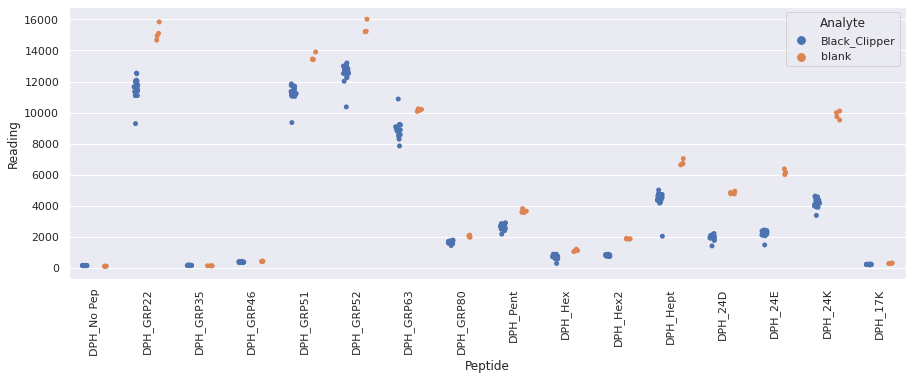

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Diplomat_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

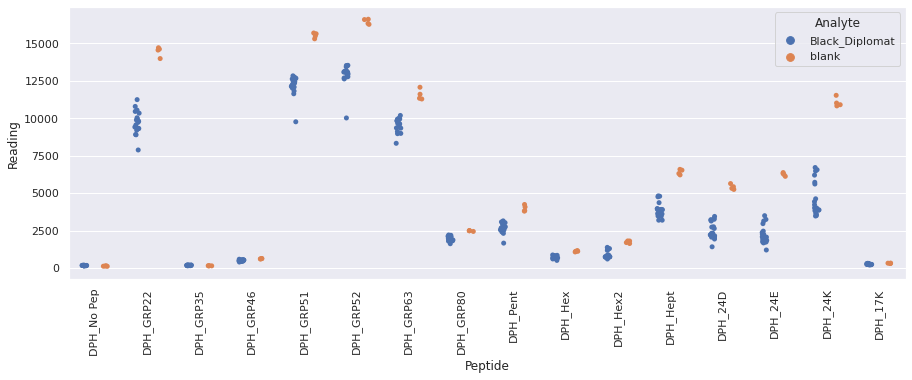

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Dragonfly_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

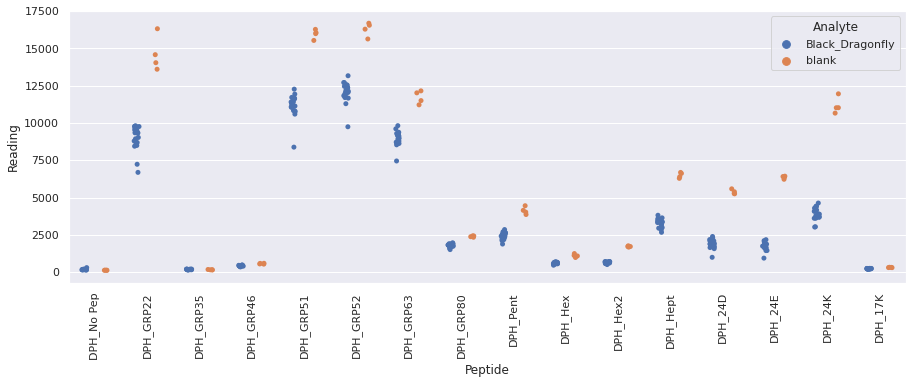

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pgtips_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

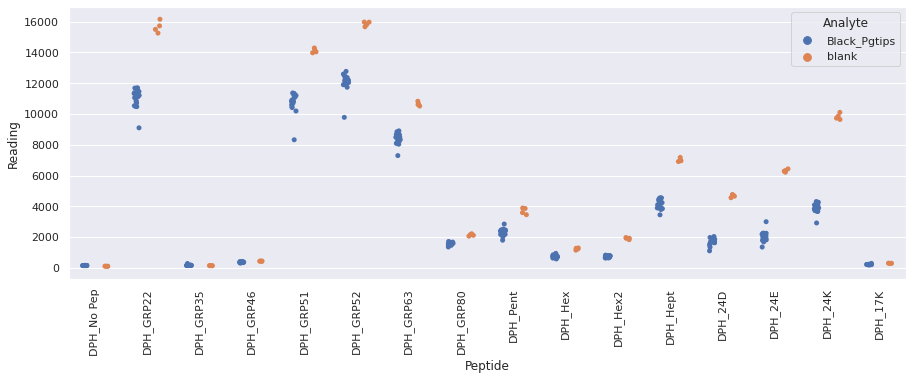

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pukka_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

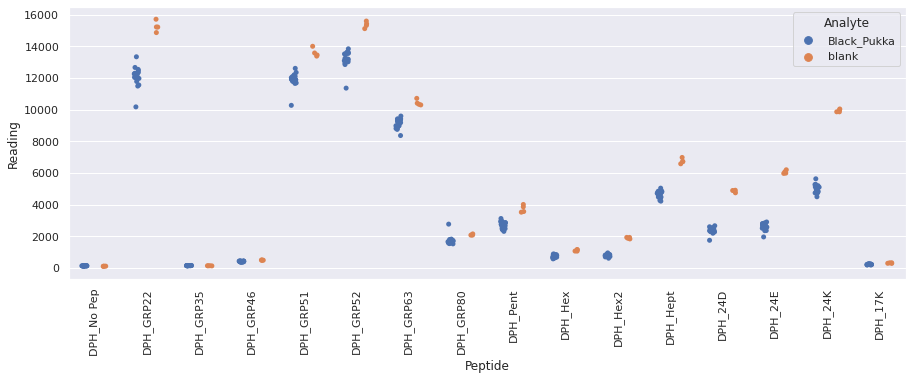

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Sainsburysgold_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

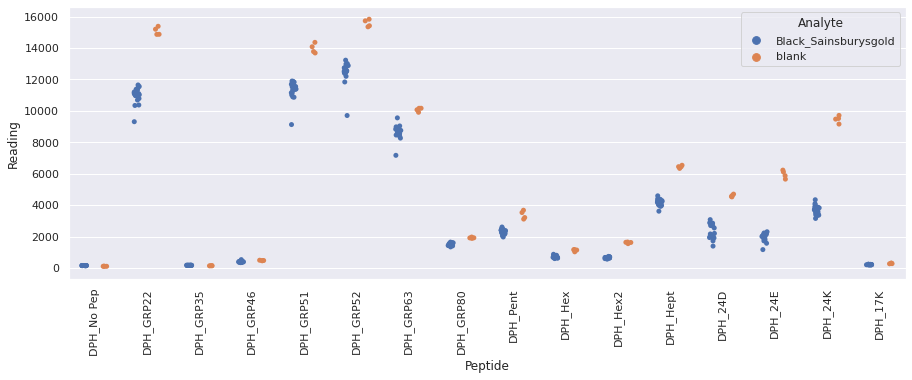

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tesco_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

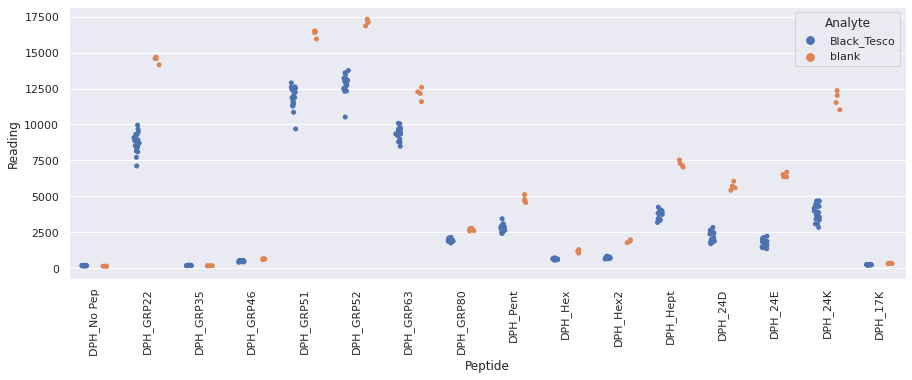

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tetley_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

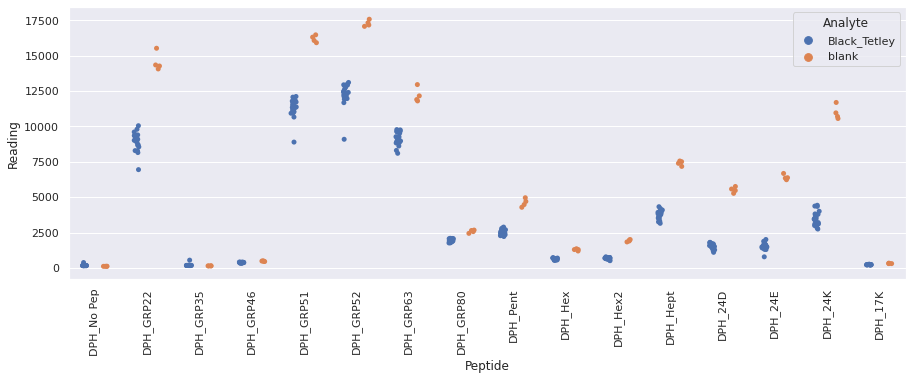

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Twinings_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

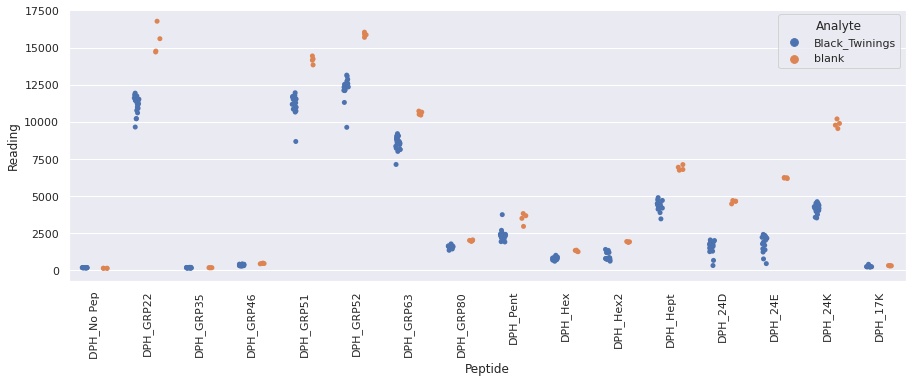

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Yorkshire_repeat_1.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

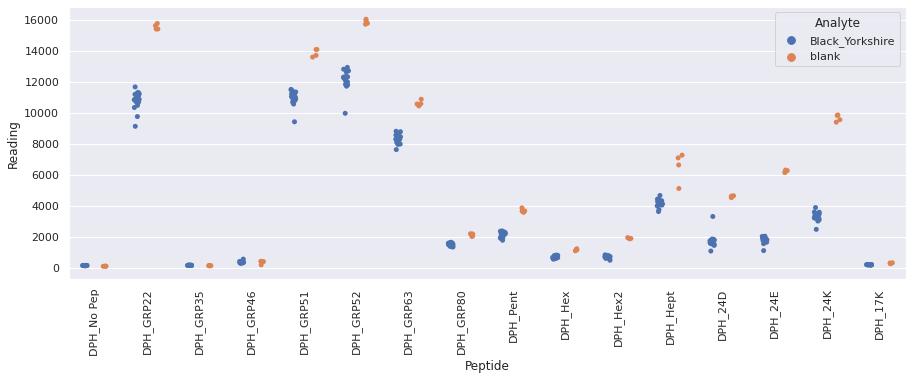

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Clipper_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

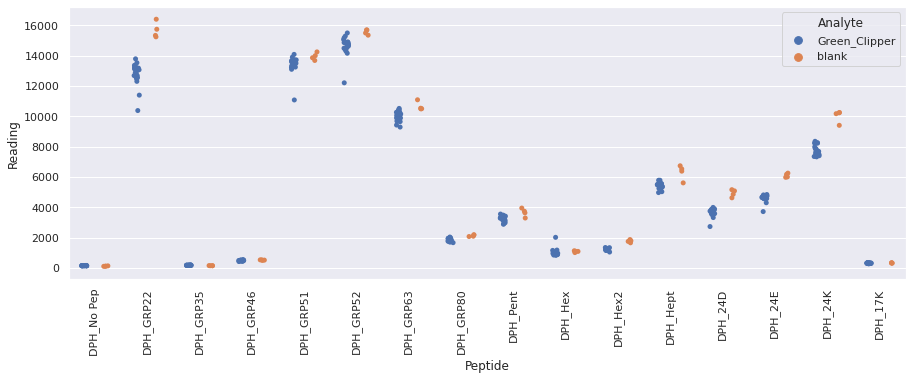

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Diplomat_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

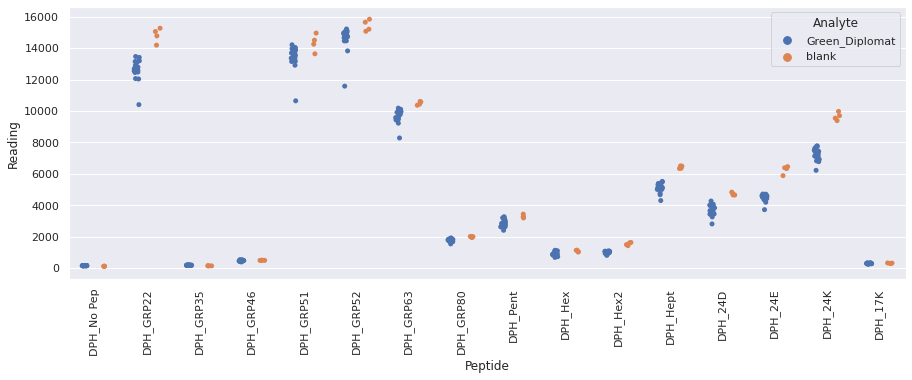

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Doubledragon_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

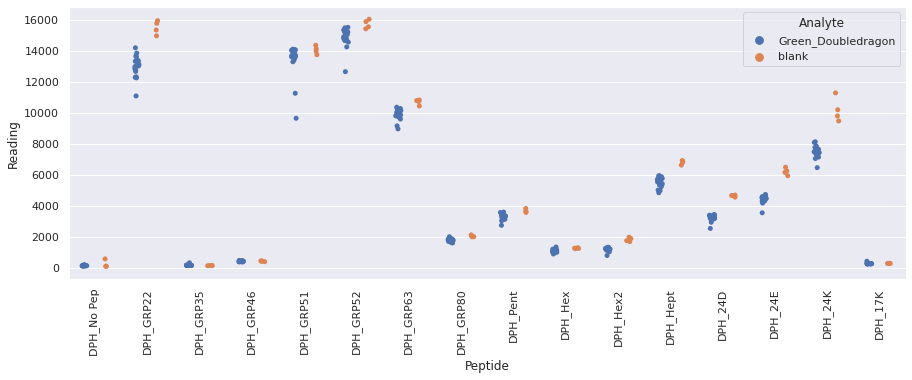

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Dragonfly_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

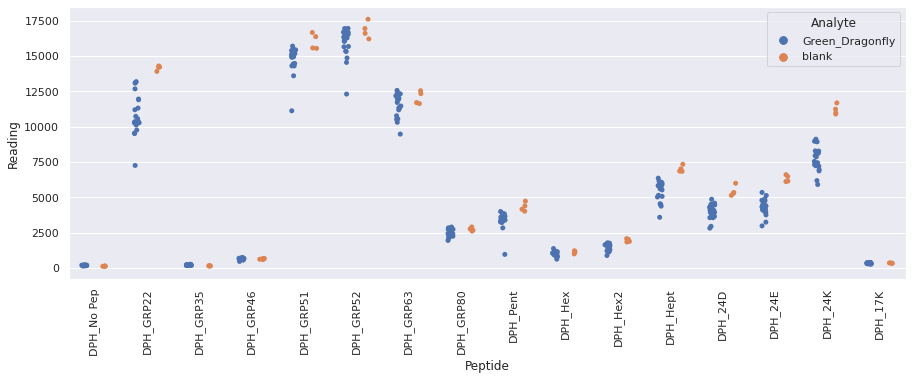

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Handb_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

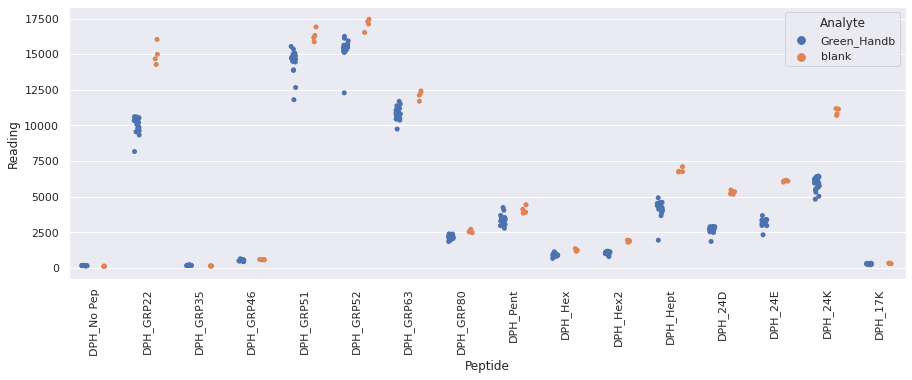

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Joes_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

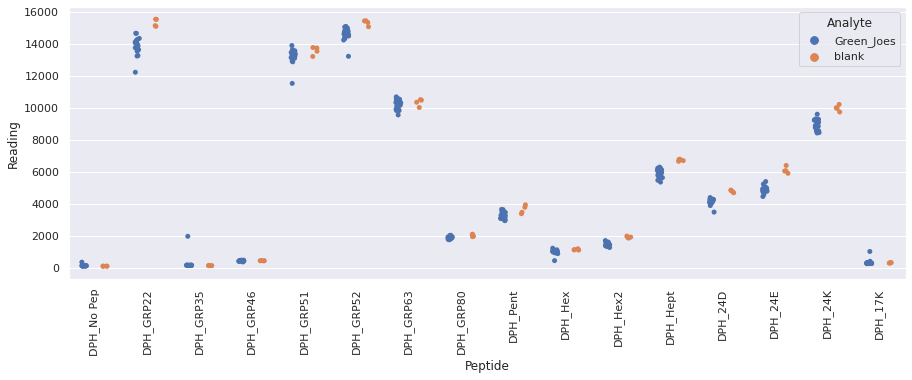

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Qi_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

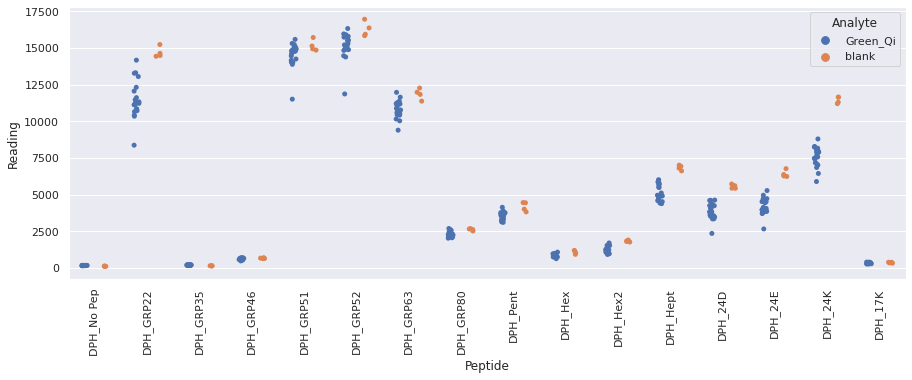

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Sainsburys_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

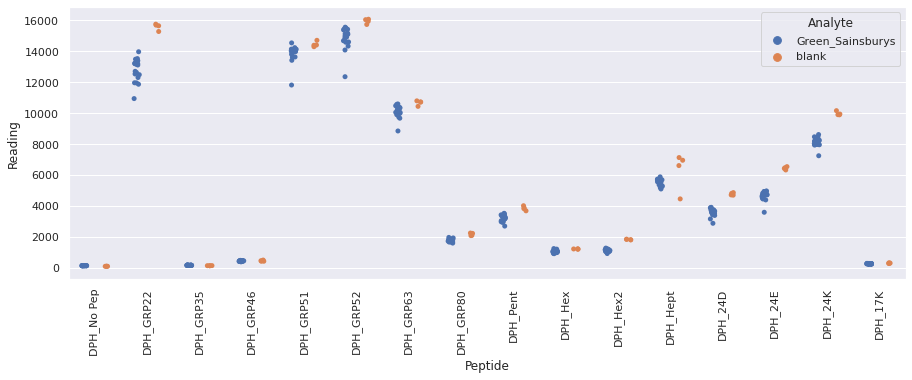

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Tetley_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

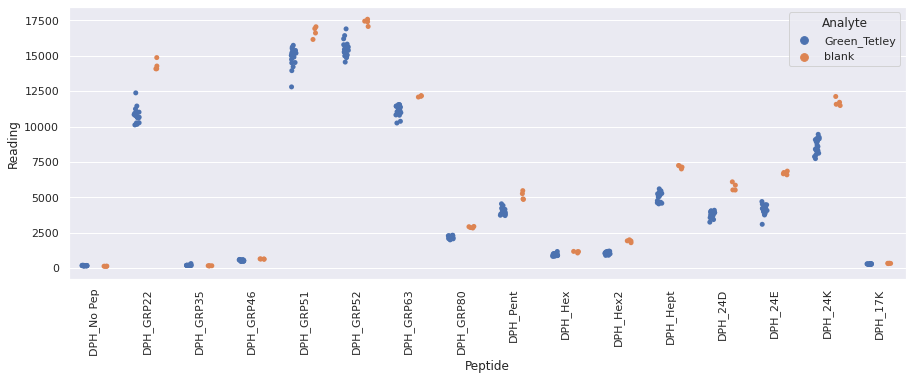

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Twinings_repeat_1.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

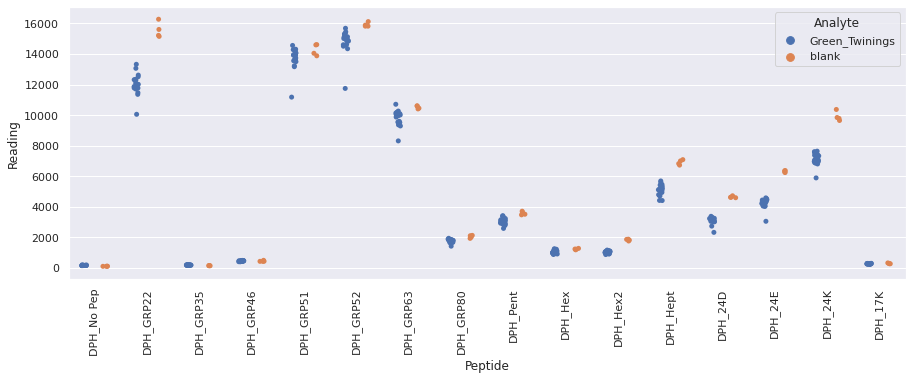

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Asda_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

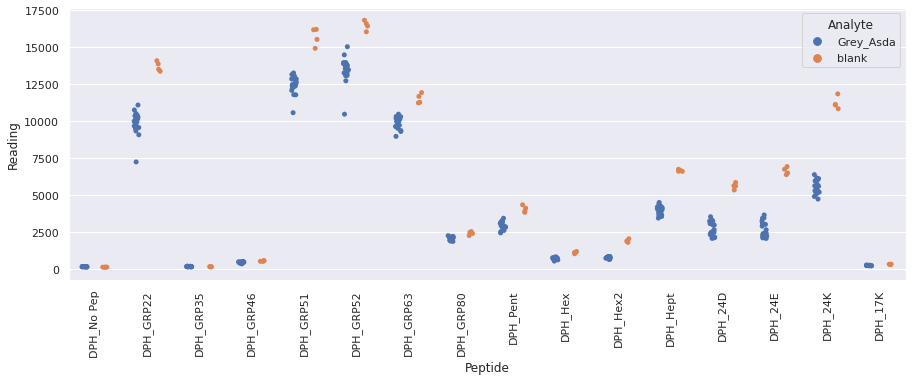

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Clipper_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

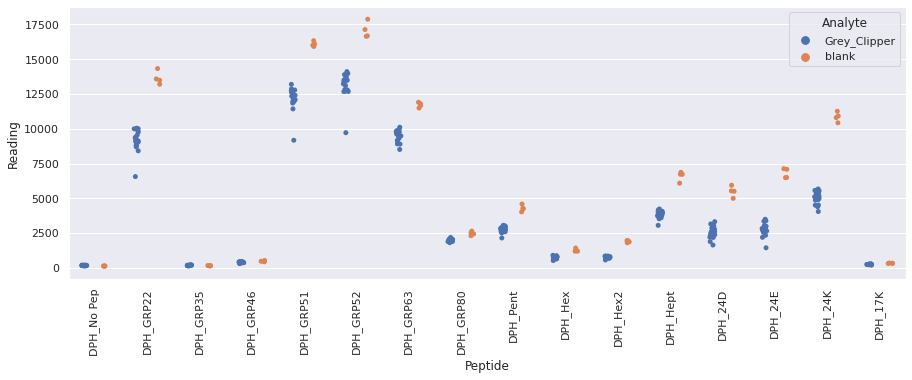

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Coop_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

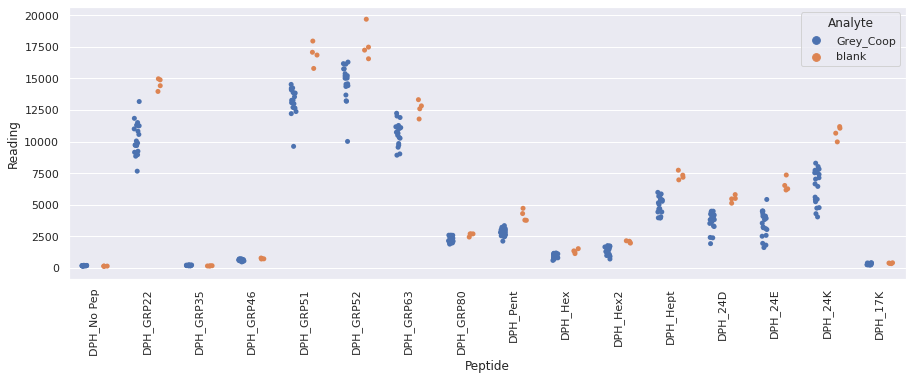

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Devonshire_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

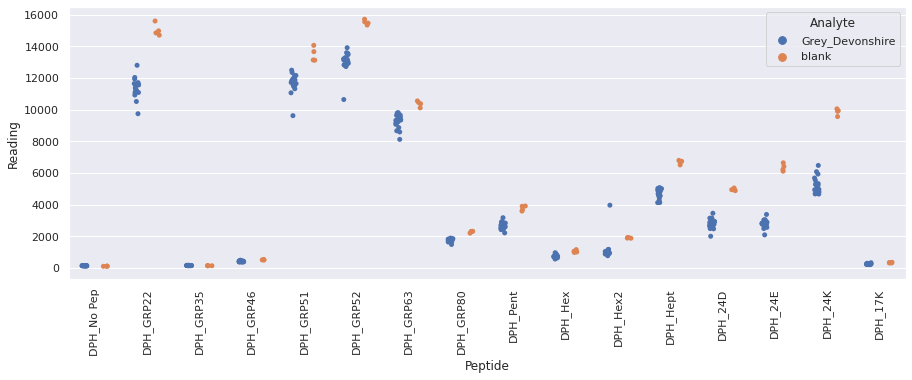

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Diplomat_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

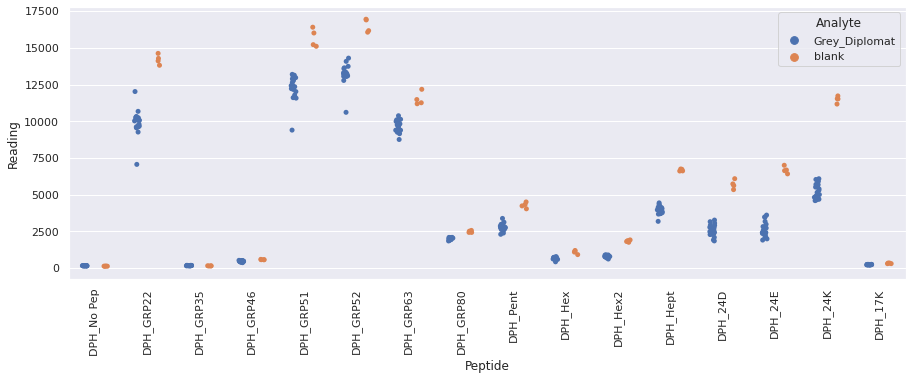

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Joes_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

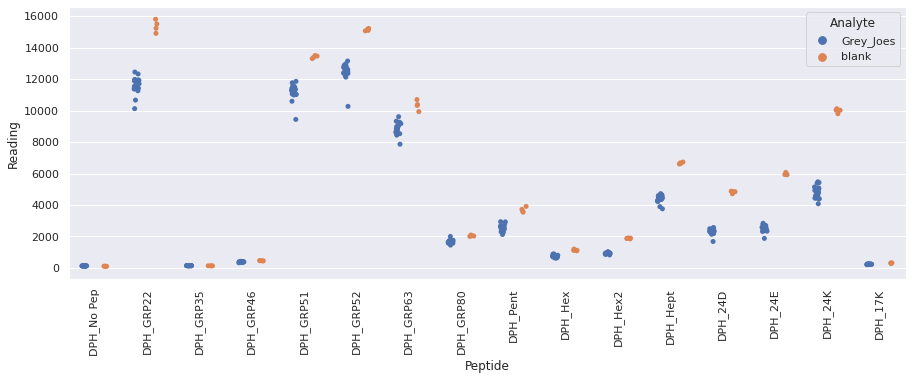

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Mands_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

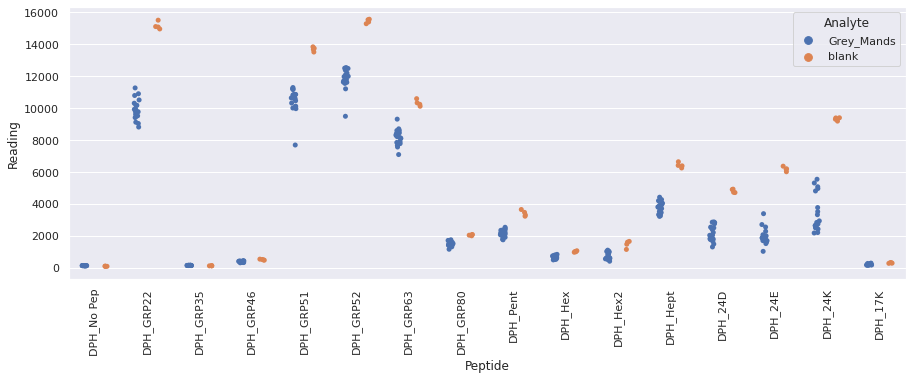

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Pukka_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

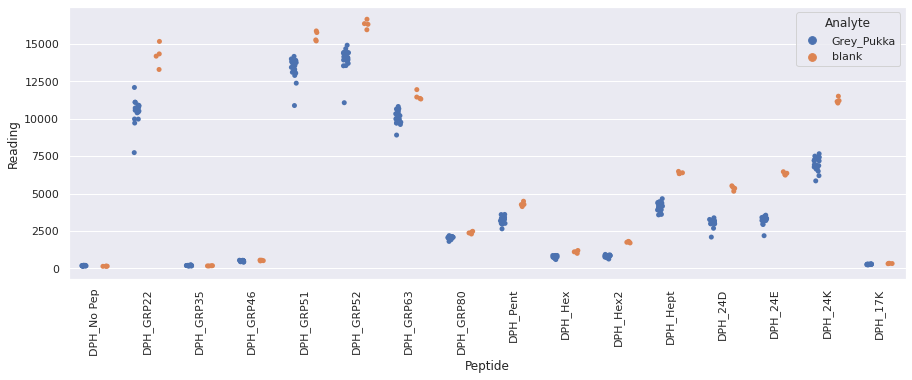

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Tesco_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

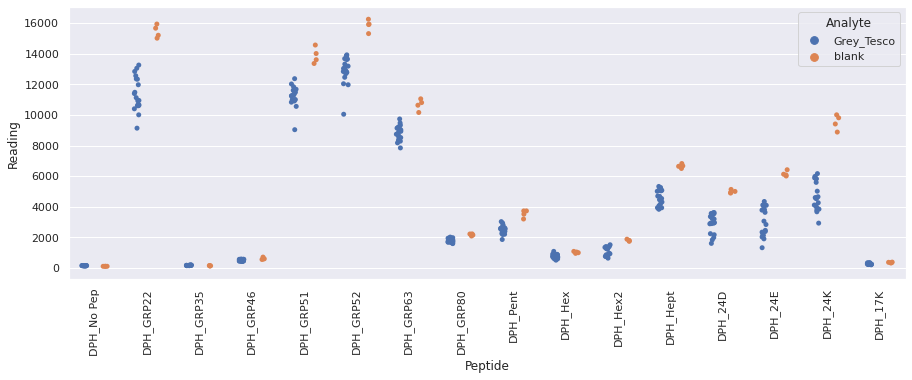

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Twinings_repeat_1.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_1 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

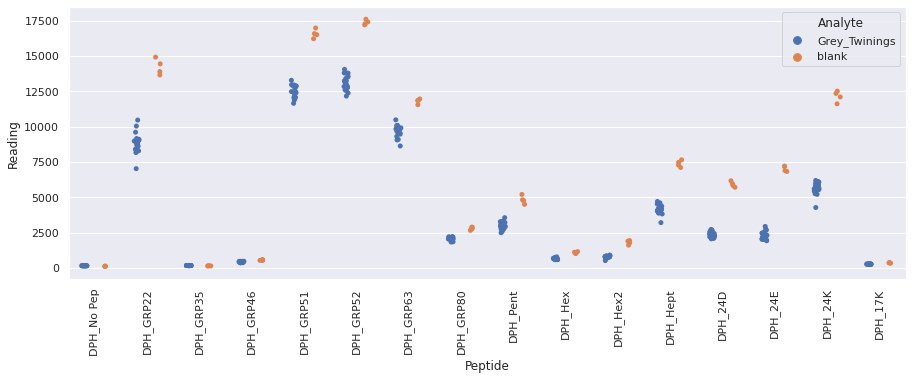

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

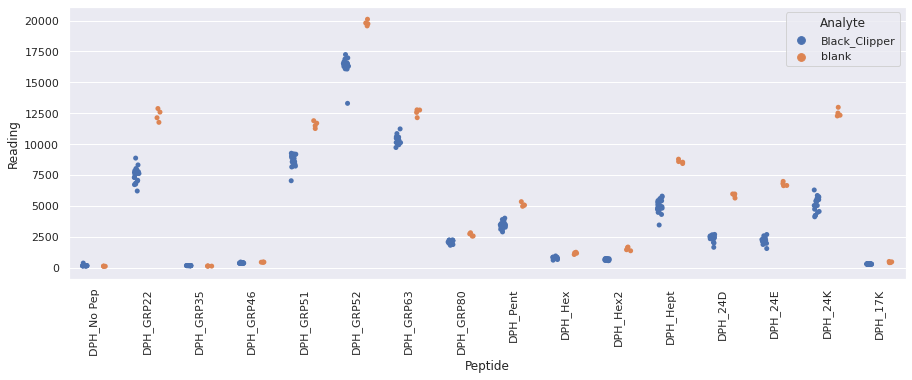

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Diplomat_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

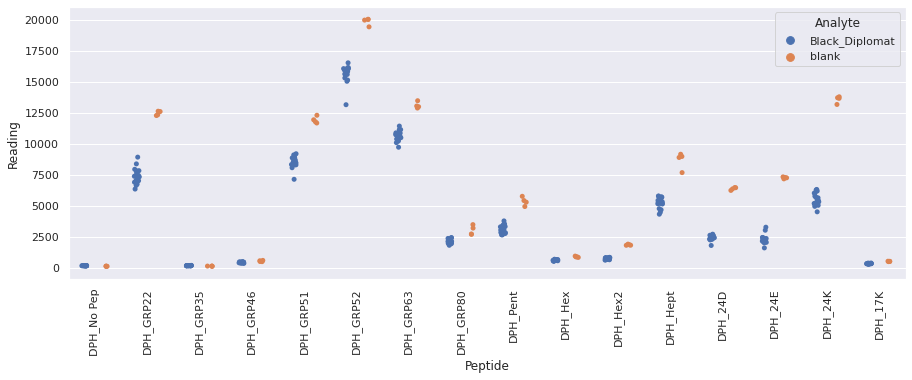

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Dragonfly_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

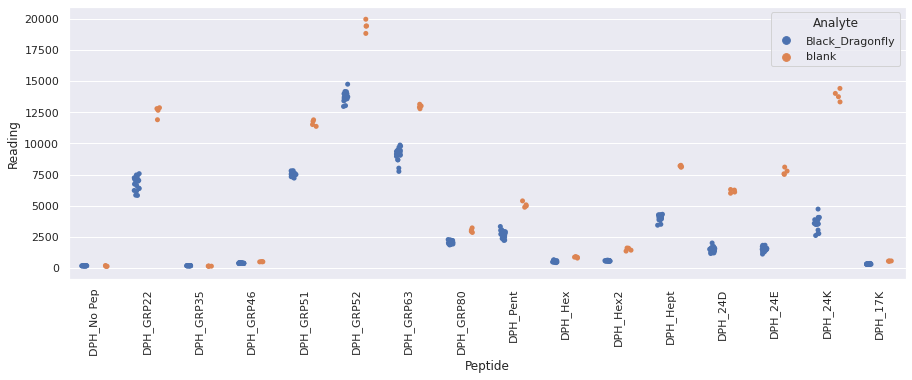

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pgtips_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

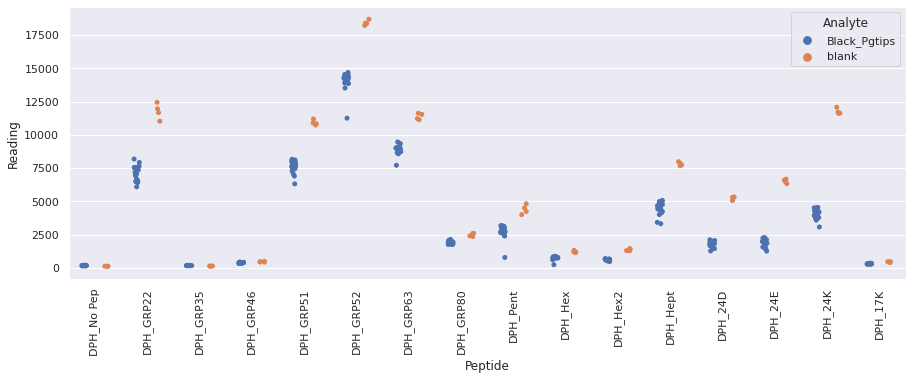

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pukka_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

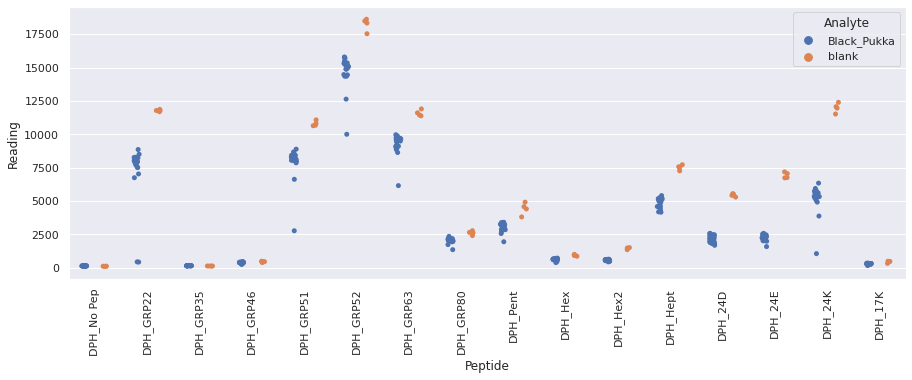

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Sainsburysgold_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

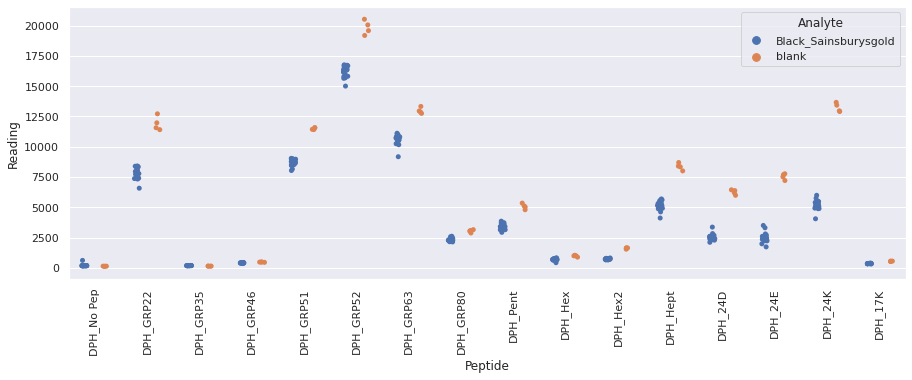

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tesco_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

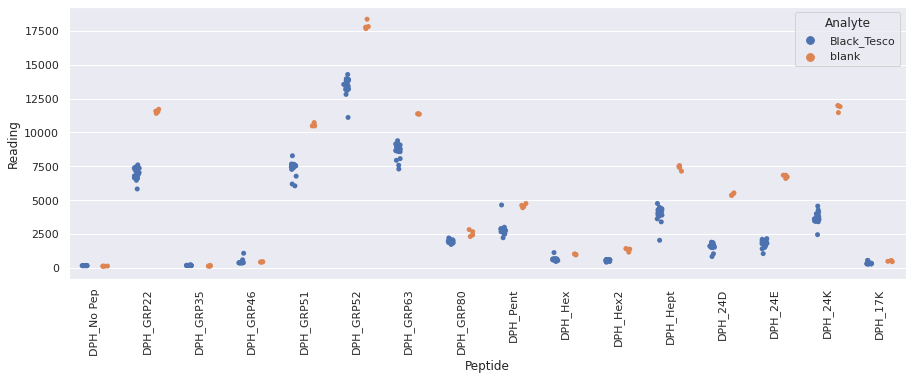

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tetley_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

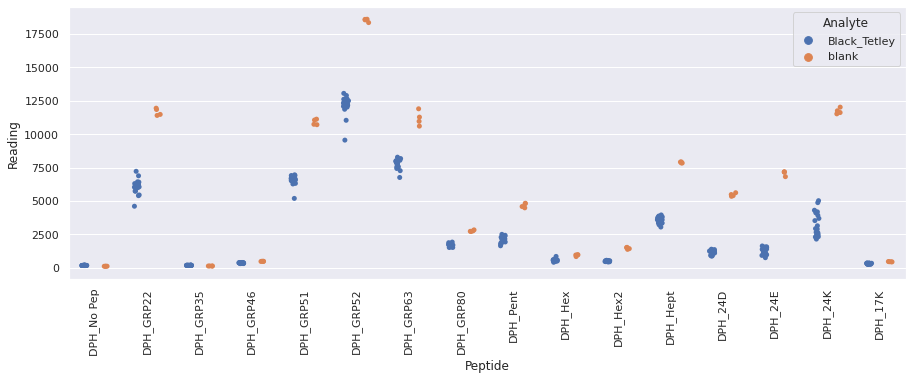

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Twinings_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

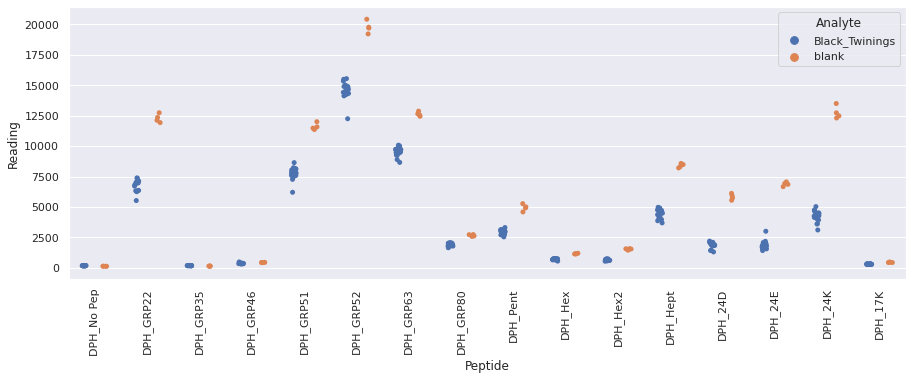

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Yorkshire_repeat_2.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

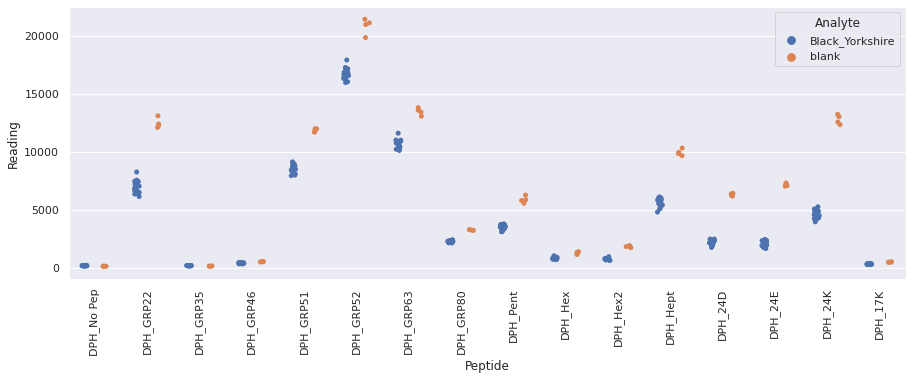

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Clipper_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

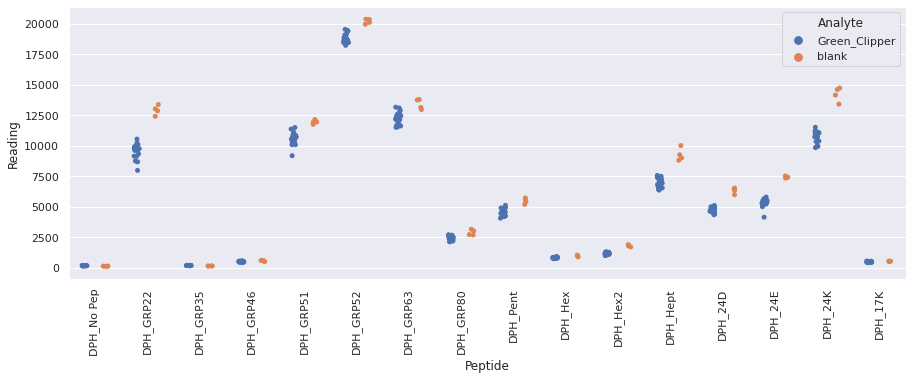

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Diplomat_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

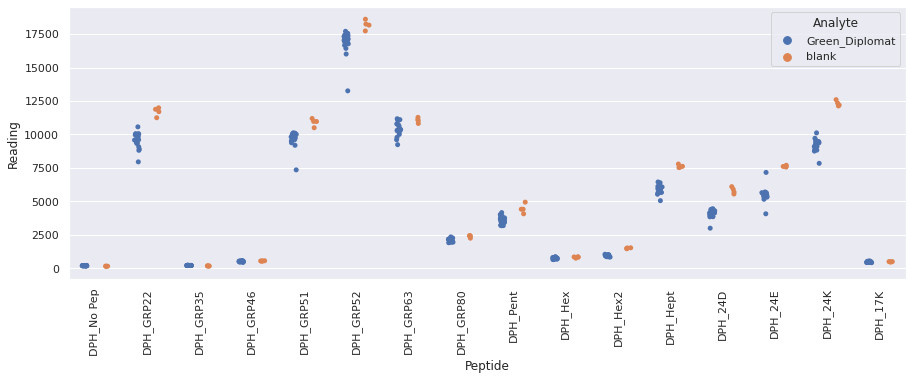

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Doubledragon_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

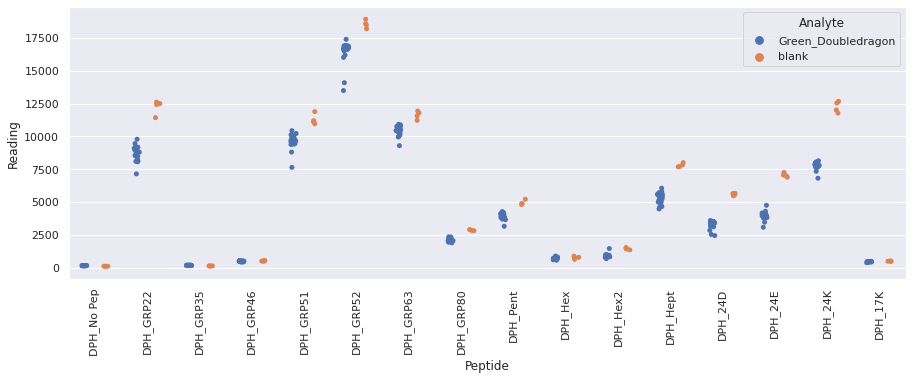

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Dragonfly_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

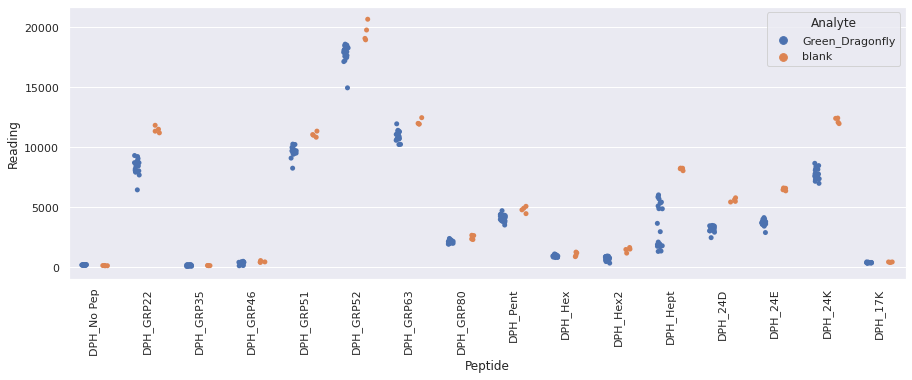

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Handb_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

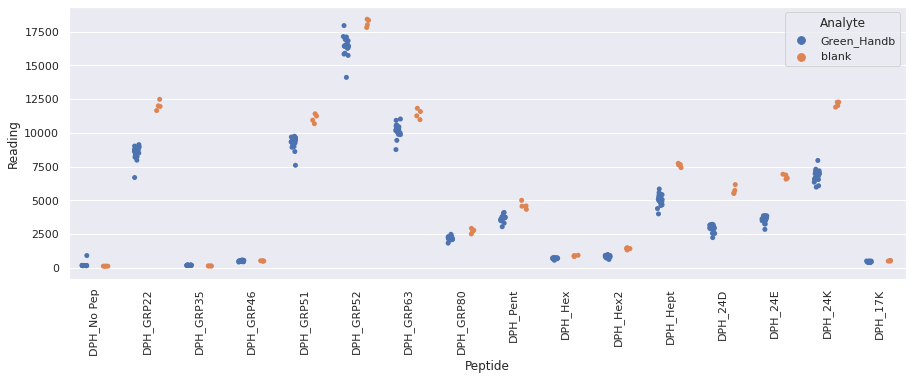

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Joes_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

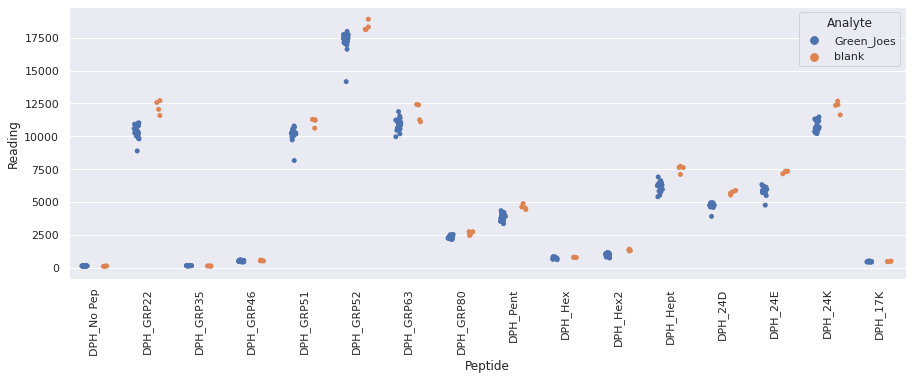

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Qi_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

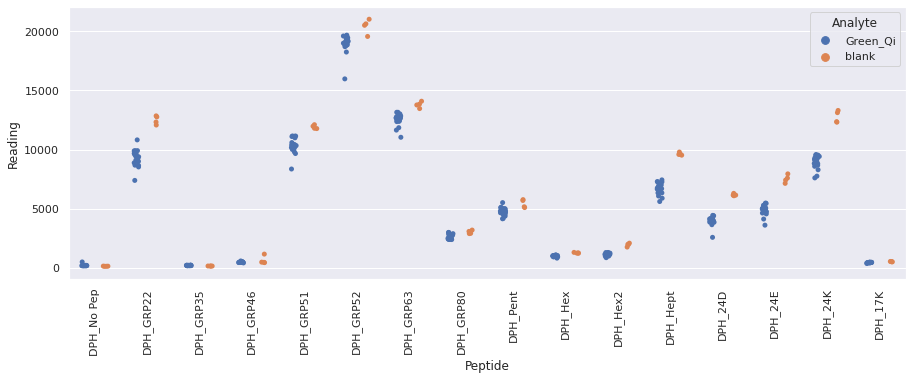

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Sainsburys_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

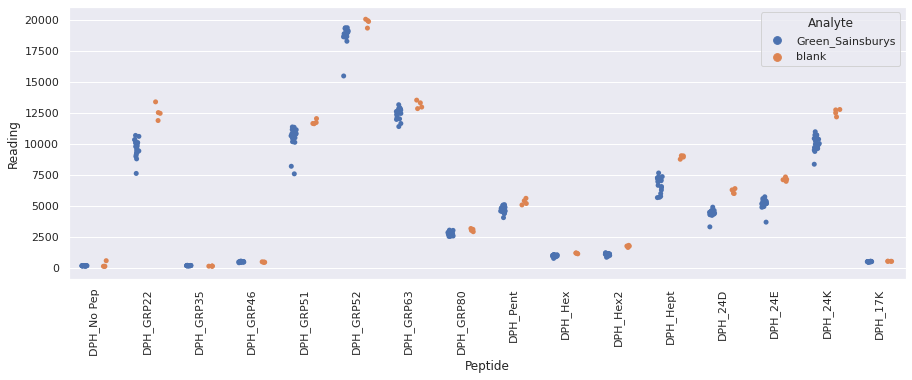

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Tetley_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

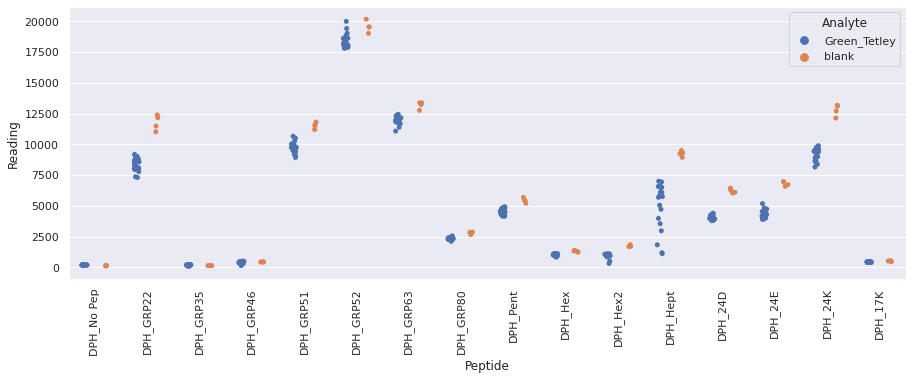

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Twinings_repeat_2.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

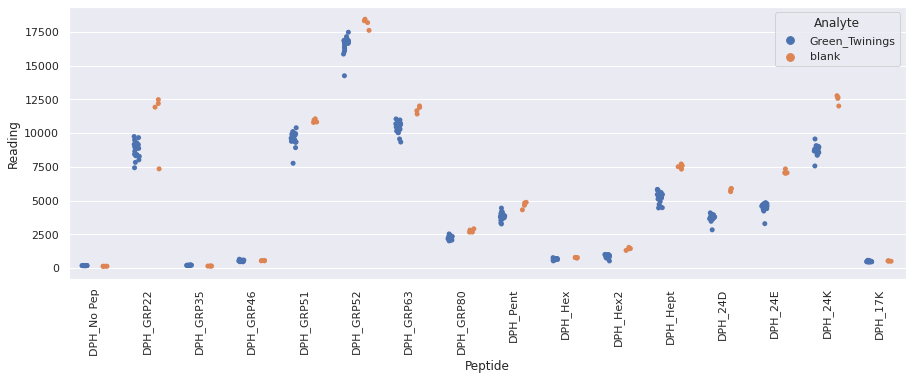

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Asda_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

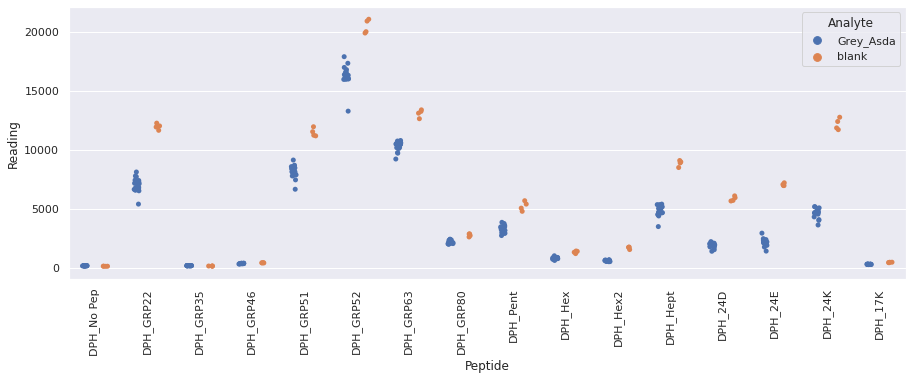

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Clipper_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

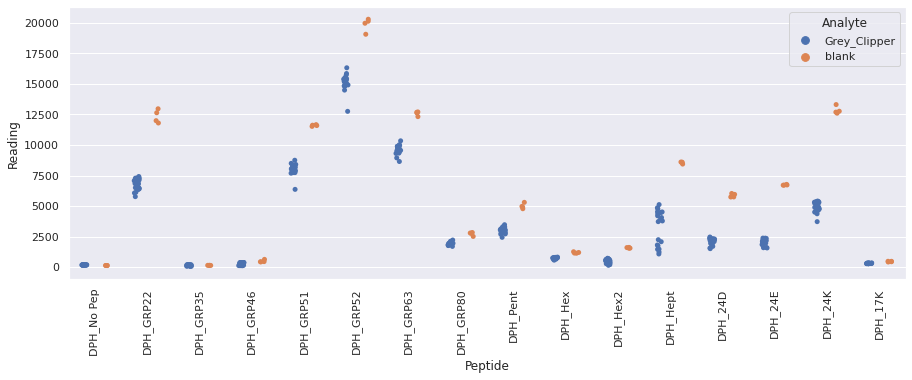

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Coop_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

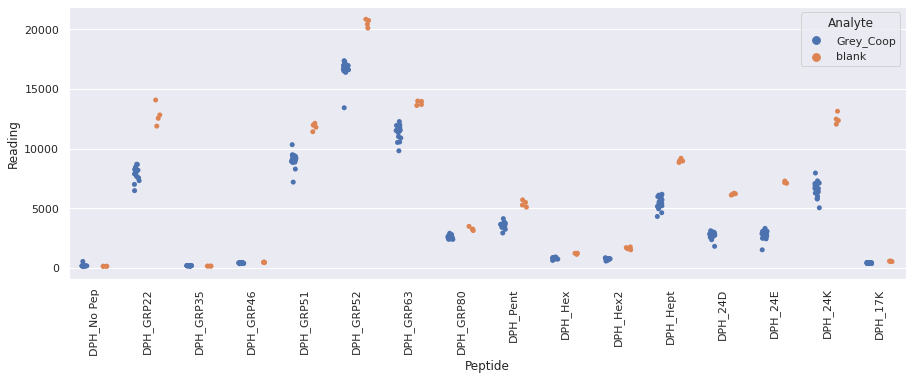

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Devonshire_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

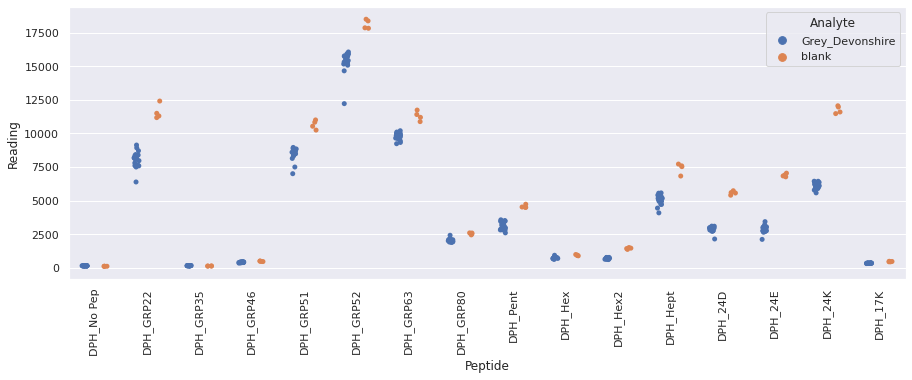

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Diplomat_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

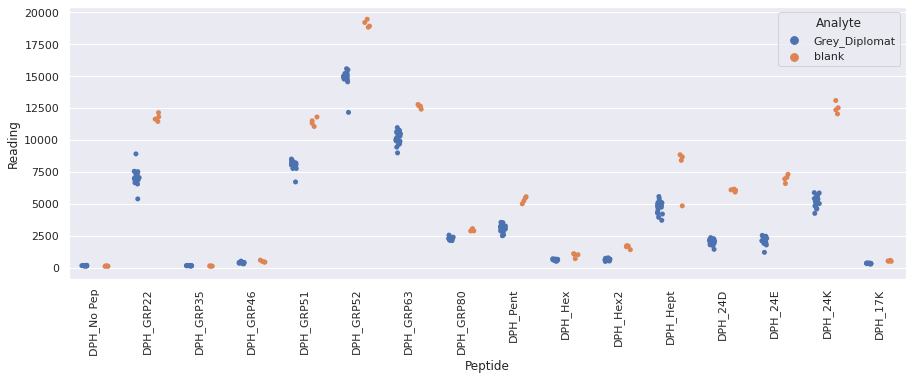

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Joes_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

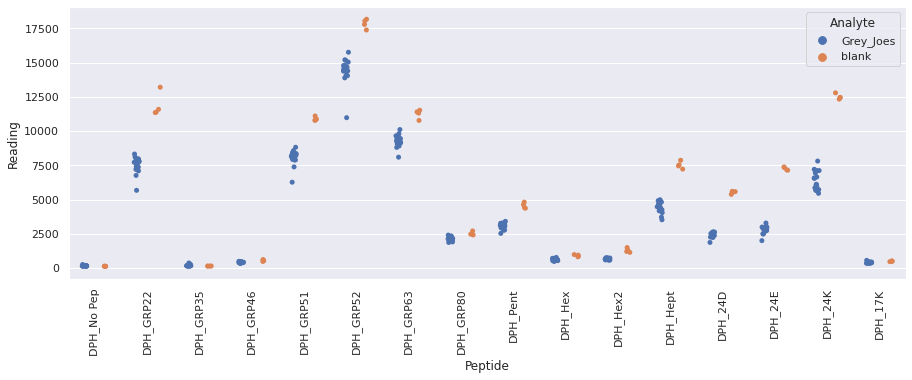

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Mands_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

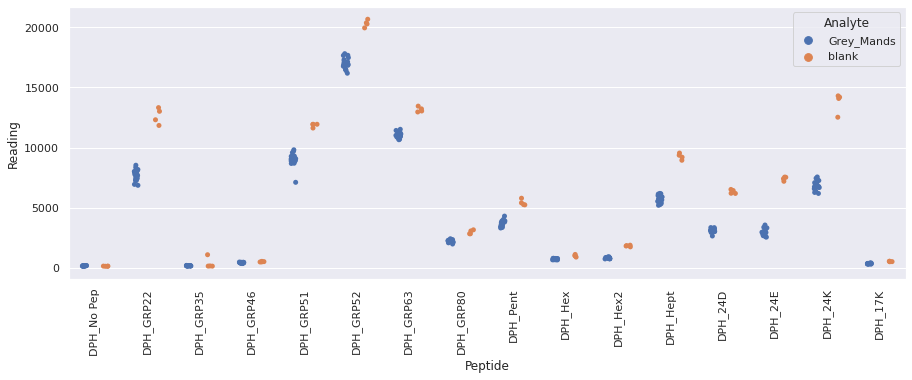

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Pukka_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

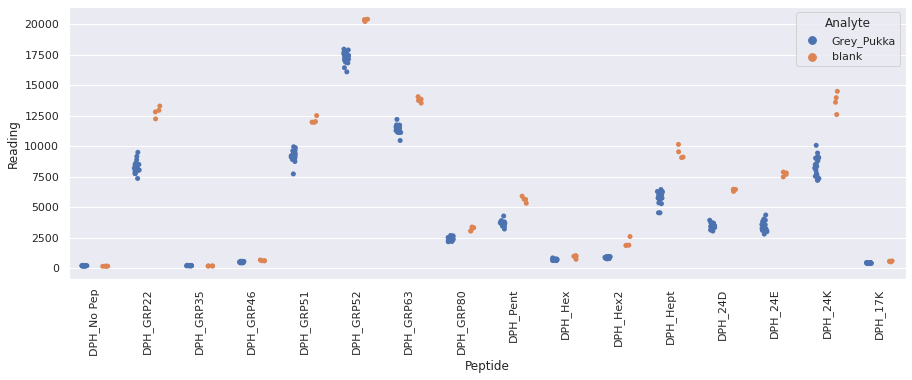

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Tesco_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

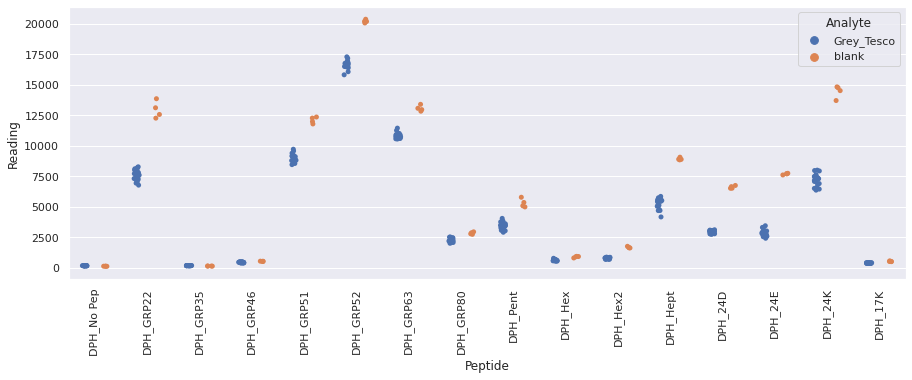

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Twinings_repeat_2.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_2 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

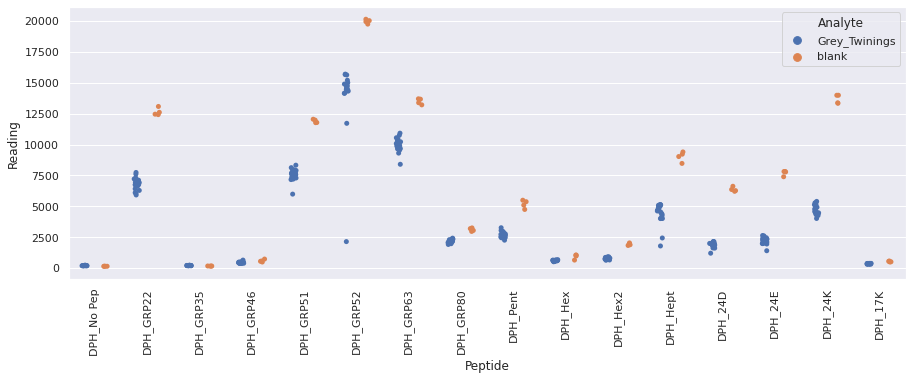

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

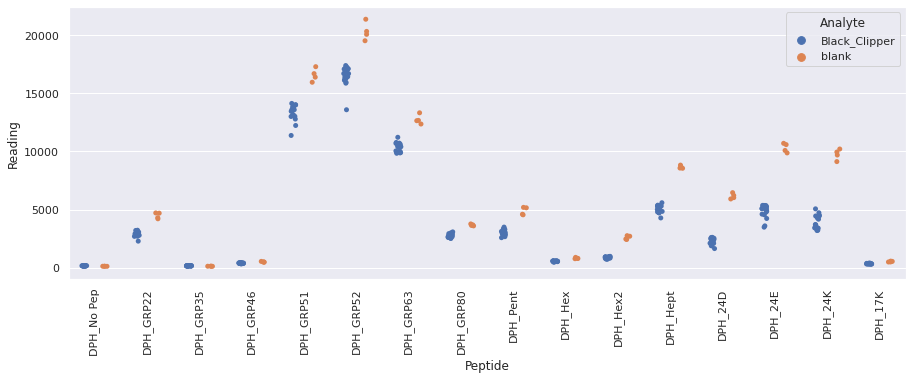

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Diplomat_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

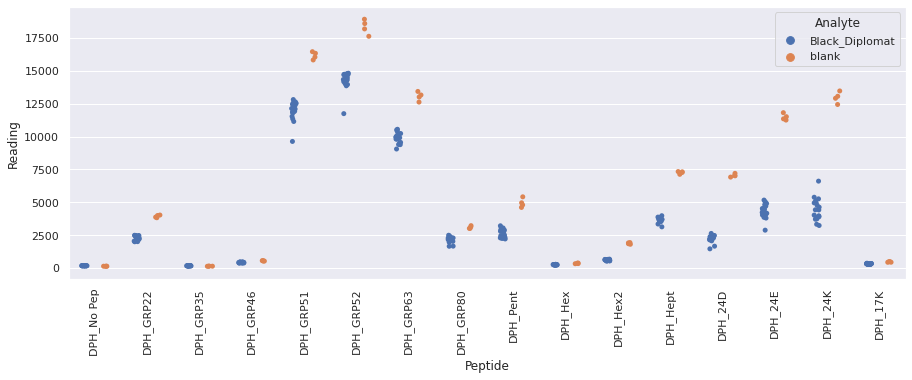

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Dragonfly_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

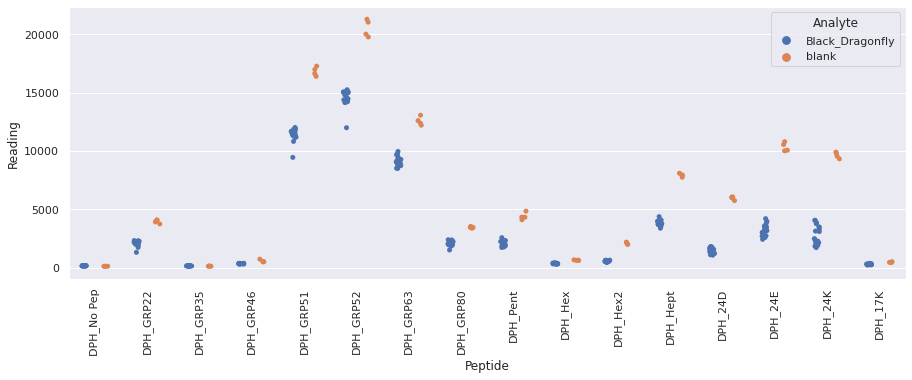

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pgtips_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

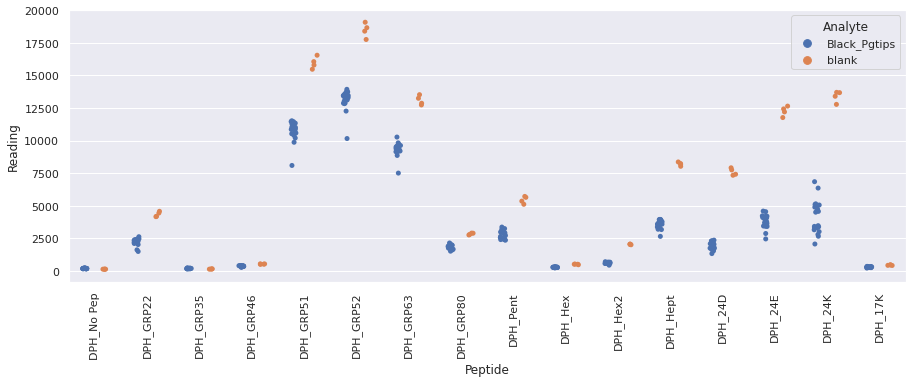

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pukka_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

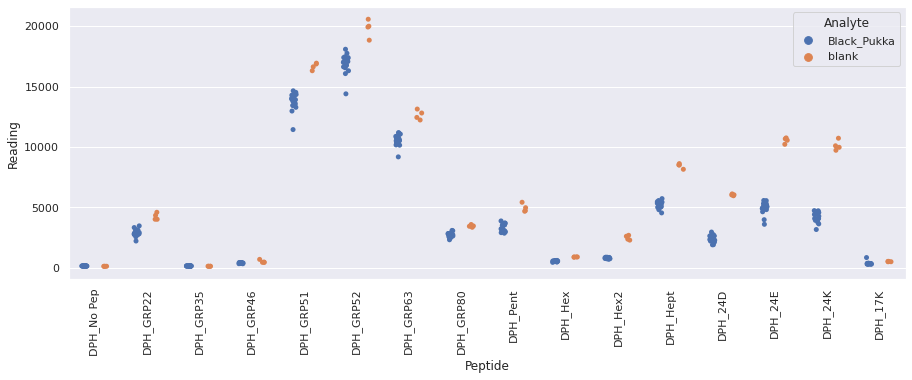

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Sainsburysgold_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

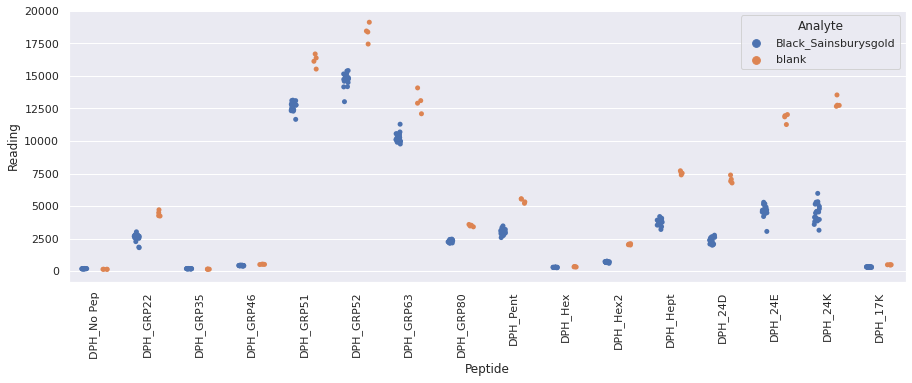

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tesco_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

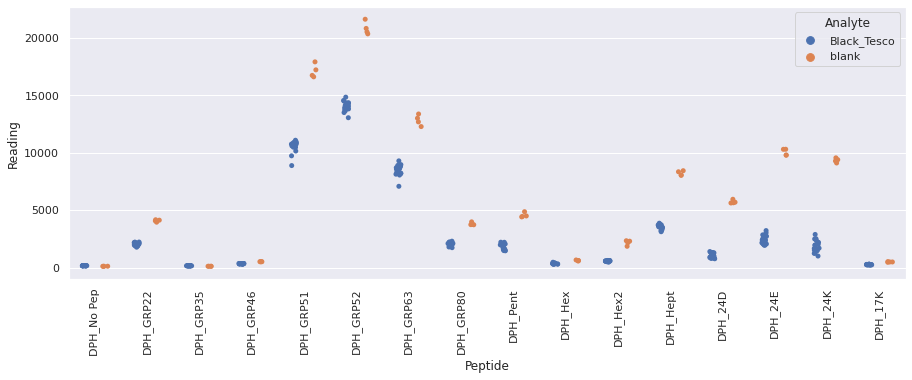

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tetley_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

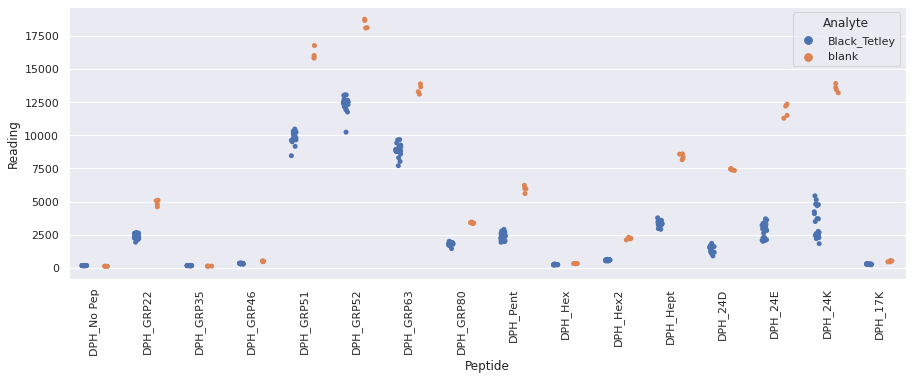

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Twinings_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

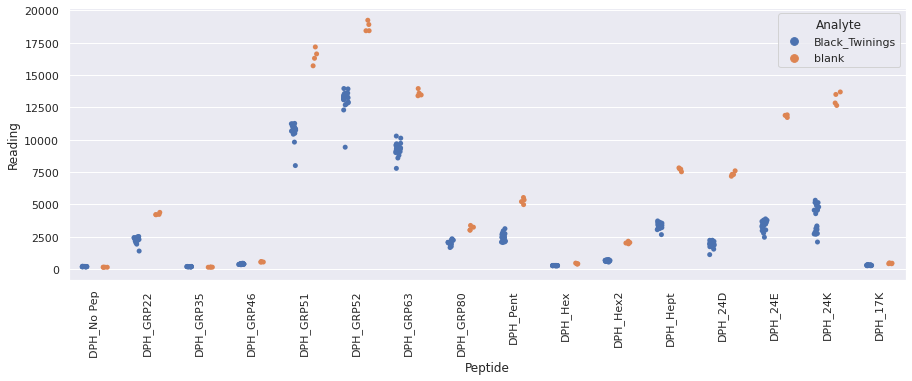

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Yorkshire_repeat_3.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

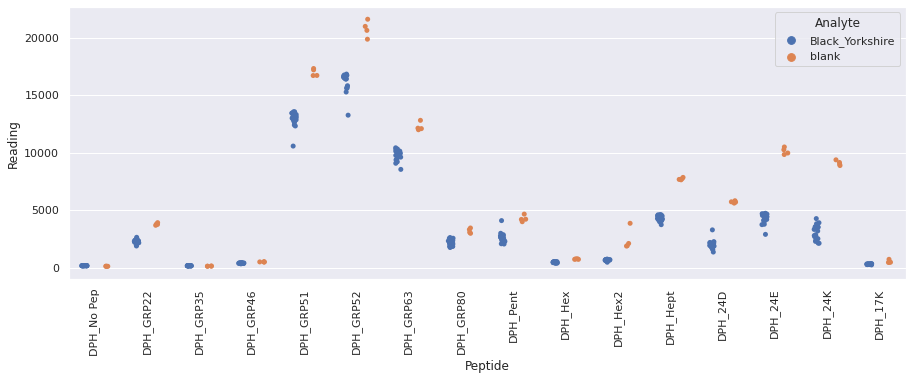

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Clipper_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

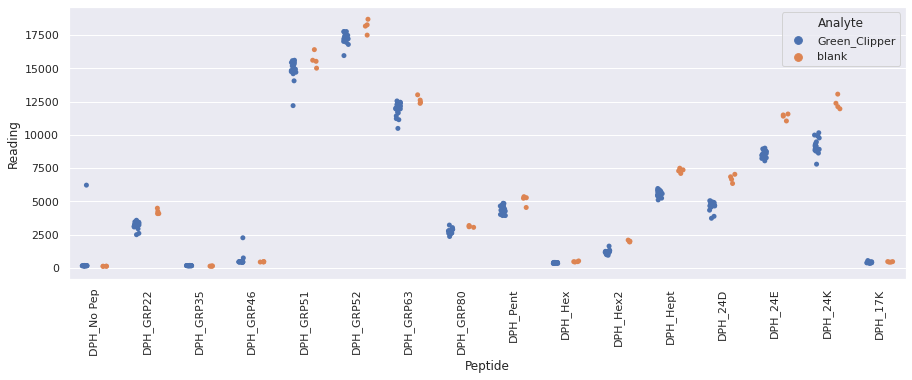

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Diplomat_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

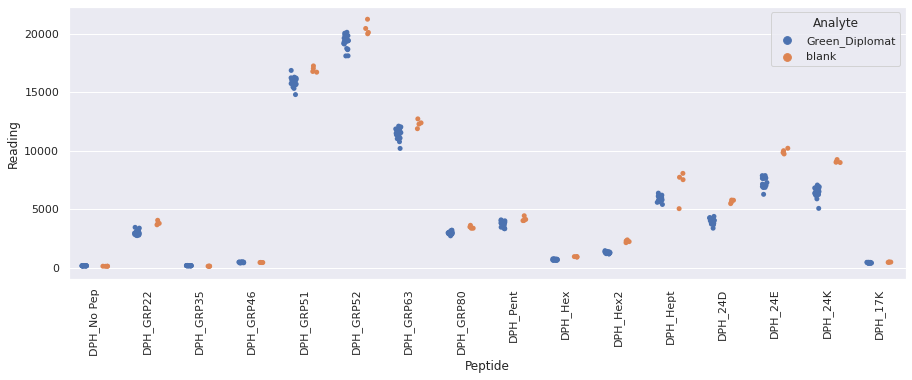

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Doubledragon_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

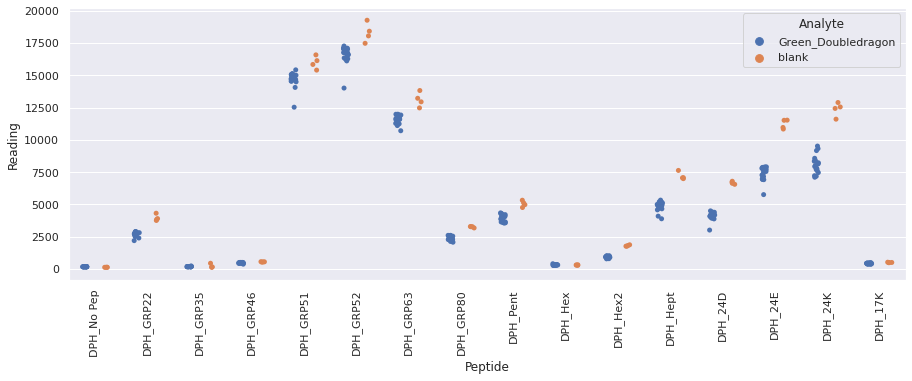

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Dragonfly_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

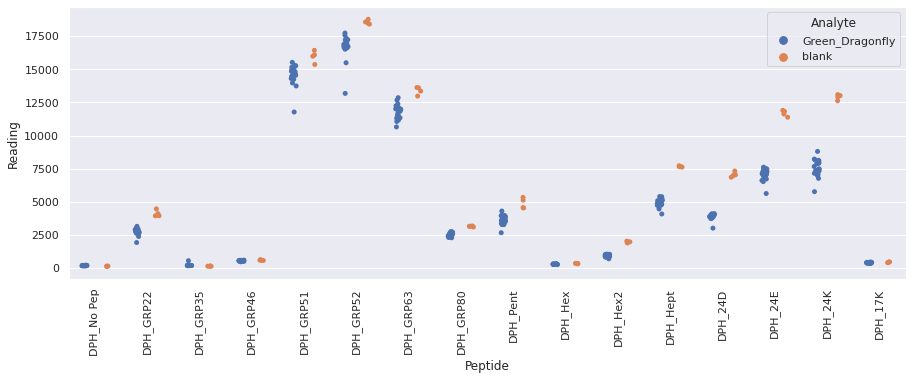

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Handb_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

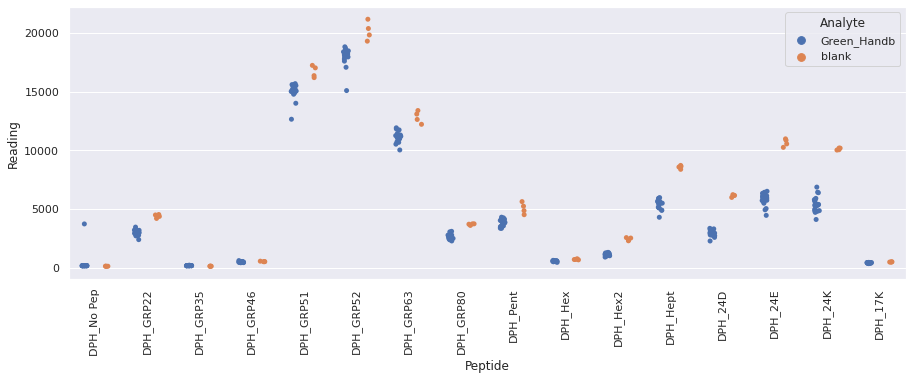

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Joes_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

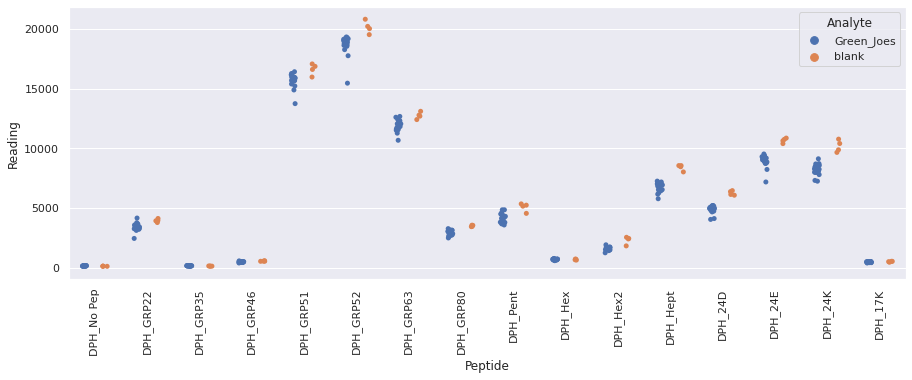

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Qi_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

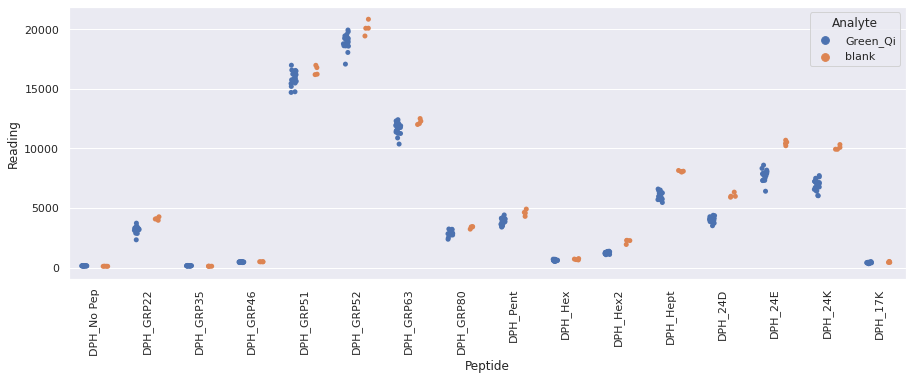

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Sainsburys_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

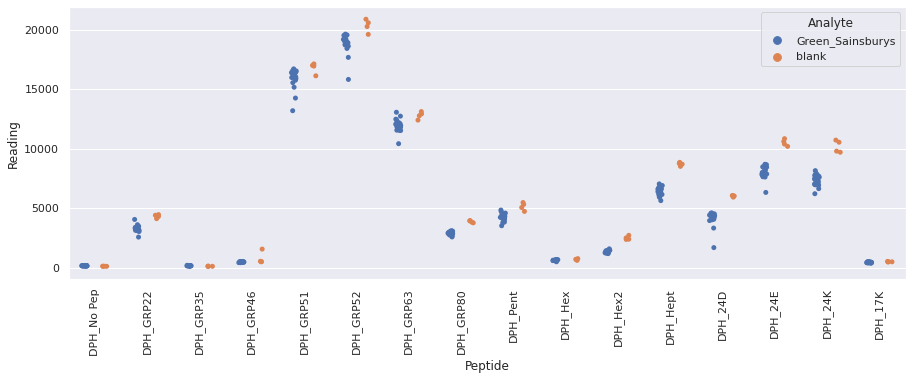

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Tetley_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

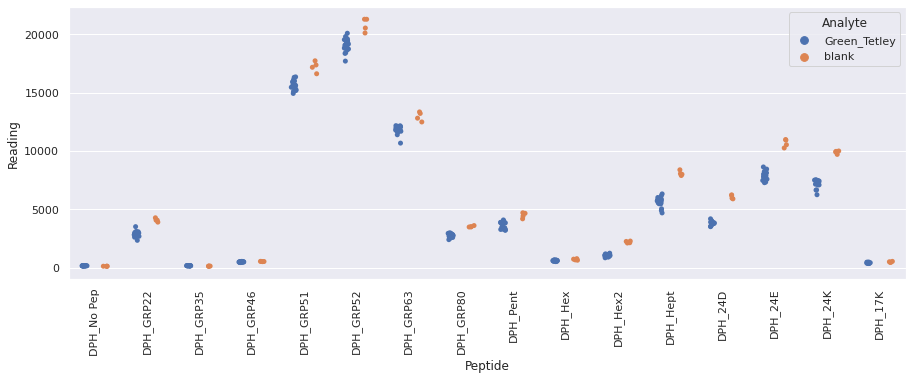

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Twinings_repeat_3.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

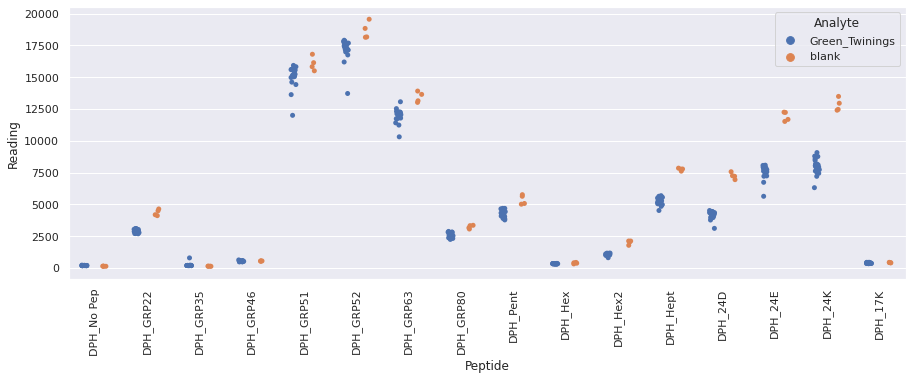

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Asda_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

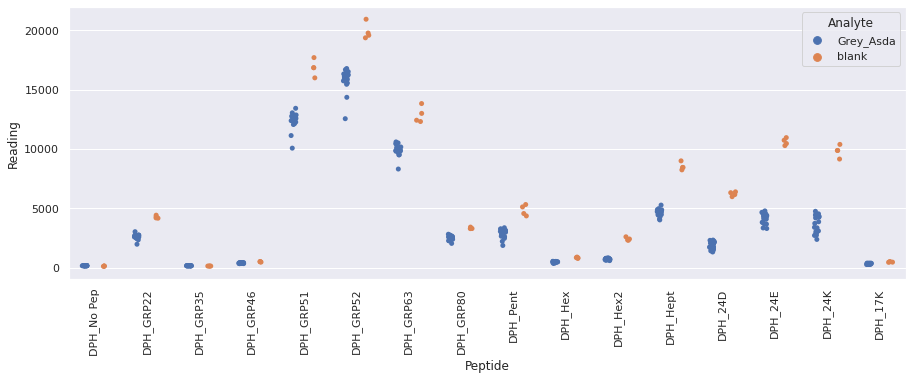

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Clipper_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

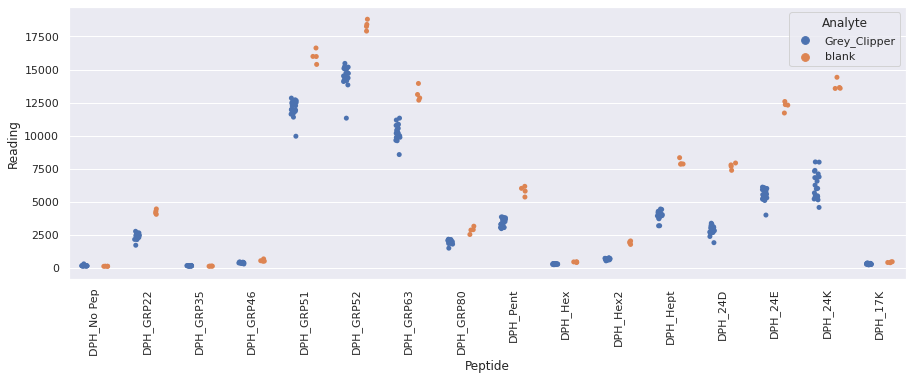

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Coop_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

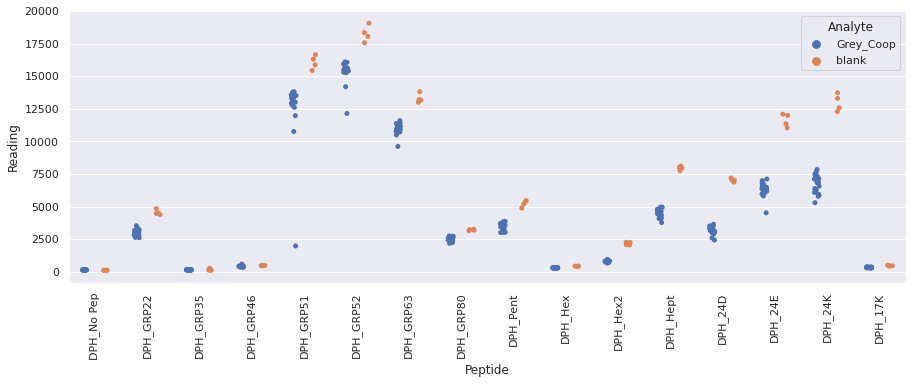

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Devonshire_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

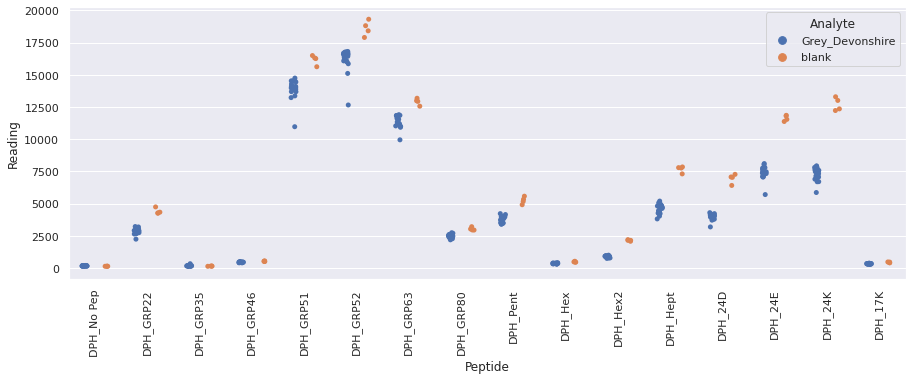

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Diplomat_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

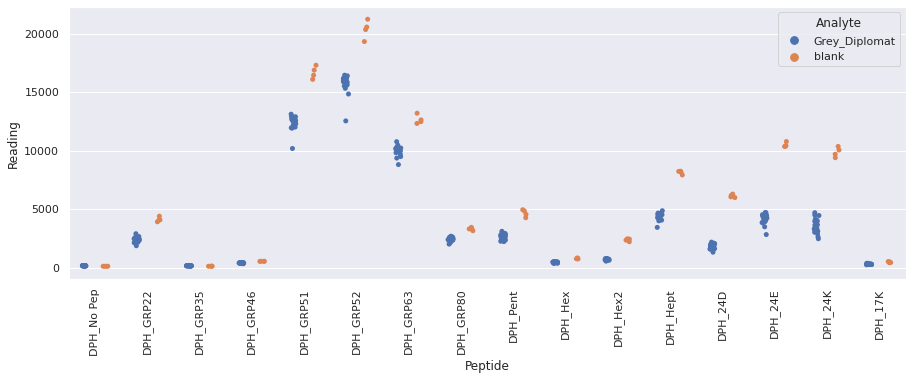

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Joes_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

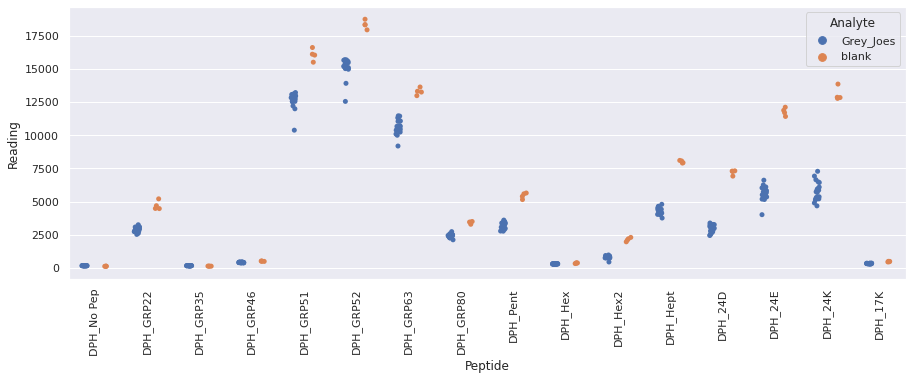

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Mands_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

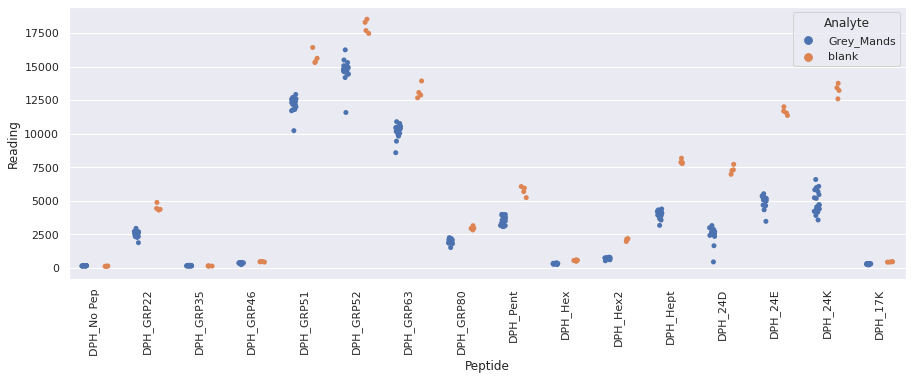

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Pukka_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

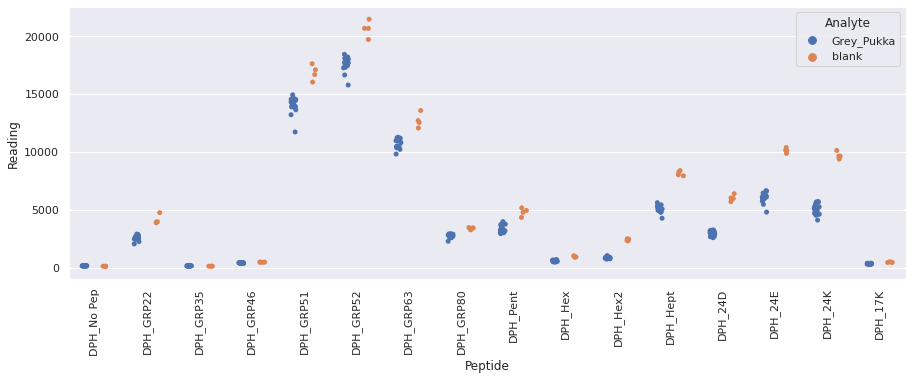

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Tesco_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

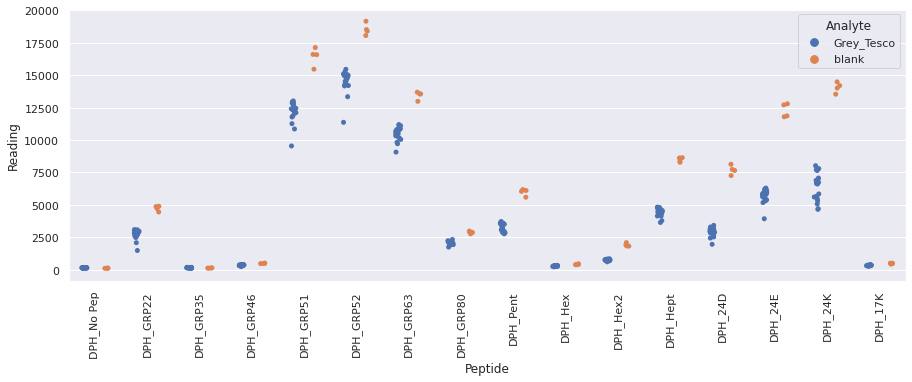

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Twinings_repeat_3.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_3 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

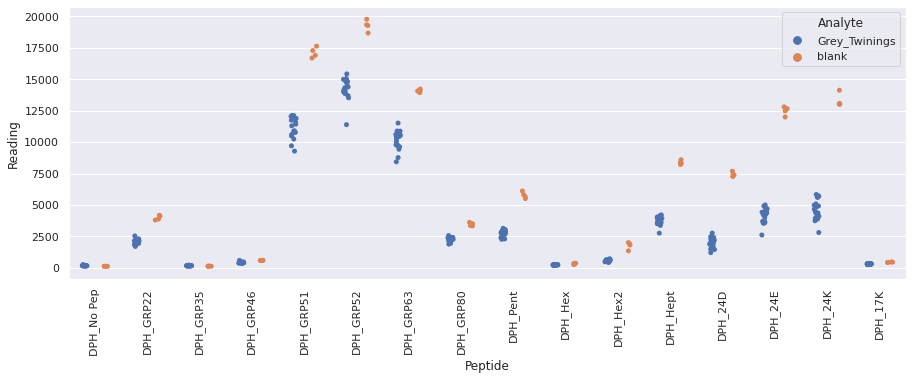

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

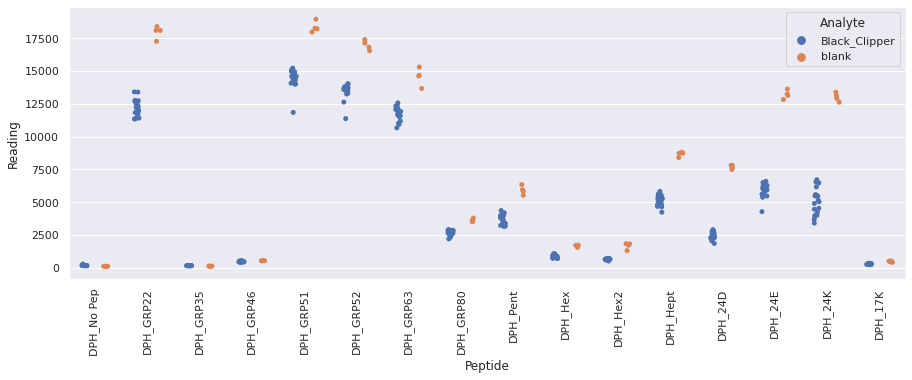

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Diplomat_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

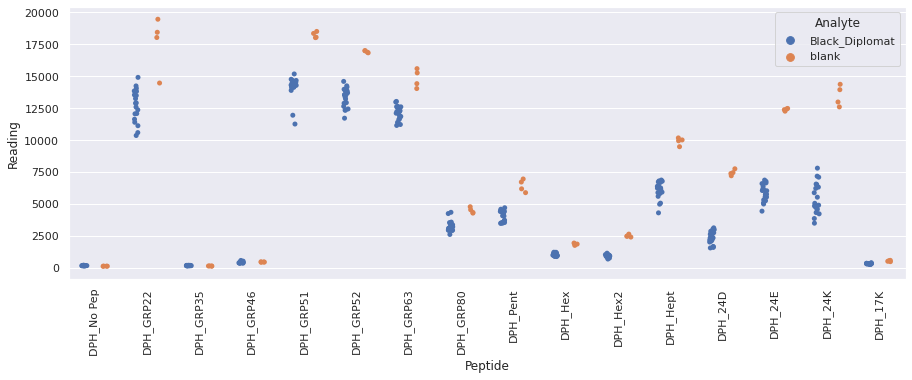

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Dragonfly_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

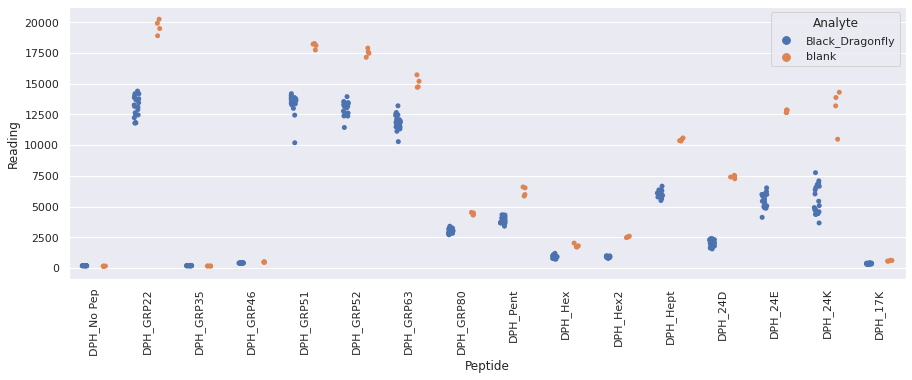

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pgtips_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

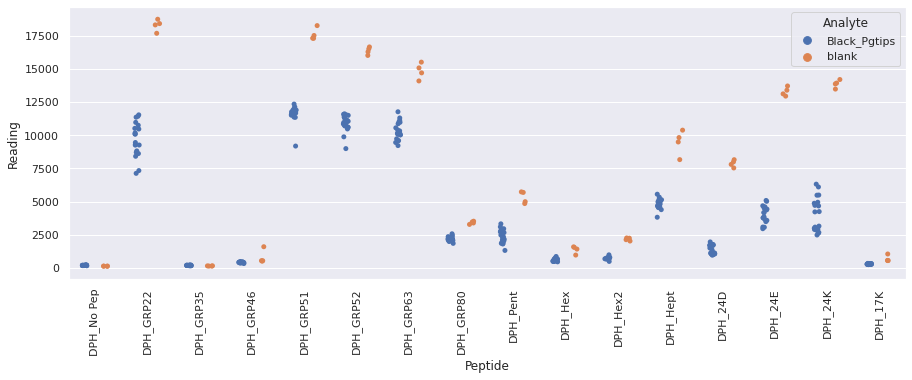

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pukka_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

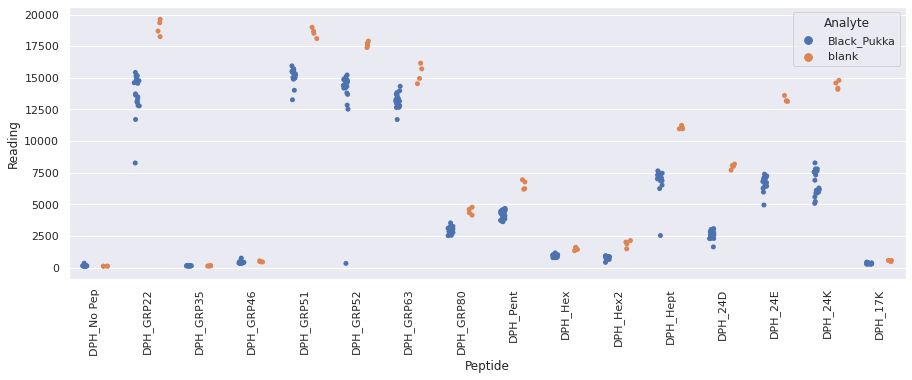

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Sainsburysgold_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

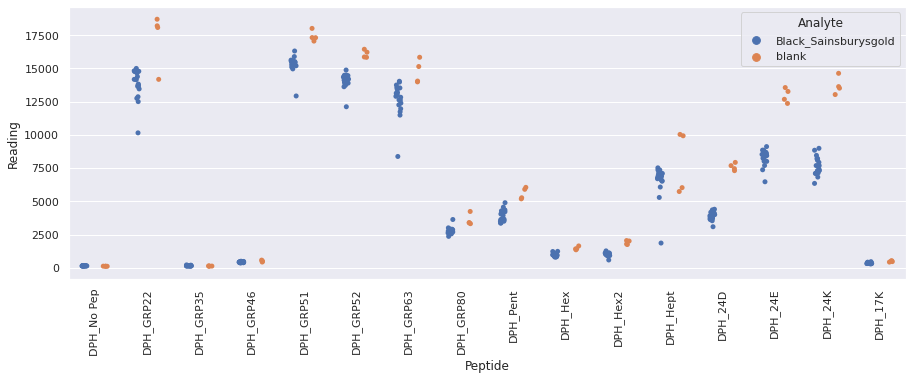

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tesco_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

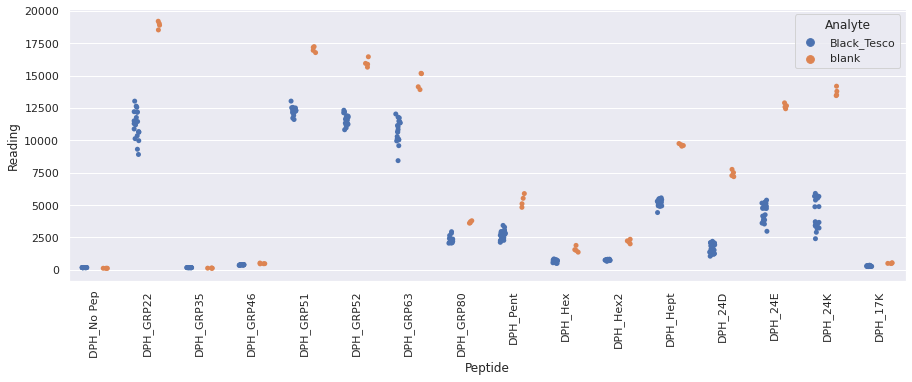

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tetley_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

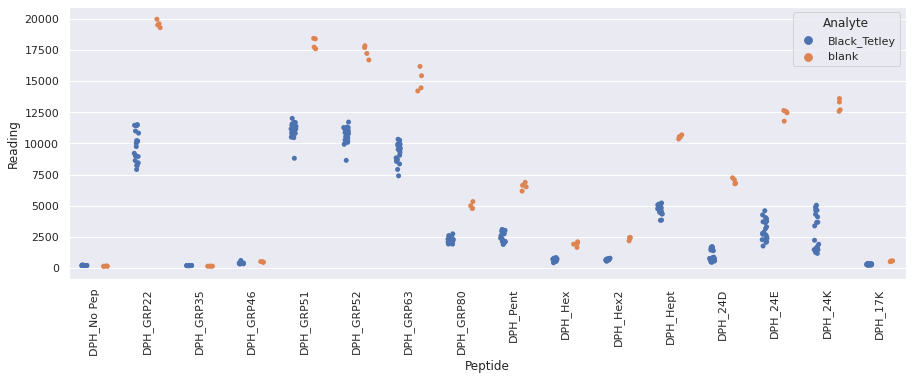

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Twinings_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

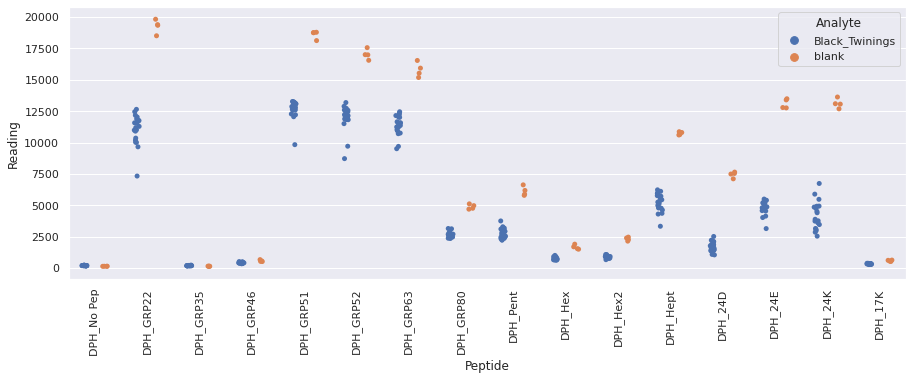

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Yorkshire_repeat_4.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

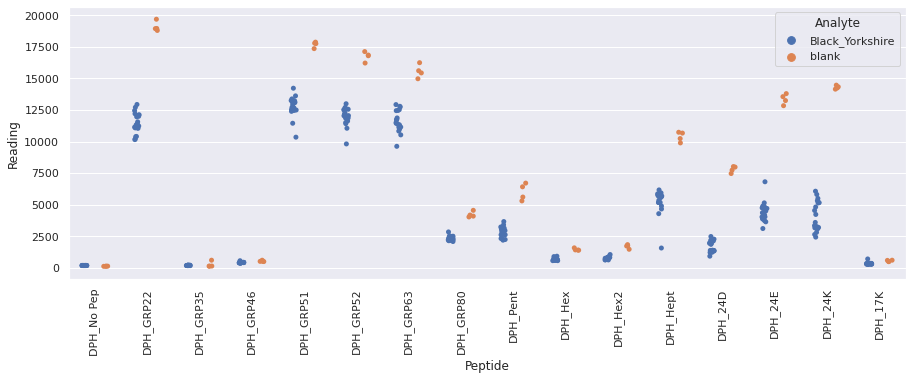

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Clipper_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

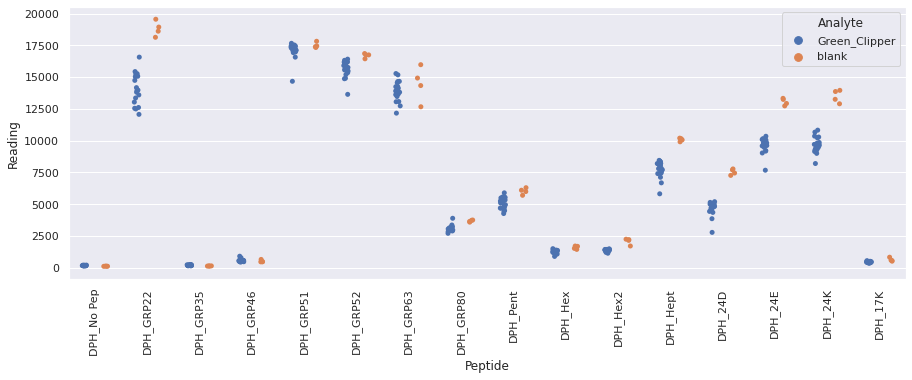

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Diplomat_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

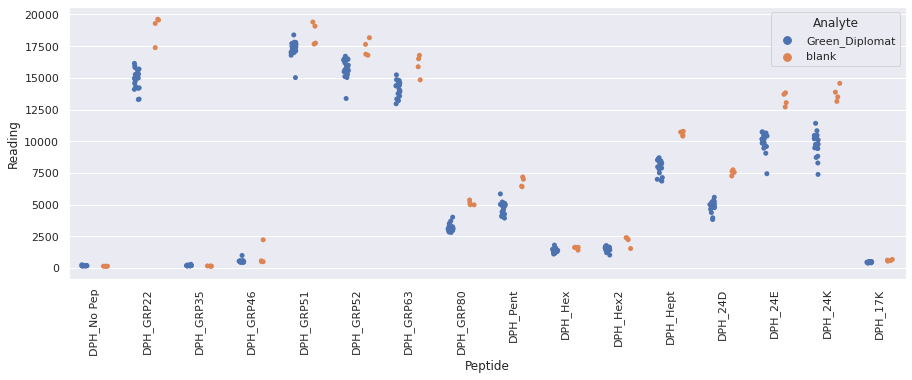

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Doubledragon_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

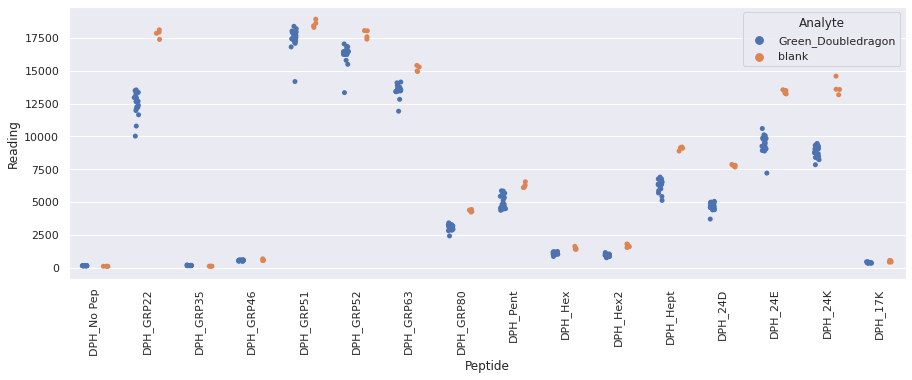

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Dragonfly_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

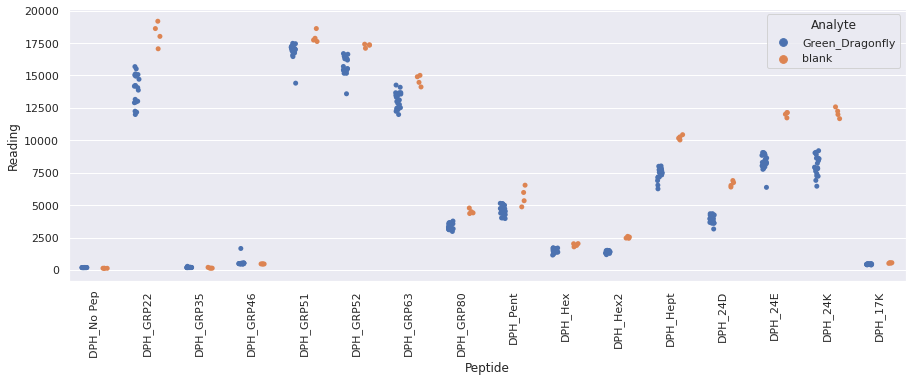

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Handb_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

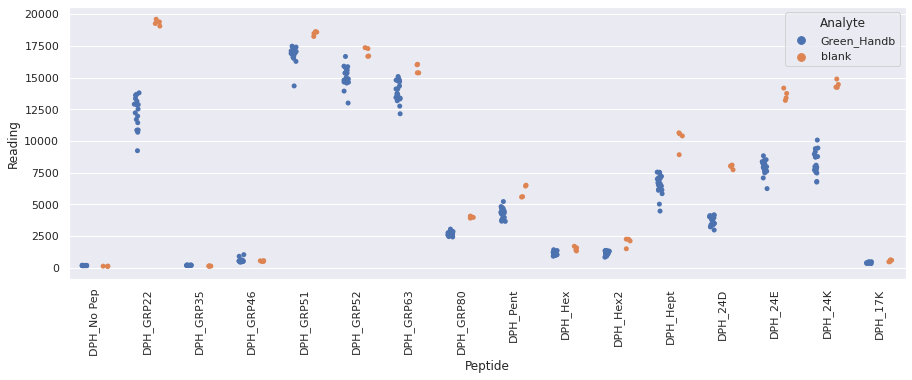

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Joes_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

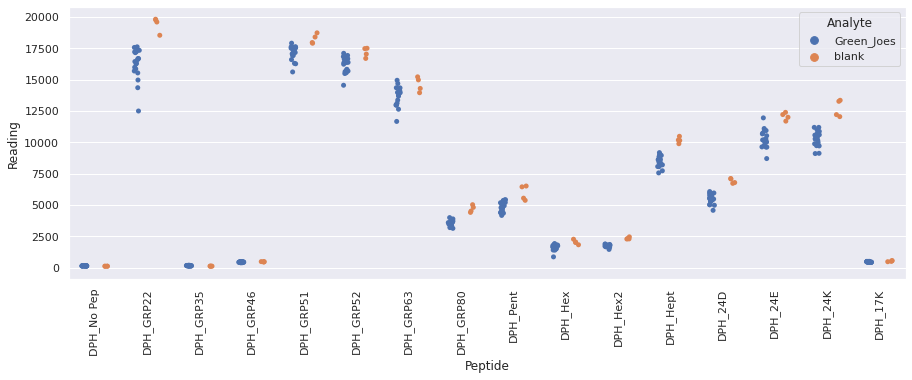

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Qi_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

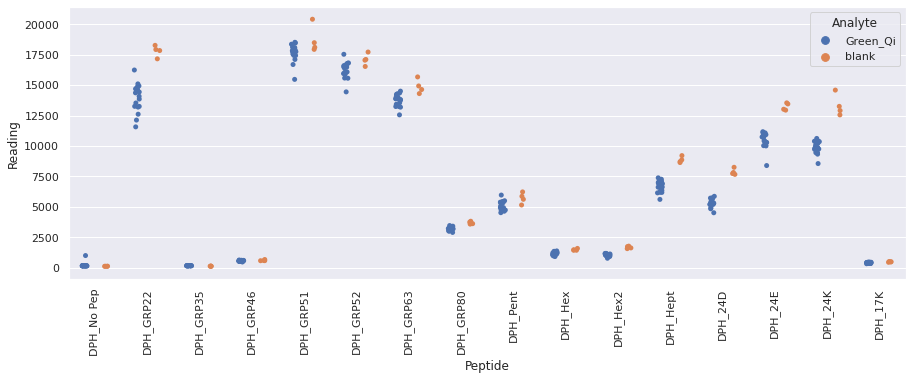

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Sainsburys_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

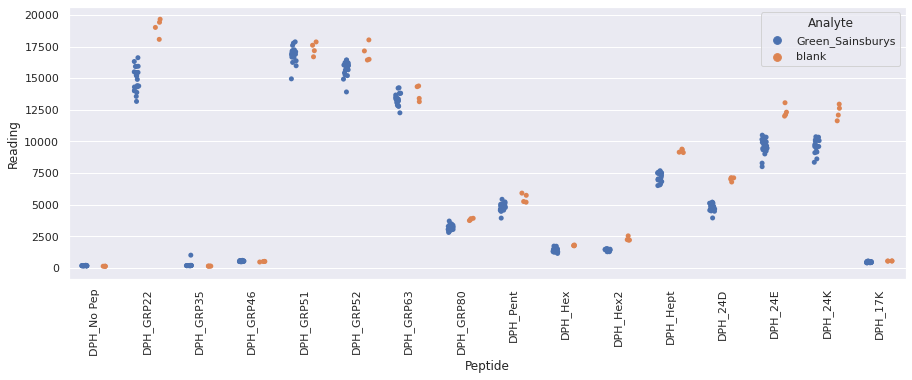

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Tetley_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

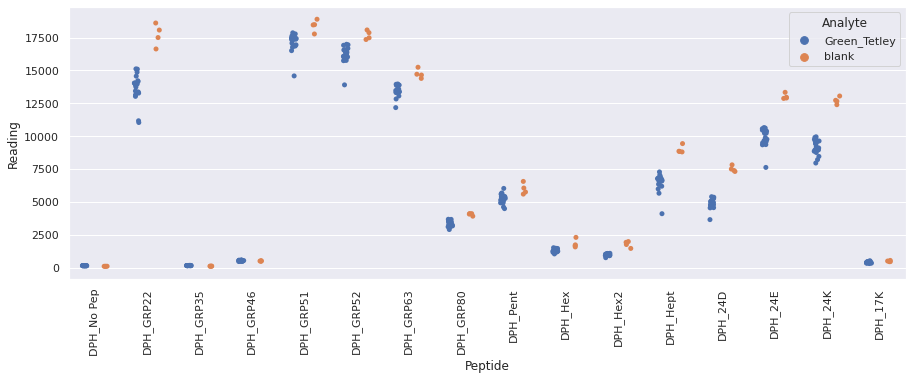

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Twinings_repeat_4.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

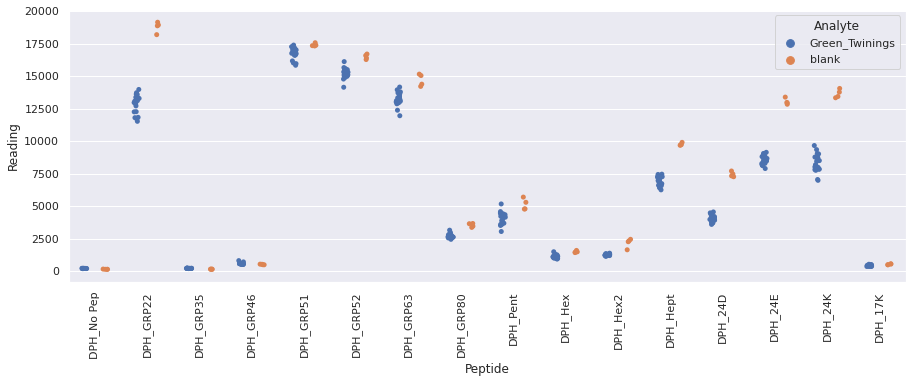

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Asda_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

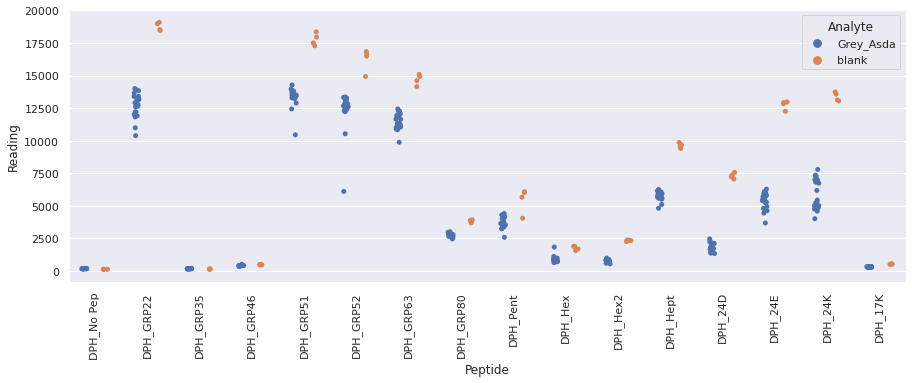

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Clipper_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

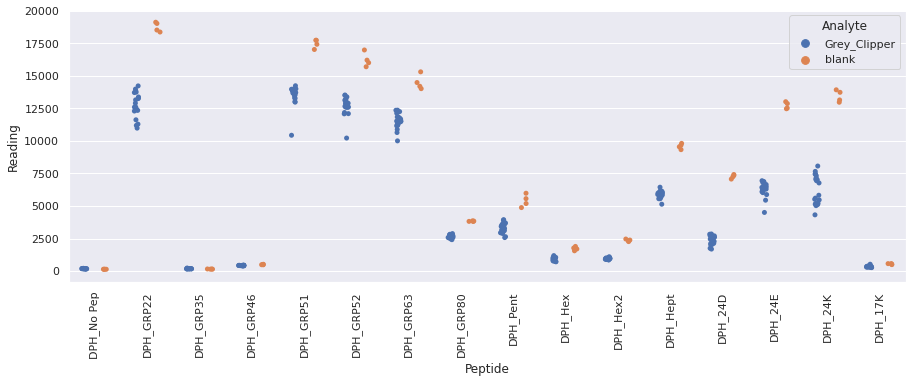

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Coop_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

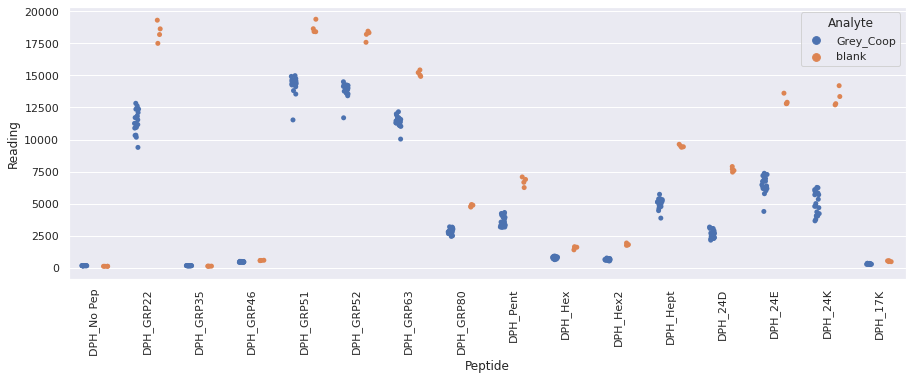

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Devonshire_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

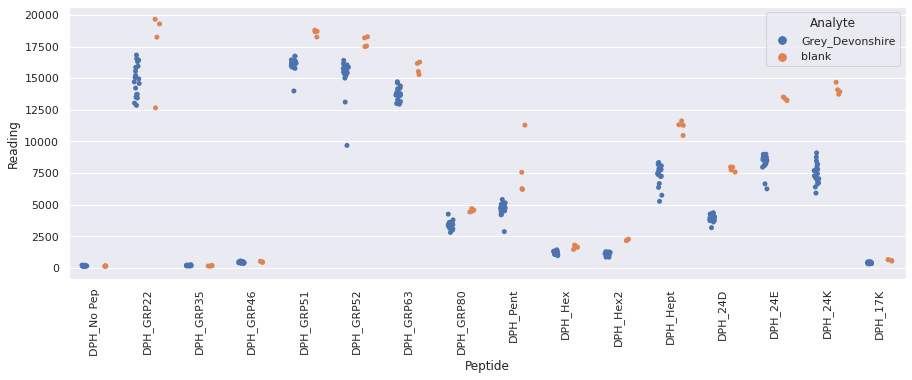

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Diplomat_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

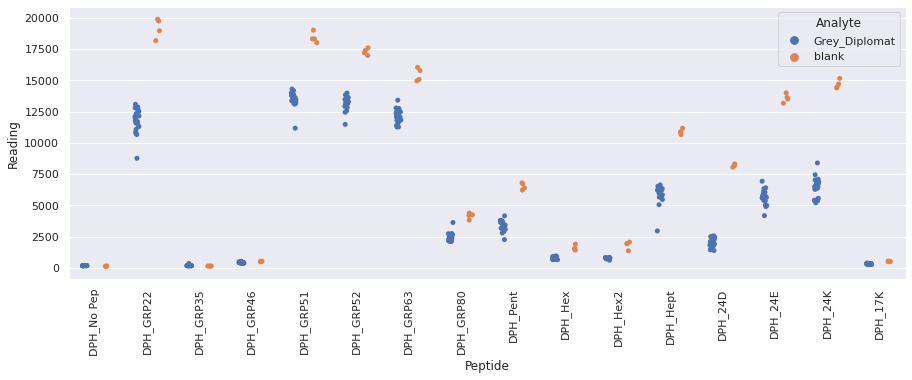

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Joes_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

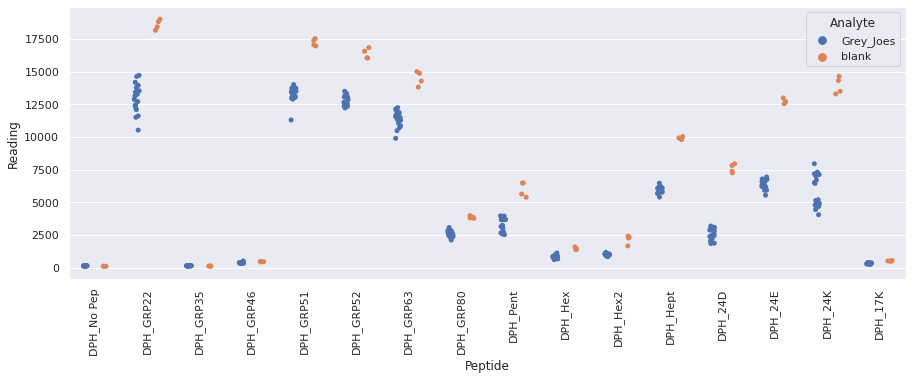

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Mands_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

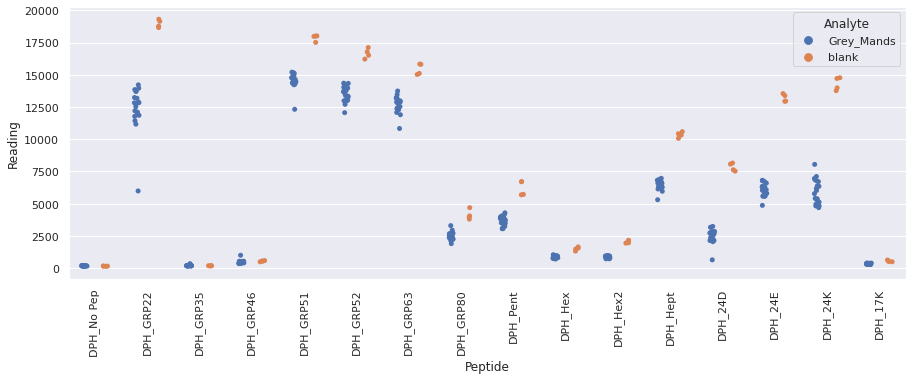

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Pukka_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

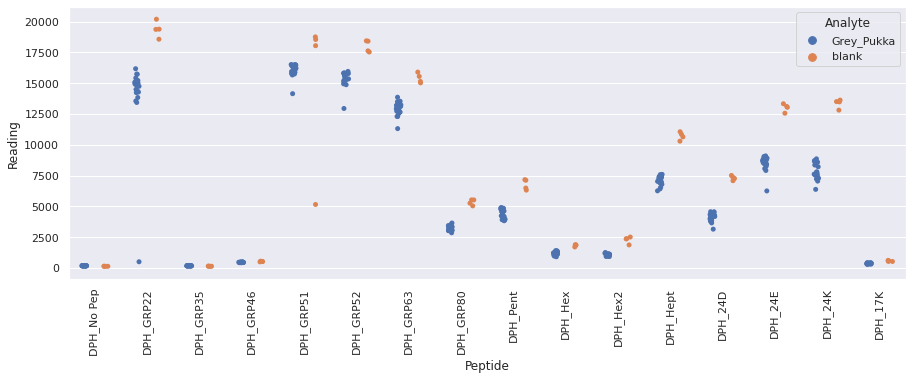

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Tesco_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

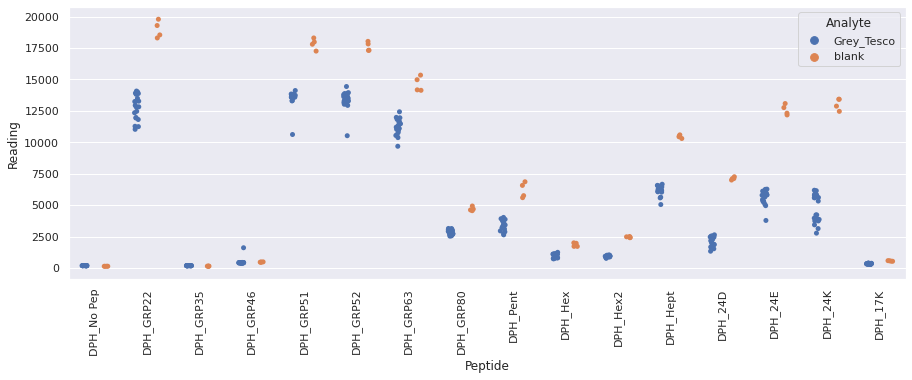

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Twinings_repeat_4.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_4 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

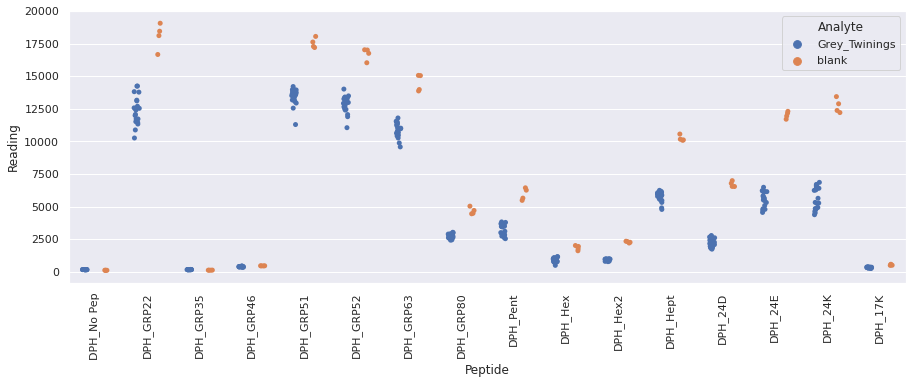

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

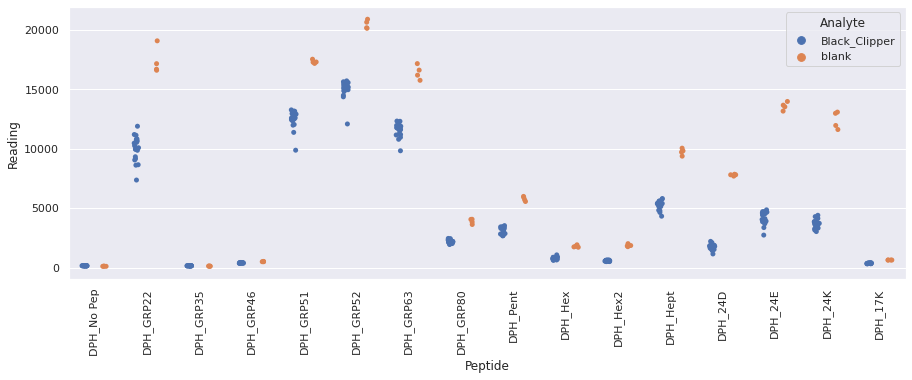

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Diplomat_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

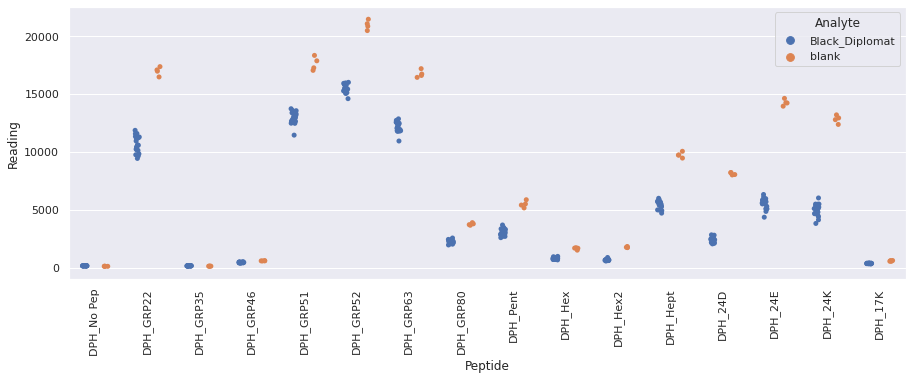

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Dragonfly_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

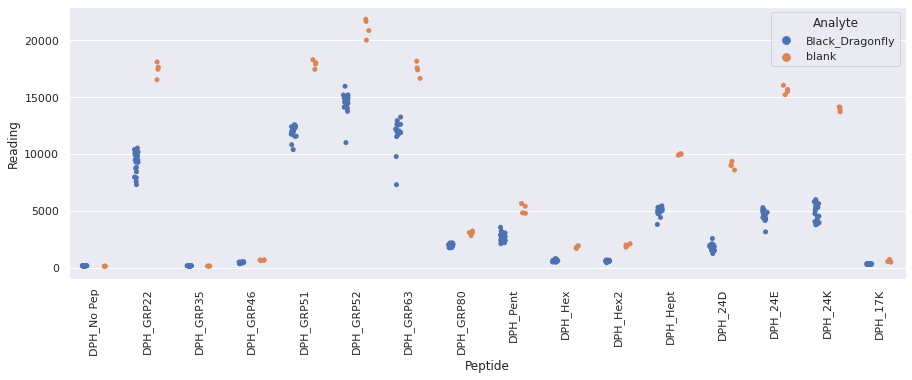

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pgtips_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

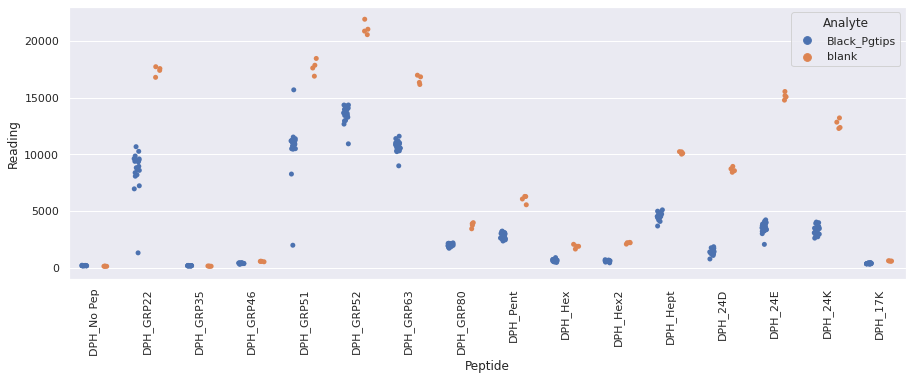

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pukka_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

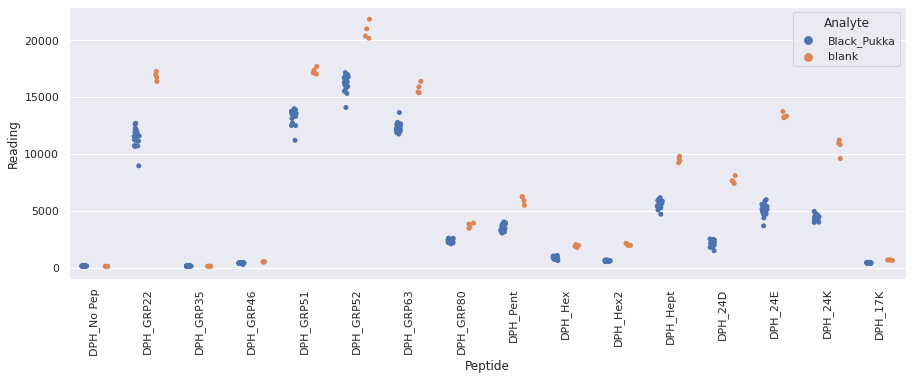

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Sainsburysgold_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

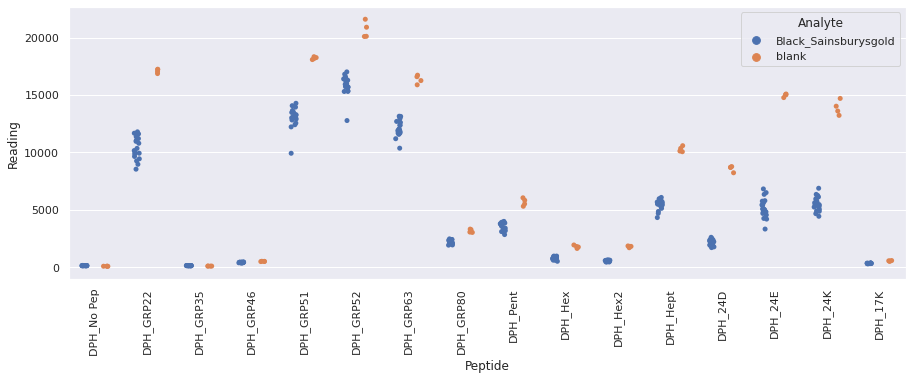

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tesco_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

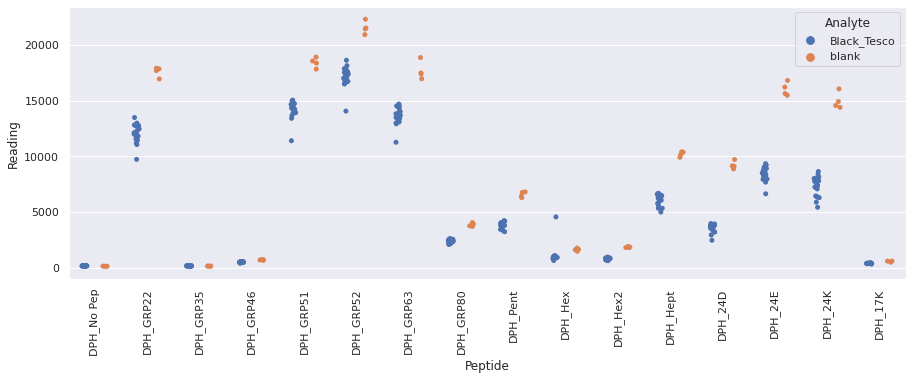

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tetley_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

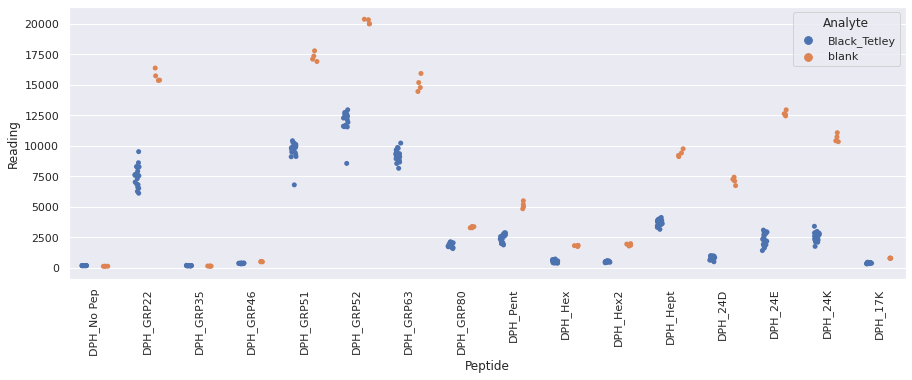

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Twinings_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

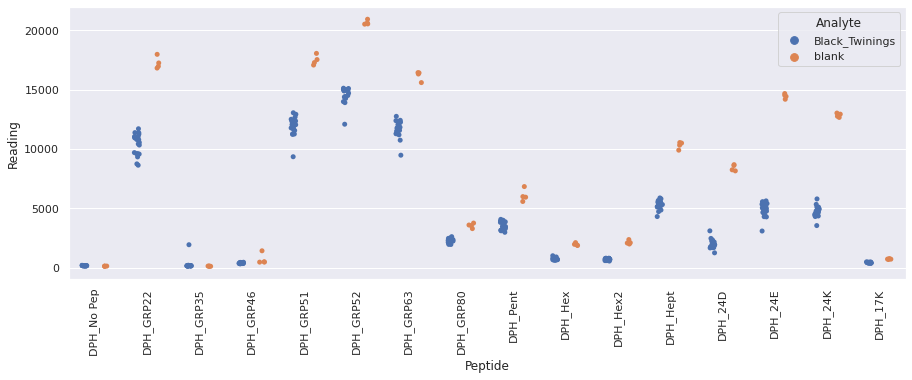

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Yorkshire_repeat_5.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

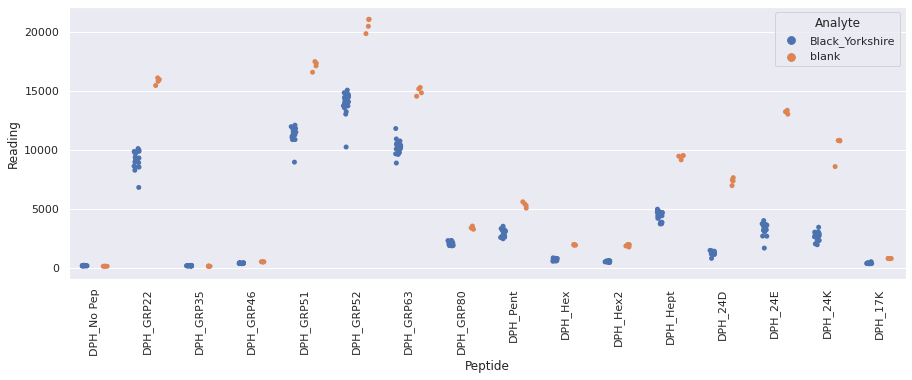

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Clipper_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

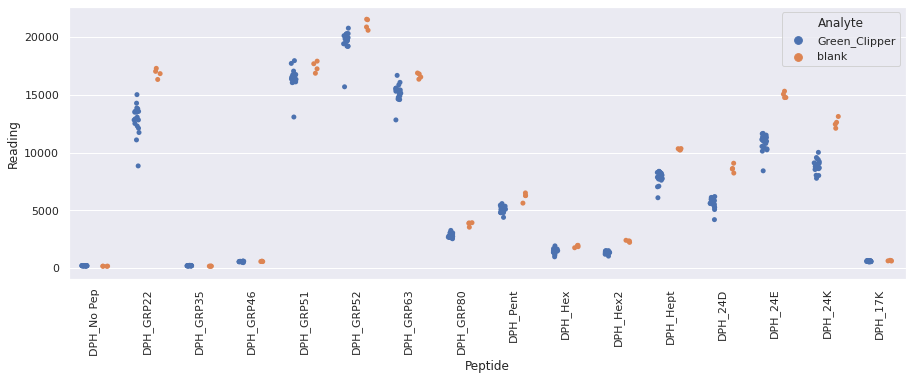

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Diplomat_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

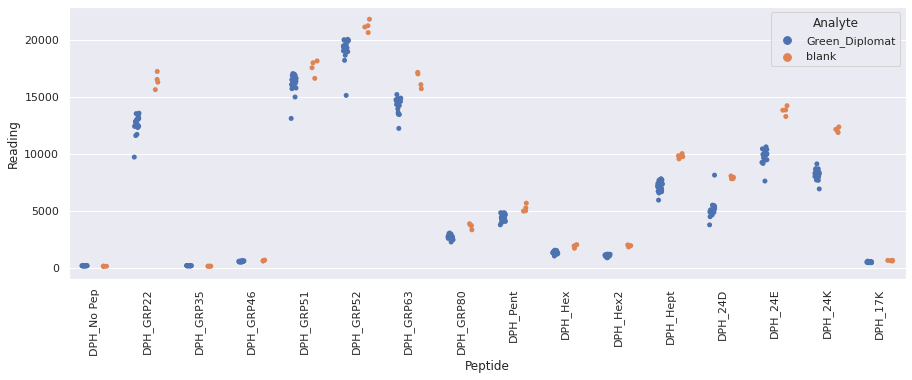

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Doubledragon_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

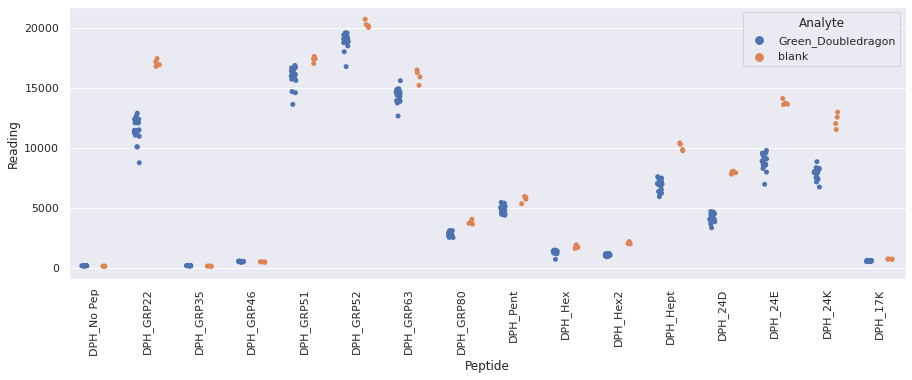

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Dragonfly_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

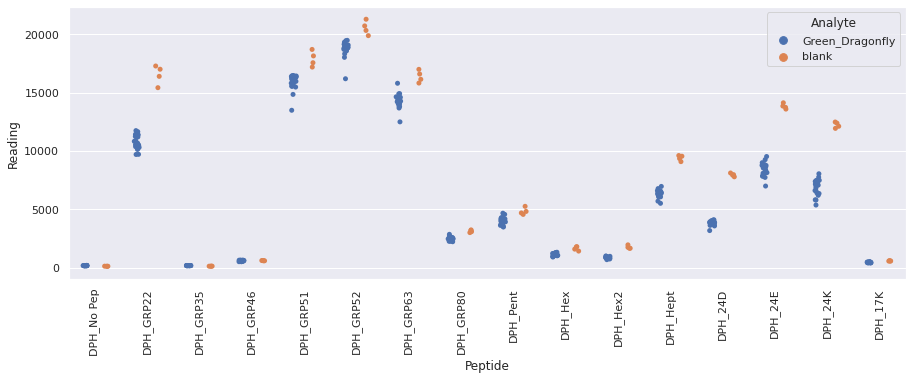

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Handb_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

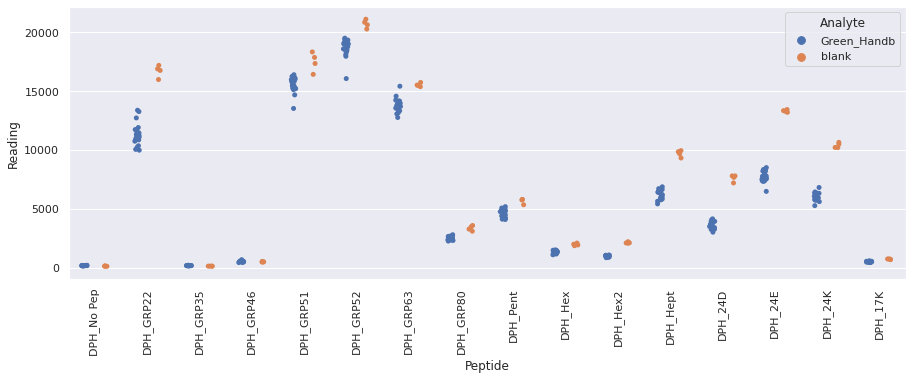

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Joes_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

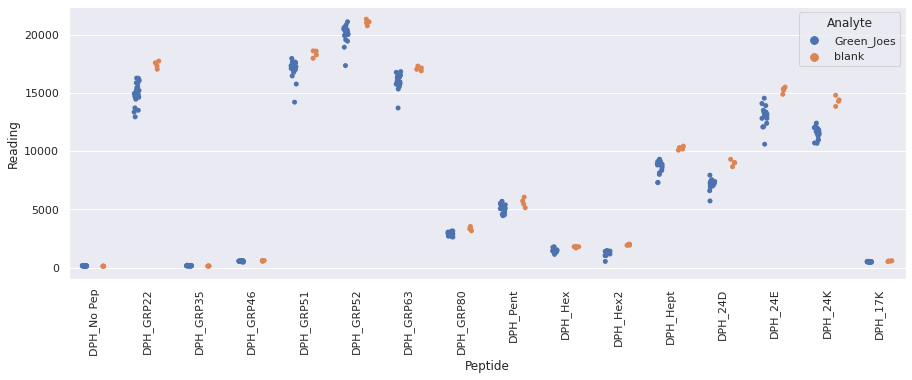

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Qi_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

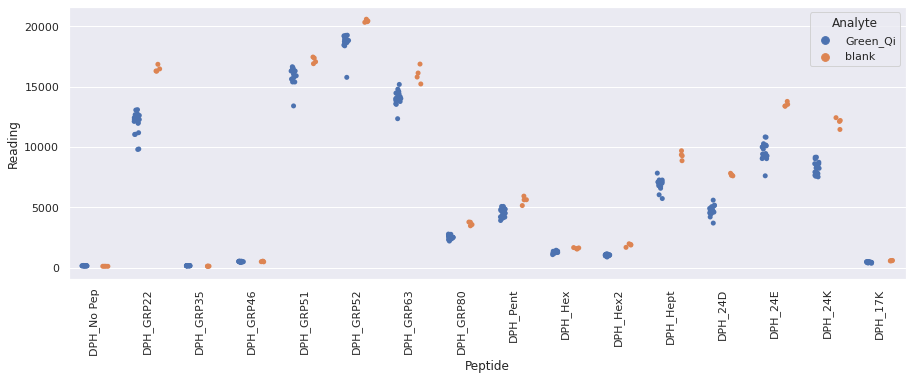

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Sainsburys_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

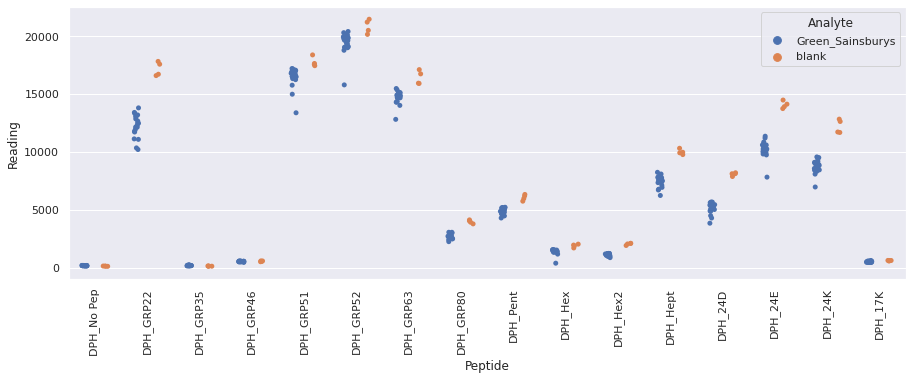

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Tetley_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

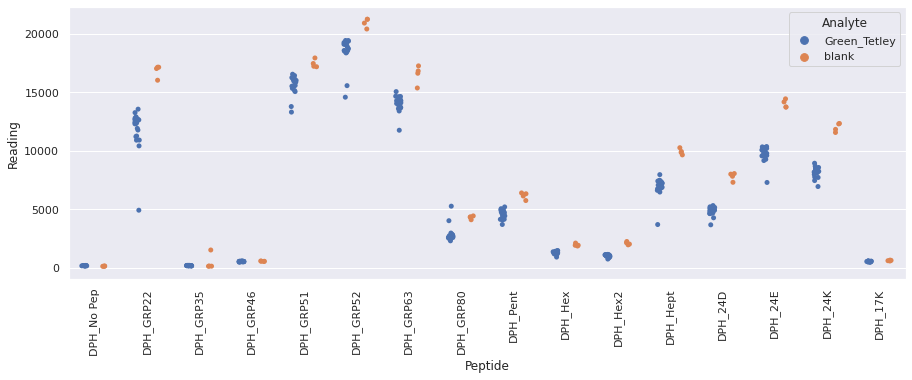

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Twinings_repeat_5.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

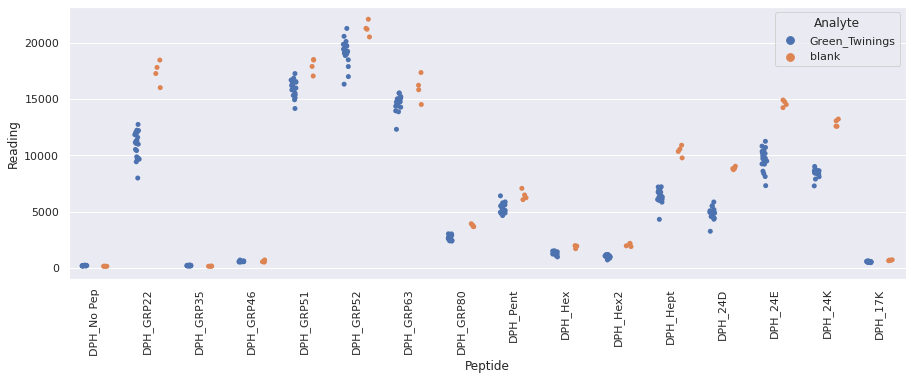

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Asda_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

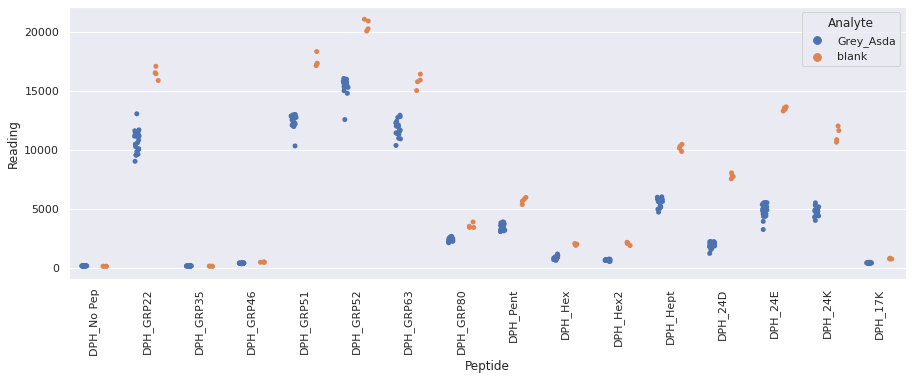

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Clipper_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

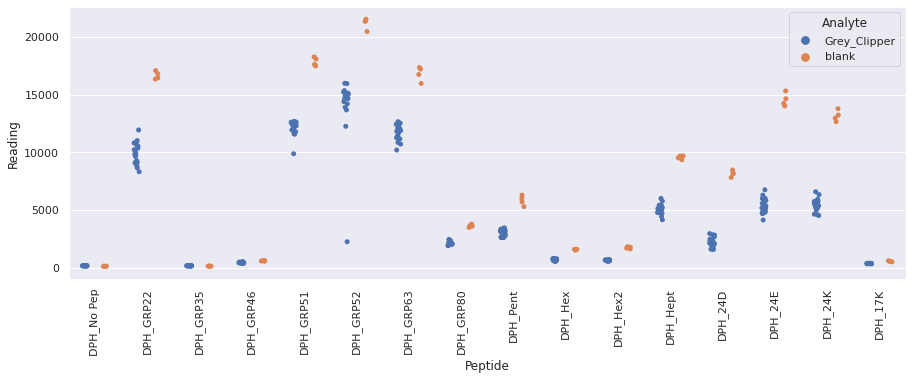

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Coop_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

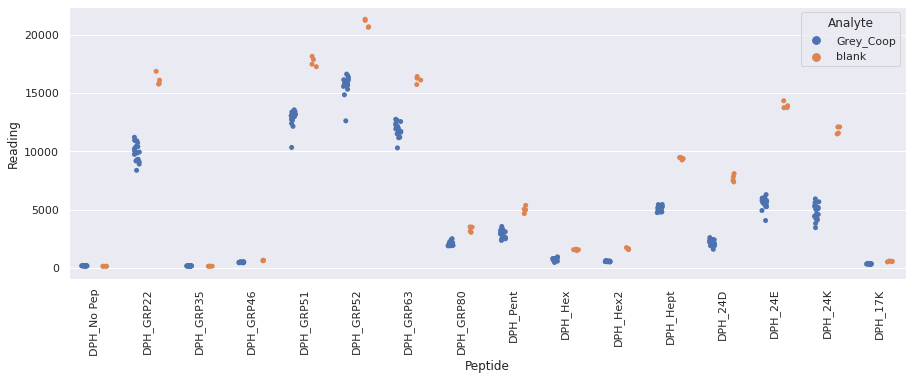

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Devonshire_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

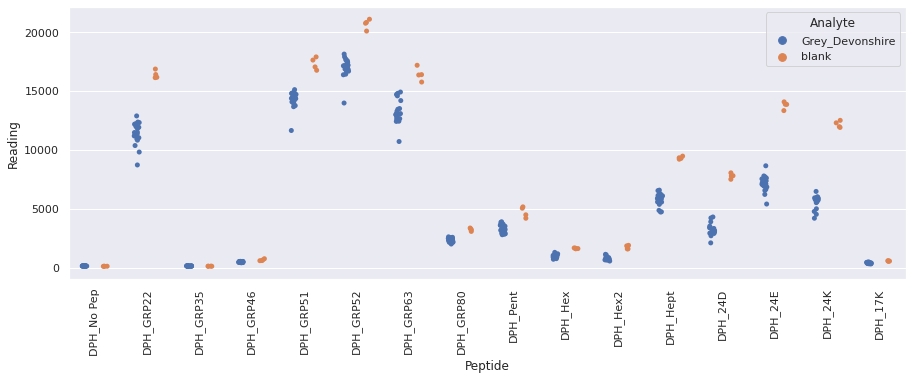

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Diplomat_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

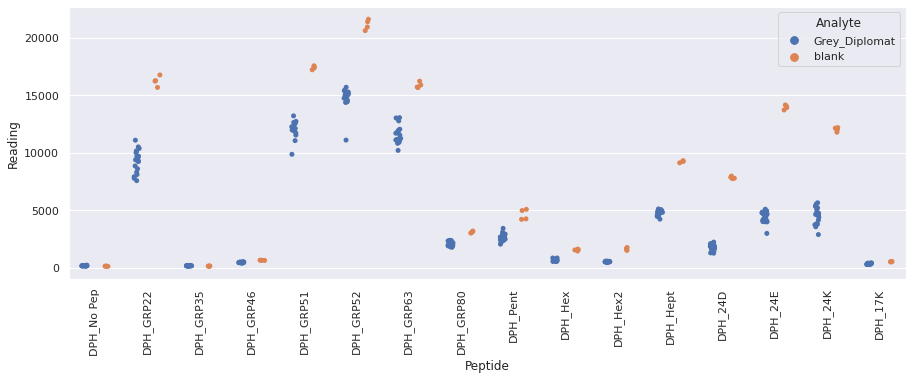

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Joes_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

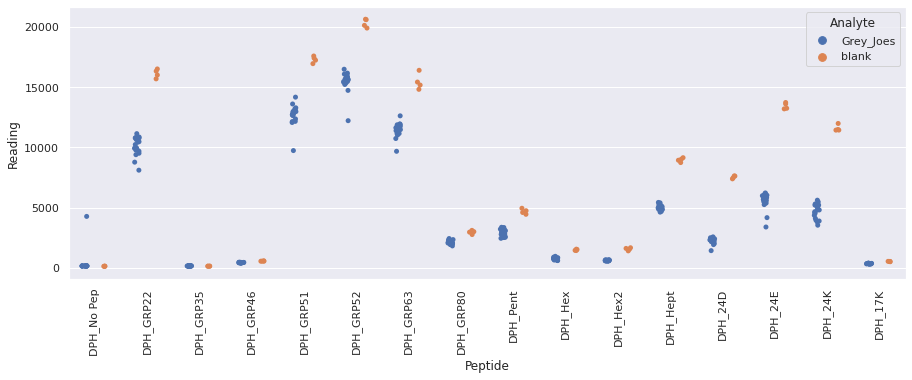

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Mands_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

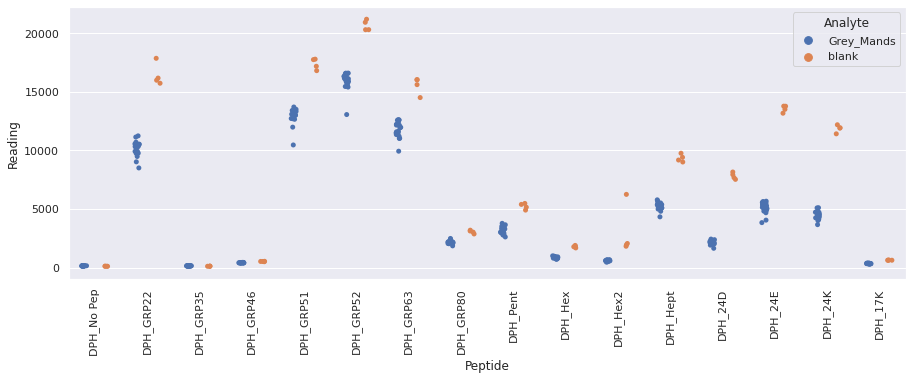

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Pukka_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

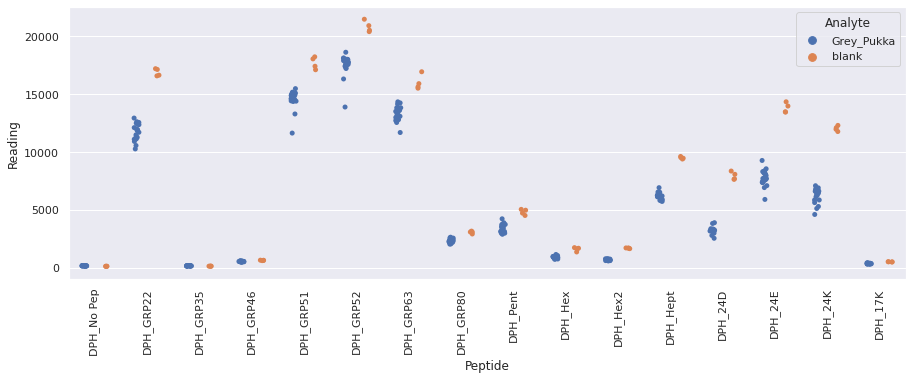

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Tesco_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

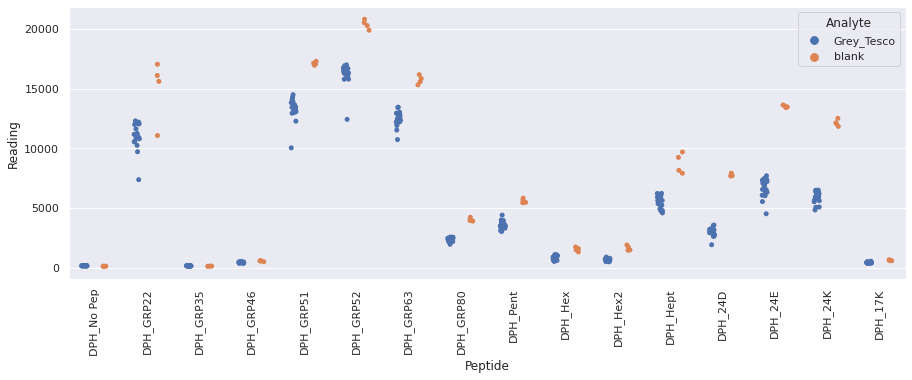

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Twinings_repeat_5.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_5 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

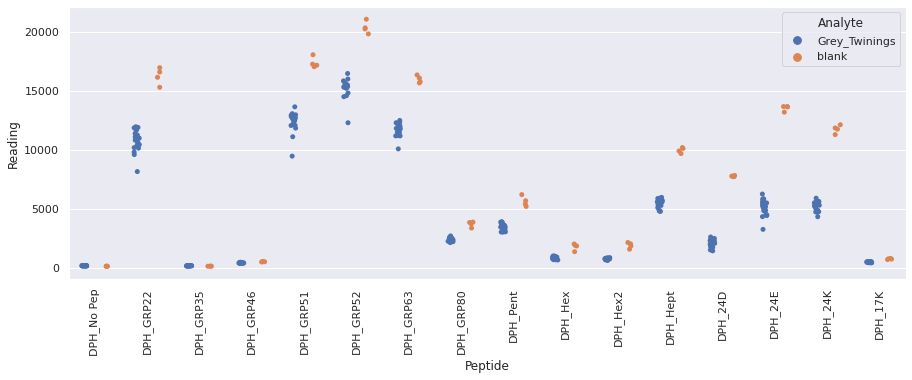

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Clipper_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

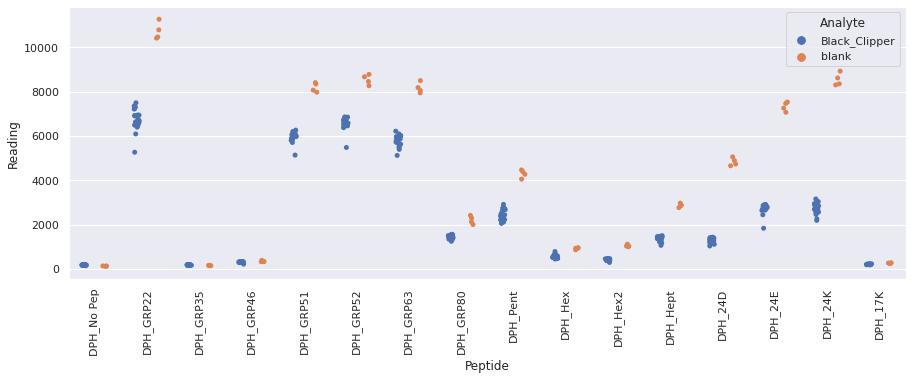

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Diplomat_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Diplomat_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

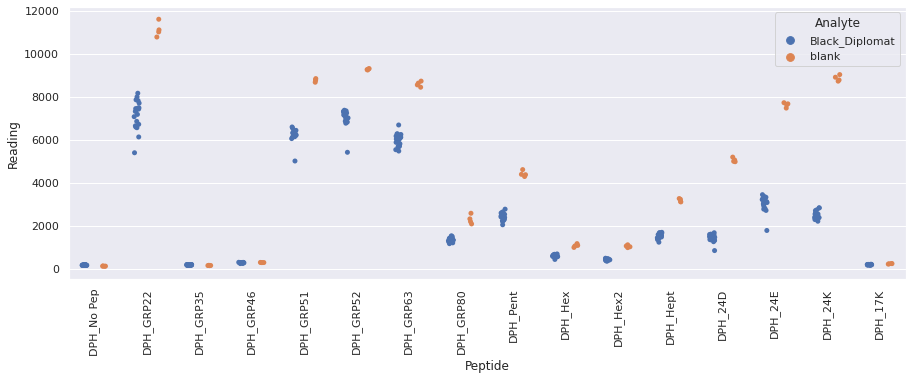

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Dragonfly_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Dragonfly_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

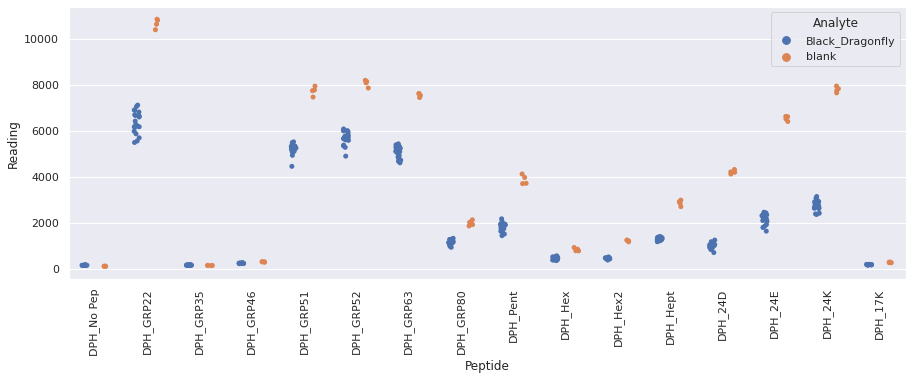

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pgtips_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Pgtips_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

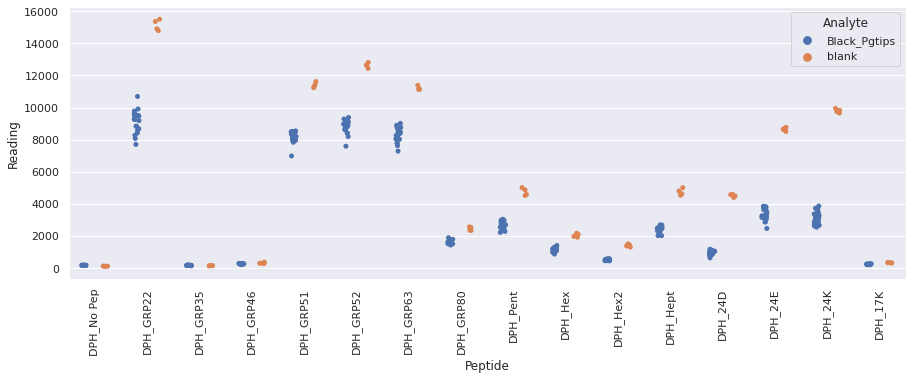

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Pukka_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Pukka_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

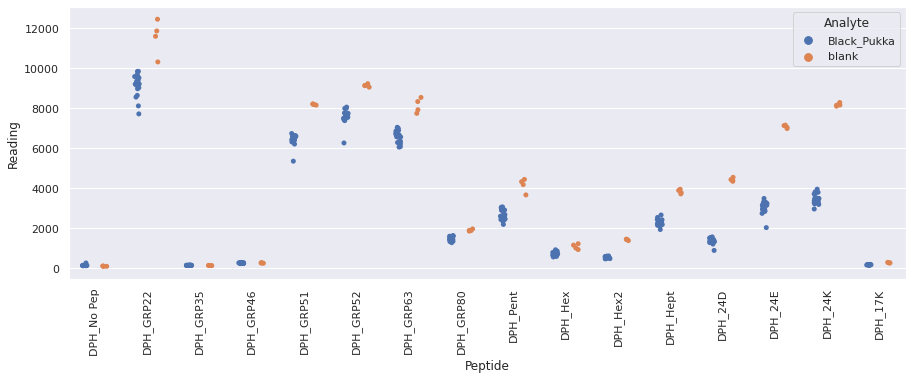

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Sainsburysgold_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

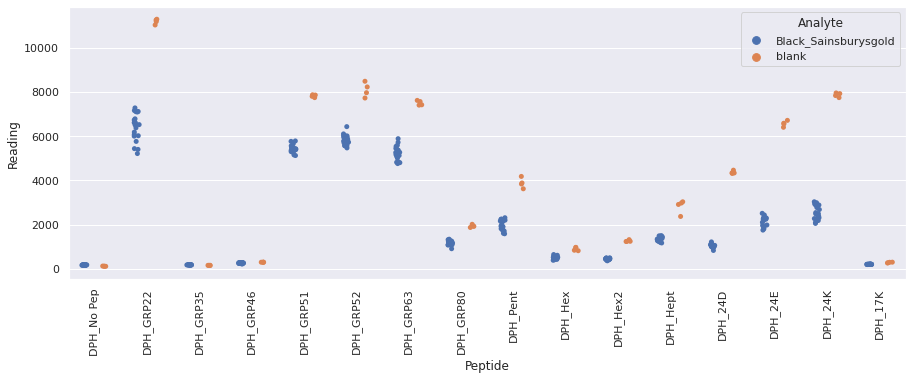

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tesco_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Tesco_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

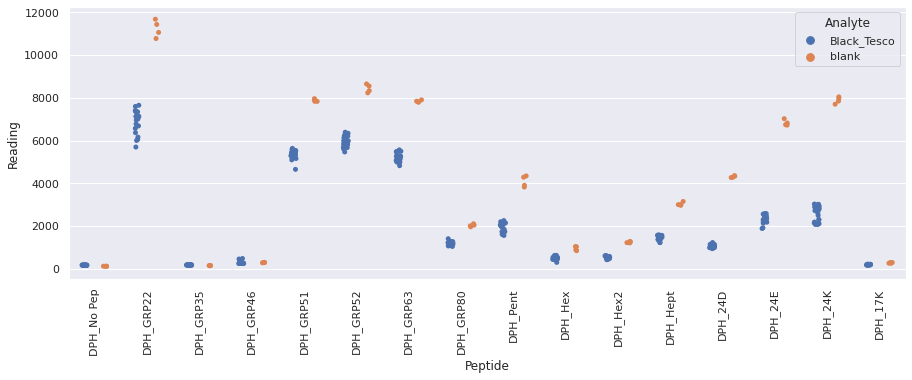

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Tetley_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Tetley_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

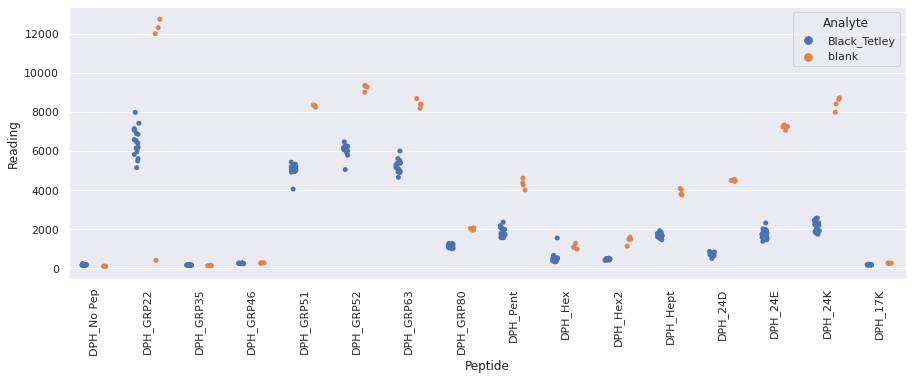

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Twinings_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Twinings_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

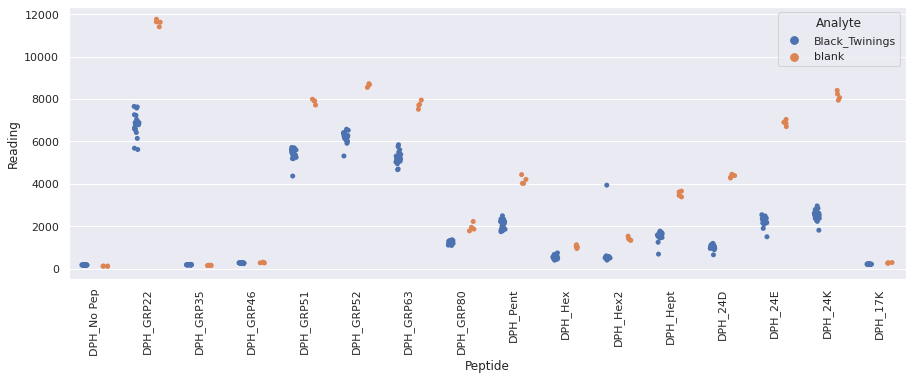

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Yorkshire_repeat_6.xlsx
Drawing scatter plot of data spread for Black_Yorkshire_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

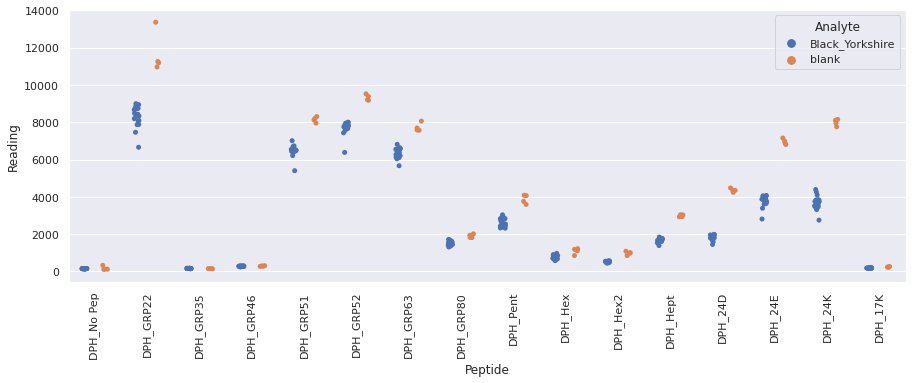

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Clipper_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Clipper_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

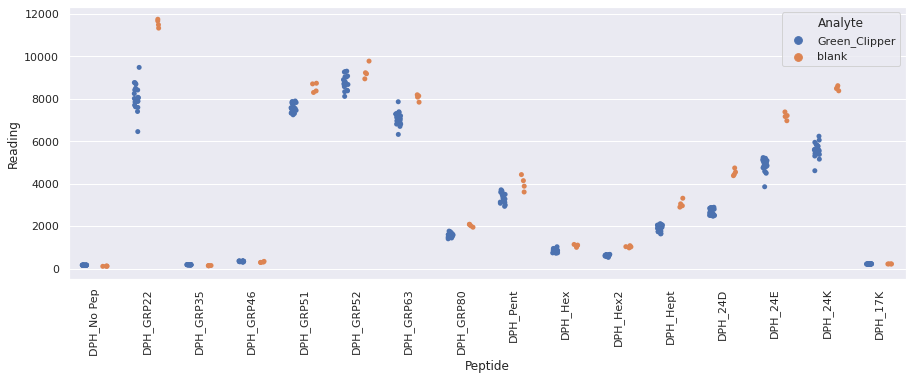

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Diplomat_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Diplomat_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

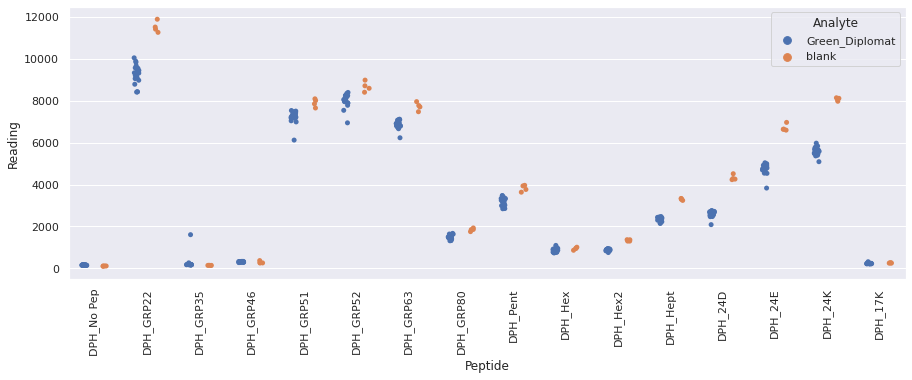

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Doubledragon_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Doubledragon_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

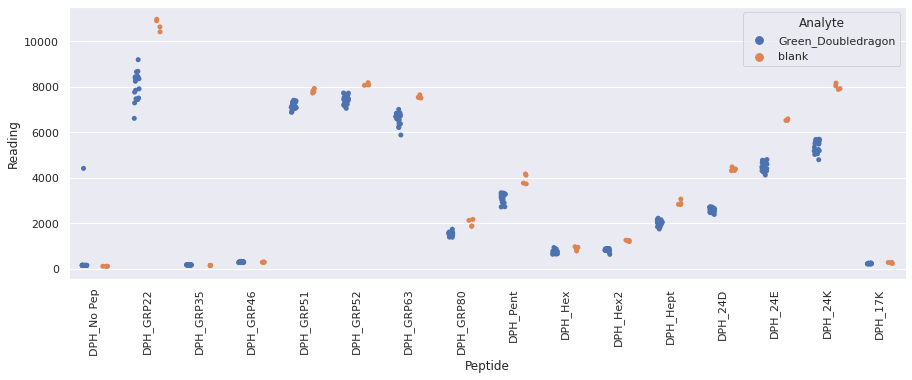

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Dragonfly_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Dragonfly_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

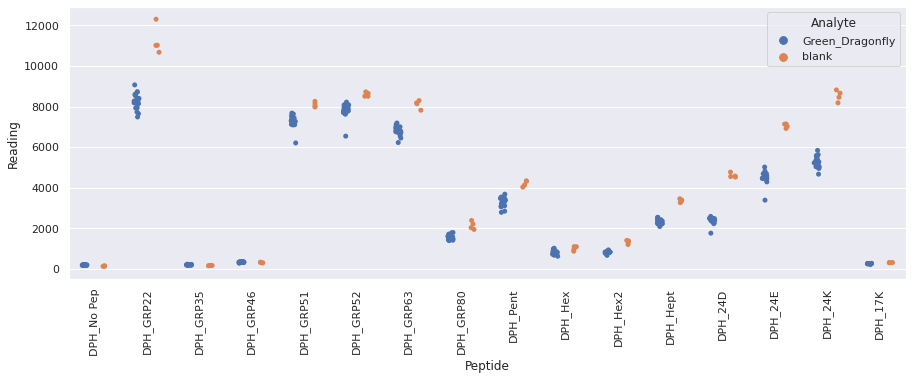

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Handb_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Handb_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

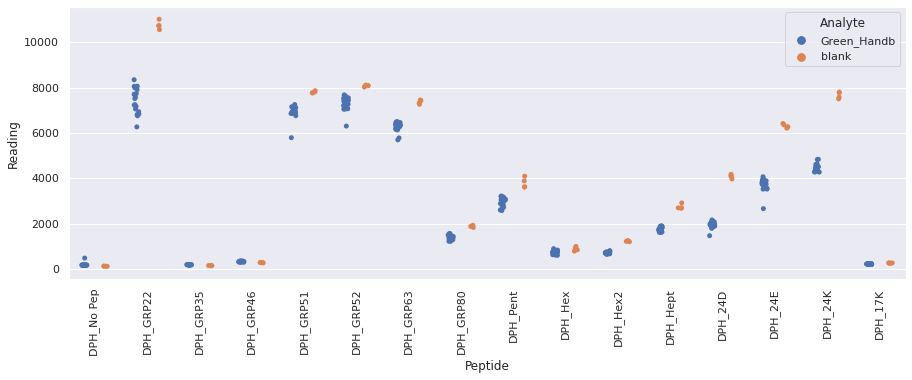

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Joes_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Joes_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

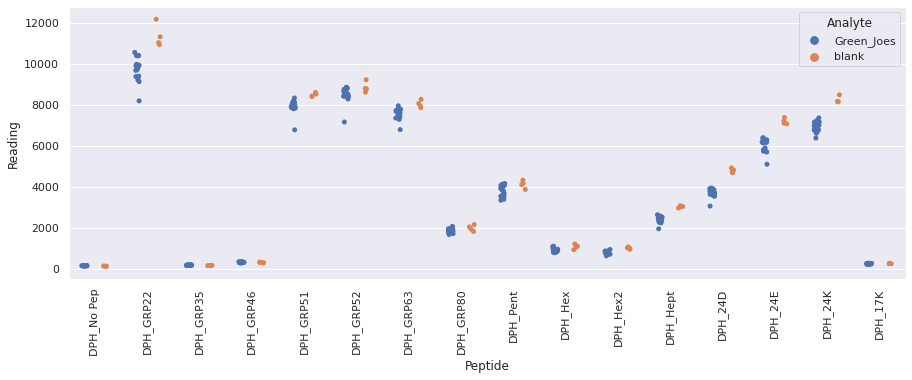

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Qi_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Qi_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

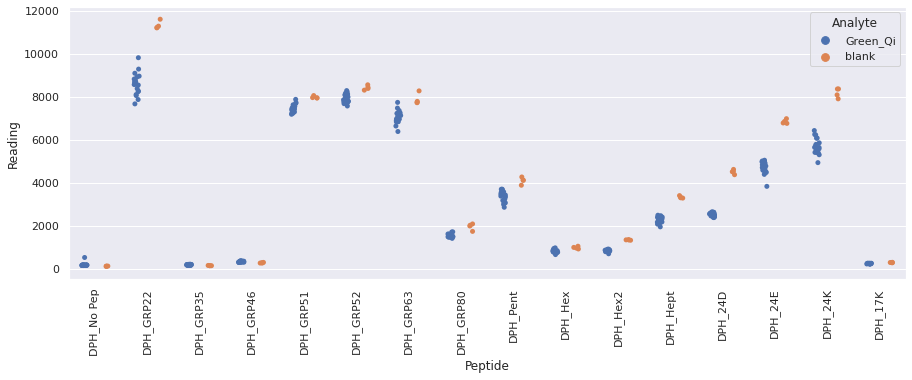

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Sainsburys_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Sainsburys_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

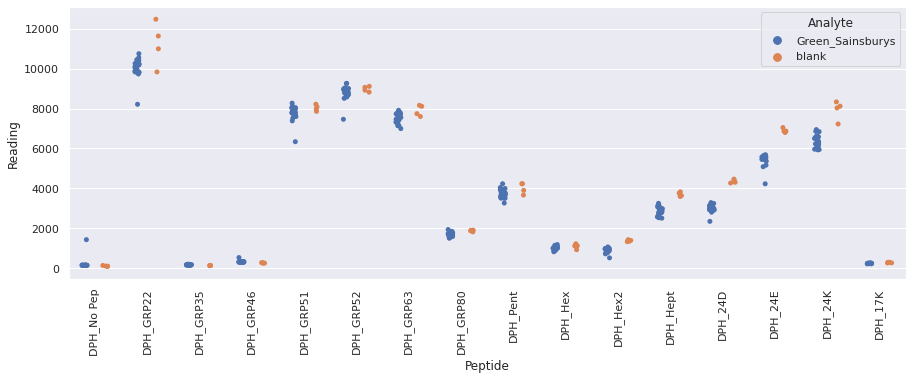

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Tetley_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Tetley_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

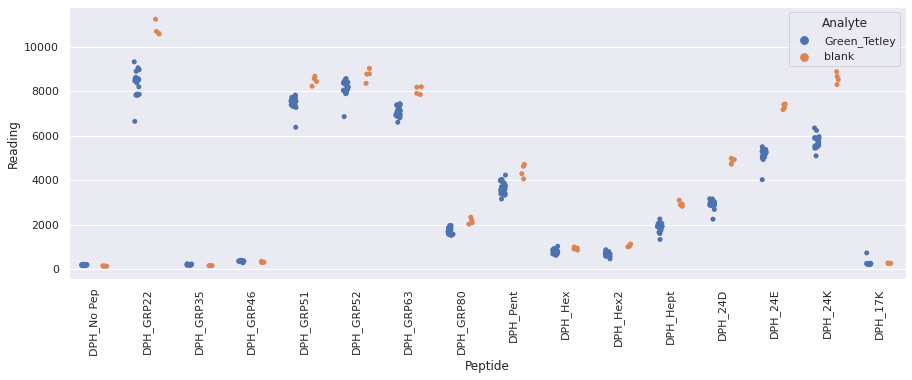

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Green_Twinings_repeat_6.xlsx
Drawing scatter plot of data spread for Green_Twinings_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

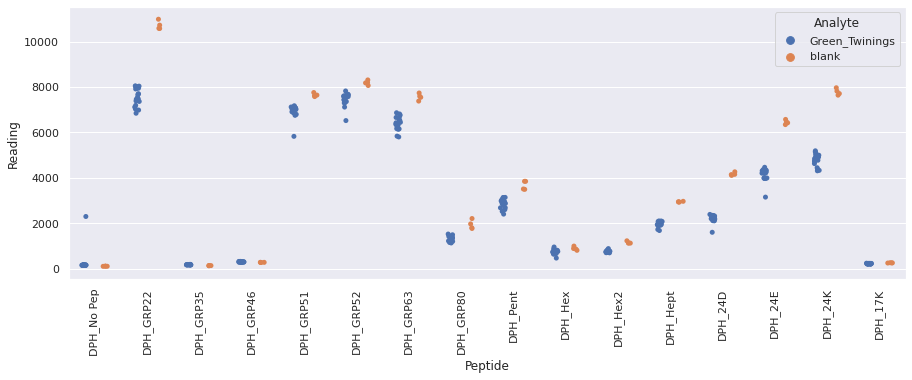

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Asda_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Asda_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

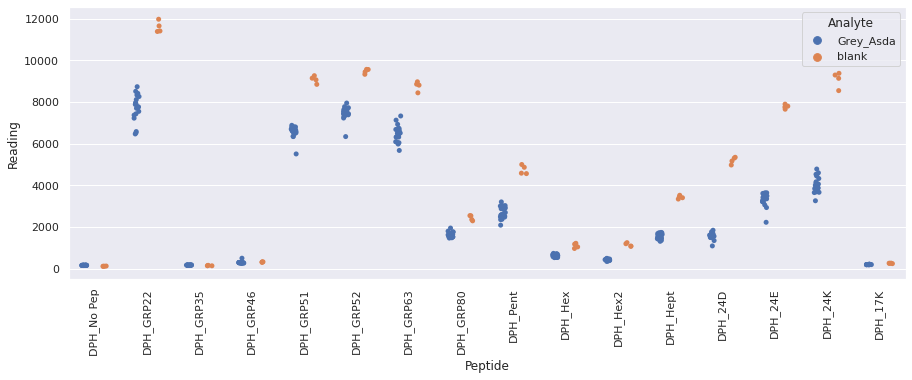

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Clipper_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Clipper_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

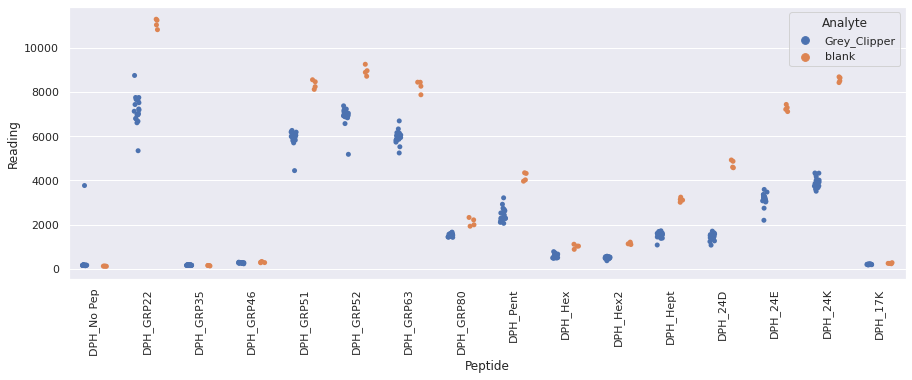

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Coop_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Coop_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

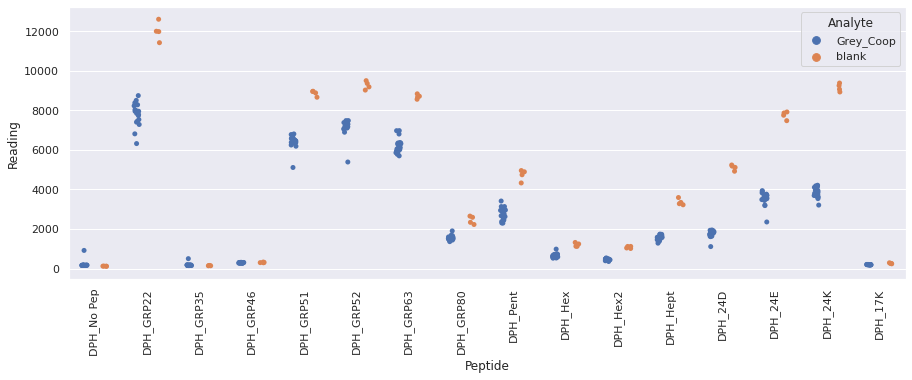

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Devonshire_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Devonshire_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

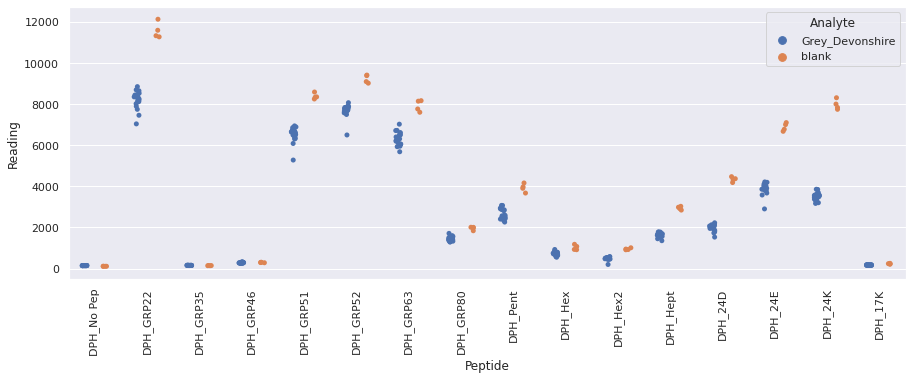

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Diplomat_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Diplomat_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

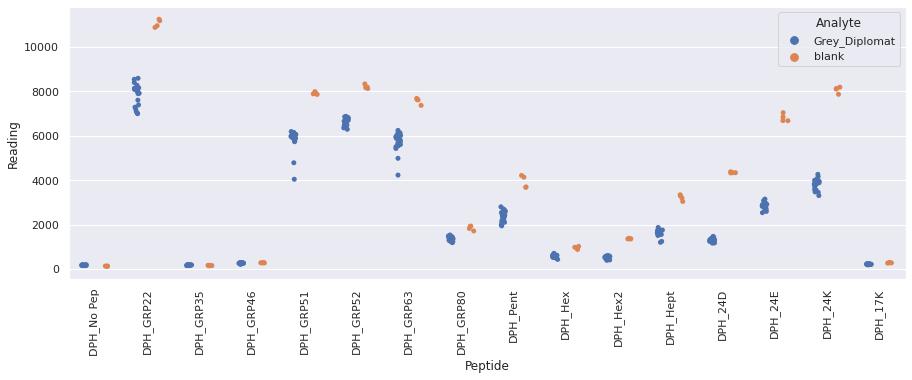

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Joes_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Joes_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

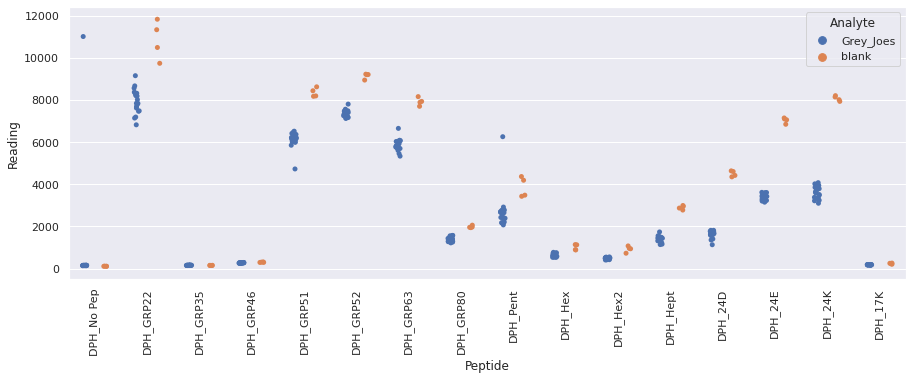

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Mands_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Mands_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

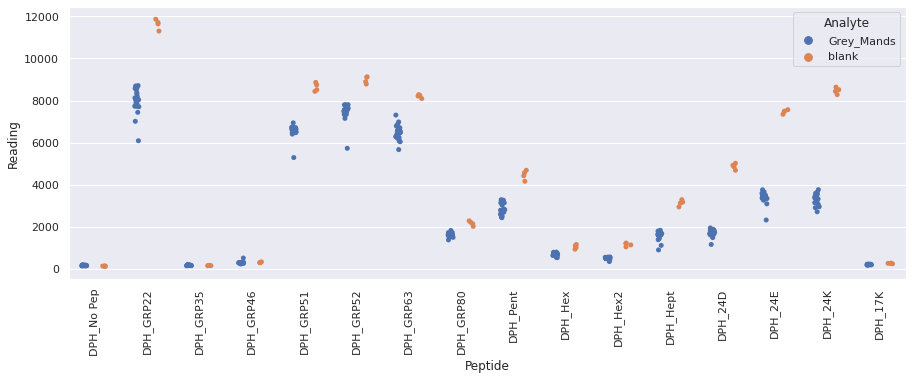

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Pukka_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Pukka_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

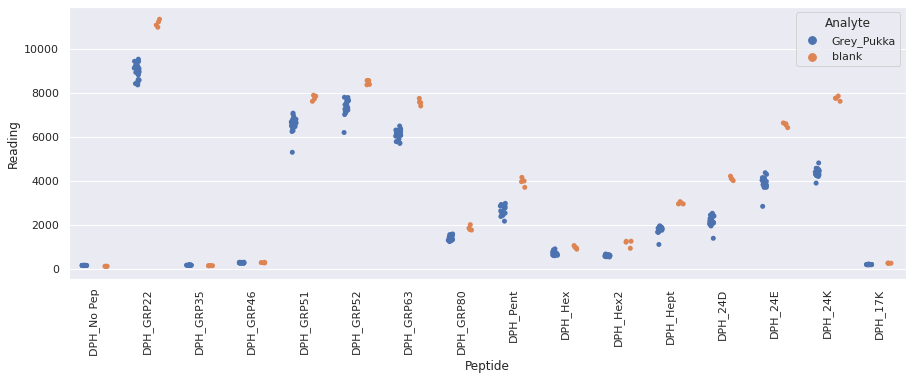

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Tesco_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Tesco_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

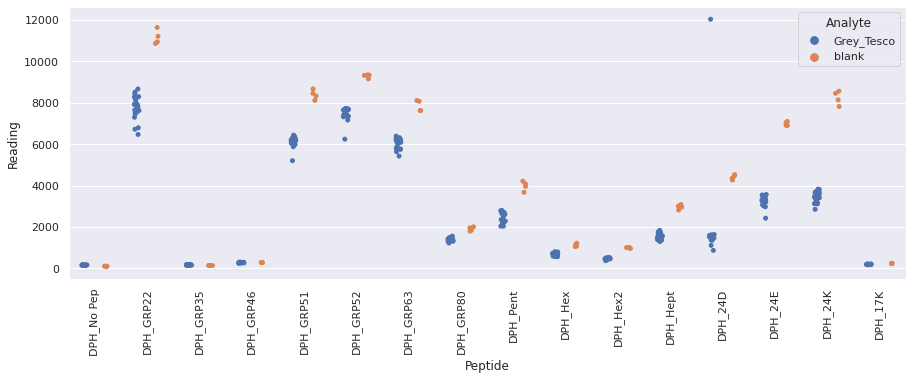

Parsing plate /home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Grey_Twinings_repeat_6.xlsx
Drawing scatter plot of data spread for Grey_Twinings_repeat_6 in Tea_unscaled_data


<Figure size 720x720 with 0 Axes>

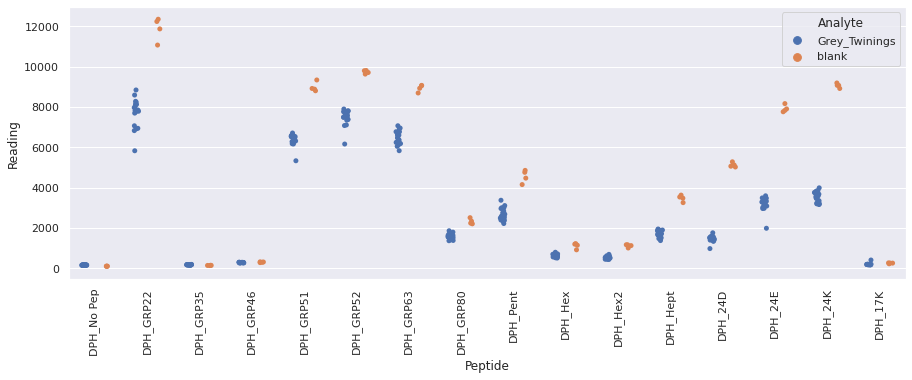

Drawing scatter plot of data spread for Black_Clipper_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

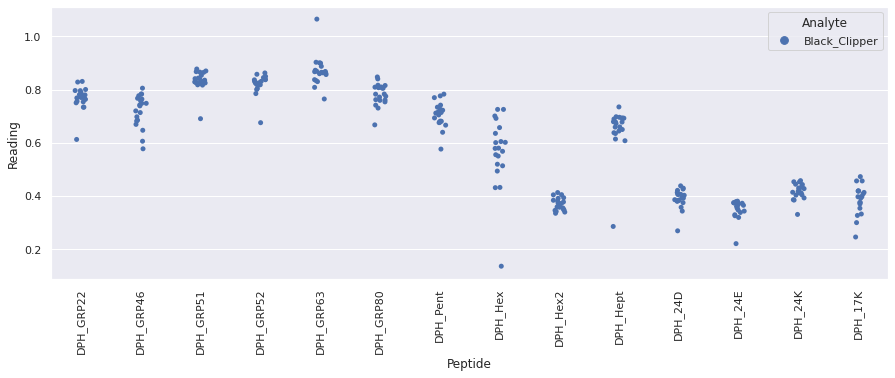

Drawing scatter plot of data spread for Black_Diplomat_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

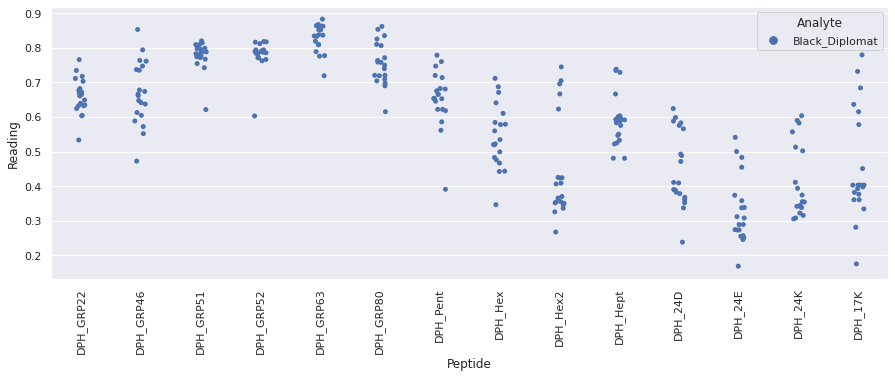

Drawing scatter plot of data spread for Black_Dragonfly_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

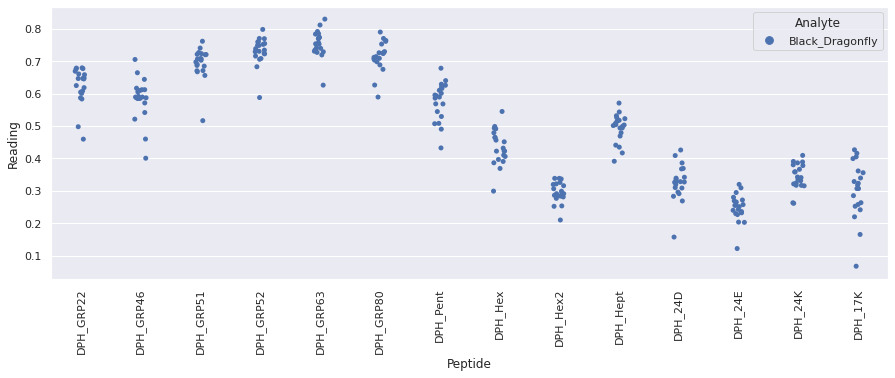

Drawing scatter plot of data spread for Black_Pgtips_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

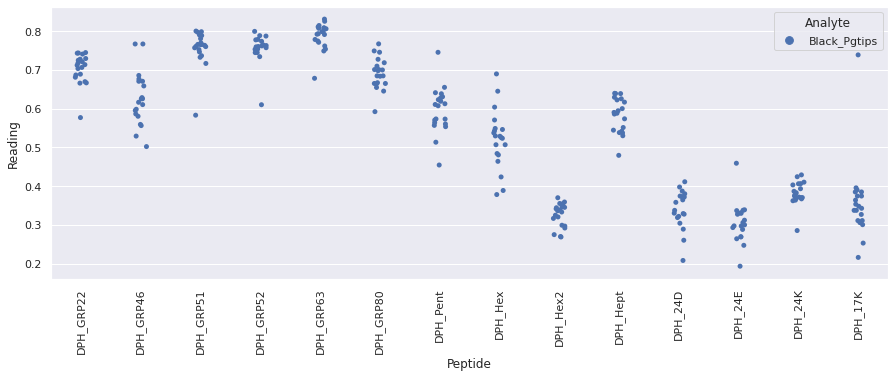

Drawing scatter plot of data spread for Black_Pukka_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

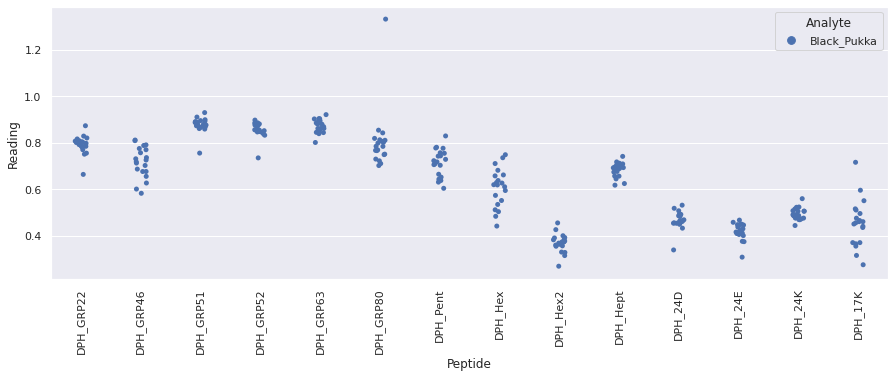

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

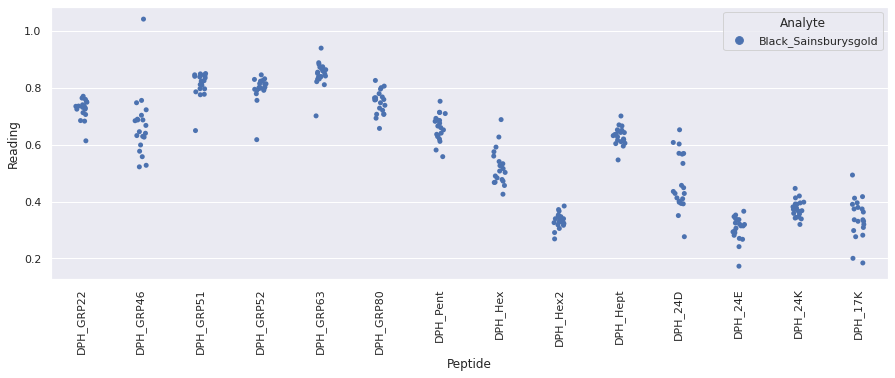

Drawing scatter plot of data spread for Black_Tesco_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

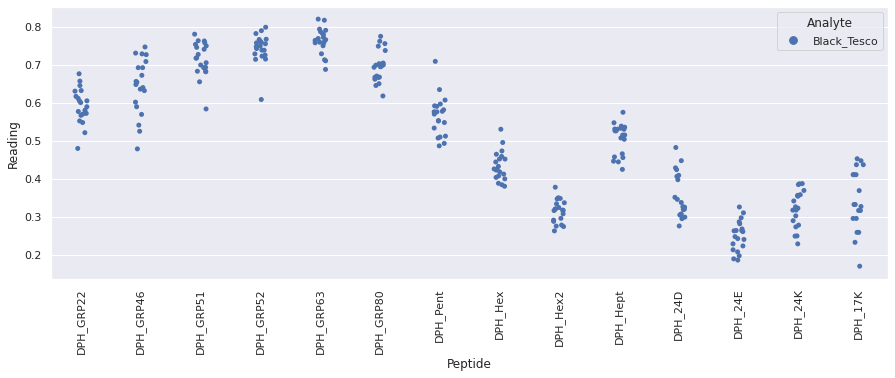

Drawing scatter plot of data spread for Black_Tetley_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

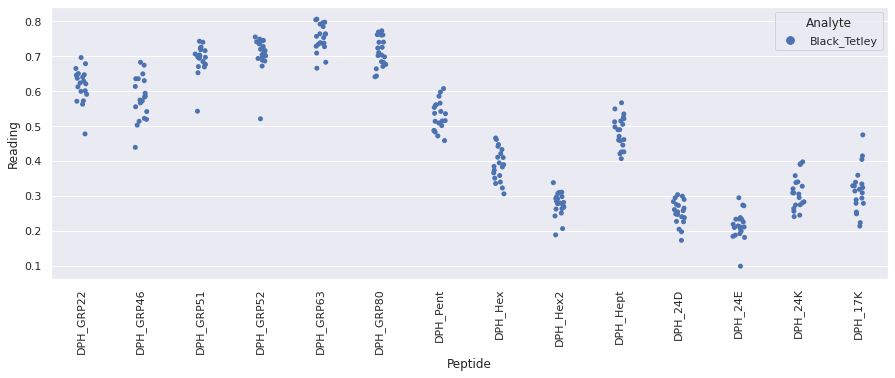

Drawing scatter plot of data spread for Black_Twinings_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

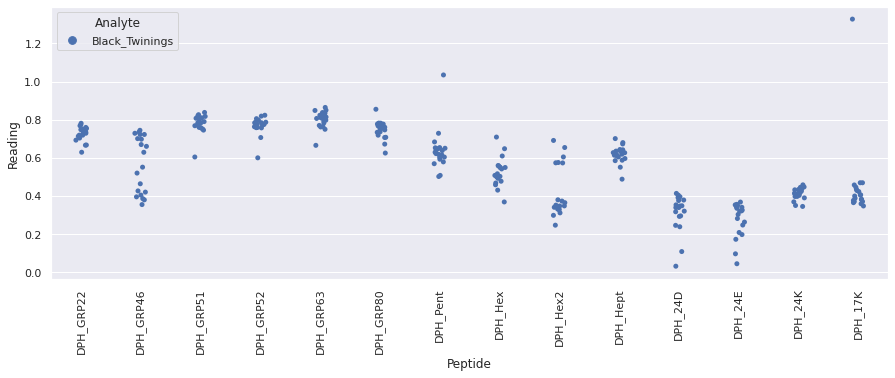

Drawing scatter plot of data spread for Black_Yorkshire_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

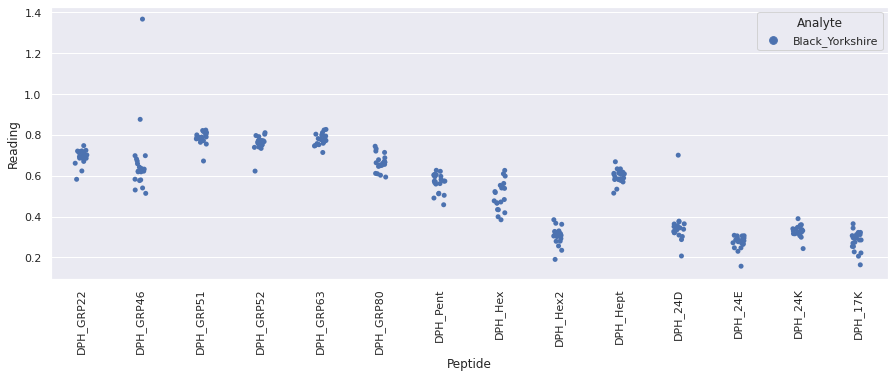

Drawing scatter plot of data spread for Green_Clipper_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

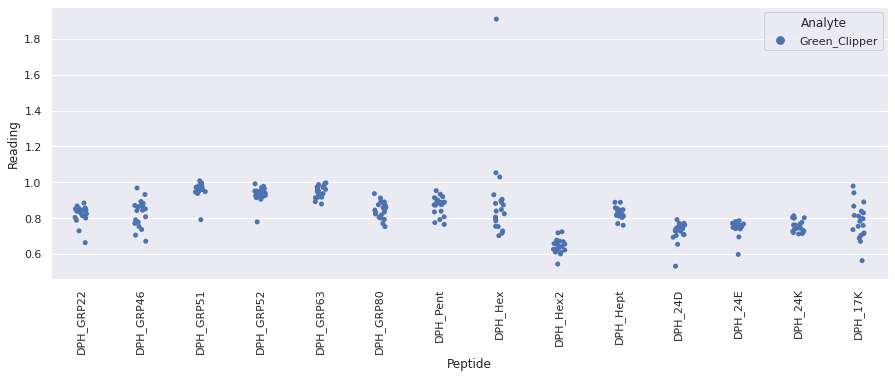

Drawing scatter plot of data spread for Green_Diplomat_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

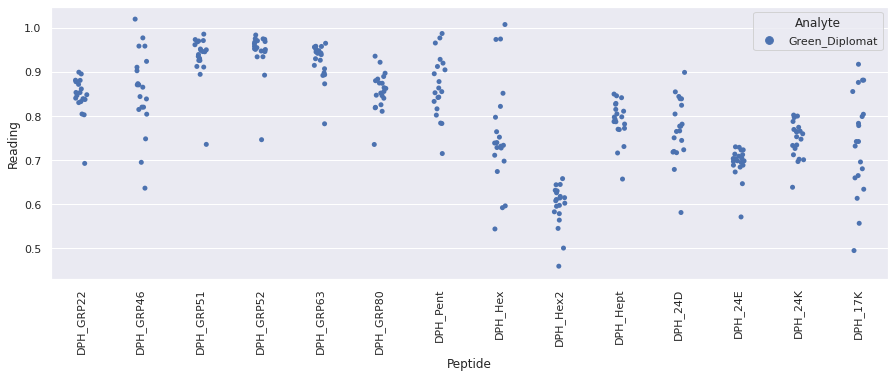

Drawing scatter plot of data spread for Green_Doubledragon_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

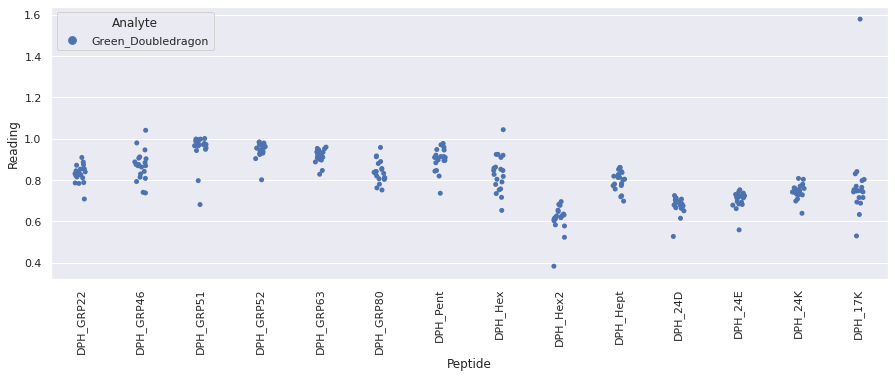

Drawing scatter plot of data spread for Green_Dragonfly_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

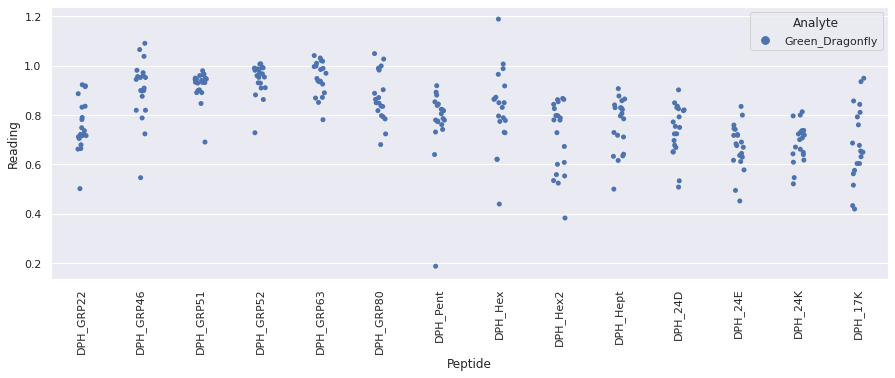

Drawing scatter plot of data spread for Green_Handb_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

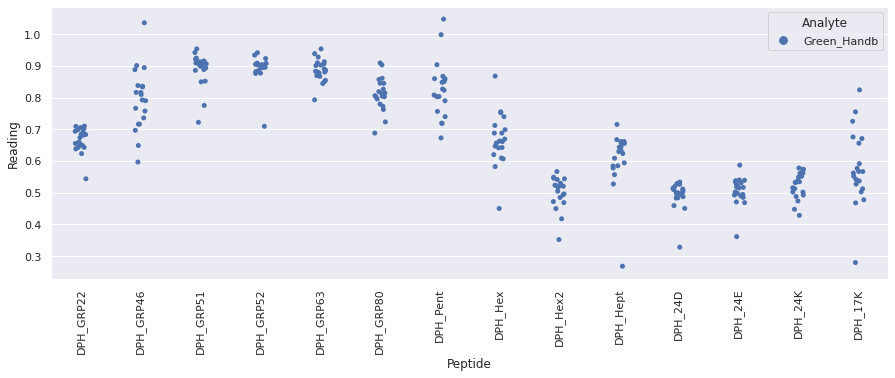

Drawing scatter plot of data spread for Green_Joes_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

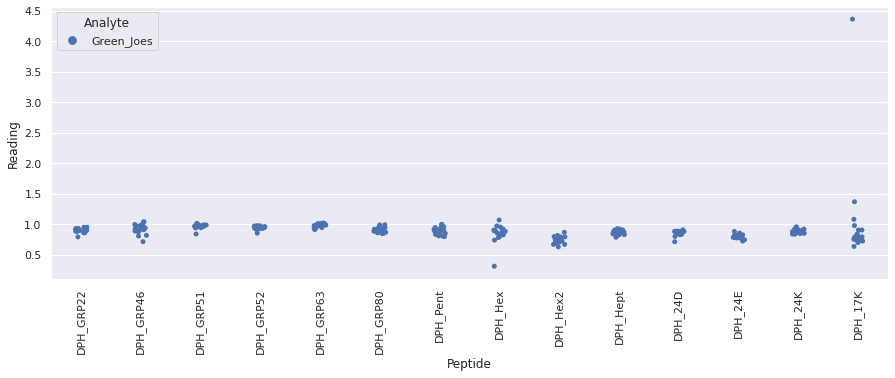

Drawing scatter plot of data spread for Green_Qi_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

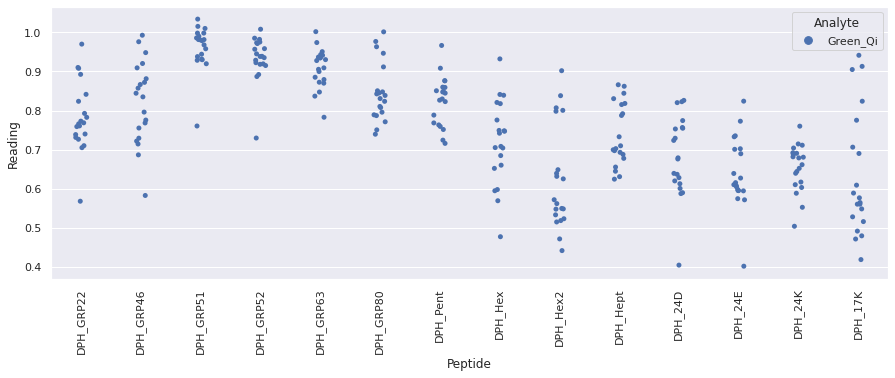

Drawing scatter plot of data spread for Green_Sainsburys_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

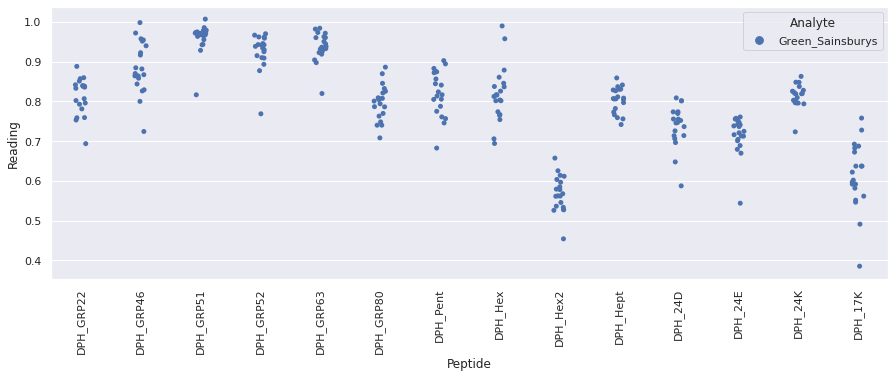

Drawing scatter plot of data spread for Green_Tetley_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

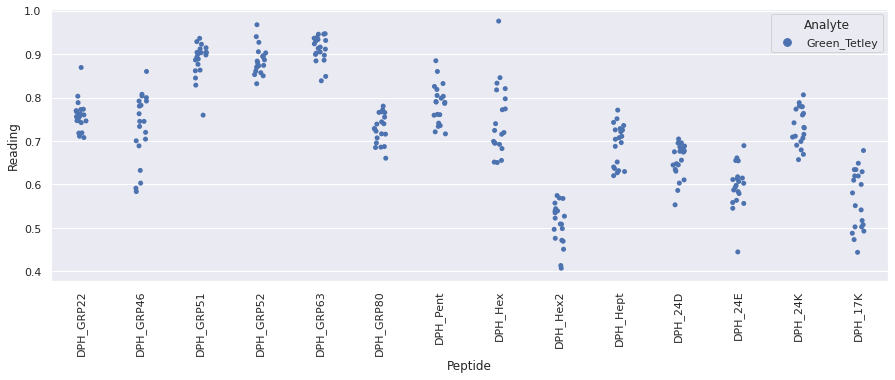

Drawing scatter plot of data spread for Green_Twinings_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

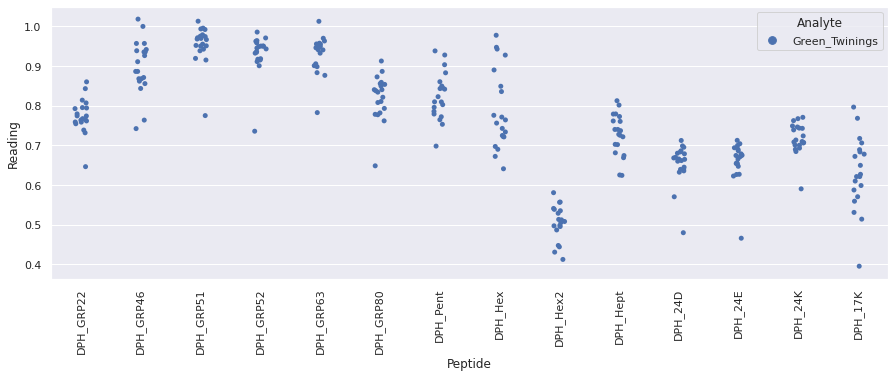

Drawing scatter plot of data spread for Grey_Asda_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

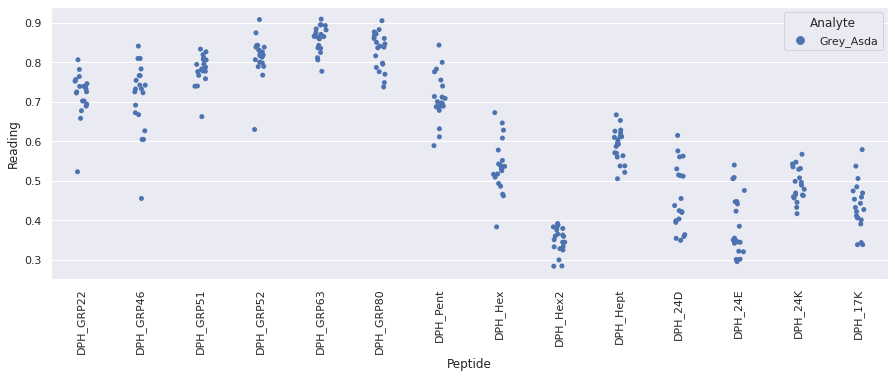

Drawing scatter plot of data spread for Grey_Clipper_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

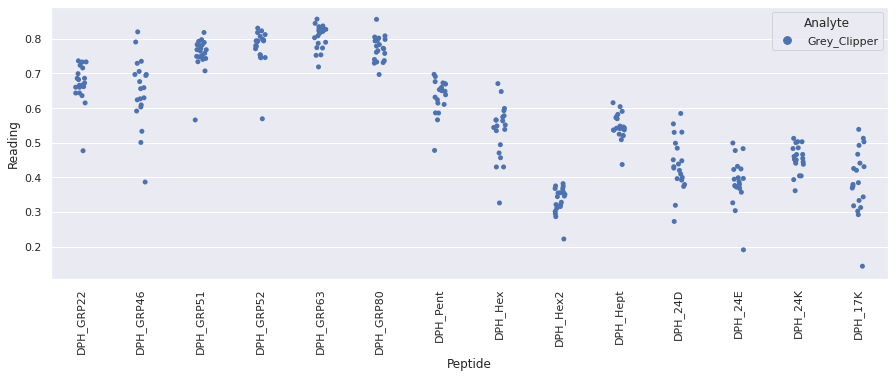

Drawing scatter plot of data spread for Grey_Coop_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

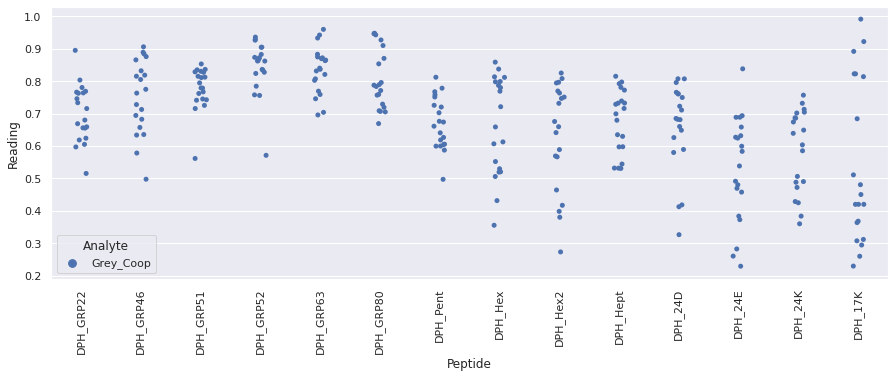

Drawing scatter plot of data spread for Grey_Devonshire_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

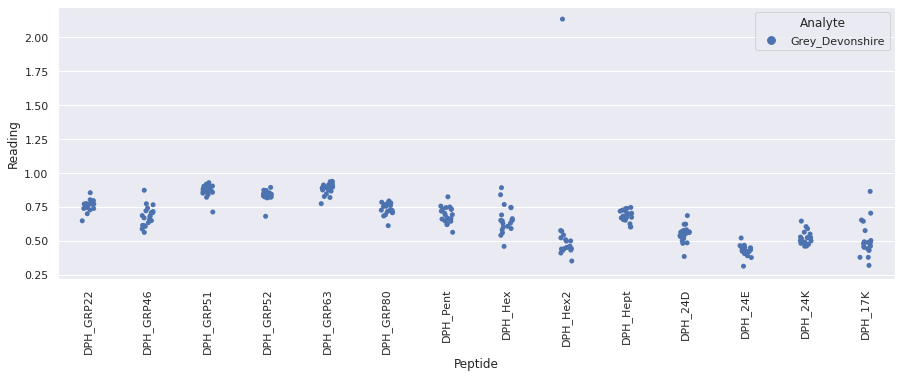

Drawing scatter plot of data spread for Grey_Diplomat_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

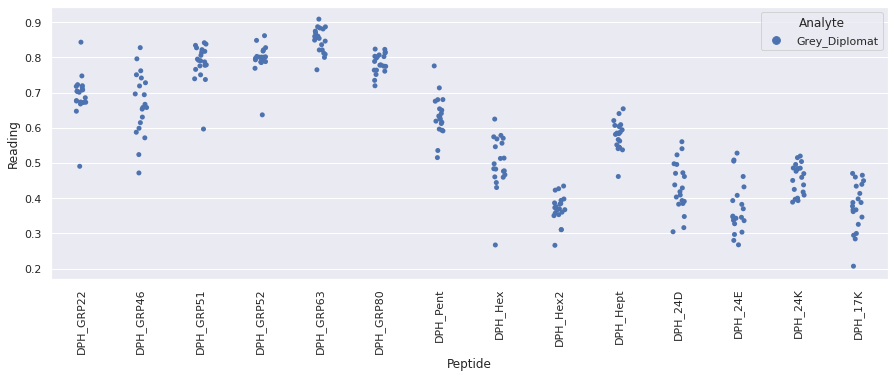

Drawing scatter plot of data spread for Grey_Joes_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

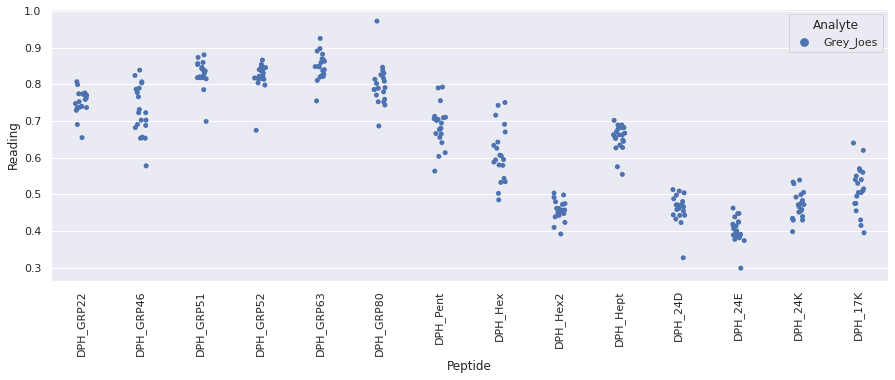

Drawing scatter plot of data spread for Grey_Mands_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

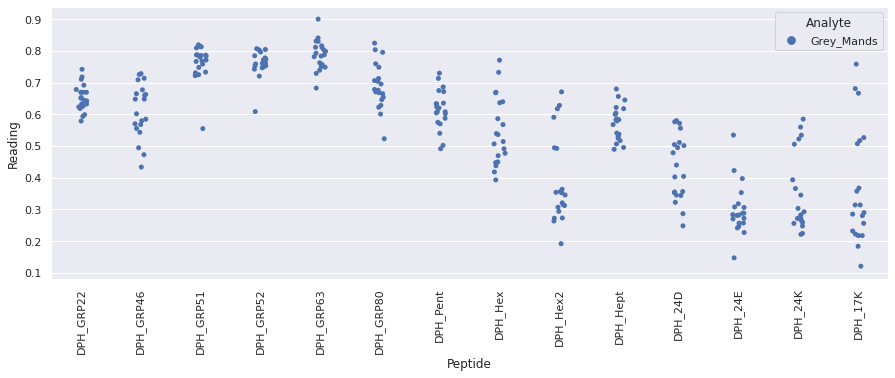

Drawing scatter plot of data spread for Grey_Pukka_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

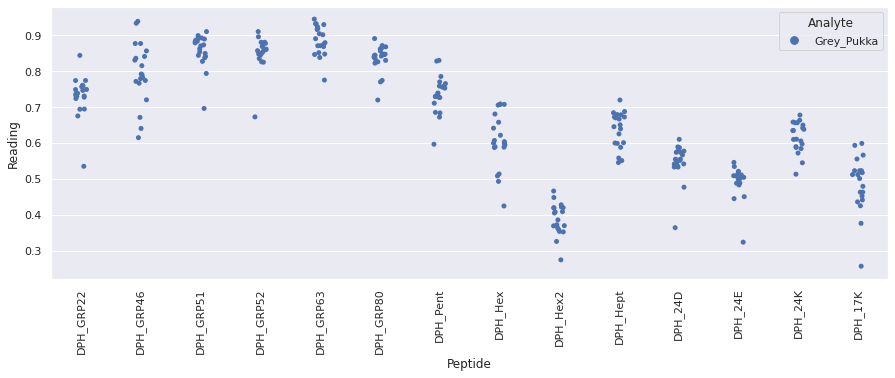

Drawing scatter plot of data spread for Grey_Tesco_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

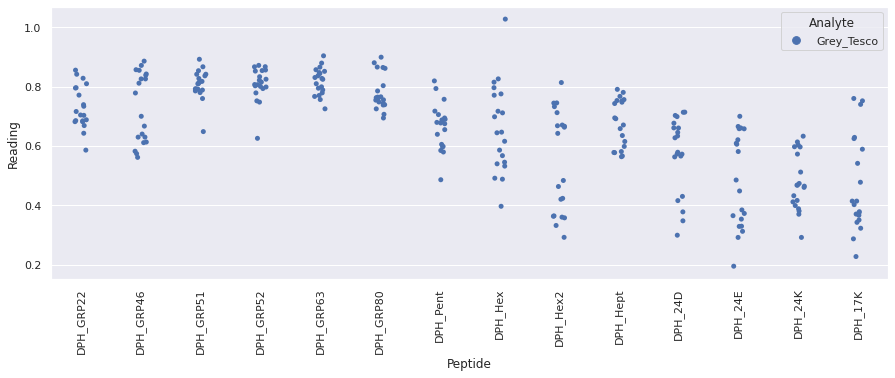

Drawing scatter plot of data spread for Grey_Twinings_repeat_1 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

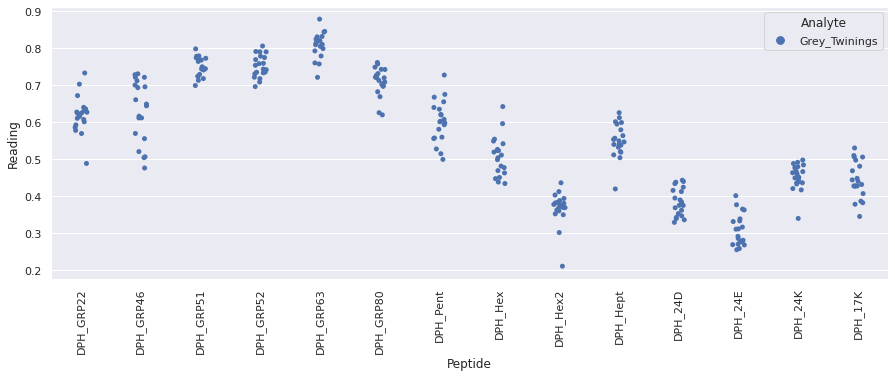

Drawing scatter plot of data spread for Black_Clipper_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

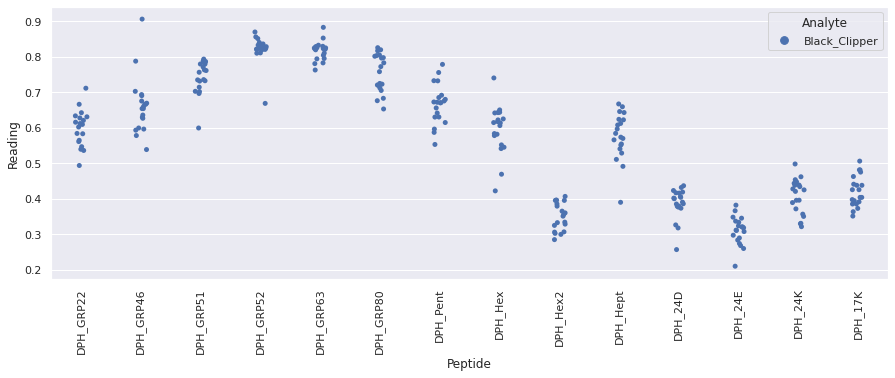

Drawing scatter plot of data spread for Black_Diplomat_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

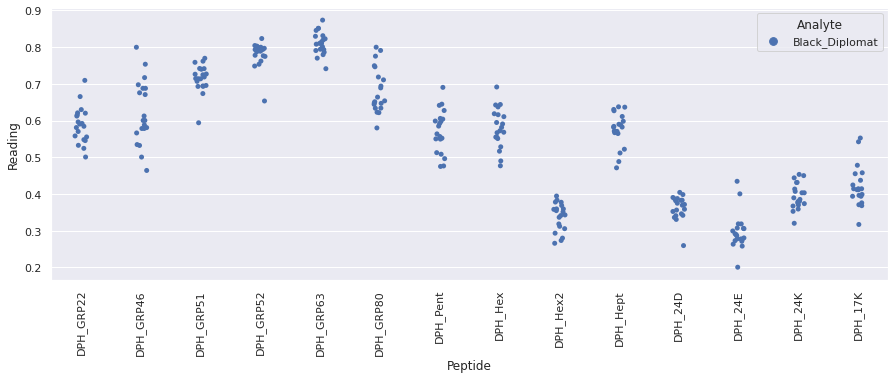

Drawing scatter plot of data spread for Black_Dragonfly_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

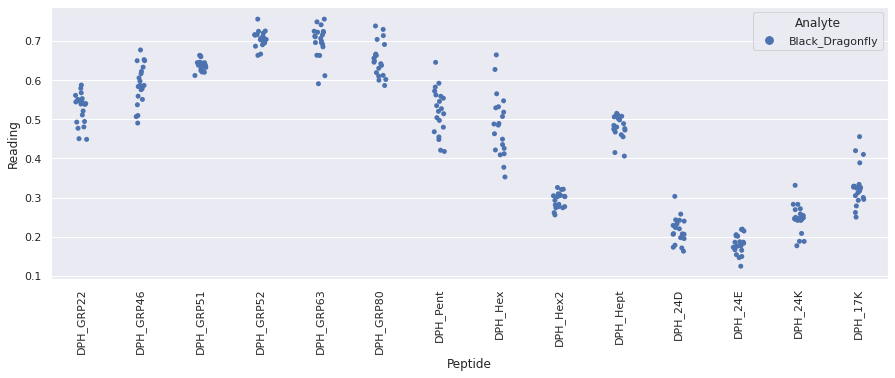

Drawing scatter plot of data spread for Black_Pgtips_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

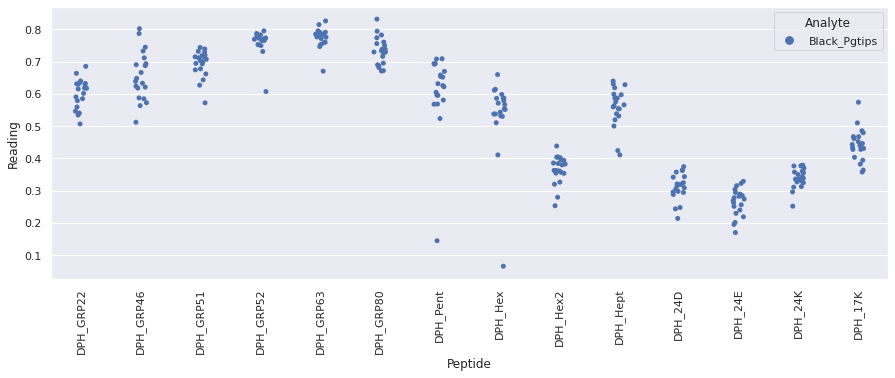

Drawing scatter plot of data spread for Black_Pukka_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

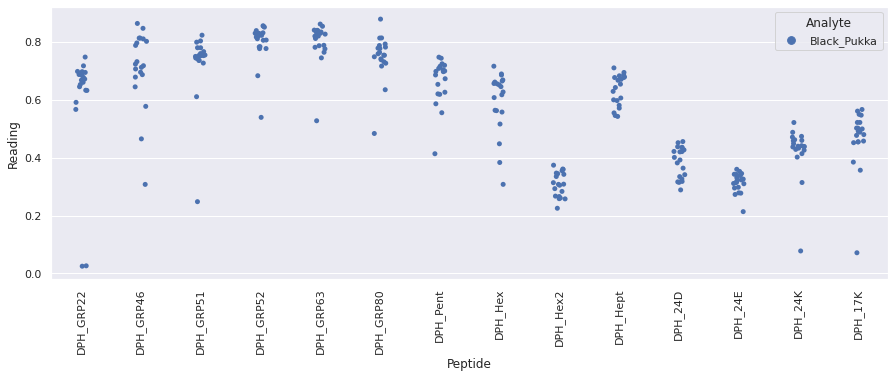

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

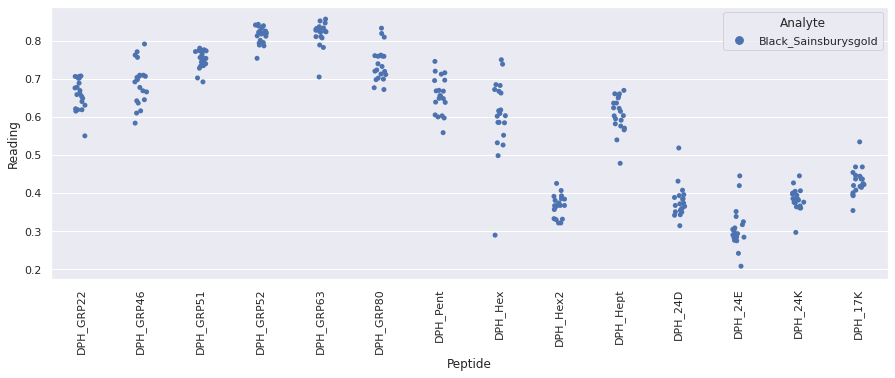

Drawing scatter plot of data spread for Black_Tesco_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

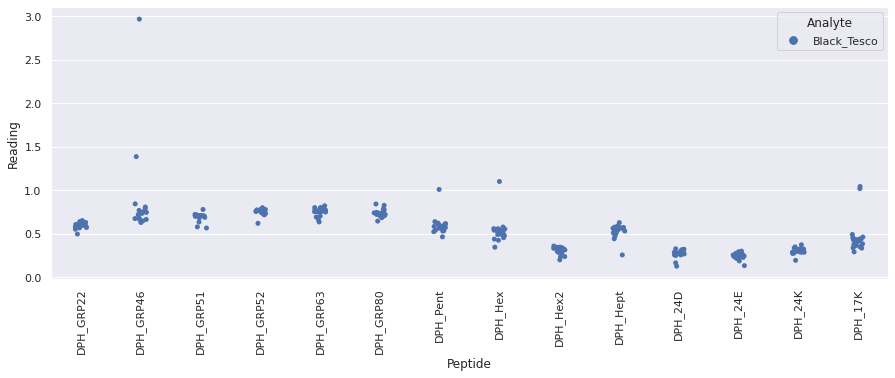

Drawing scatter plot of data spread for Black_Tetley_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

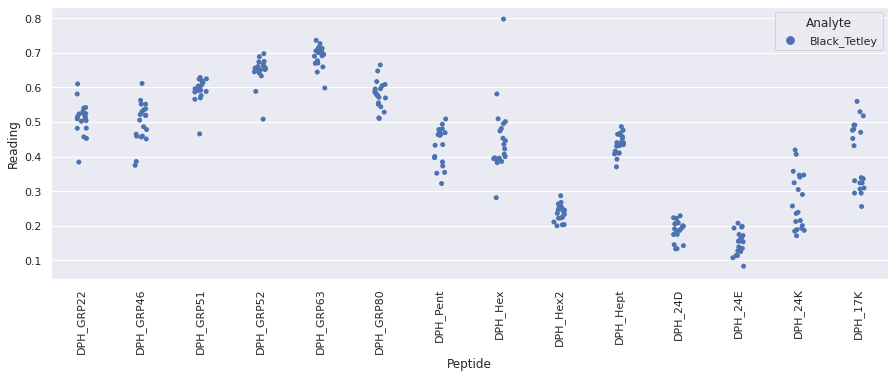

Drawing scatter plot of data spread for Black_Twinings_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

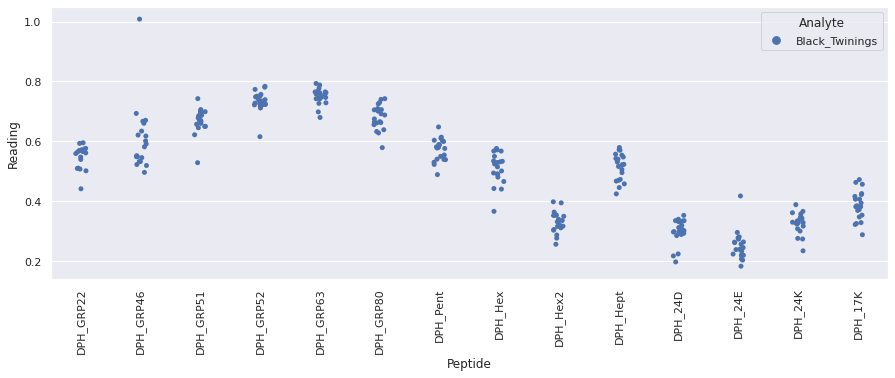

Drawing scatter plot of data spread for Black_Yorkshire_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

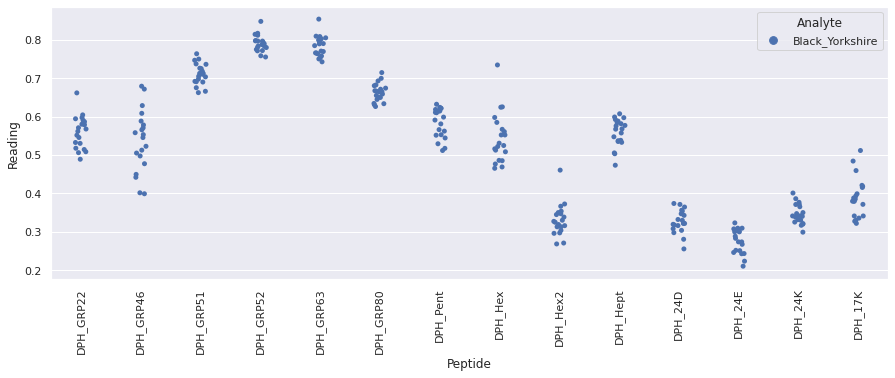

Drawing scatter plot of data spread for Green_Clipper_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

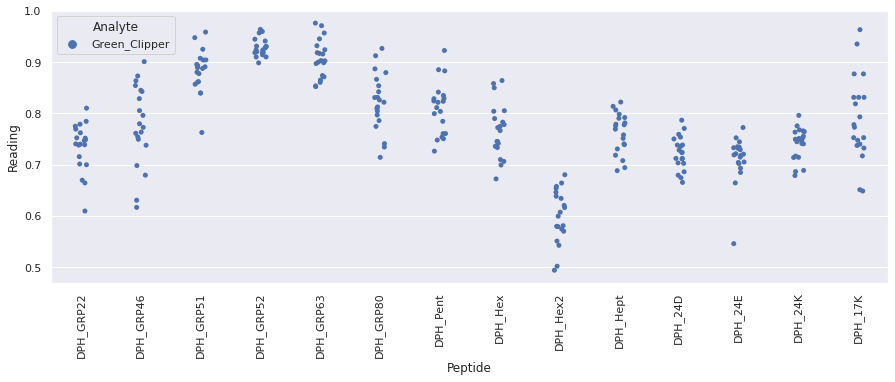

Drawing scatter plot of data spread for Green_Diplomat_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

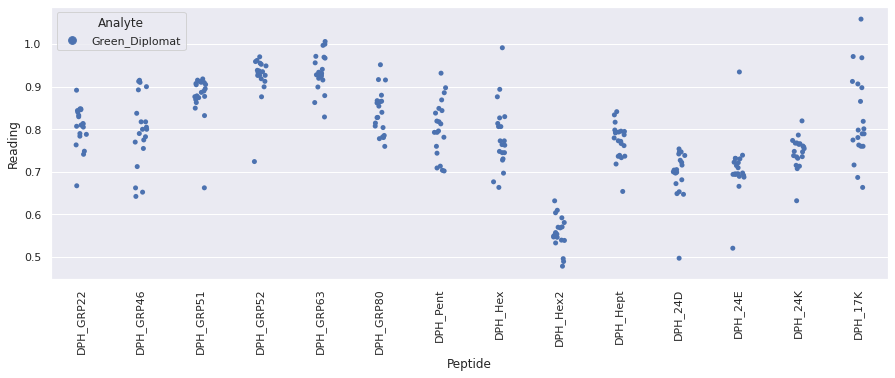

Drawing scatter plot of data spread for Green_Doubledragon_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

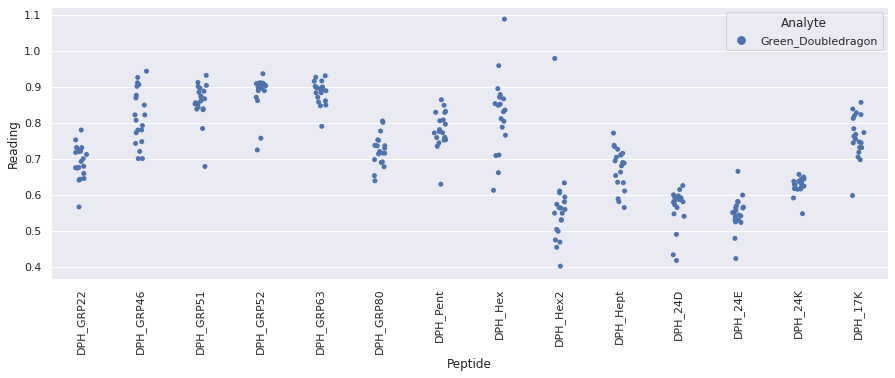

Drawing scatter plot of data spread for Green_Dragonfly_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

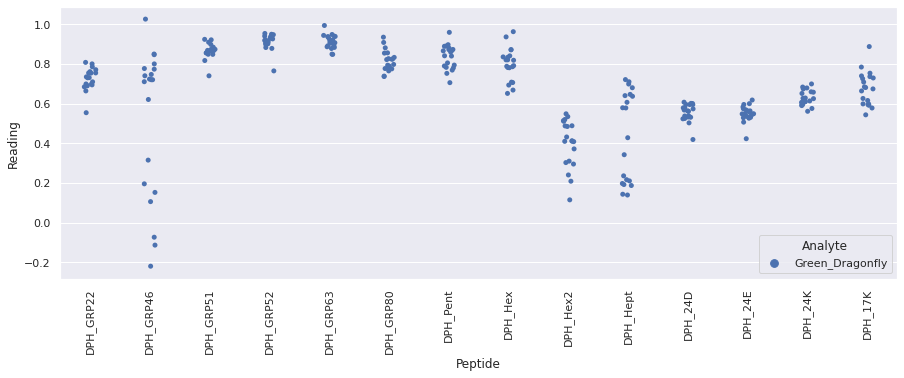

Drawing scatter plot of data spread for Green_Handb_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

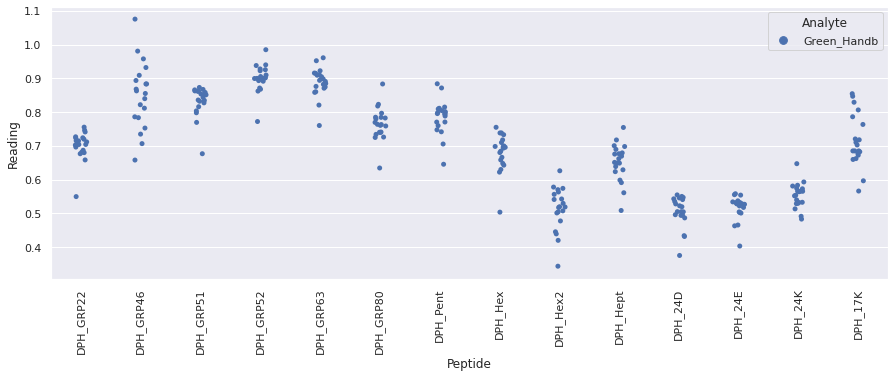

Drawing scatter plot of data spread for Green_Joes_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

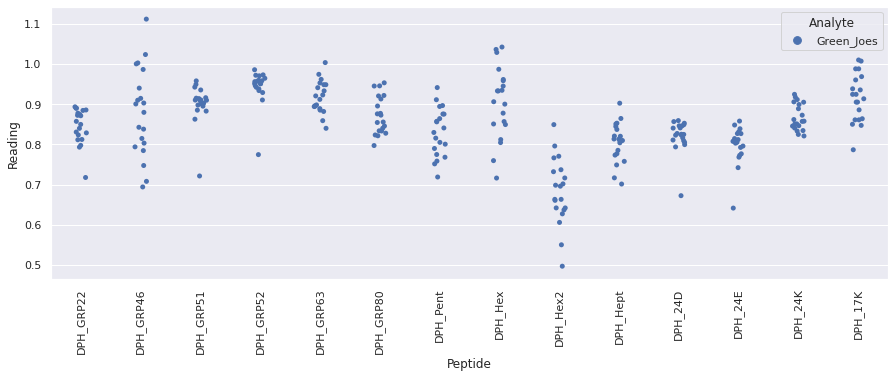

Drawing scatter plot of data spread for Green_Qi_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

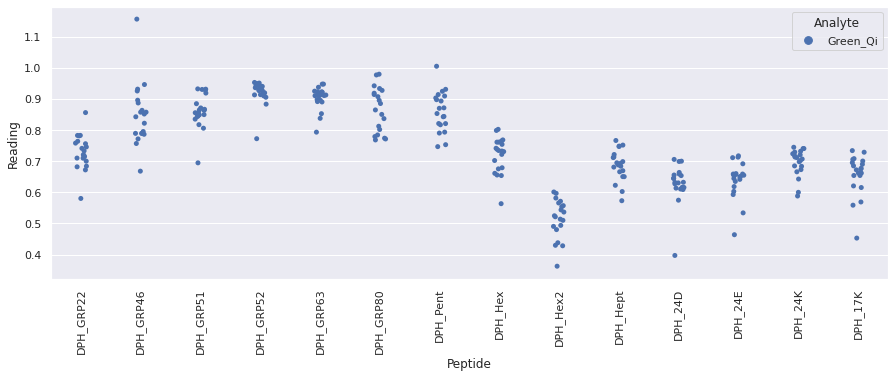

Drawing scatter plot of data spread for Green_Sainsburys_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

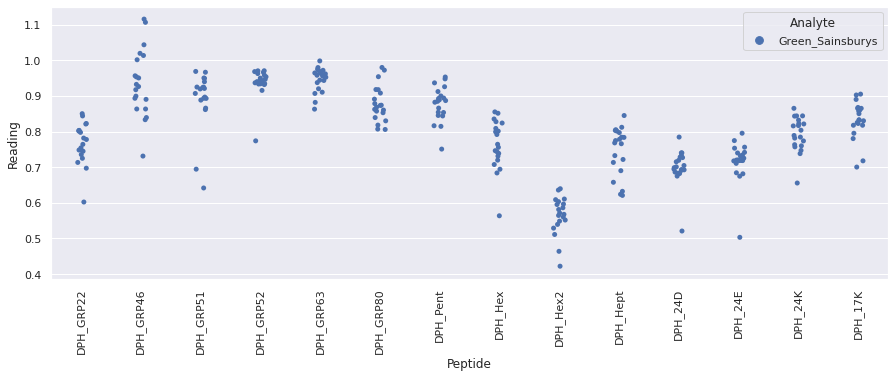

Drawing scatter plot of data spread for Green_Tetley_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

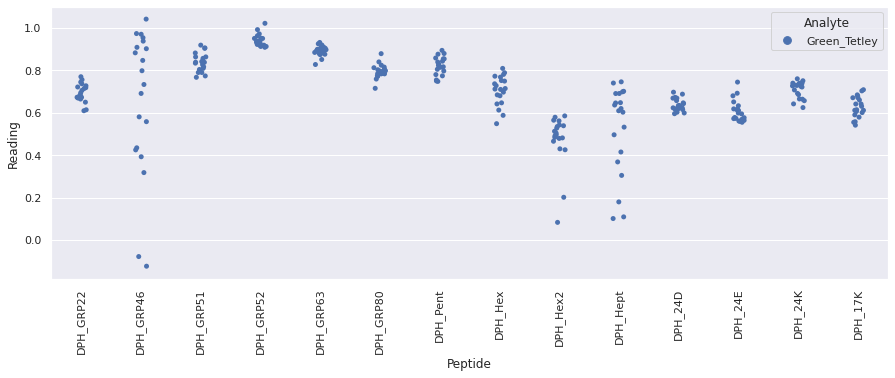

Drawing scatter plot of data spread for Green_Twinings_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

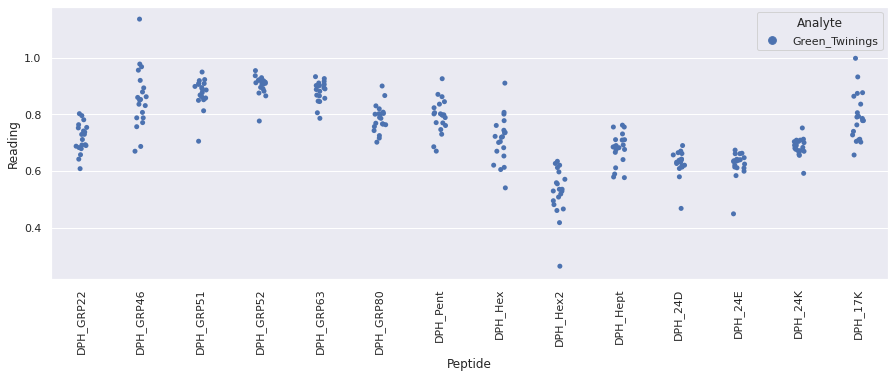

Drawing scatter plot of data spread for Grey_Asda_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

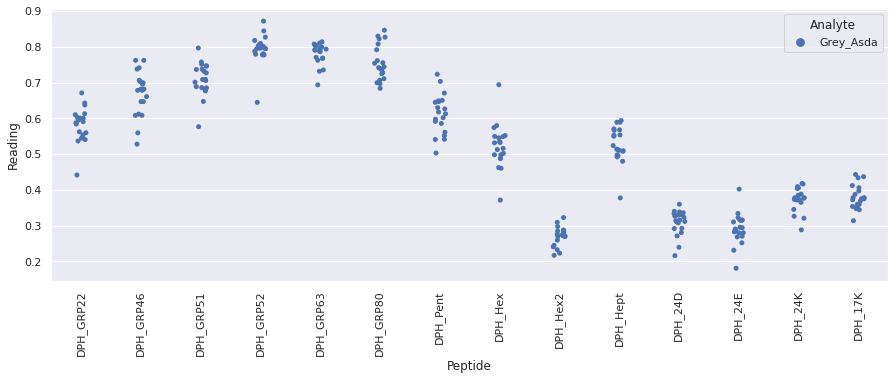

Drawing scatter plot of data spread for Grey_Clipper_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

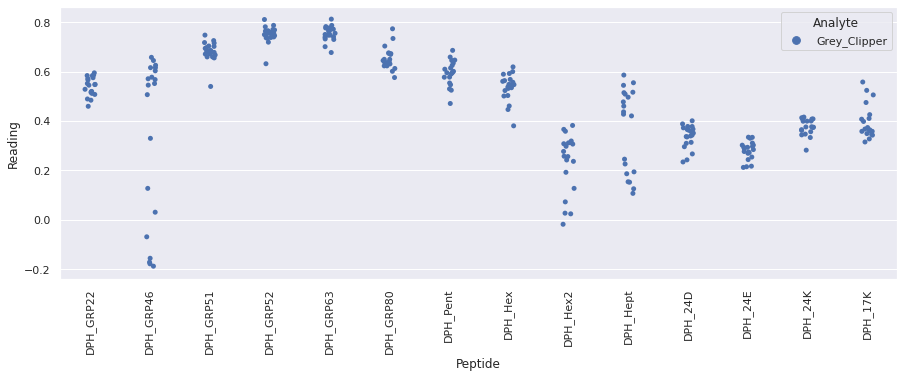

Drawing scatter plot of data spread for Grey_Coop_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

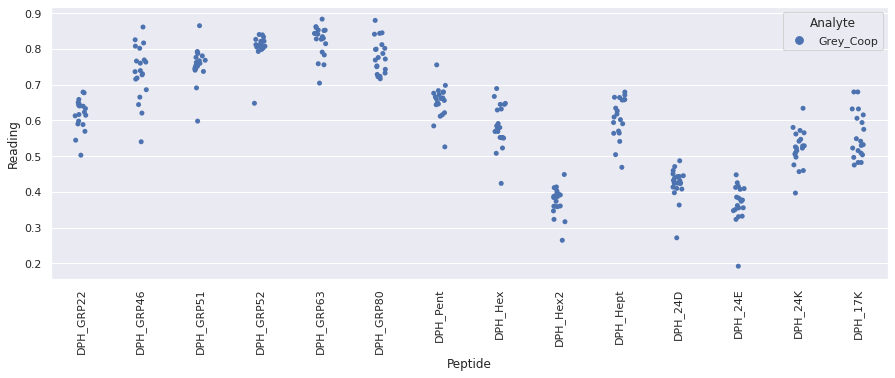

Drawing scatter plot of data spread for Grey_Devonshire_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

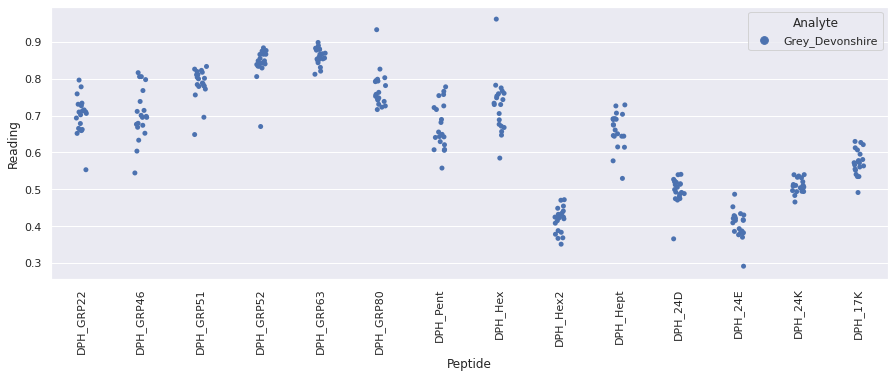

Drawing scatter plot of data spread for Grey_Diplomat_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

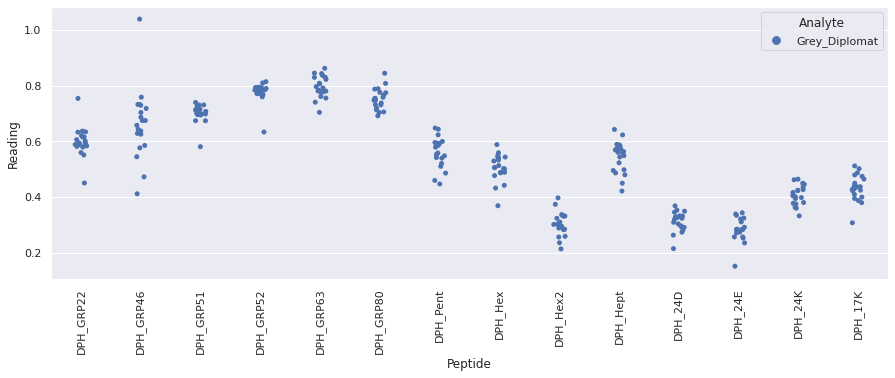

Drawing scatter plot of data spread for Grey_Joes_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

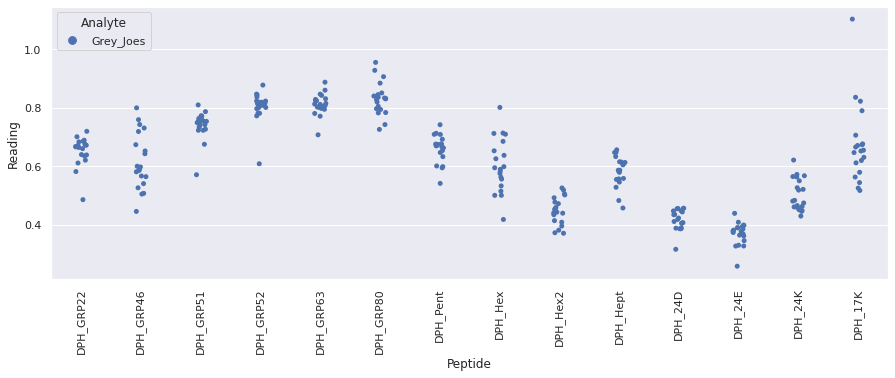

Drawing scatter plot of data spread for Grey_Mands_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

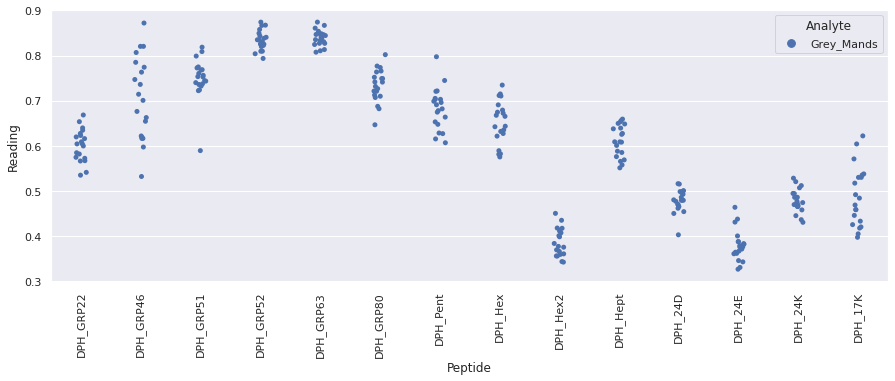

Drawing scatter plot of data spread for Grey_Pukka_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

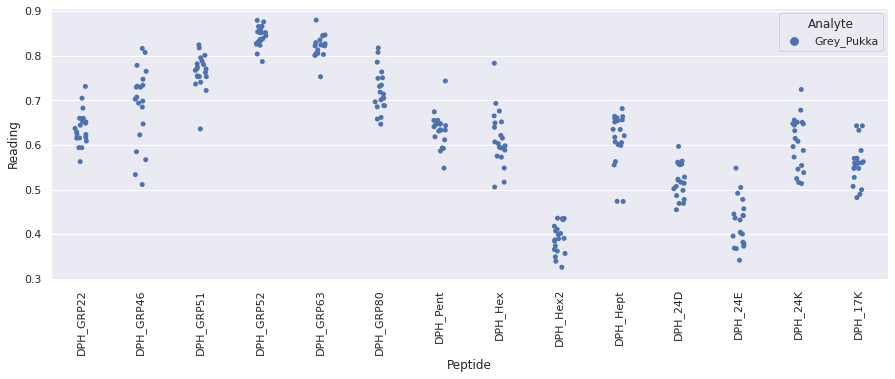

Drawing scatter plot of data spread for Grey_Tesco_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

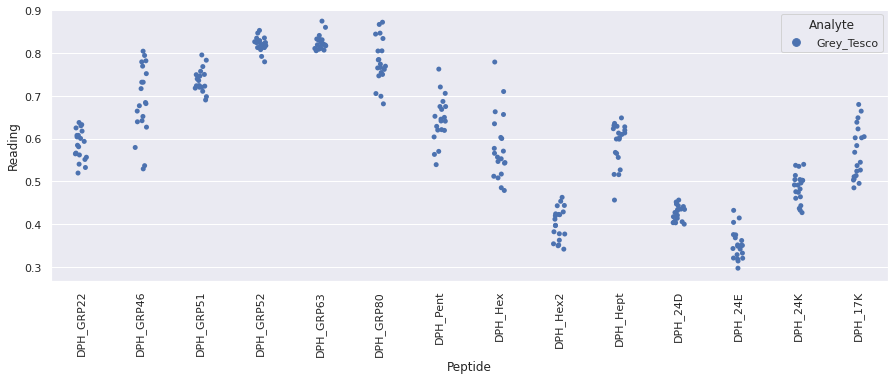

Drawing scatter plot of data spread for Grey_Twinings_repeat_2 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

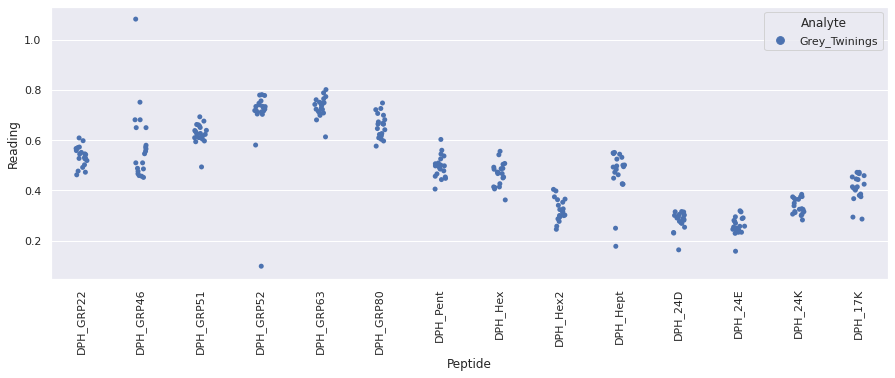

Drawing scatter plot of data spread for Black_Clipper_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

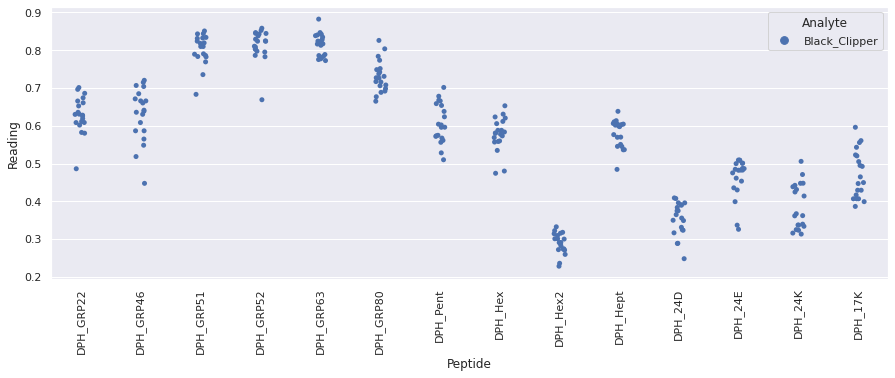

Drawing scatter plot of data spread for Black_Diplomat_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

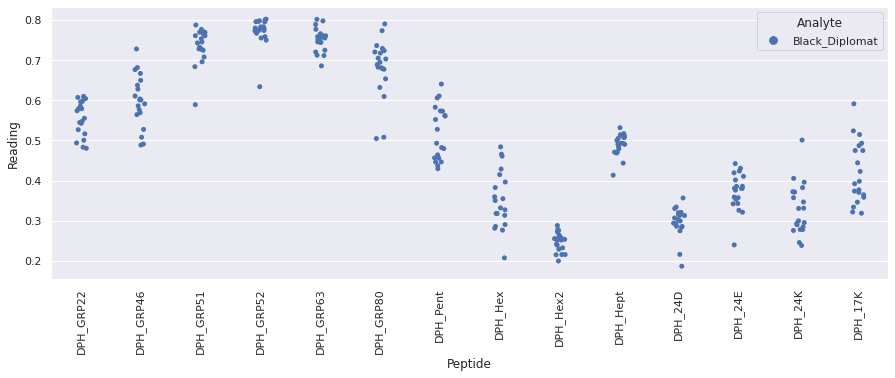

Drawing scatter plot of data spread for Black_Dragonfly_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

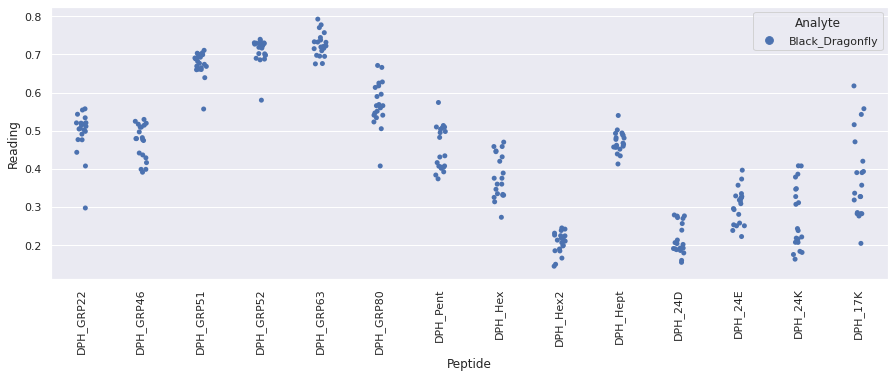

Drawing scatter plot of data spread for Black_Pgtips_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

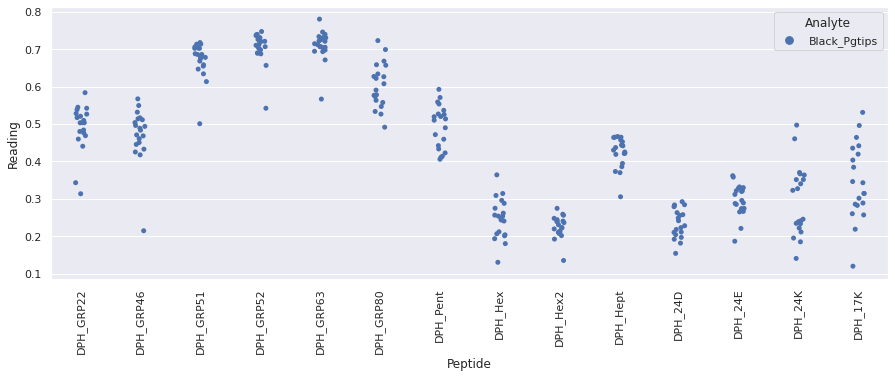

Drawing scatter plot of data spread for Black_Pukka_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

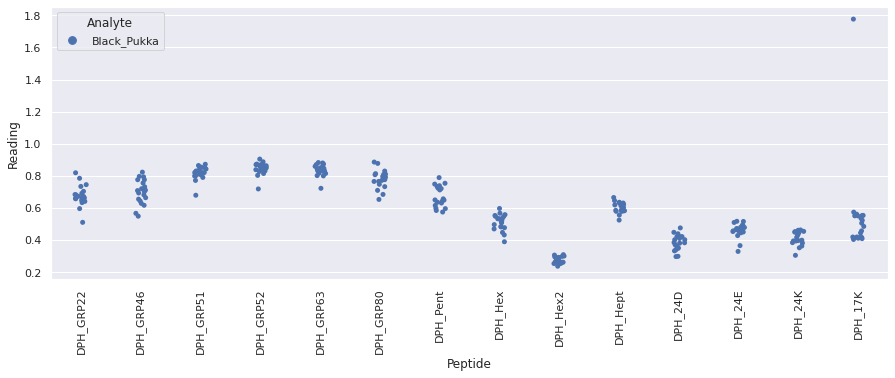

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

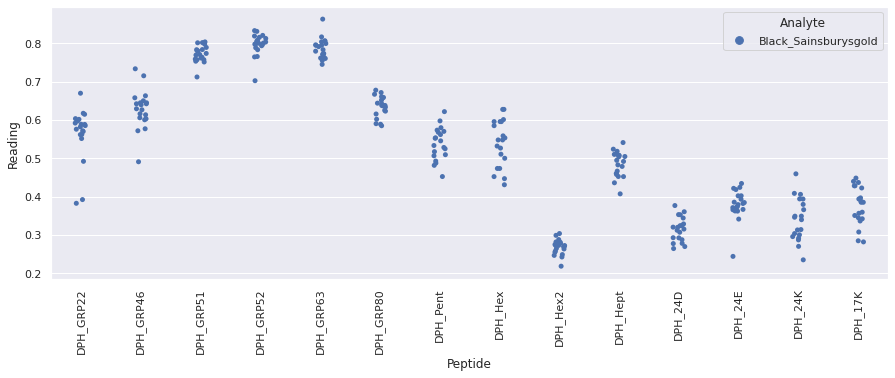

Drawing scatter plot of data spread for Black_Tesco_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

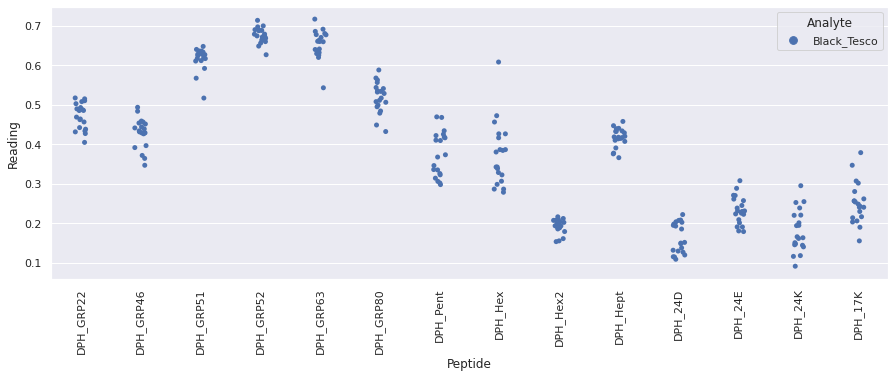

Drawing scatter plot of data spread for Black_Tetley_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

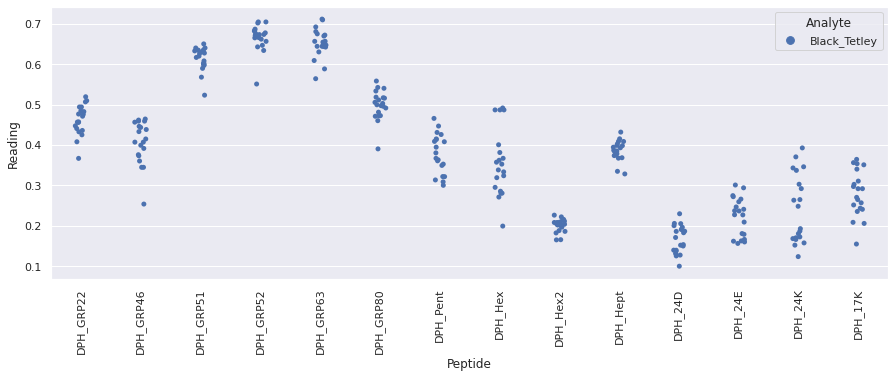

Drawing scatter plot of data spread for Black_Twinings_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

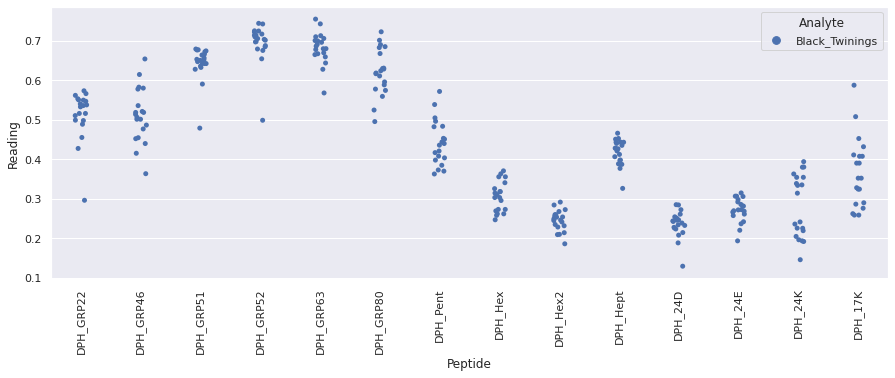

Drawing scatter plot of data spread for Black_Yorkshire_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

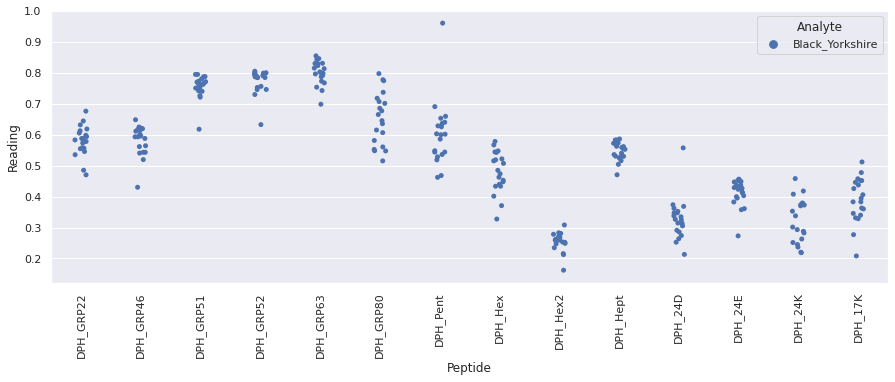

Drawing scatter plot of data spread for Green_Clipper_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

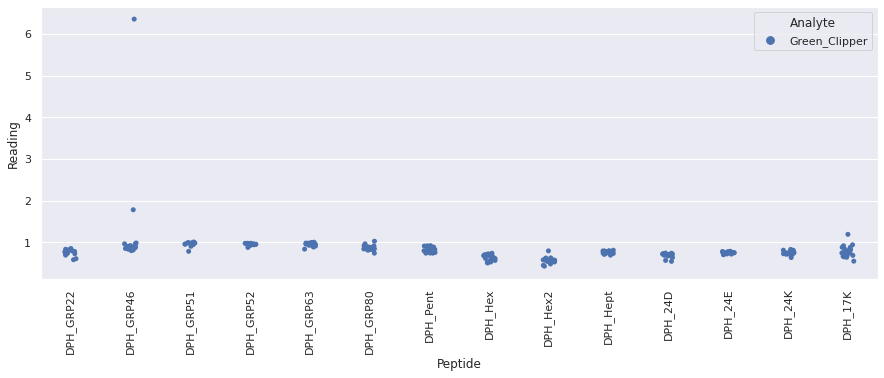

Drawing scatter plot of data spread for Green_Diplomat_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

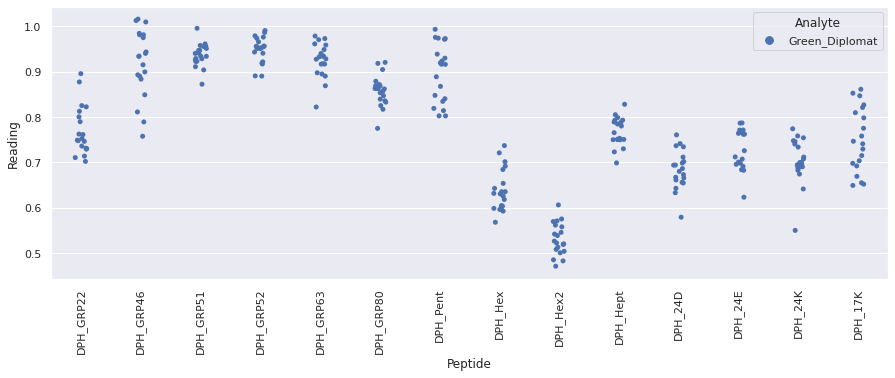

Drawing scatter plot of data spread for Green_Doubledragon_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

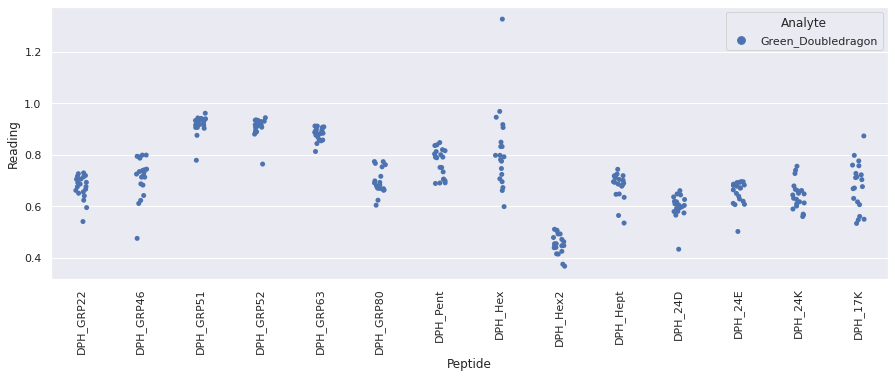

Drawing scatter plot of data spread for Green_Dragonfly_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

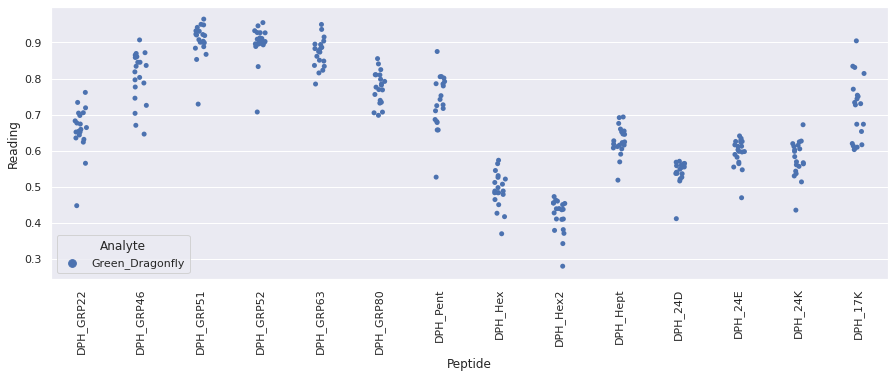

Drawing scatter plot of data spread for Green_Handb_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

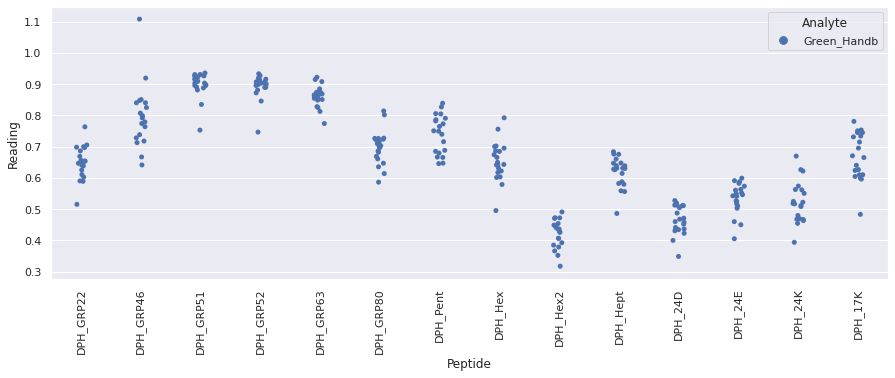

Drawing scatter plot of data spread for Green_Joes_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

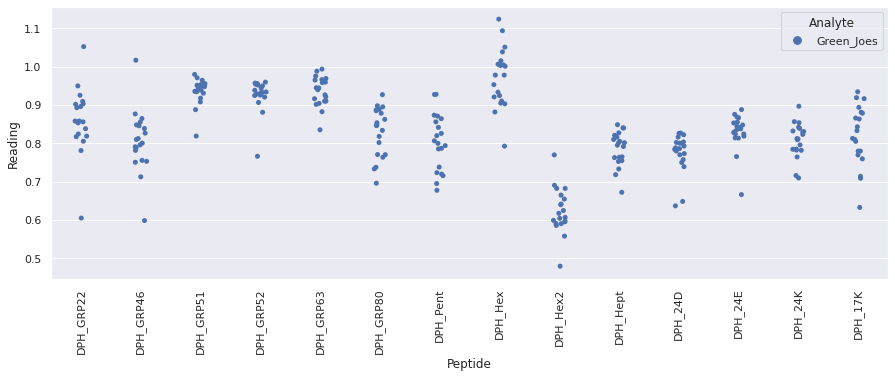

Drawing scatter plot of data spread for Green_Qi_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

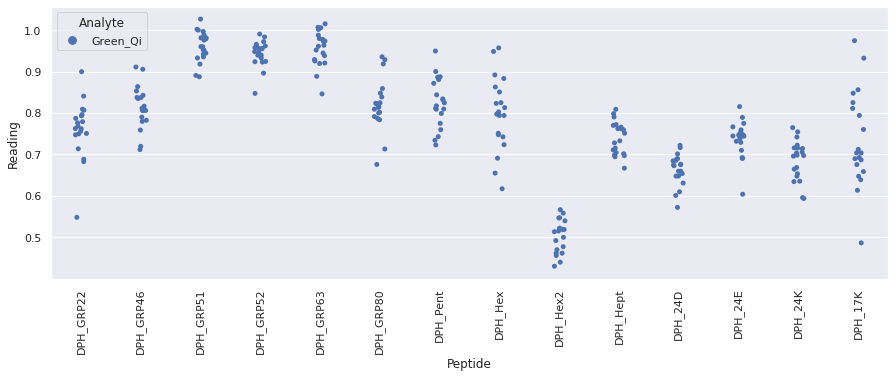

Drawing scatter plot of data spread for Green_Sainsburys_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

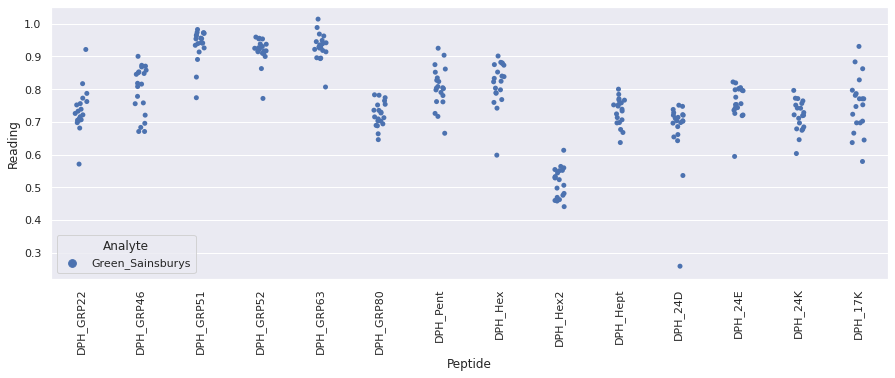

Drawing scatter plot of data spread for Green_Tetley_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

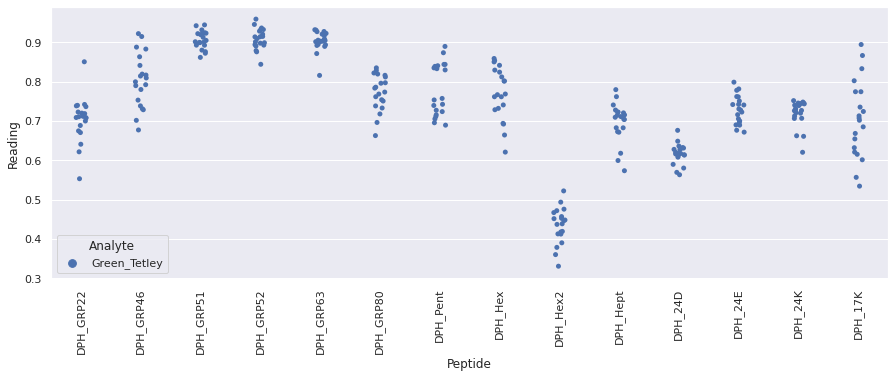

Drawing scatter plot of data spread for Green_Twinings_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

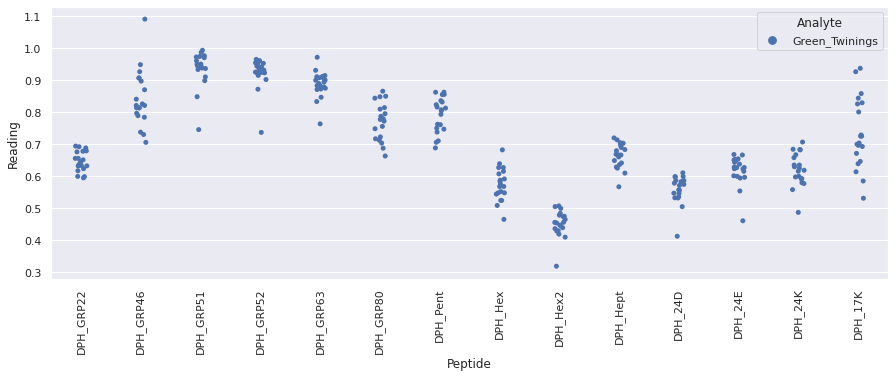

Drawing scatter plot of data spread for Grey_Asda_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

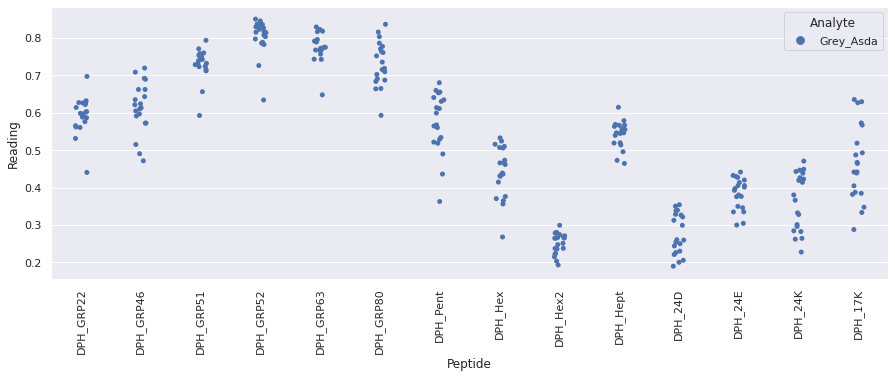

Drawing scatter plot of data spread for Grey_Clipper_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

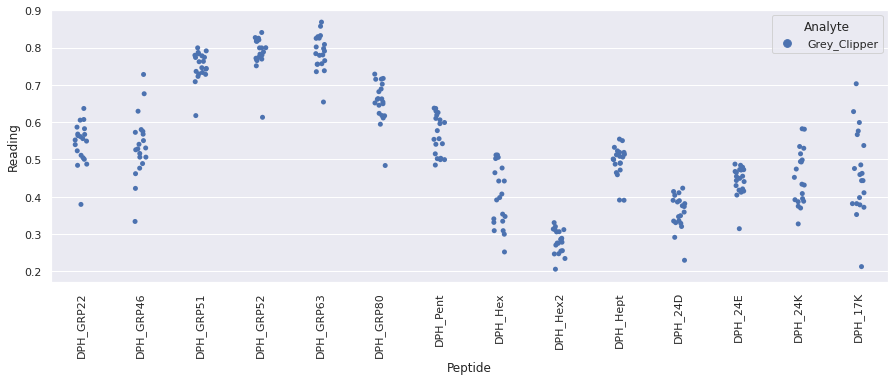

Drawing scatter plot of data spread for Grey_Coop_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

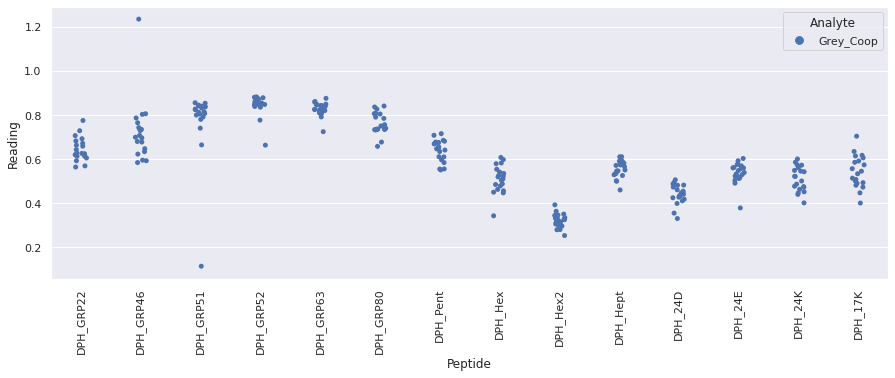

Drawing scatter plot of data spread for Grey_Devonshire_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

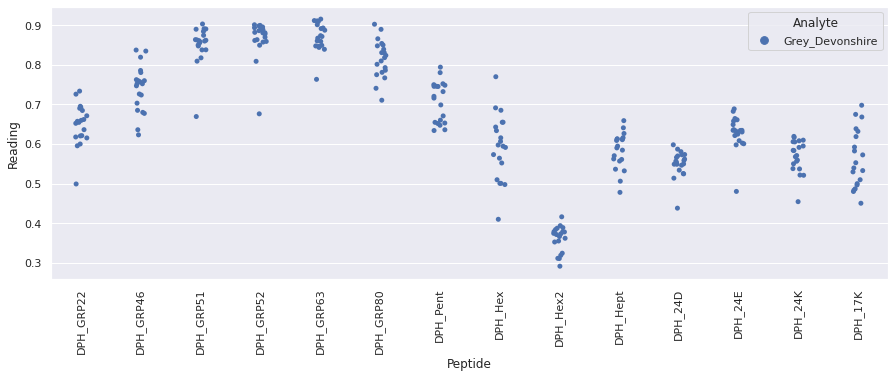

Drawing scatter plot of data spread for Grey_Diplomat_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

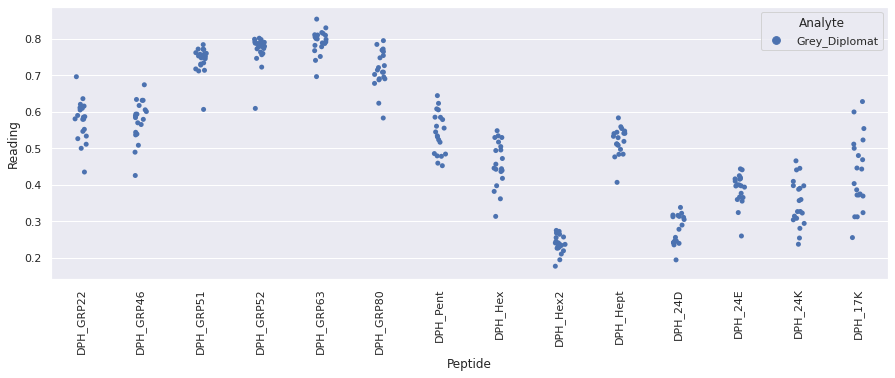

Drawing scatter plot of data spread for Grey_Joes_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

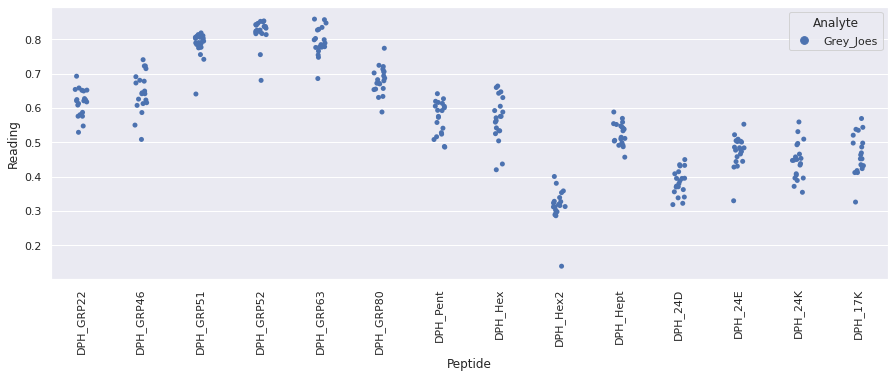

Drawing scatter plot of data spread for Grey_Mands_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

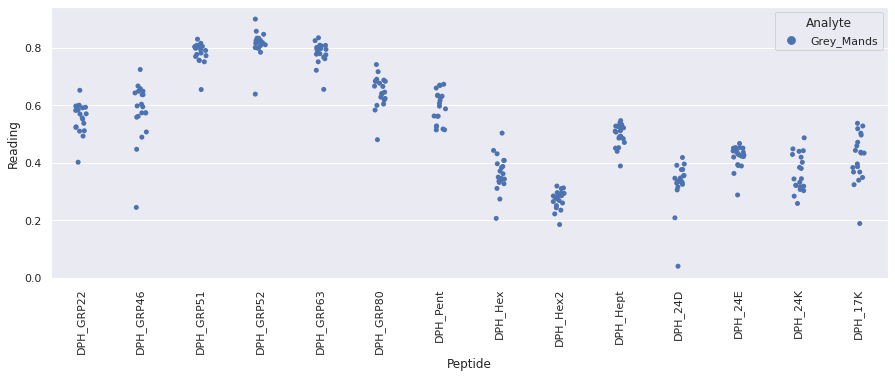

Drawing scatter plot of data spread for Grey_Pukka_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

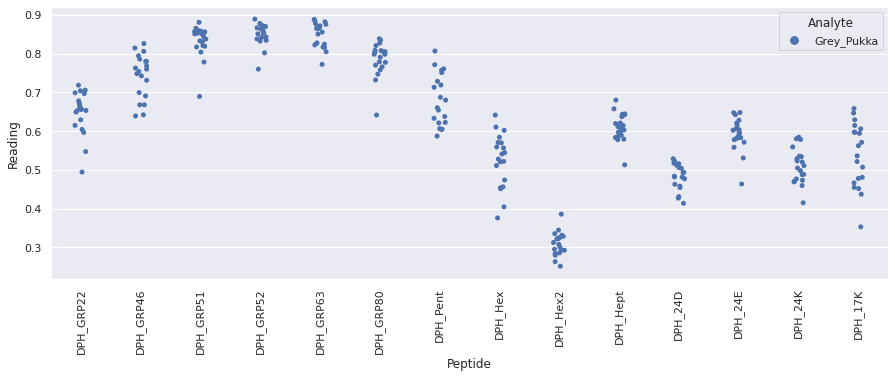

Drawing scatter plot of data spread for Grey_Tesco_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

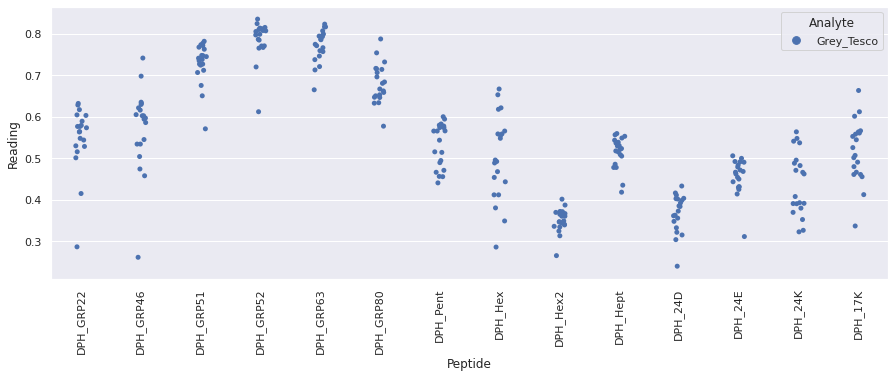

Drawing scatter plot of data spread for Grey_Twinings_repeat_3 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

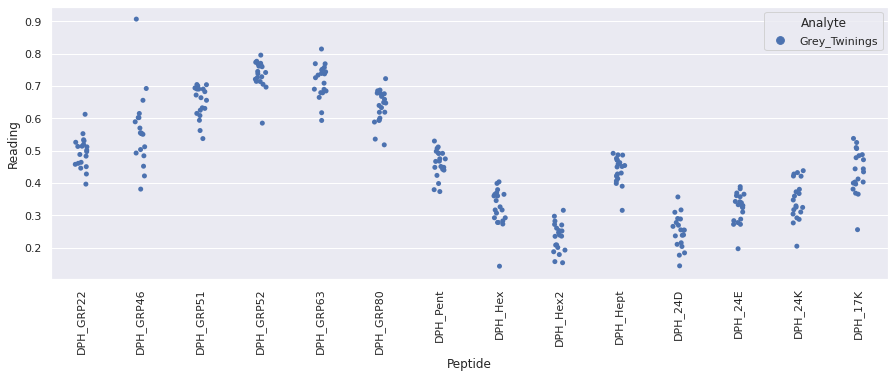

Drawing scatter plot of data spread for Black_Clipper_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

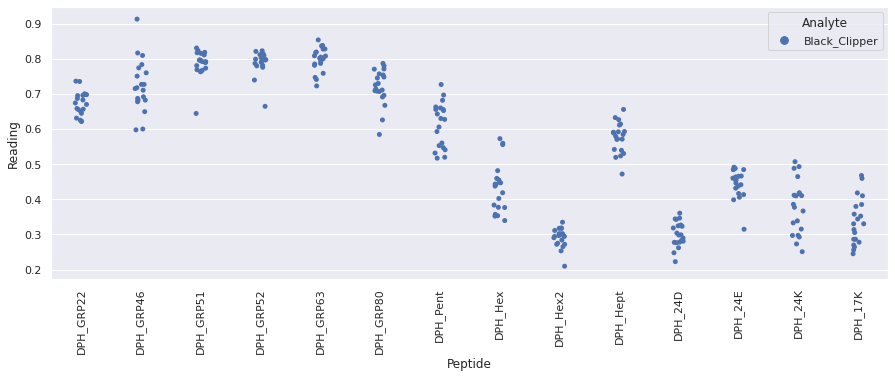

Drawing scatter plot of data spread for Black_Diplomat_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

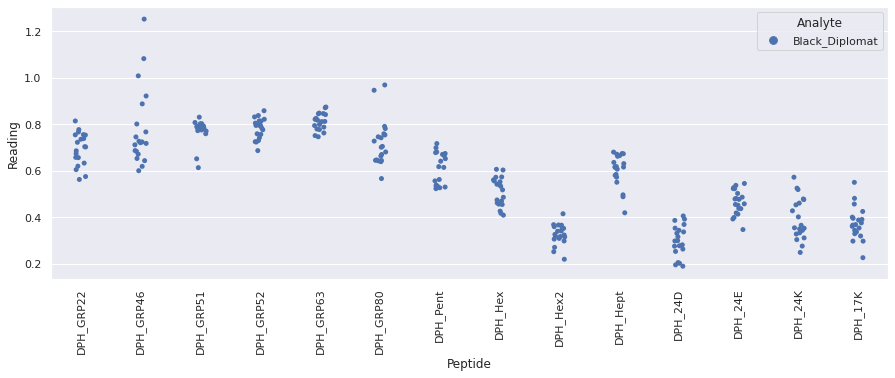

Drawing scatter plot of data spread for Black_Dragonfly_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

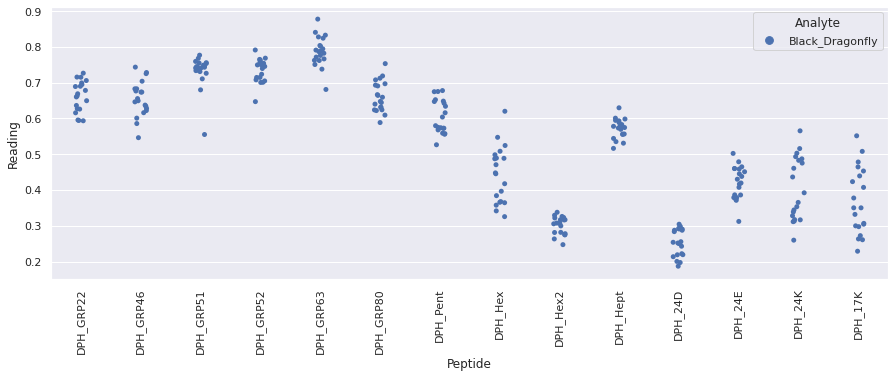

Drawing scatter plot of data spread for Black_Pgtips_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

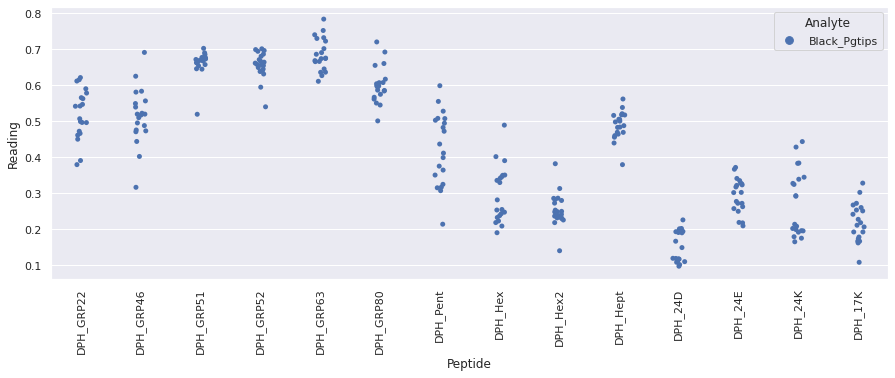

Drawing scatter plot of data spread for Black_Pukka_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

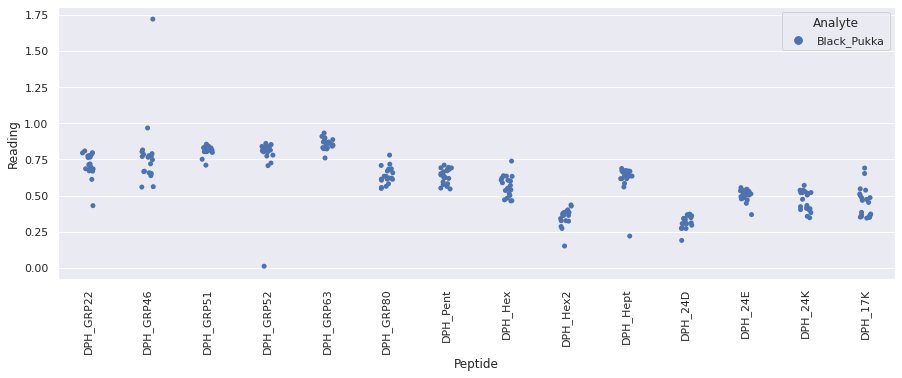

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

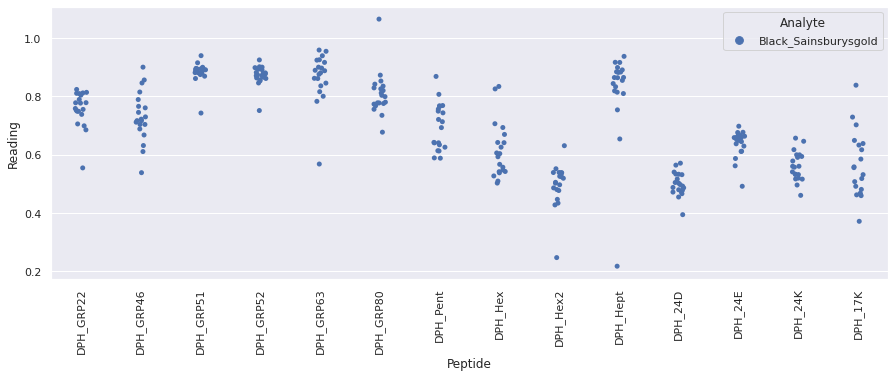

Drawing scatter plot of data spread for Black_Tesco_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

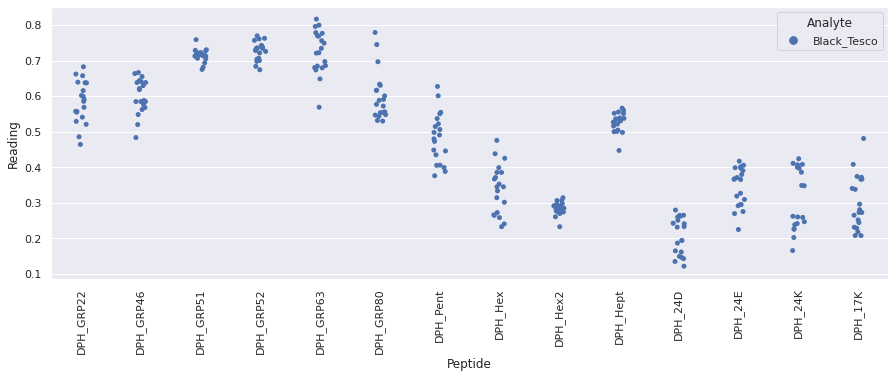

Drawing scatter plot of data spread for Black_Tetley_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

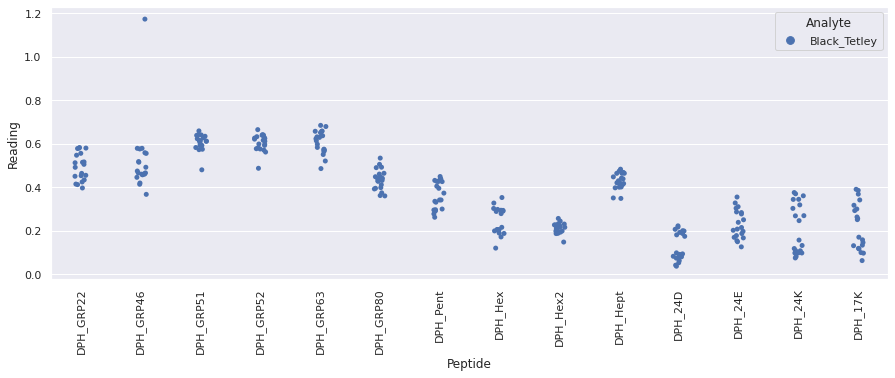

Drawing scatter plot of data spread for Black_Twinings_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

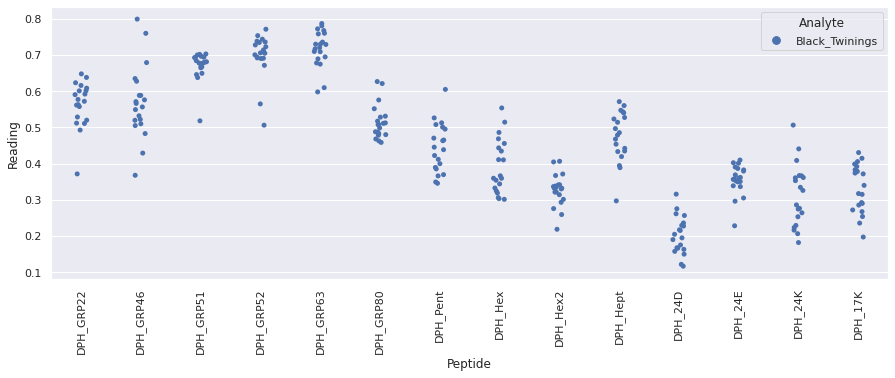

Drawing scatter plot of data spread for Black_Yorkshire_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

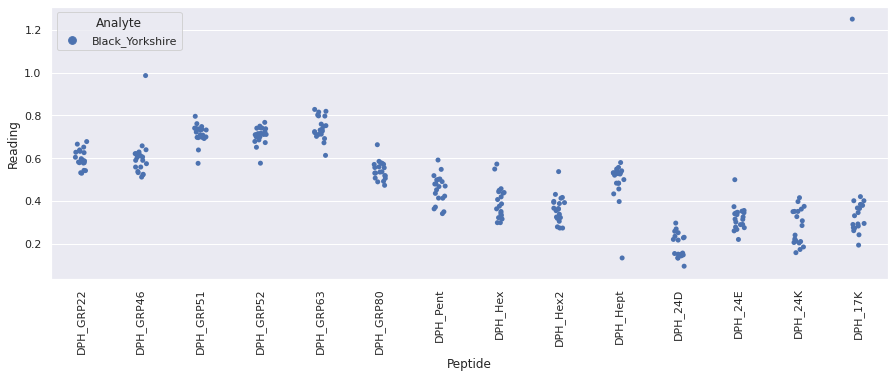

Drawing scatter plot of data spread for Green_Clipper_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

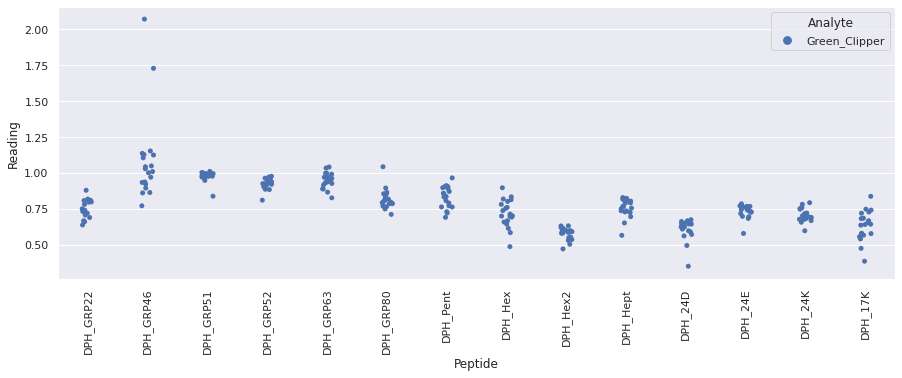

Drawing scatter plot of data spread for Green_Diplomat_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

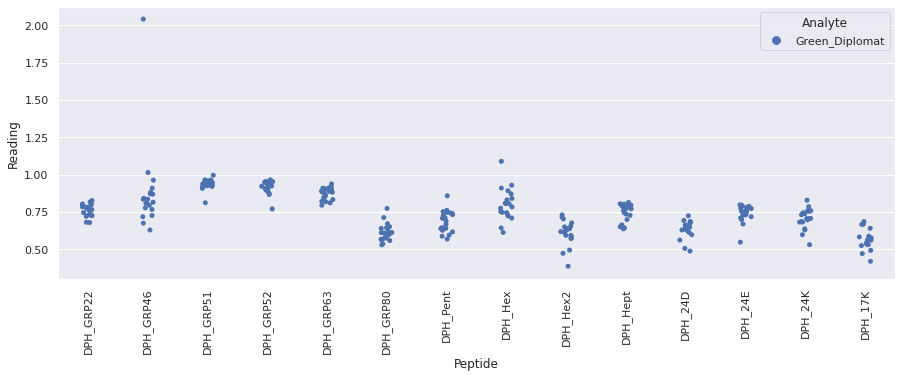

Drawing scatter plot of data spread for Green_Doubledragon_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

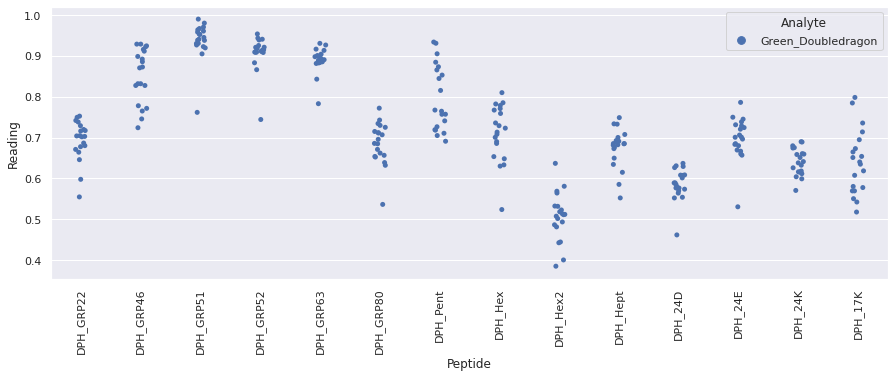

Drawing scatter plot of data spread for Green_Dragonfly_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

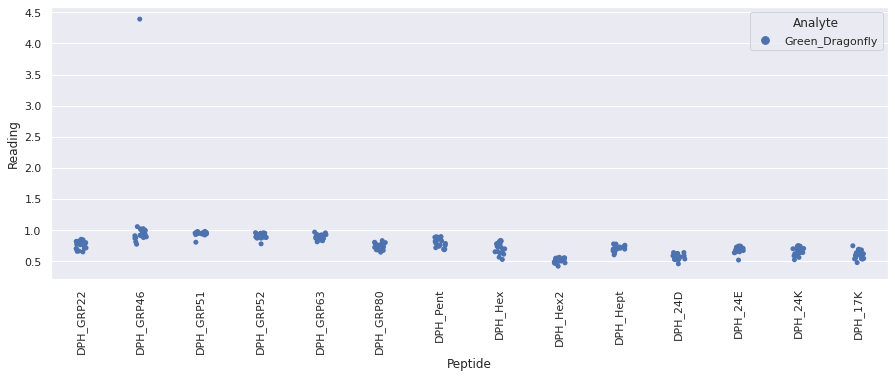

Drawing scatter plot of data spread for Green_Handb_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

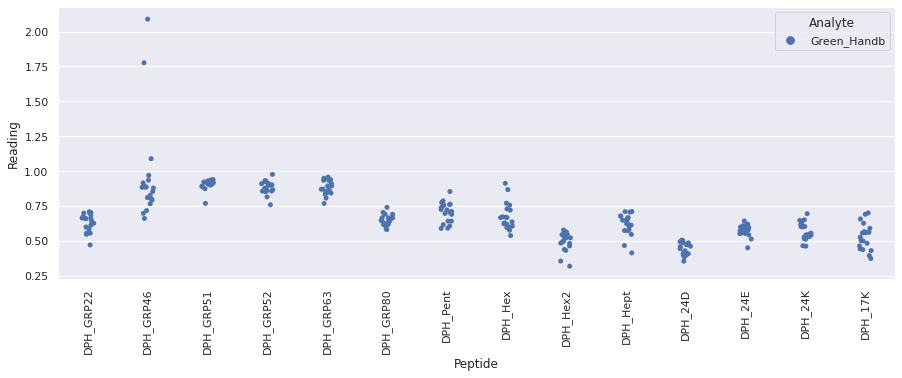

Drawing scatter plot of data spread for Green_Joes_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

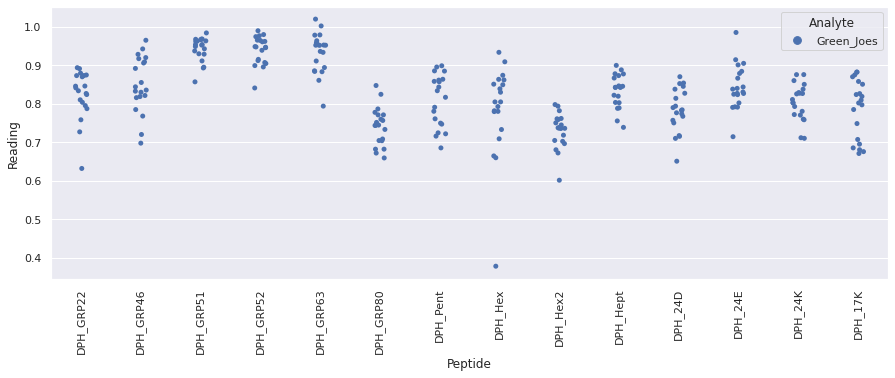

Drawing scatter plot of data spread for Green_Qi_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

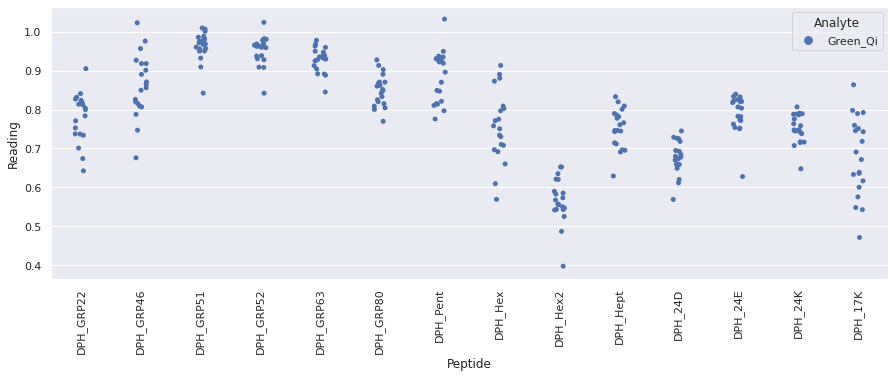

Drawing scatter plot of data spread for Green_Sainsburys_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

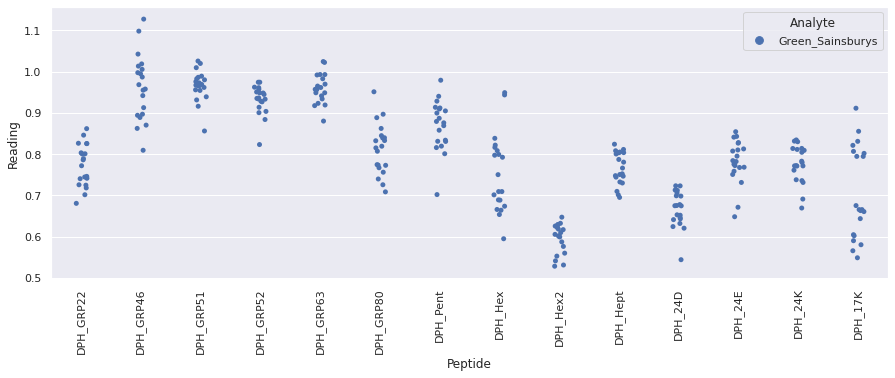

Drawing scatter plot of data spread for Green_Tetley_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

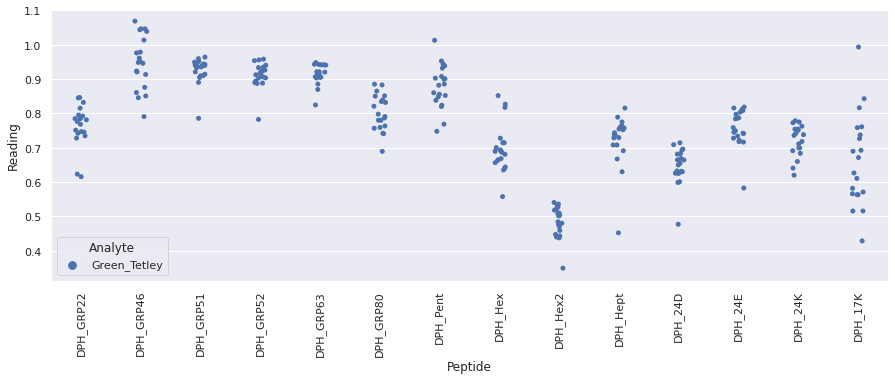

Drawing scatter plot of data spread for Green_Twinings_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

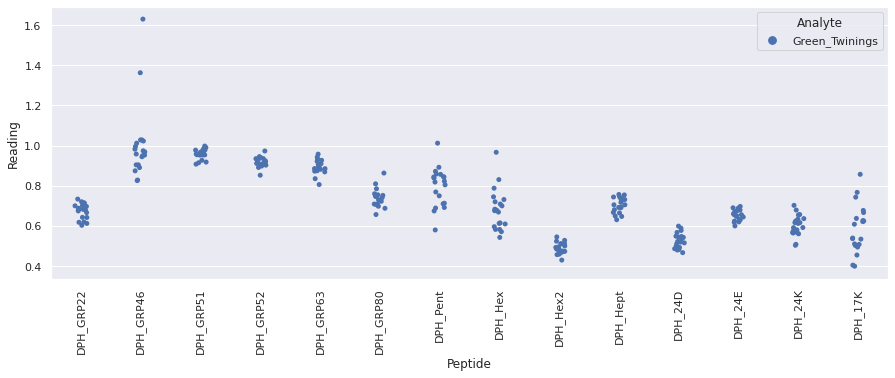

Drawing scatter plot of data spread for Grey_Asda_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

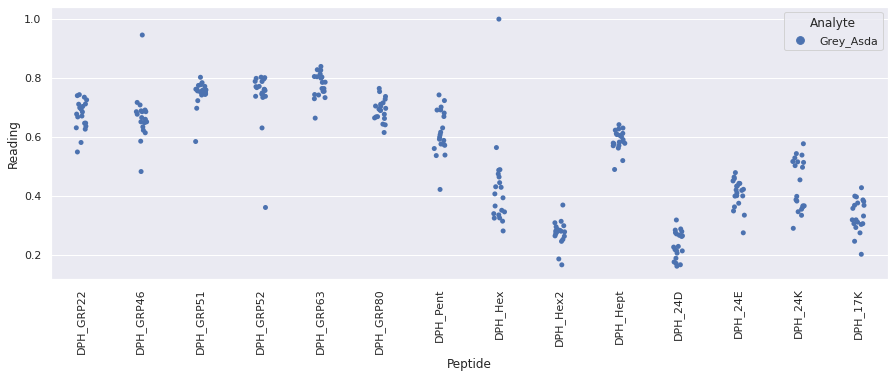

Drawing scatter plot of data spread for Grey_Clipper_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

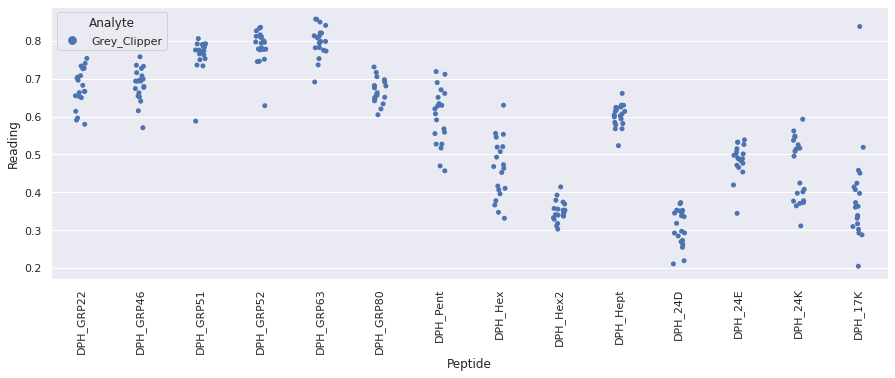

Drawing scatter plot of data spread for Grey_Coop_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

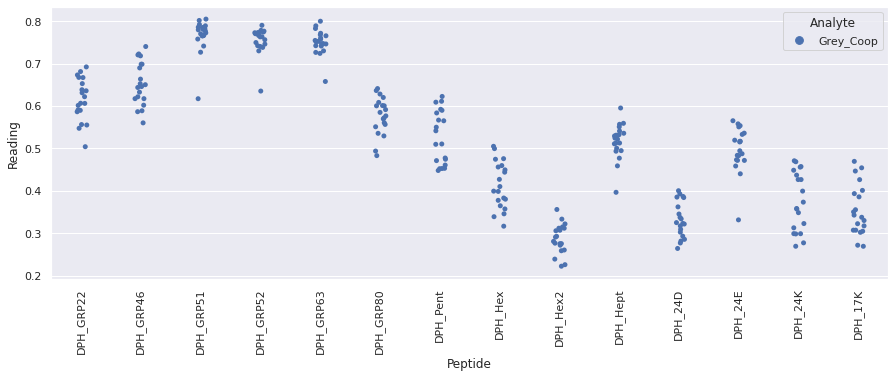

Drawing scatter plot of data spread for Grey_Devonshire_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

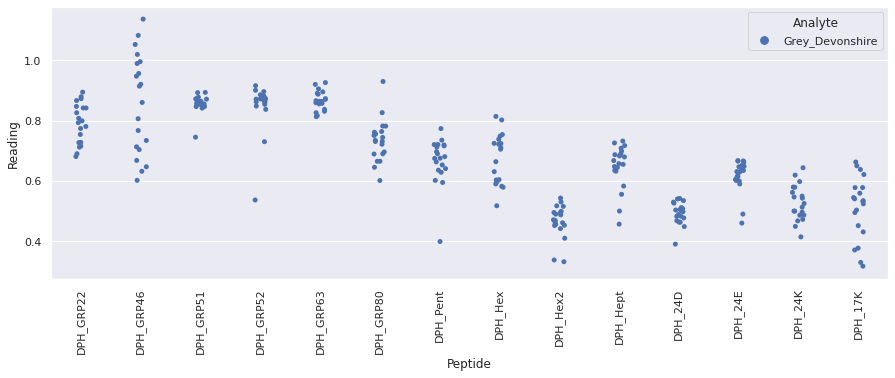

Drawing scatter plot of data spread for Grey_Diplomat_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

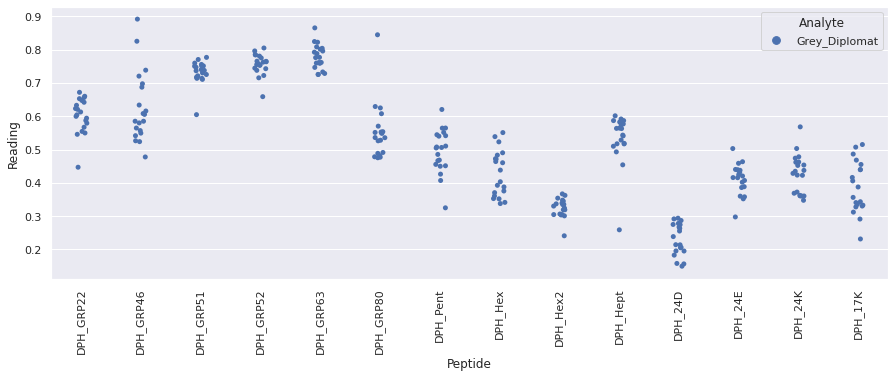

Drawing scatter plot of data spread for Grey_Joes_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

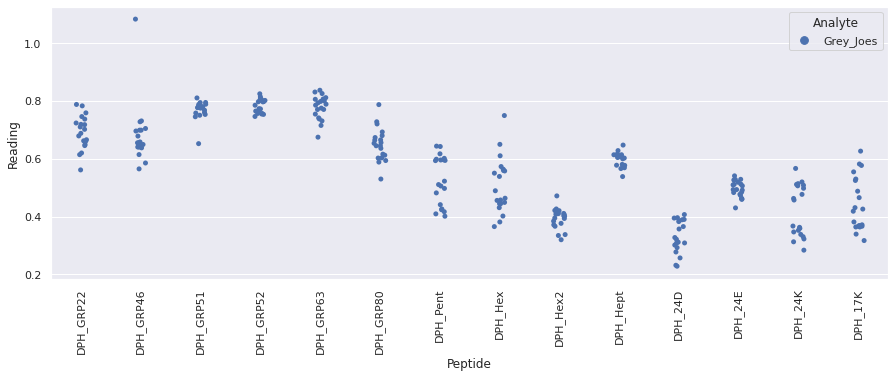

Drawing scatter plot of data spread for Grey_Mands_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

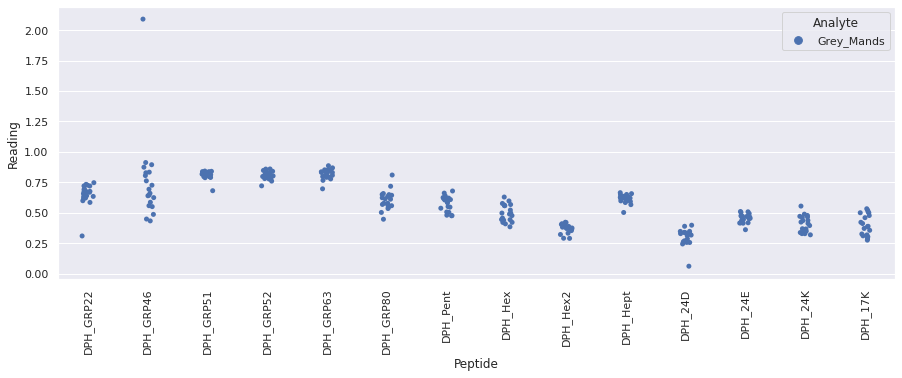

Drawing scatter plot of data spread for Grey_Pukka_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

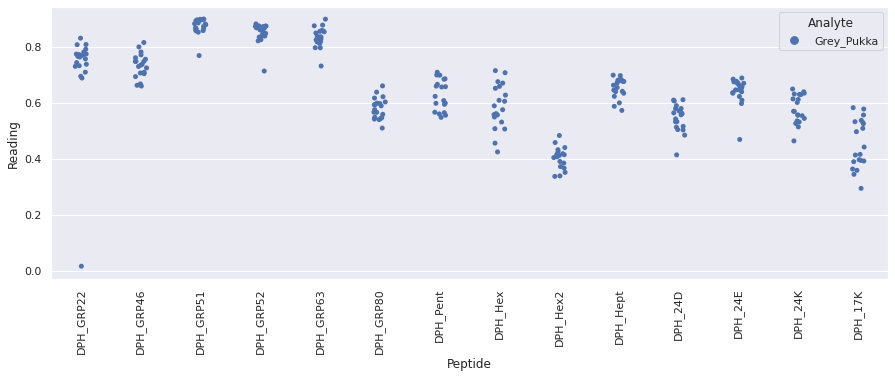

Drawing scatter plot of data spread for Grey_Tesco_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

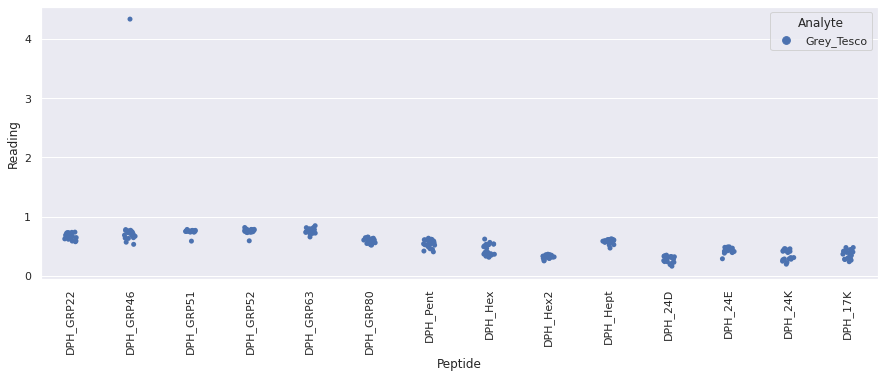

Drawing scatter plot of data spread for Grey_Twinings_repeat_4 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

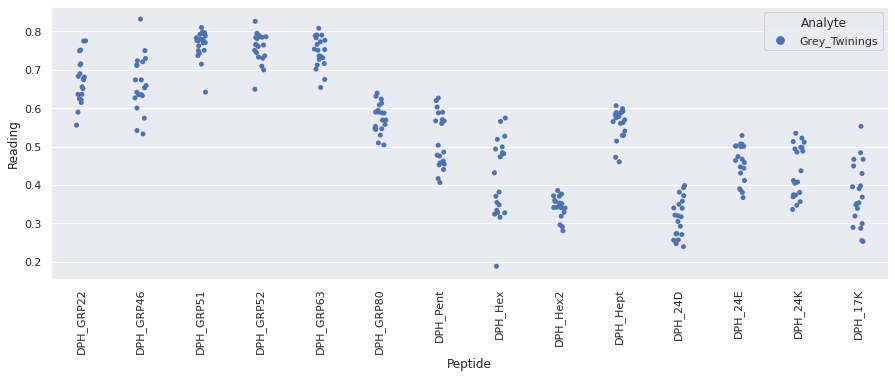

Drawing scatter plot of data spread for Black_Clipper_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

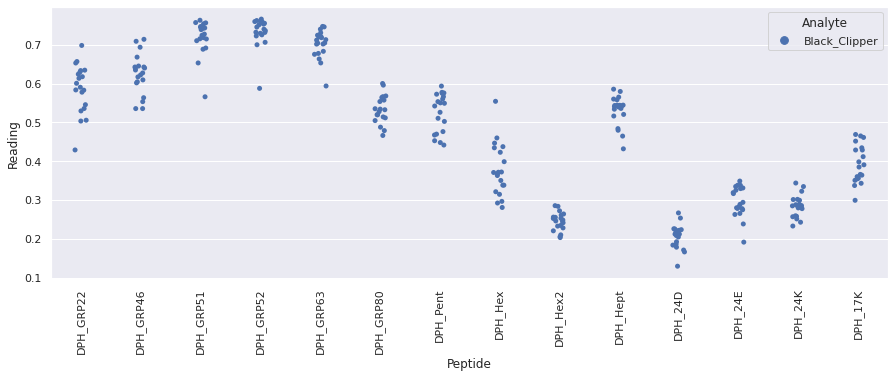

Drawing scatter plot of data spread for Black_Diplomat_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

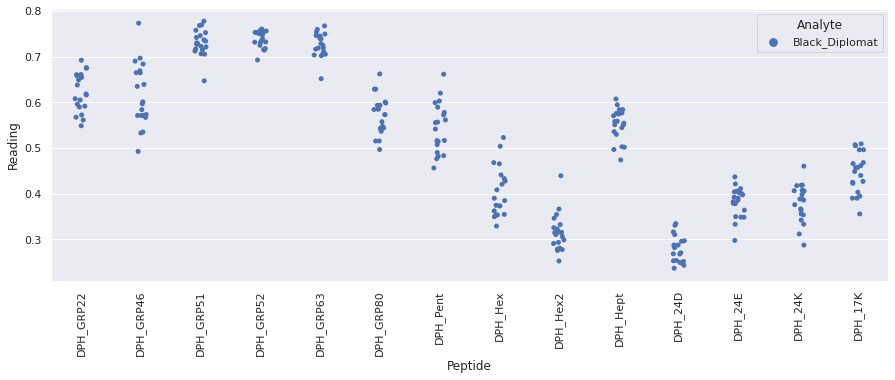

Drawing scatter plot of data spread for Black_Dragonfly_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

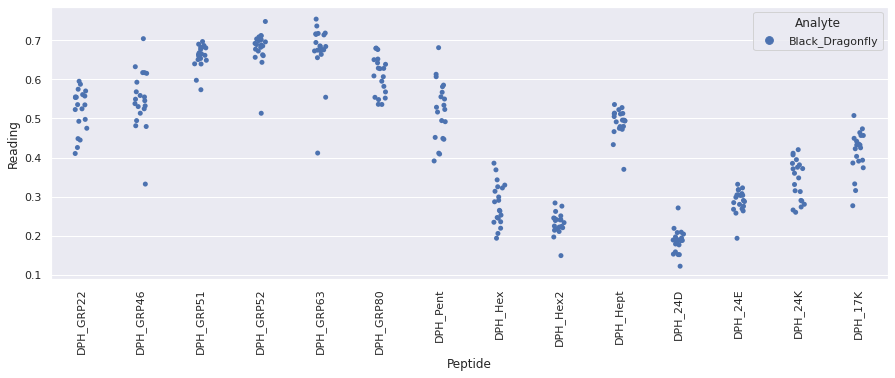

Drawing scatter plot of data spread for Black_Pgtips_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

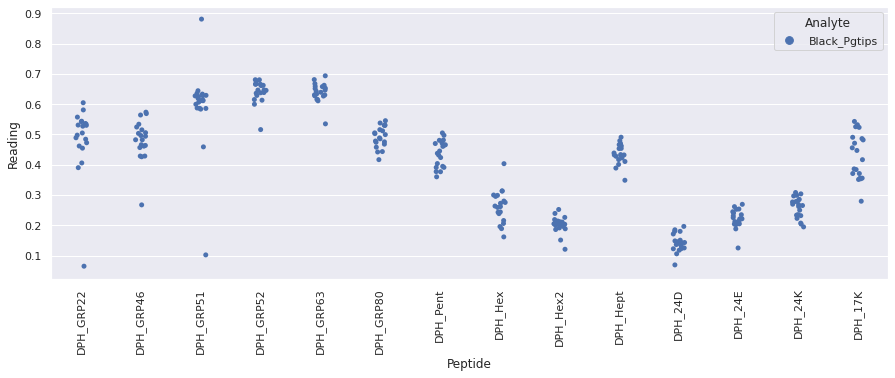

Drawing scatter plot of data spread for Black_Pukka_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

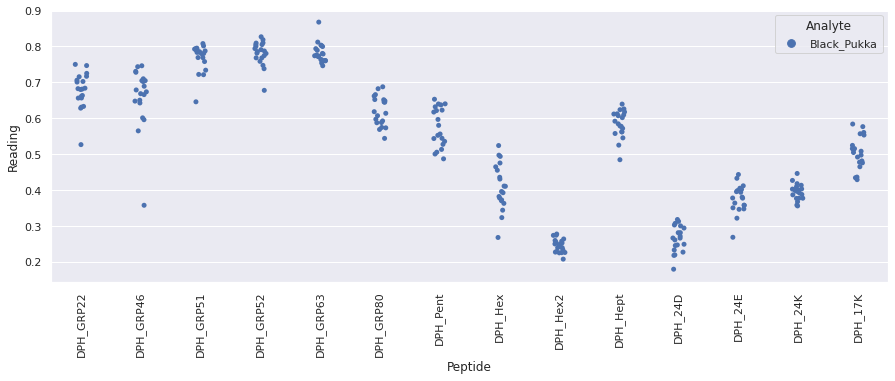

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

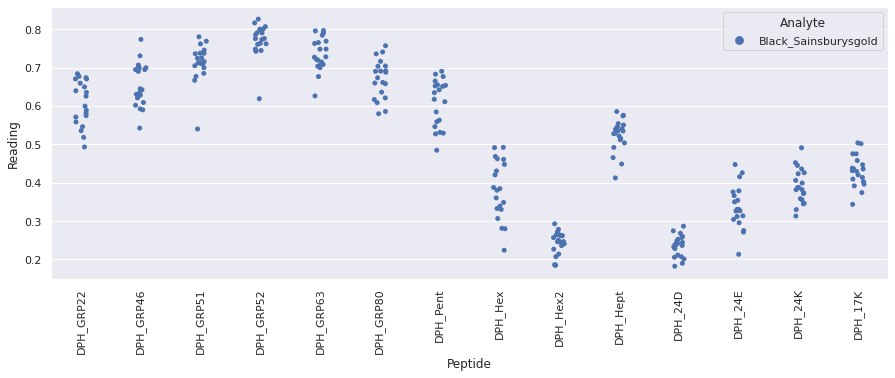

Drawing scatter plot of data spread for Black_Tesco_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

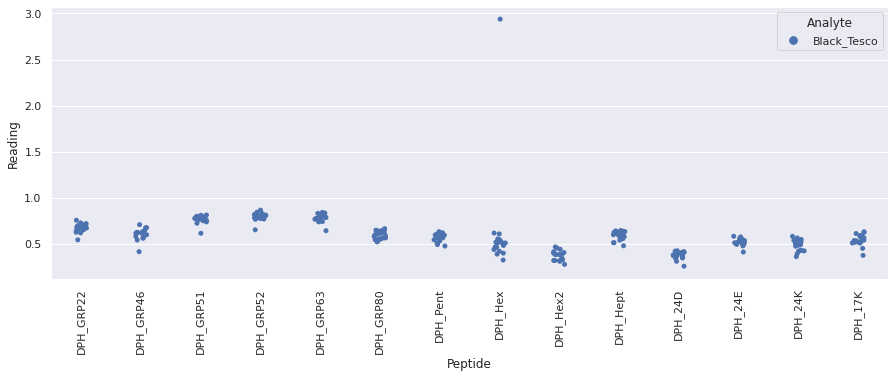

Drawing scatter plot of data spread for Black_Tetley_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

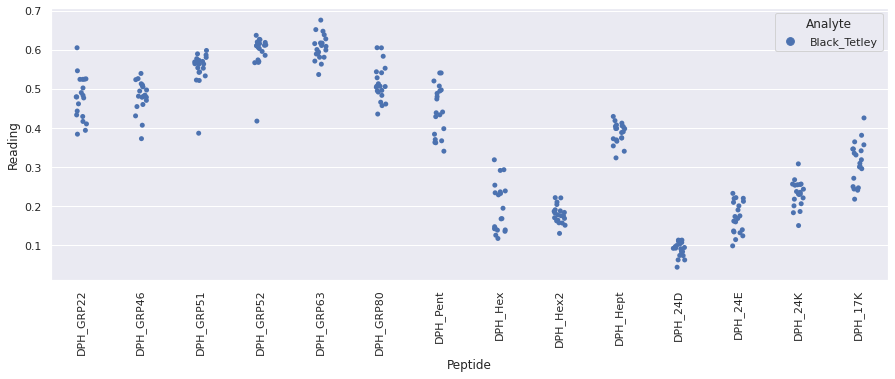

Drawing scatter plot of data spread for Black_Twinings_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

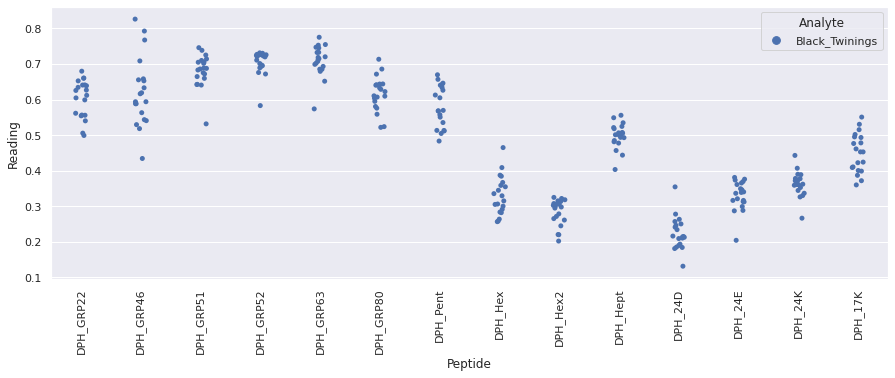

Drawing scatter plot of data spread for Black_Yorkshire_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

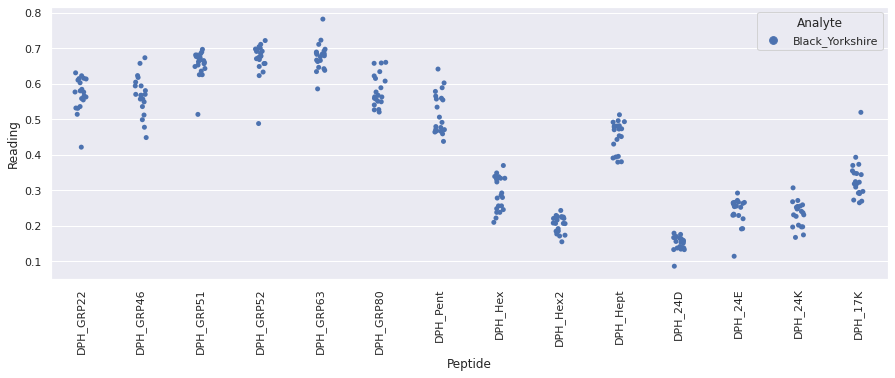

Drawing scatter plot of data spread for Green_Clipper_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

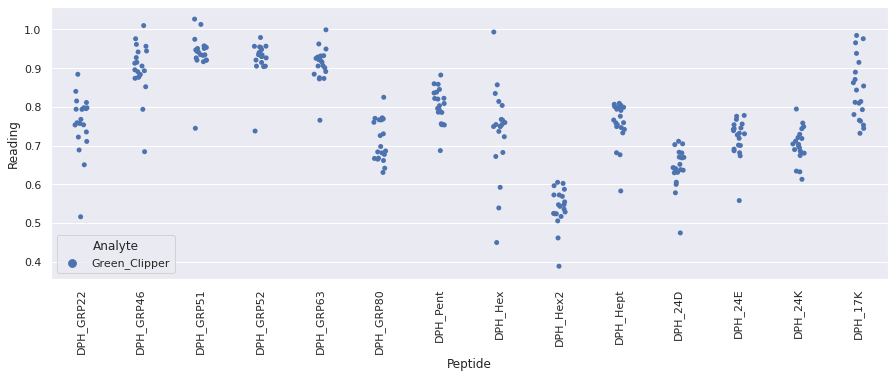

Drawing scatter plot of data spread for Green_Diplomat_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

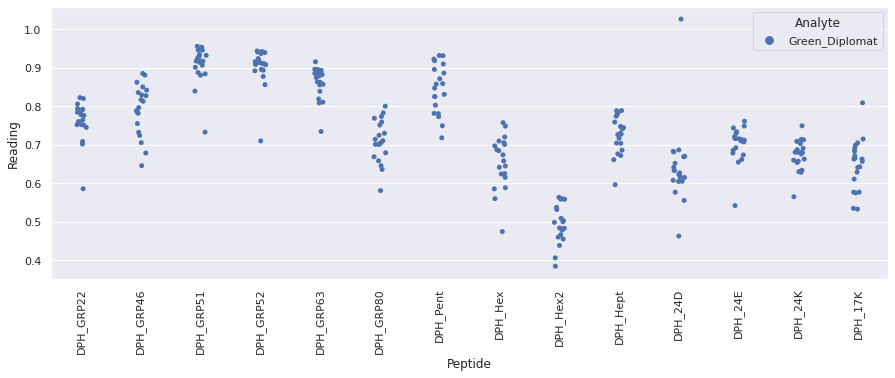

Drawing scatter plot of data spread for Green_Doubledragon_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

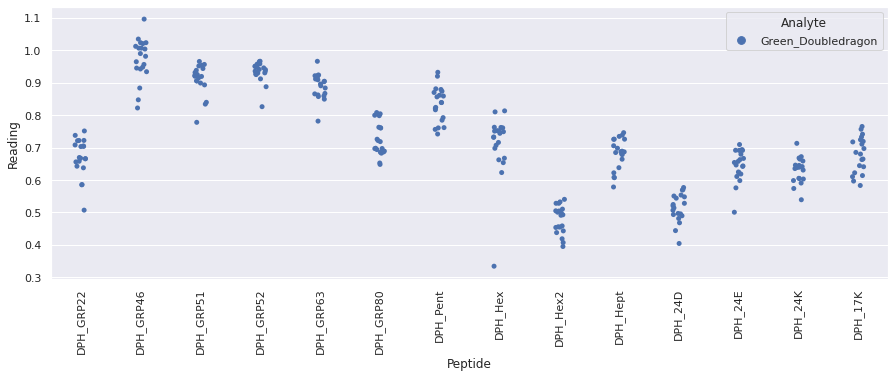

Drawing scatter plot of data spread for Green_Dragonfly_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

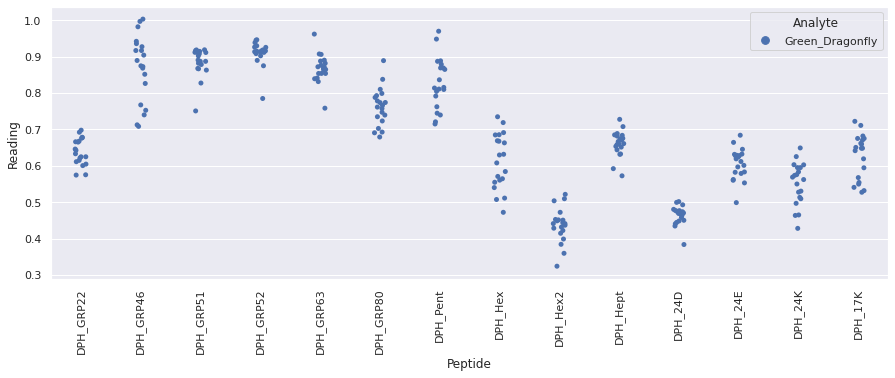

Drawing scatter plot of data spread for Green_Handb_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

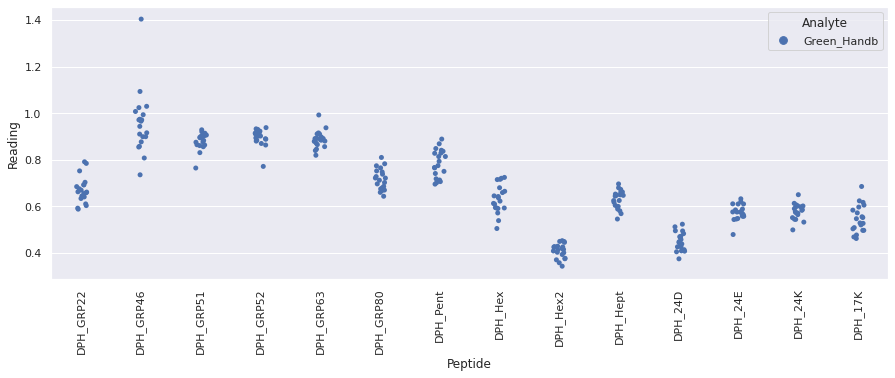

Drawing scatter plot of data spread for Green_Joes_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

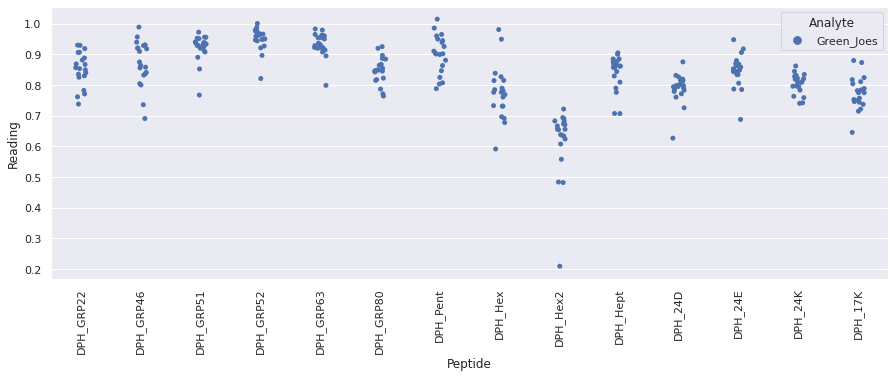

Drawing scatter plot of data spread for Green_Qi_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

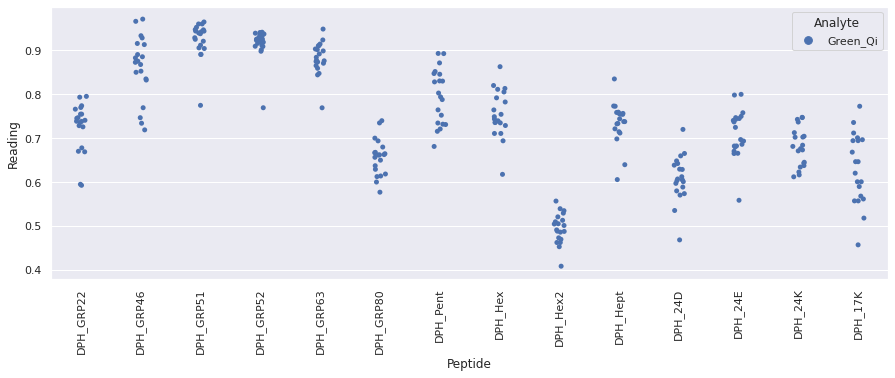

Drawing scatter plot of data spread for Green_Sainsburys_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

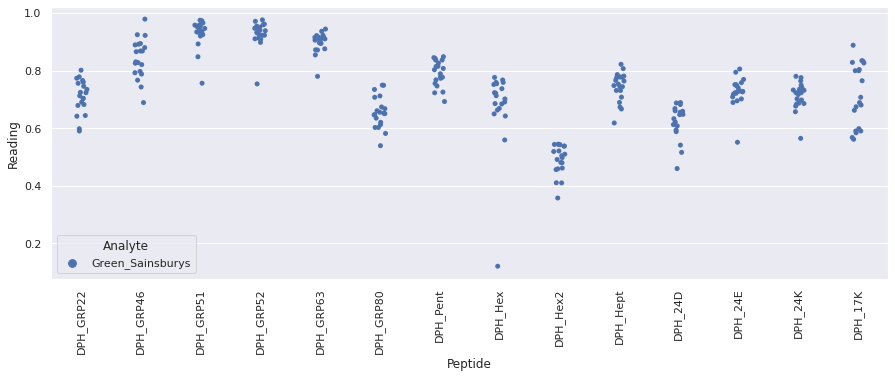

Drawing scatter plot of data spread for Green_Tetley_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

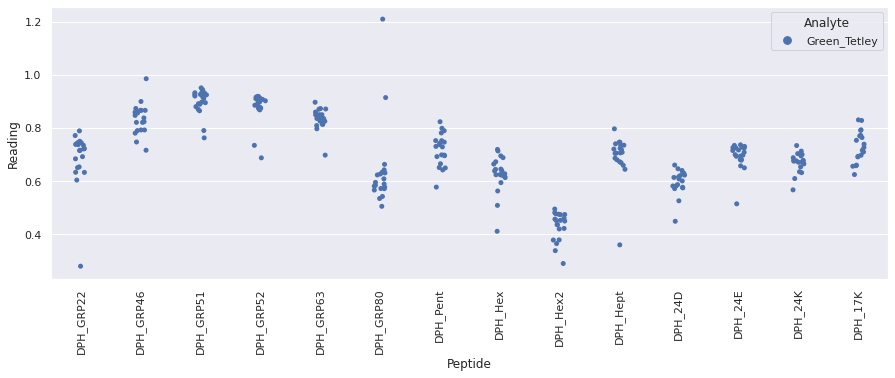

Drawing scatter plot of data spread for Green_Twinings_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

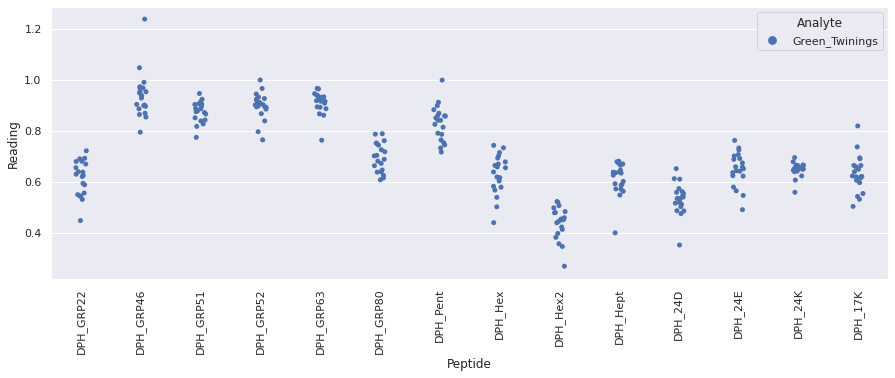

Drawing scatter plot of data spread for Grey_Asda_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

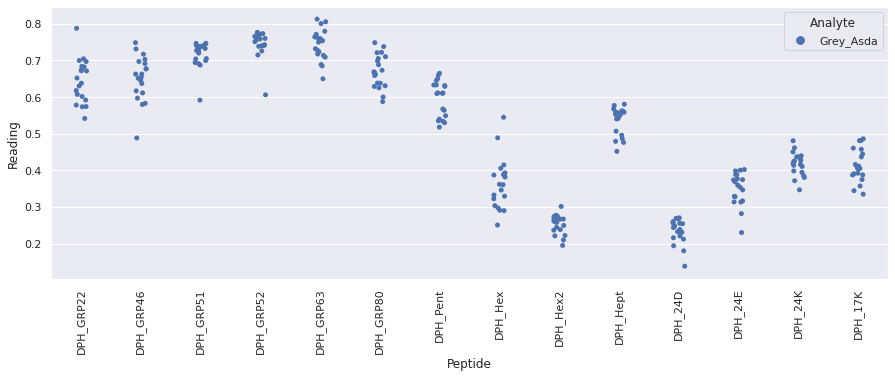

Drawing scatter plot of data spread for Grey_Clipper_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

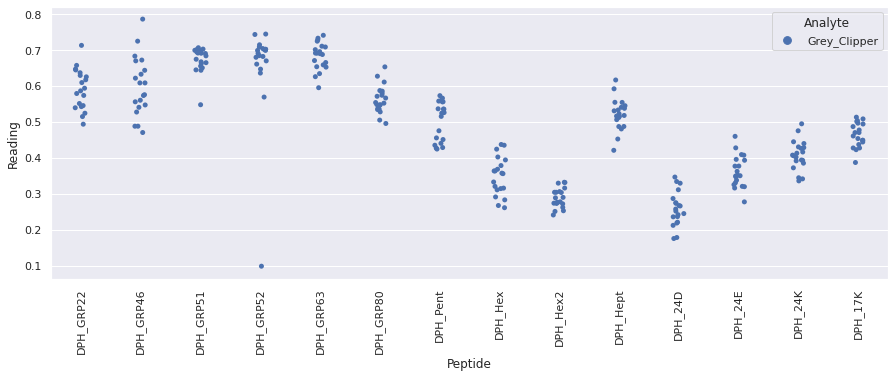

Drawing scatter plot of data spread for Grey_Coop_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

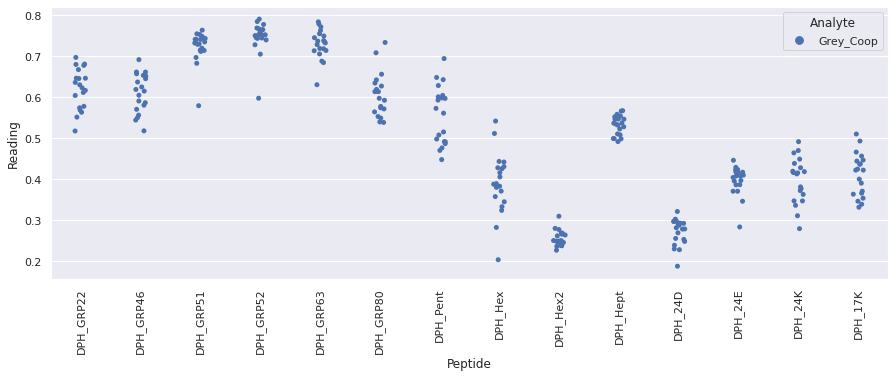

Drawing scatter plot of data spread for Grey_Devonshire_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

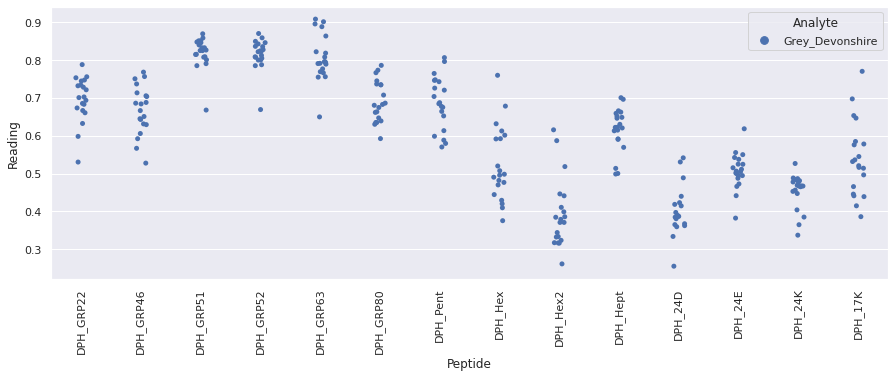

Drawing scatter plot of data spread for Grey_Diplomat_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

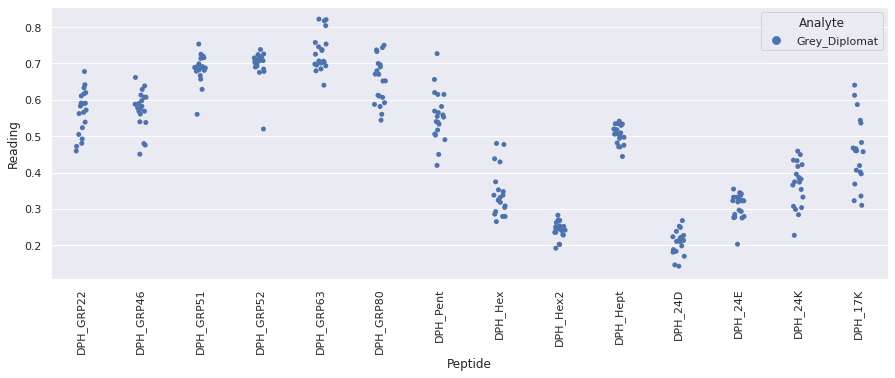

Drawing scatter plot of data spread for Grey_Joes_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

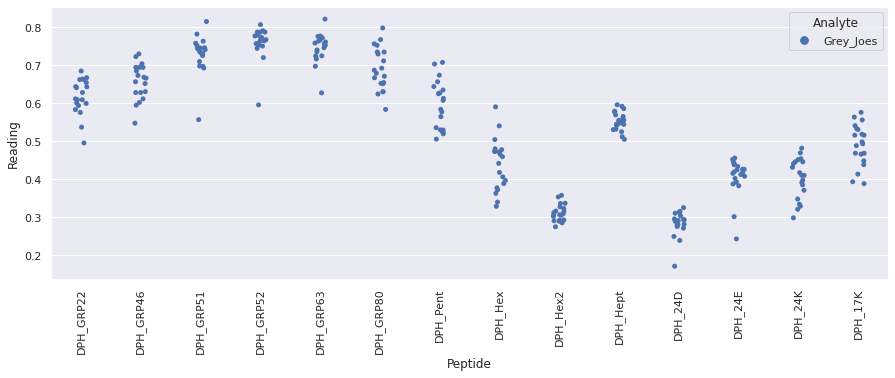

Drawing scatter plot of data spread for Grey_Mands_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

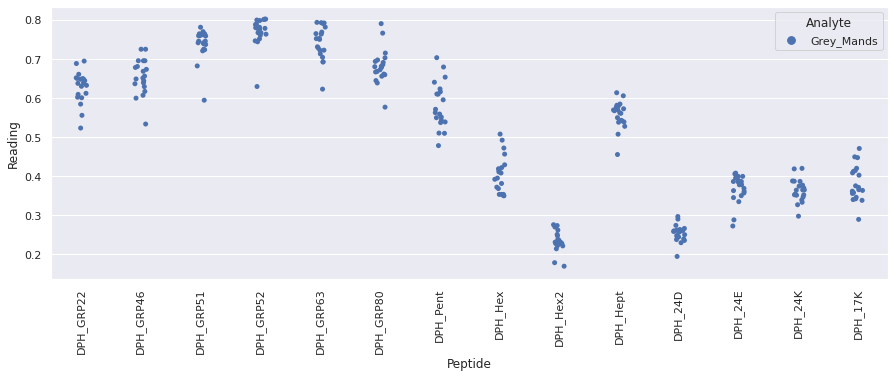

Drawing scatter plot of data spread for Grey_Pukka_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

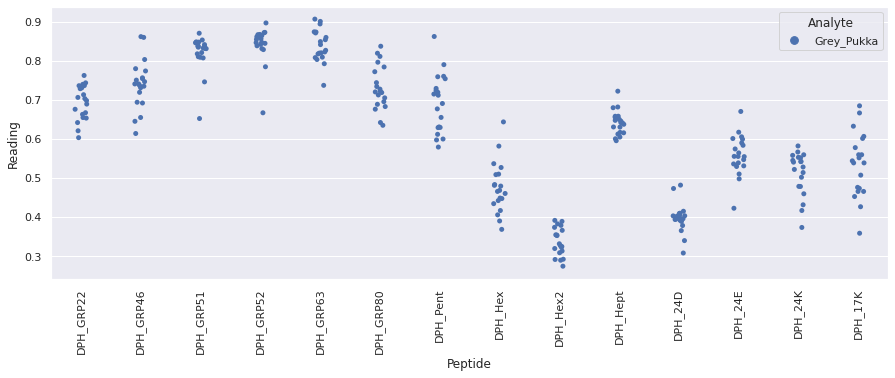

Drawing scatter plot of data spread for Grey_Tesco_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

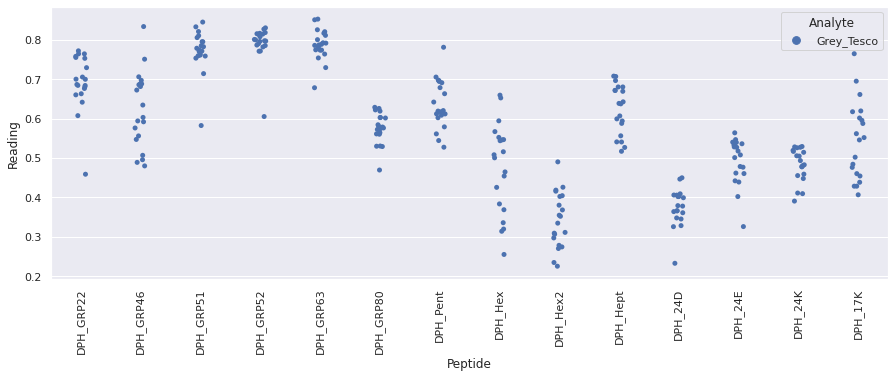

Drawing scatter plot of data spread for Grey_Twinings_repeat_5 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

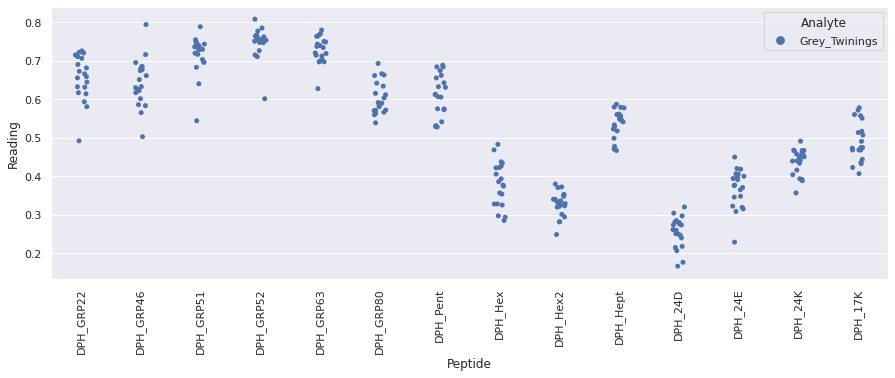

Drawing scatter plot of data spread for Black_Clipper_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

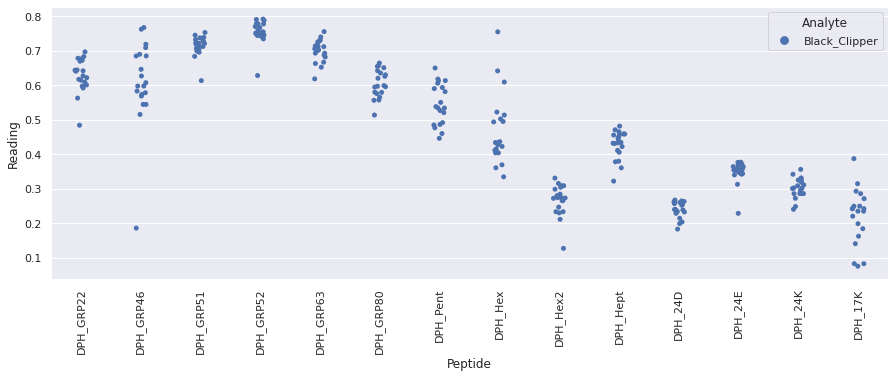

Drawing scatter plot of data spread for Black_Diplomat_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

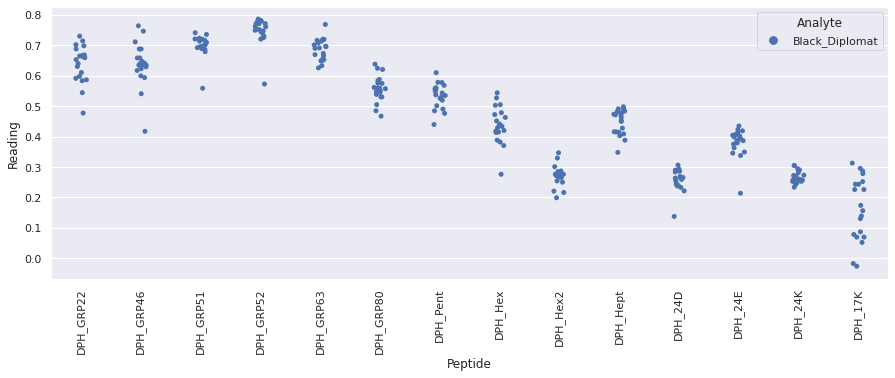

Drawing scatter plot of data spread for Black_Dragonfly_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

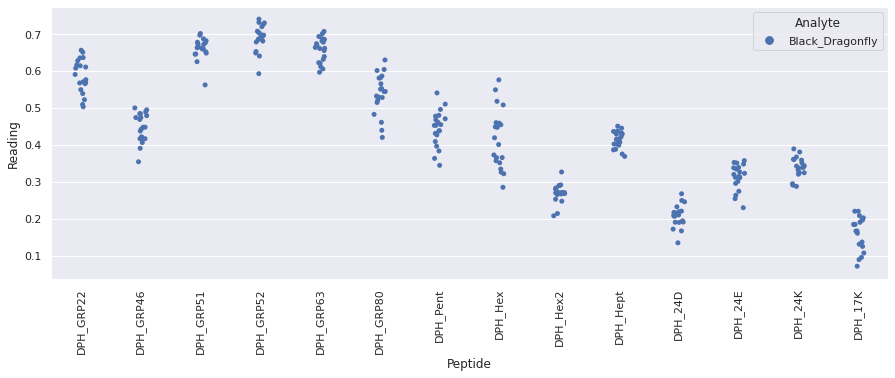

Drawing scatter plot of data spread for Black_Pgtips_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

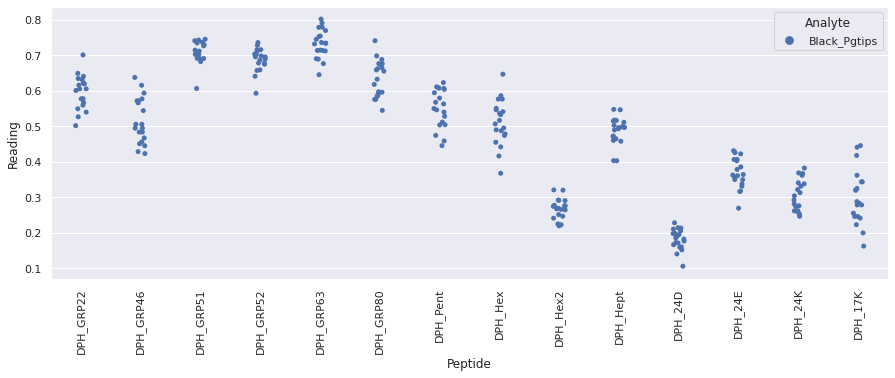

Drawing scatter plot of data spread for Black_Pukka_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

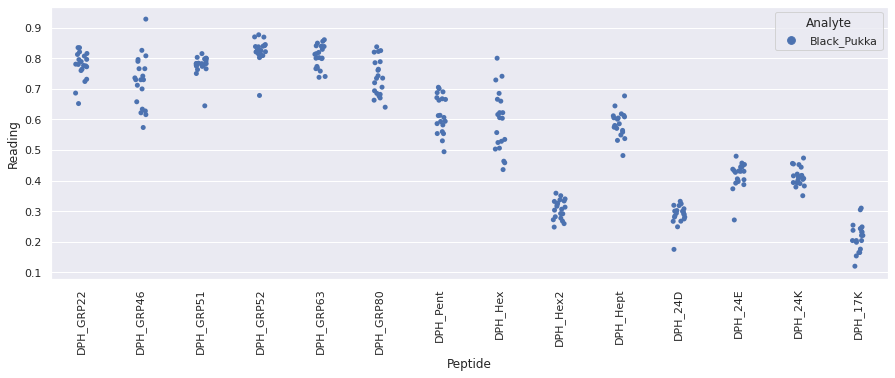

Drawing scatter plot of data spread for Black_Sainsburysgold_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

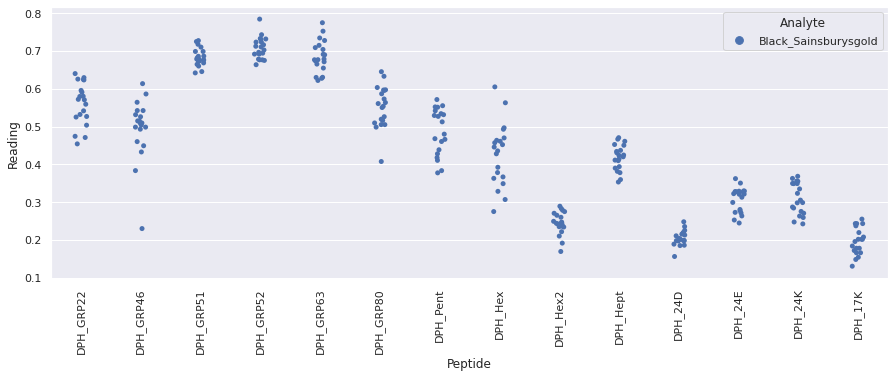

Drawing scatter plot of data spread for Black_Tesco_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

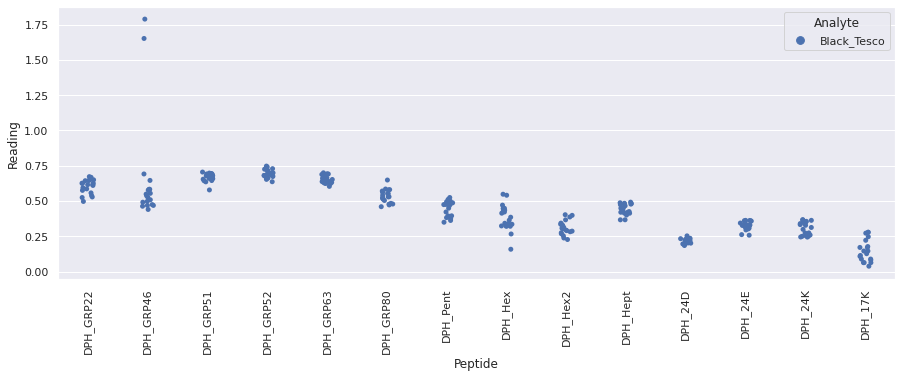

Drawing scatter plot of data spread for Black_Tetley_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

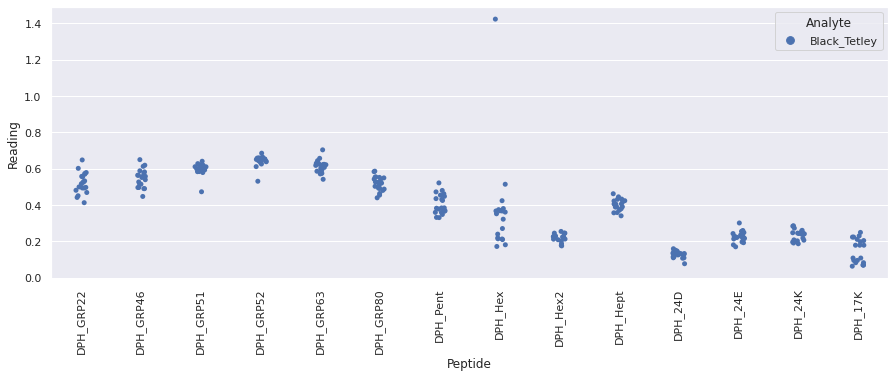

Drawing scatter plot of data spread for Black_Twinings_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

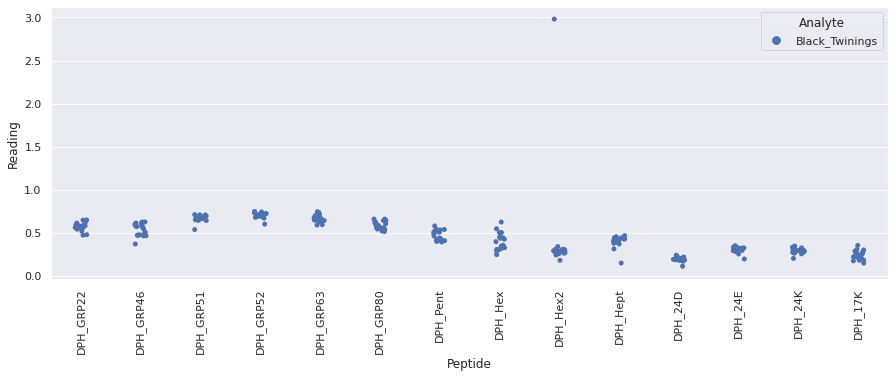

Drawing scatter plot of data spread for Black_Yorkshire_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

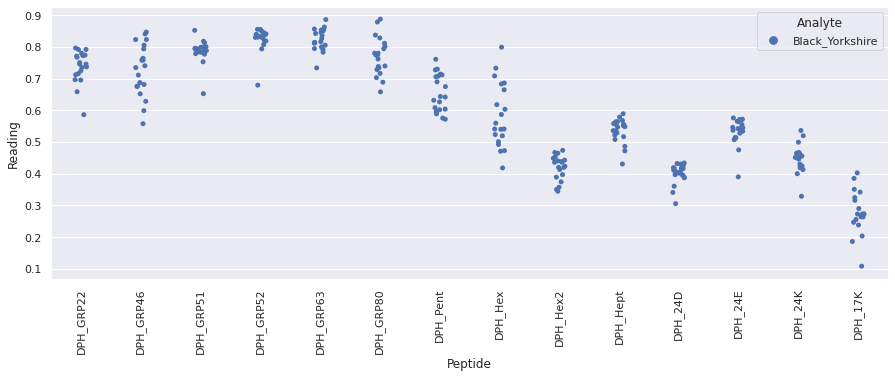

Drawing scatter plot of data spread for Green_Clipper_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

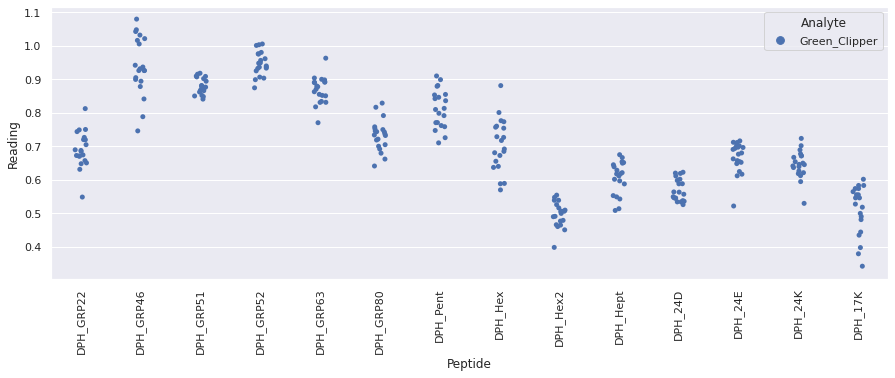

Drawing scatter plot of data spread for Green_Diplomat_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

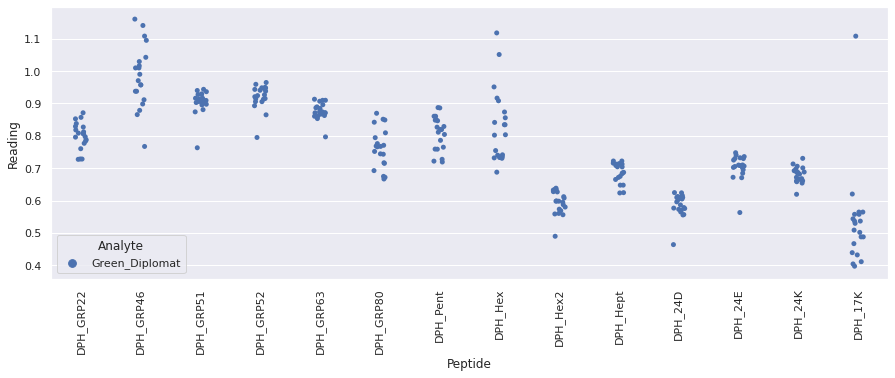

Drawing scatter plot of data spread for Green_Doubledragon_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

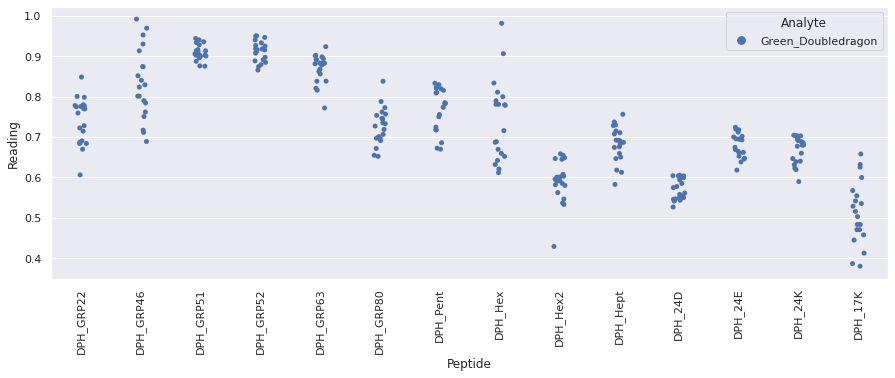

Drawing scatter plot of data spread for Green_Dragonfly_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

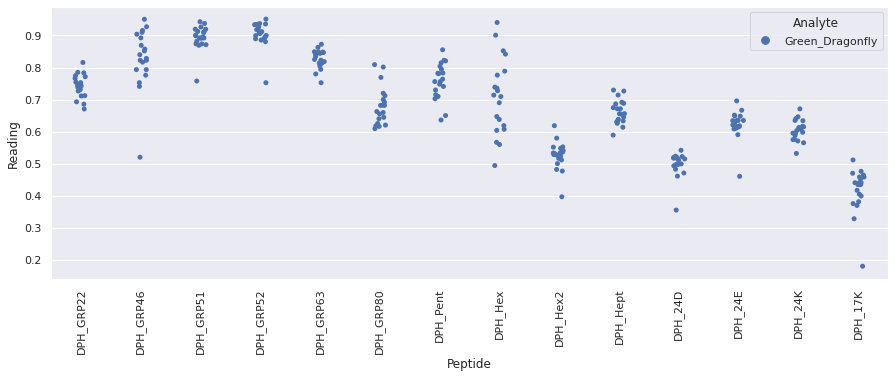

Drawing scatter plot of data spread for Green_Handb_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

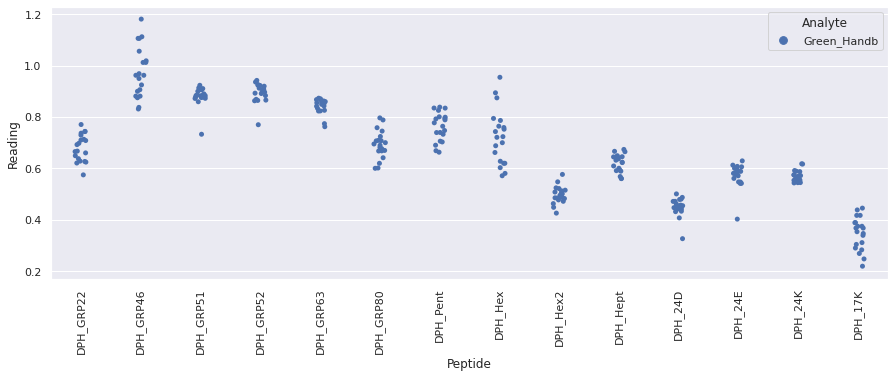

Drawing scatter plot of data spread for Green_Joes_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

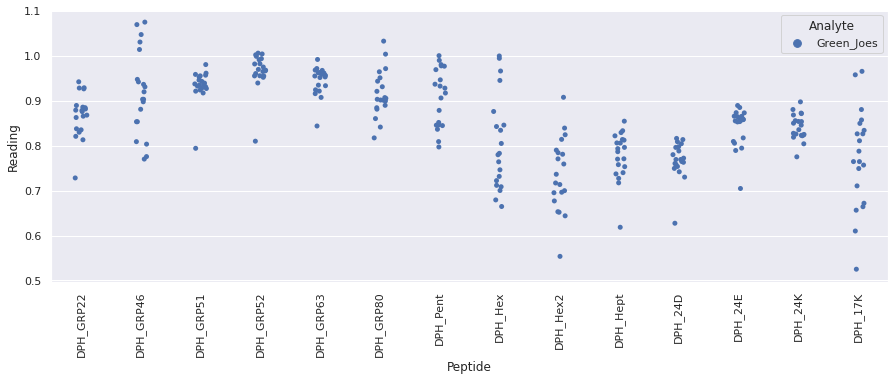

Drawing scatter plot of data spread for Green_Qi_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

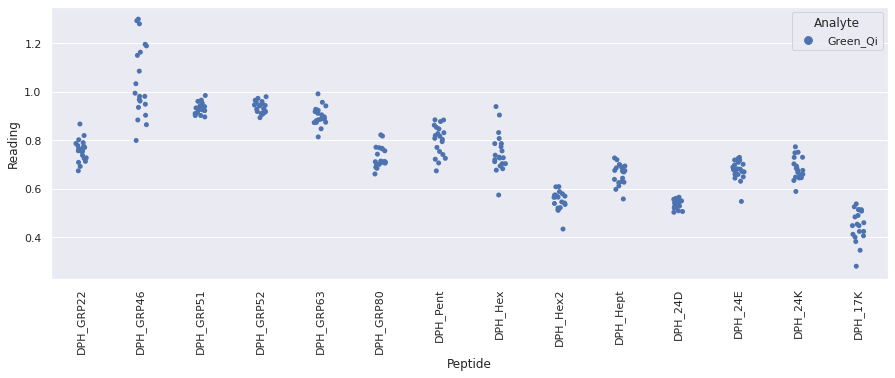

Drawing scatter plot of data spread for Green_Sainsburys_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

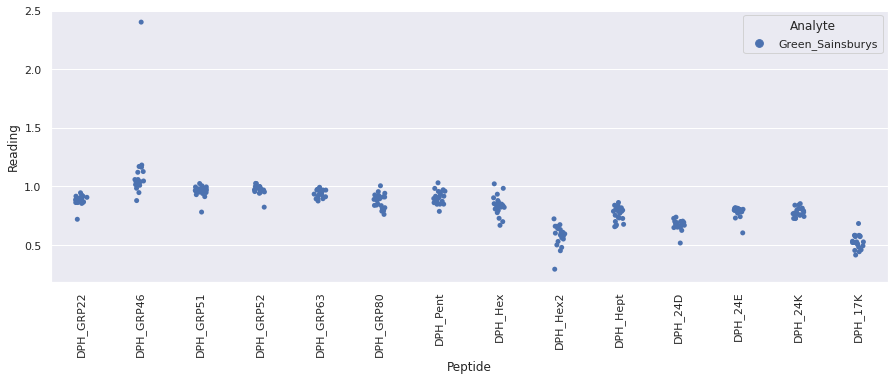

Drawing scatter plot of data spread for Green_Tetley_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

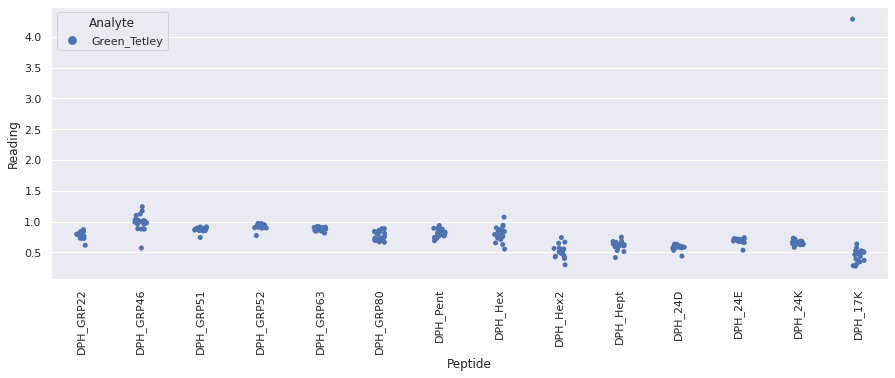

Drawing scatter plot of data spread for Green_Twinings_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

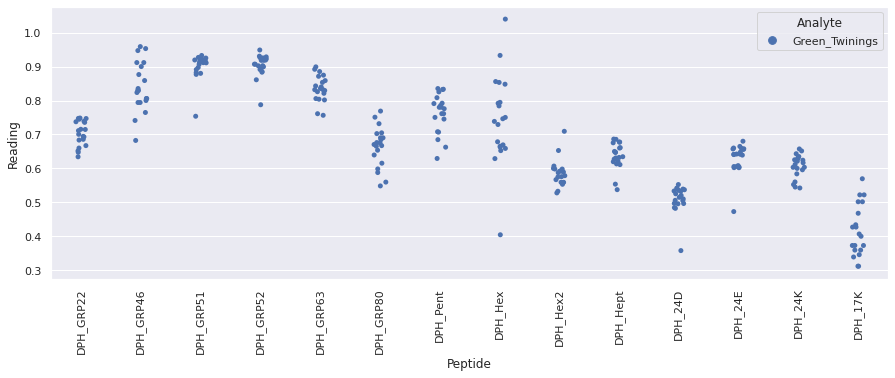

Drawing scatter plot of data spread for Grey_Asda_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

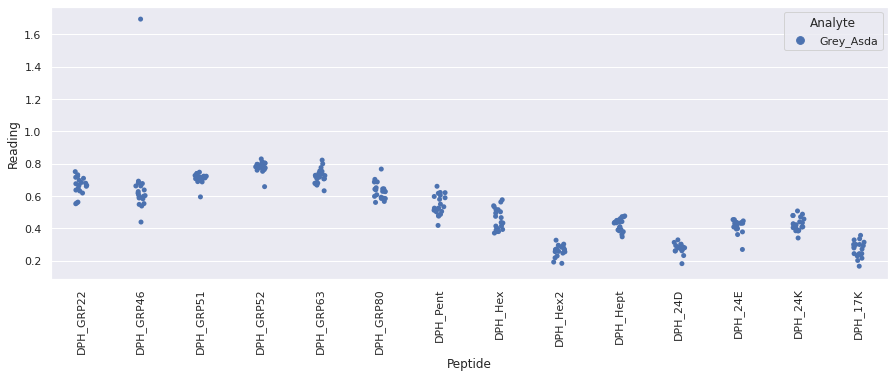

Drawing scatter plot of data spread for Grey_Clipper_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

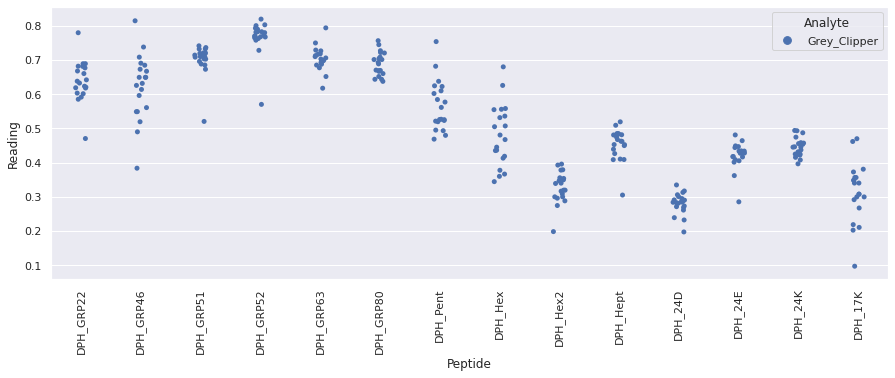

Drawing scatter plot of data spread for Grey_Coop_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

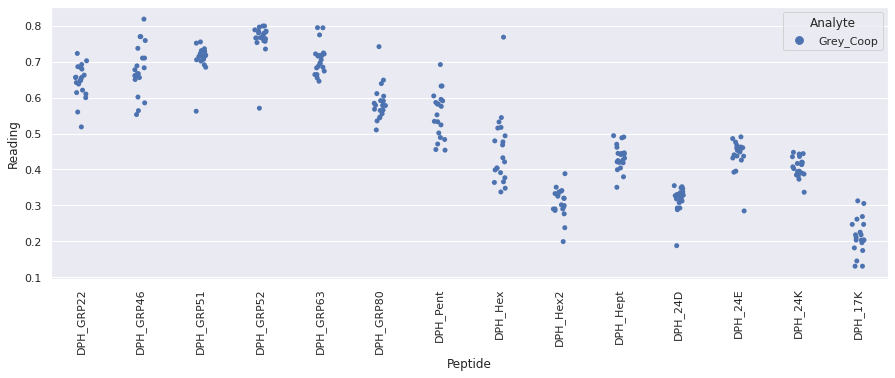

Drawing scatter plot of data spread for Grey_Devonshire_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

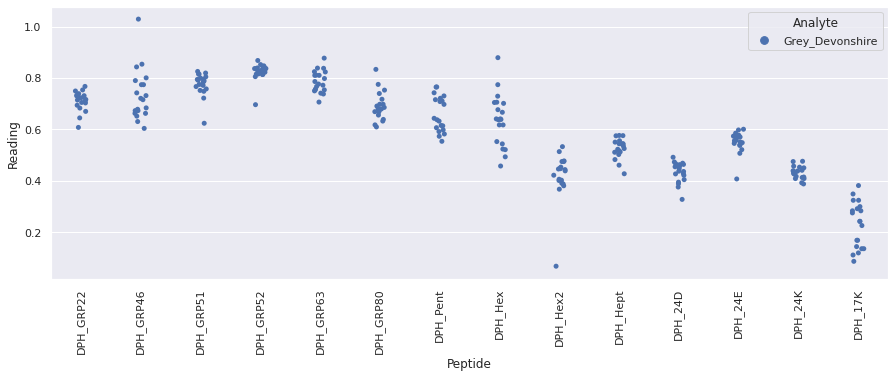

Drawing scatter plot of data spread for Grey_Diplomat_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

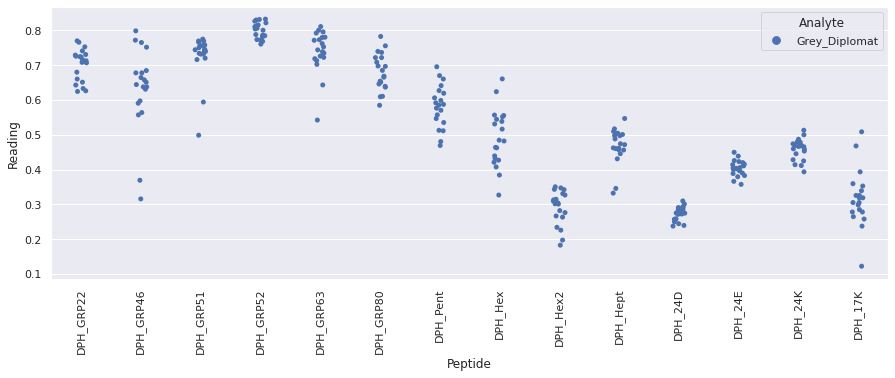

Drawing scatter plot of data spread for Grey_Joes_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

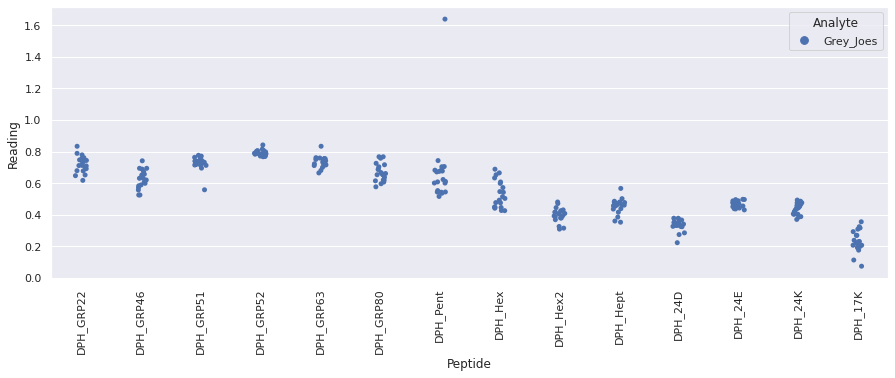

Drawing scatter plot of data spread for Grey_Mands_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

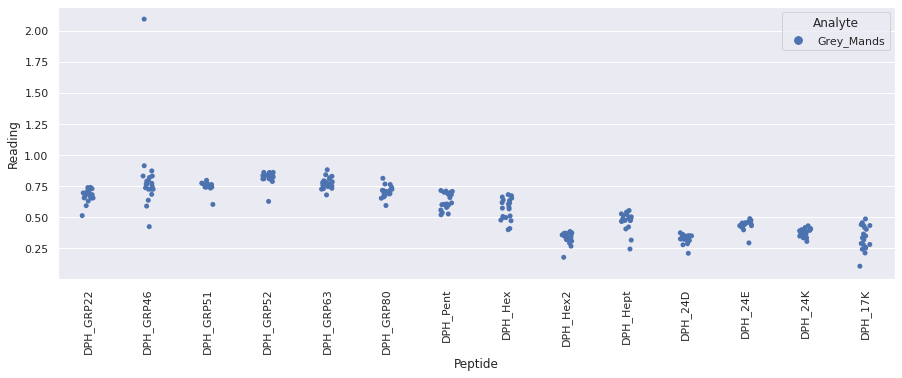

Drawing scatter plot of data spread for Grey_Pukka_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

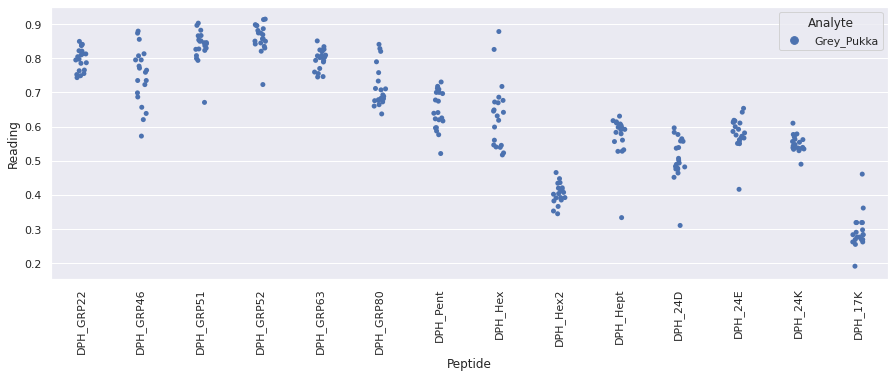

Drawing scatter plot of data spread for Grey_Tesco_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

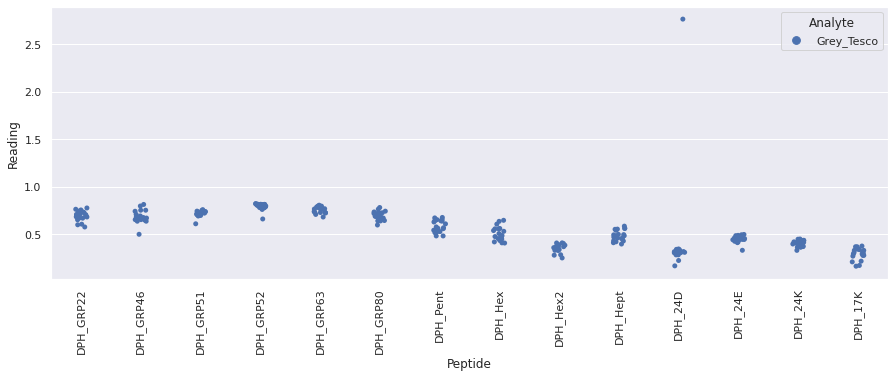

Drawing scatter plot of data spread for Grey_Twinings_repeat_6 in Tea_scaled_data


<Figure size 720x720 with 0 Axes>

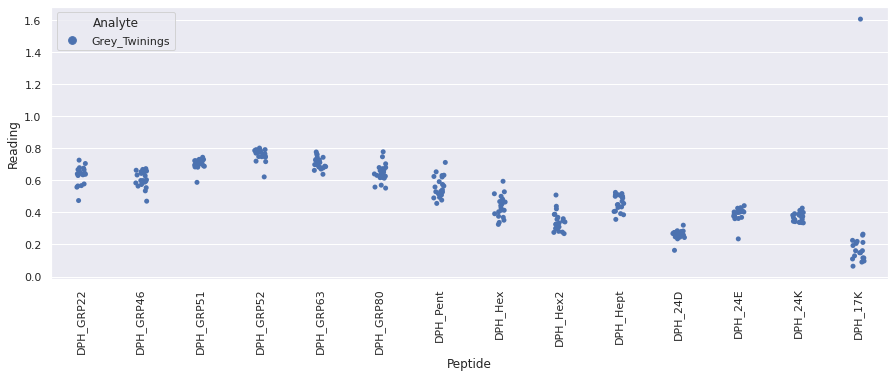



Outliers on the same plate:

/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx: blank, DPH_GRP51, 13902.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx: blank, DPH_GRP52, 16010.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP22, 9290.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP51, 9358.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP52, 10367.0
/home/ks17361/ML_environment/BADASS/Tea_data_standard_array/Reformatted_tea_csvs_split_brand/Black_Clipper_repeat_1.xlsx: Black_Clipper, DPH_GRP63, 10874.0
/home/ks17361/ML_environment/BADASS/Tea_data_standa

In [6]:
tea_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='Tea'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous => no need to discard any of the plates. (Whilst there are several instances of individual outliers, these will be removed in subsequent steps that take the median value of repeat readings.)
- As expected, the collapsed barrel control (GRP35) has very little effect upon DPH fluorescence. Peptides GRP46 and 17K also have a limited (although slightly larger) effect upon DPH fluorescence => variance associated with the readings from these barrels might be quite high.
- In the case of most of the peptides, the analytes cause a noticeable (by eye) change (usually a decrease) in DPH fluorescence => likely that the analytes will generate unique fingerprints.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
tea_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_Black_Clipper: Black_Clipper, DPH_GRP22, 0.6126890446329768
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP51, 0.6906682676072192
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP52, 0.6756756756756757
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP63, 1.0650273224043716
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP63, 0.7647789369100845
repeat_1_Black_Clipper: Black_Clipper, DPH_GRP80, 0.6674430641821946
repeat_1_Black_Clipper: Black_Clipper, DPH_Hex, 0.13620604259534422
repeat_1_Black_Clipper: Black_Clipper, DPH_Hept, 0.28563861985472155
repeat_1_Black_Clipper: Black_Clipper, DPH_24D, 0.26914079115270095
repeat_1_Black_Clipper: Black_Clipper, DPH_24E, 0.22102807631425478
repeat_1_Black_Clipper: Black_Clipper, DPH_24K, 0.3308228302080131
repeat_1_Black_Diplomat: Black_Diplomat, DPH_GRP51, 0.621541053723025
repeat_1_Black_Diplomat: Black_Diplomat, DPH_GRP52, 0.6031852986217457
repeat_1_Black_Diplomat: Black_Diplomat, DPH_GRP63, 0.7194777699364855
repeat_



Sample outliers:

 Outlier excluded from final output dataset: 3, Black_Sainsburysgold
DPH_GRP22                        0.76798
DPH_GRP46                       0.719638
DPH_GRP51                       0.890672
DPH_GRP52                       0.875946
DPH_GRP63                       0.884569
DPH_GRP80                       0.801772
DPH_Pent                        0.703355
DPH_Hex                         0.598699
DPH_Hex2                        0.512619
DPH_Hept                         0.86459
DPH_24D                         0.495406
DPH_24E      Outlier: 0.6551670491229435
DPH_24K      Outlier: 0.5591305963217537
DPH_17K                            0.544
Analyte             Black_Sainsburysgold
Name: 3, dtype: object
 
 Outlier excluded from final output dataset: 0, Green_Doubledragon
DPH_GRP22                       0.834709
DPH_GRP46                       0.872894
DPH_GRP51                        0.97231
DPH_GRP52                       0.956098
DPH_GRP63                       0.918772

Display range of data points across repeats for the different analytes




Original_data:


Black_Clipper


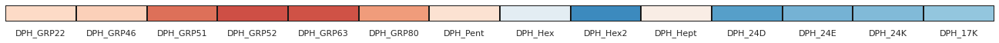


Black_Diplomat


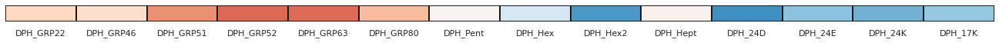


Black_Dragonfly


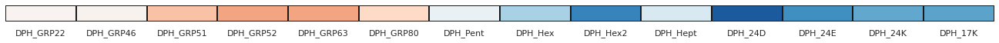


Black_Pgtips


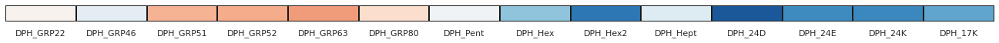


Black_Pukka


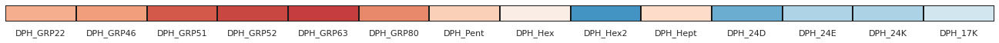


Black_Sainsburysgold


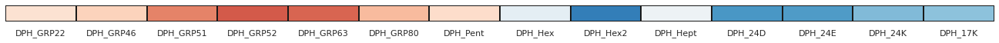


Black_Tesco


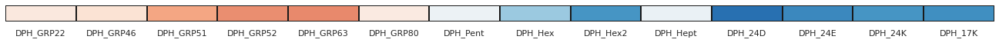


Black_Tetley


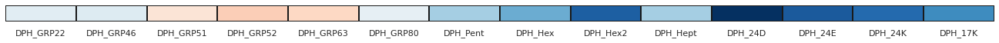


Black_Twinings


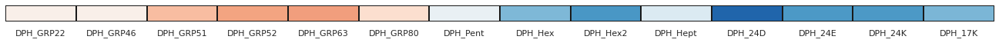


Black_Yorkshire


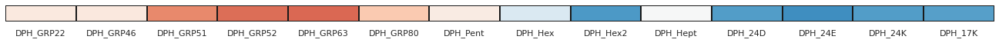


Green_Clipper


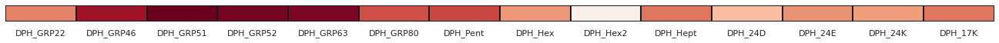


Green_Diplomat


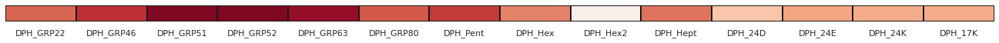


Green_Doubledragon


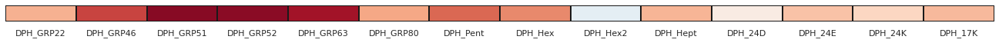


Green_Dragonfly


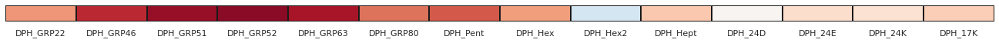


Green_Handb


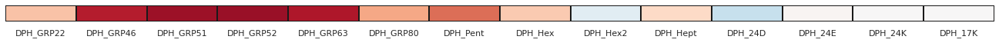


Green_Joes


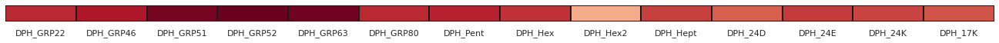


Green_Qi


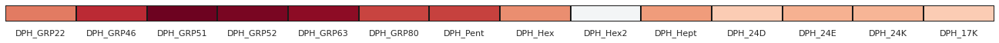


Green_Sainsburys


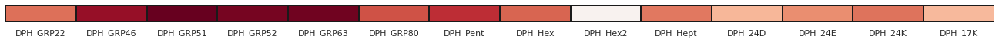


Green_Tetley


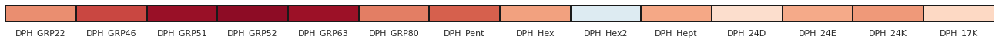


Green_Twinings


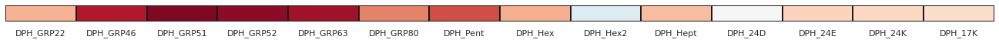


Grey_Asda


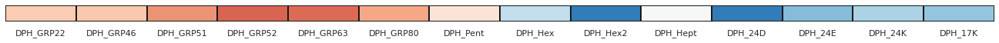


Grey_Clipper


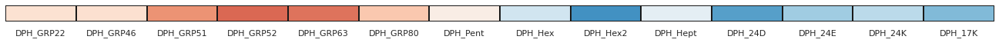


Grey_Coop


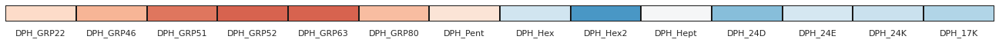


Grey_Devonshire


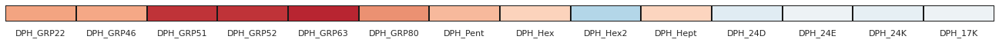


Grey_Diplomat


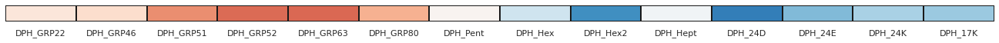


Grey_Joes


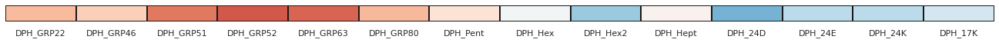


Grey_Mands


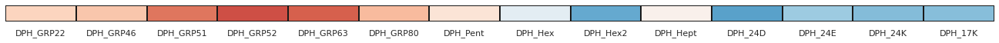


Grey_Pukka


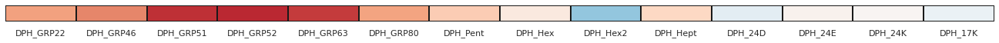


Grey_Tesco


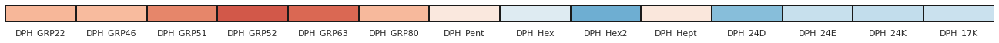


Grey_Twinings


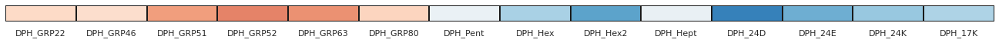




Scaled_data:


Black_Clipper


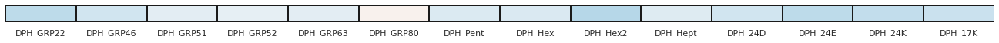


Black_Diplomat


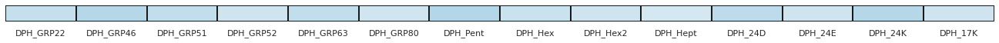


Black_Dragonfly


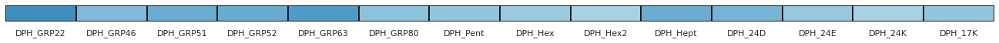


Black_Pgtips


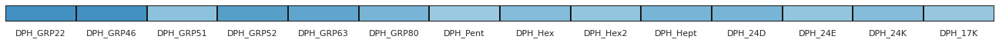


Black_Pukka


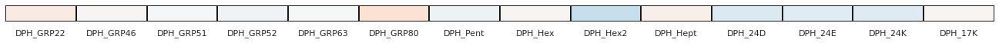


Black_Sainsburysgold


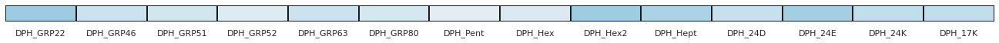


Black_Tesco


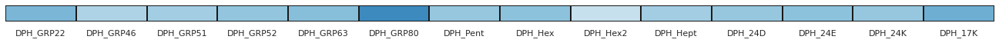


Black_Tetley


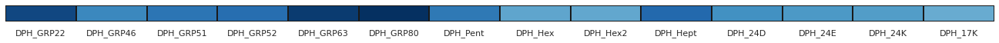


Black_Twinings


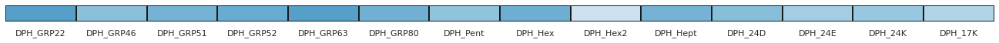


Black_Yorkshire


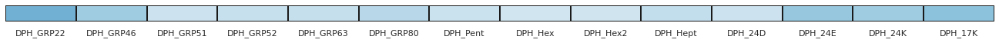


Green_Clipper


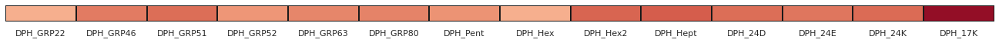


Green_Diplomat


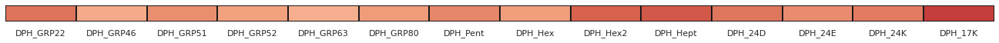


Green_Doubledragon


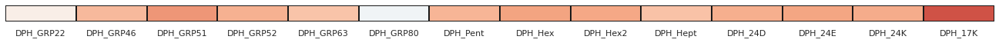


Green_Dragonfly


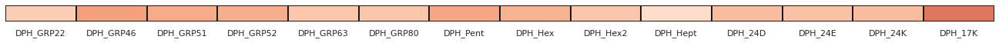


Green_Handb


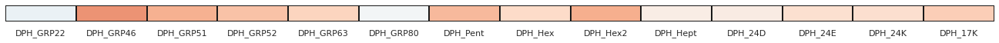


Green_Joes


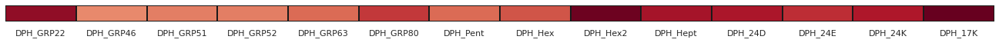


Green_Qi


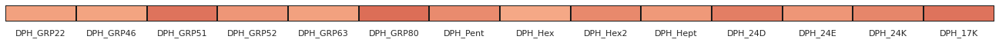


Green_Sainsburys


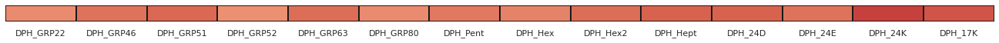


Green_Tetley


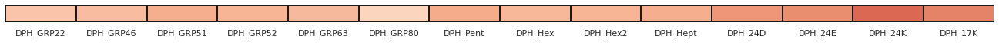


Green_Twinings


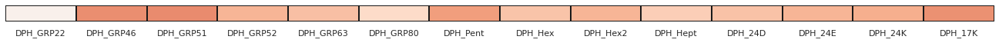


Grey_Asda


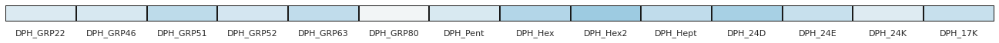


Grey_Clipper


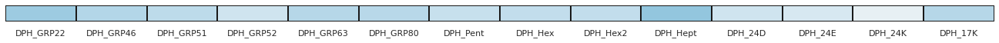


Grey_Coop


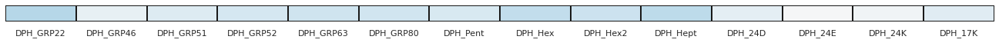


Grey_Devonshire


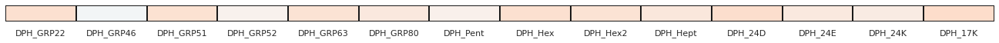


Grey_Diplomat


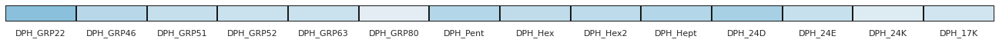


Grey_Joes


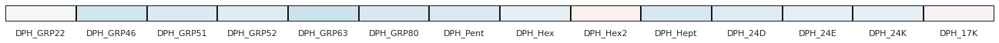


Grey_Mands


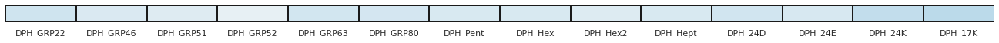


Grey_Pukka


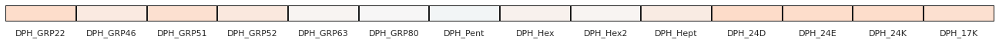


Grey_Tesco


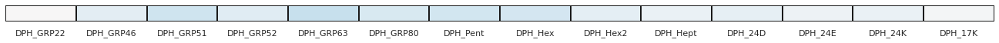


Grey_Twinings


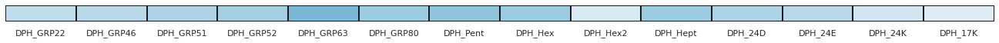




Original_data:



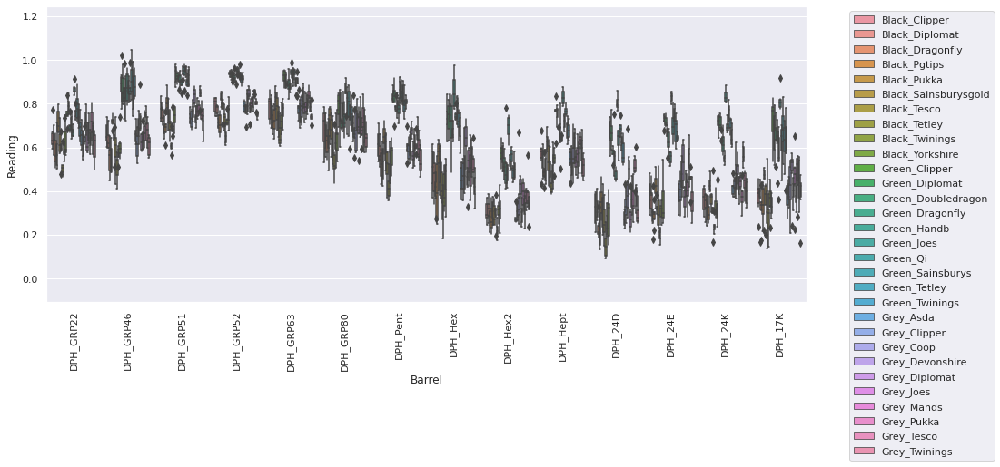

Black_Clipper


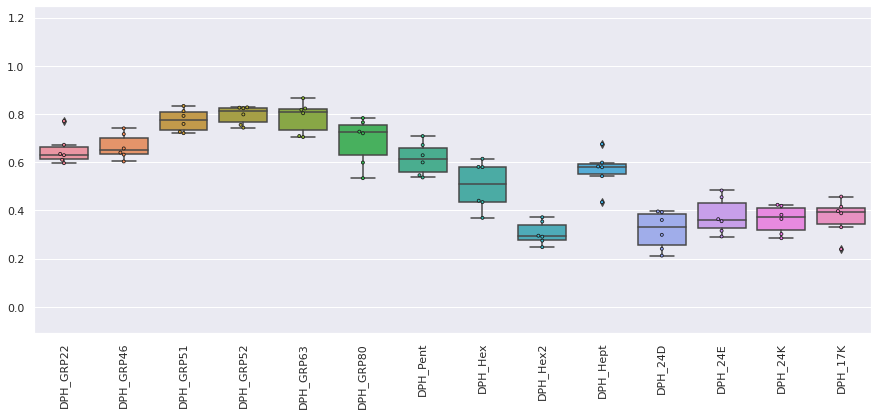

Black_Diplomat


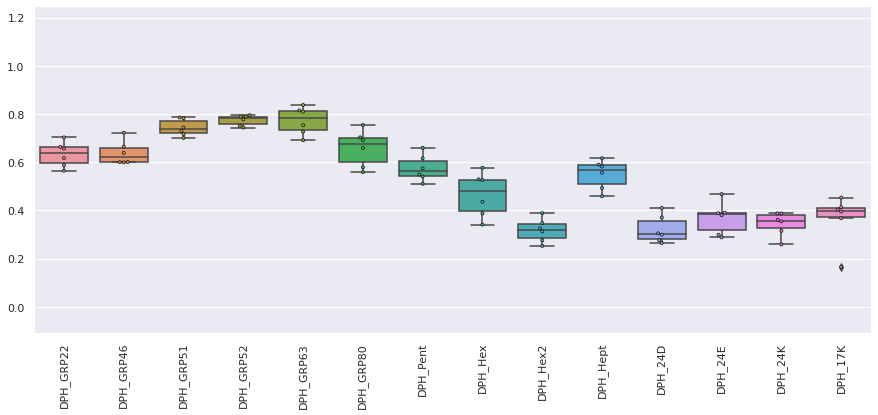

Black_Dragonfly


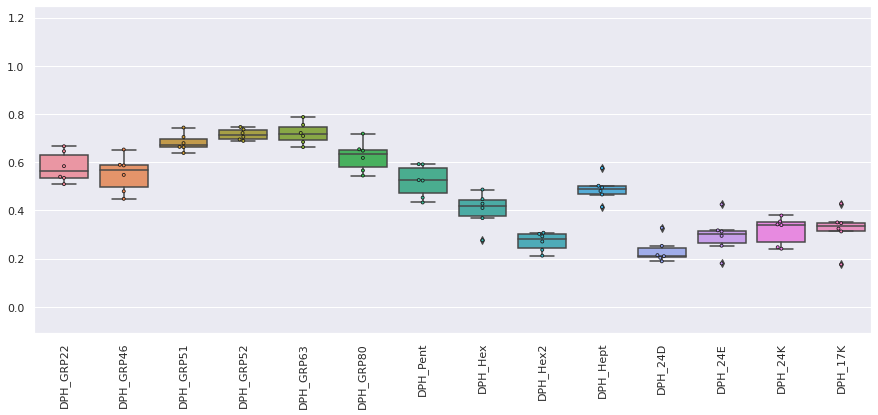

Black_Pgtips


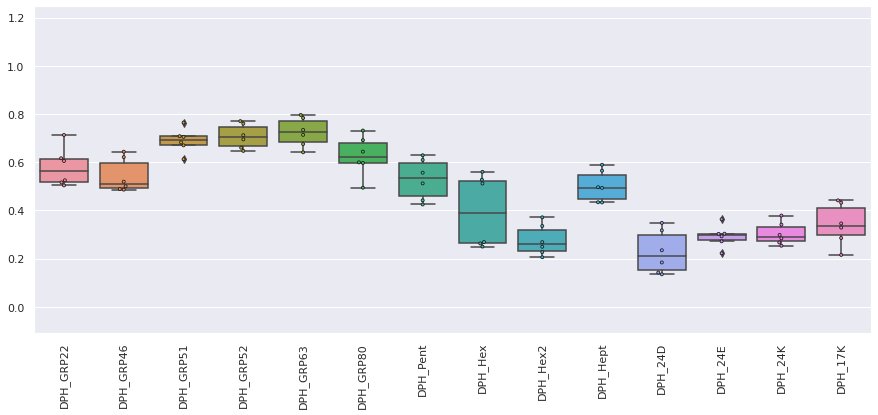

Black_Pukka


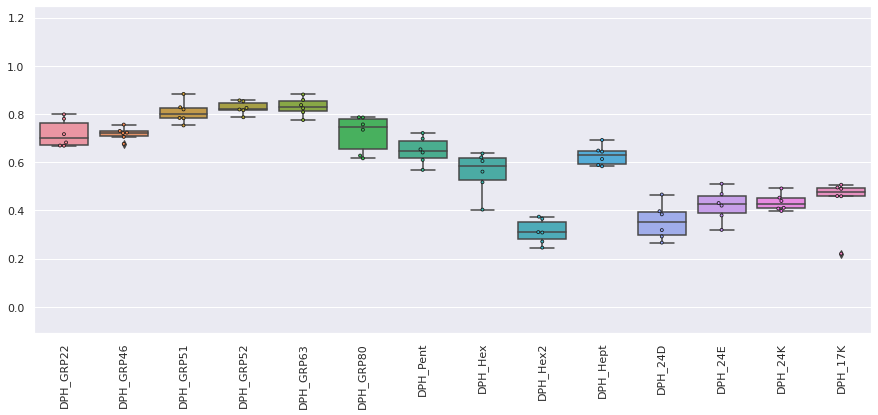

Black_Sainsburysgold


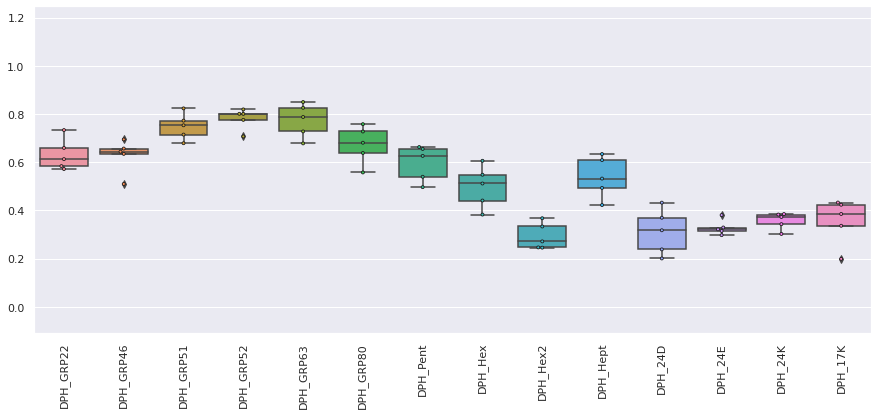

Black_Tesco


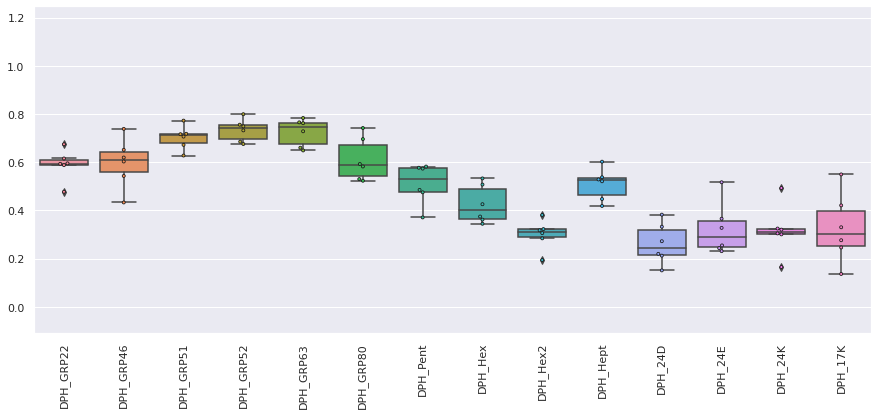

Black_Tetley


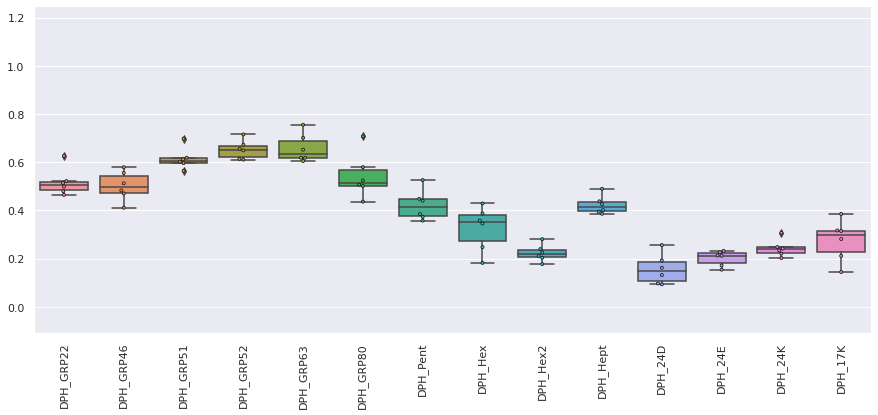

Black_Twinings


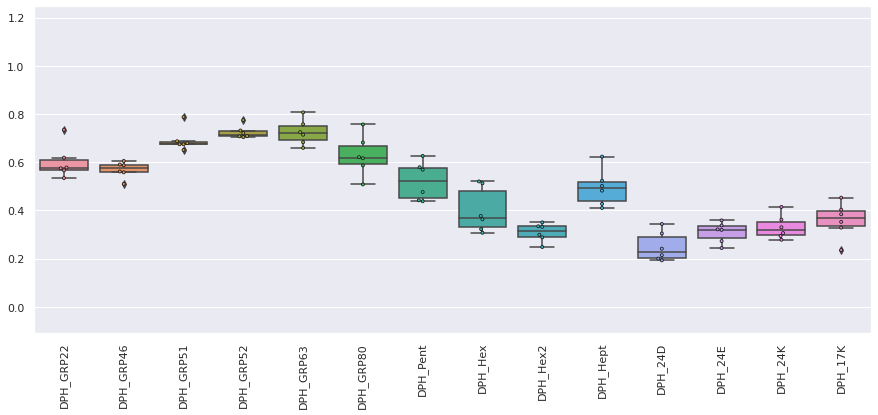

Black_Yorkshire


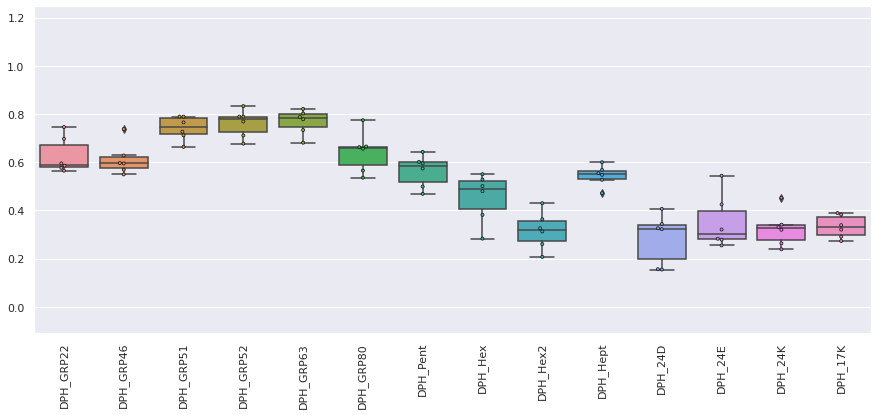

Green_Clipper


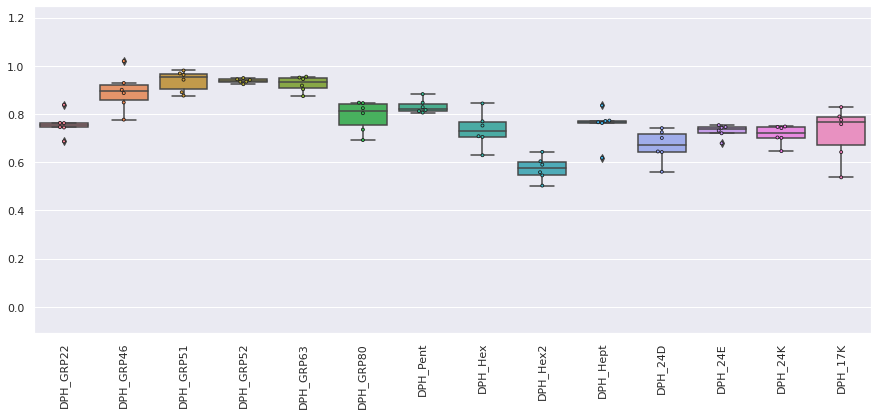

Green_Diplomat


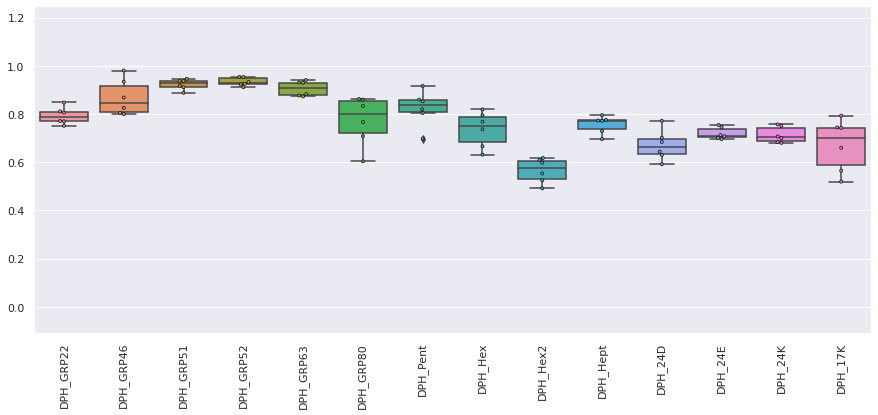

Green_Doubledragon


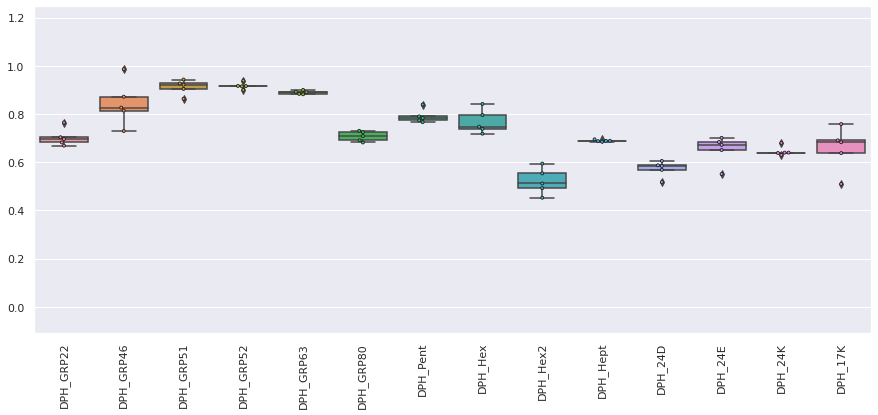

Green_Dragonfly


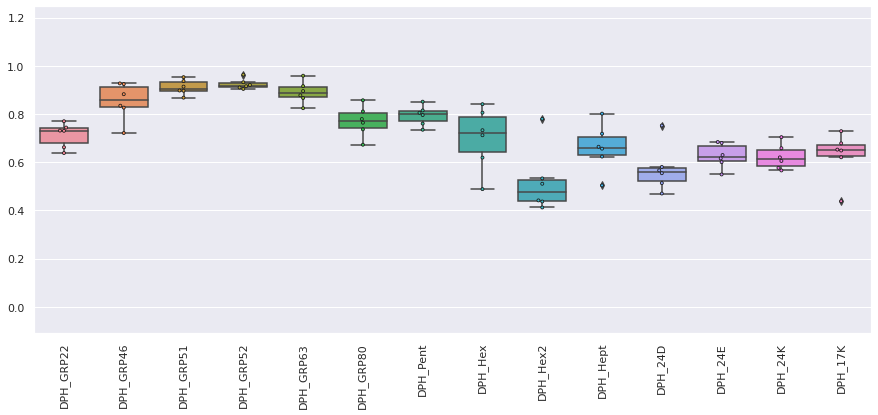

Green_Handb


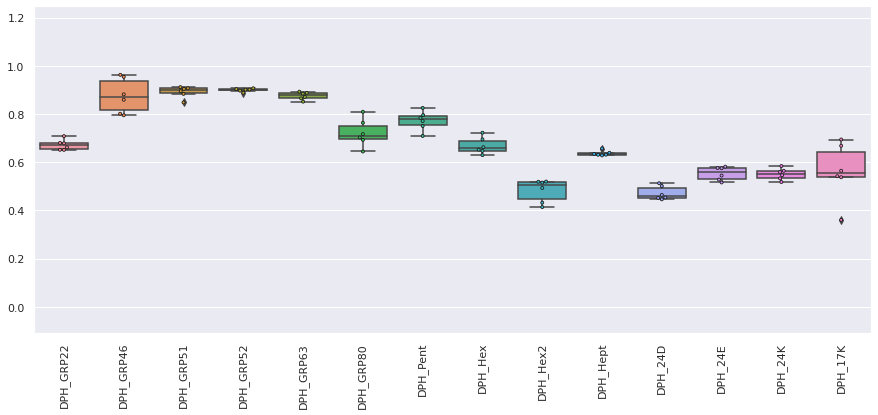

Green_Joes


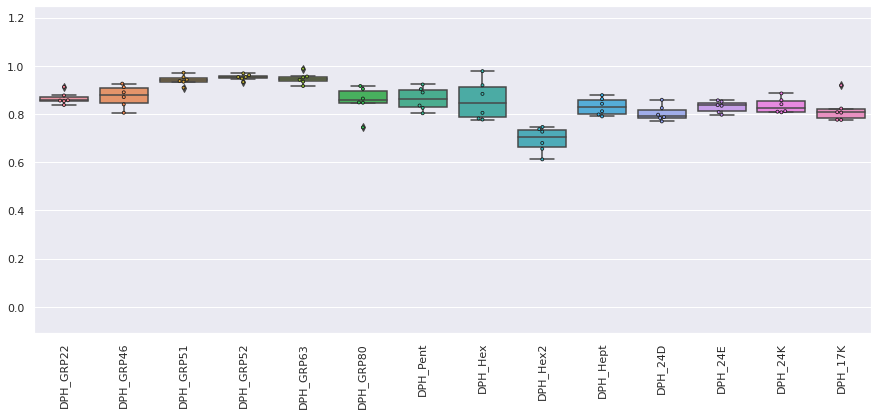

Green_Qi


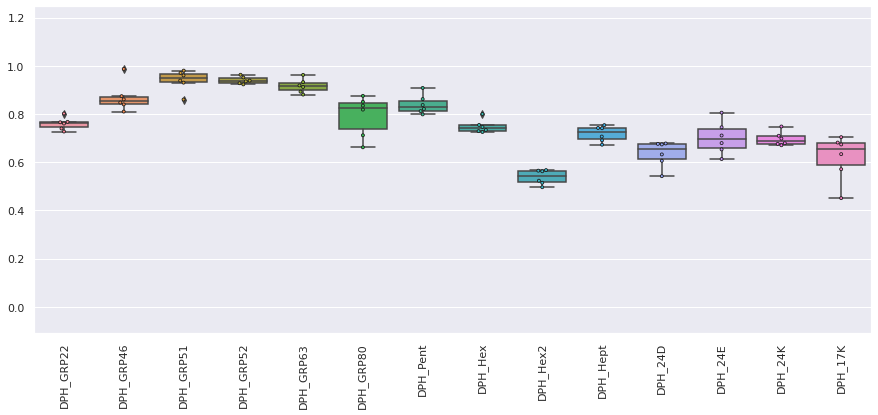

Green_Sainsburys


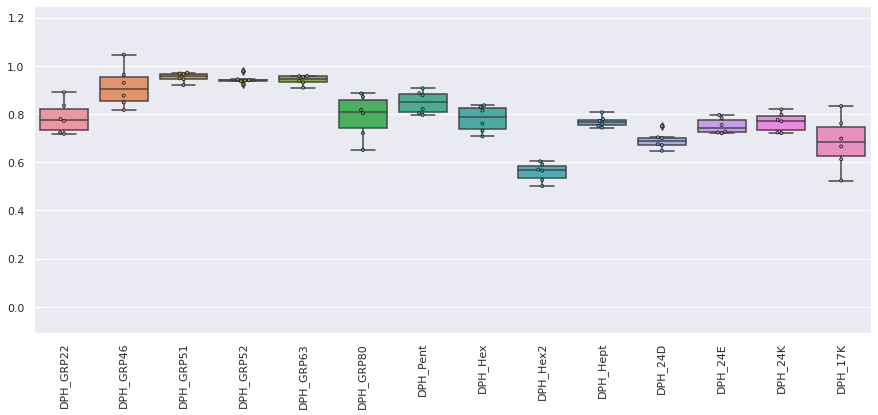

Green_Tetley


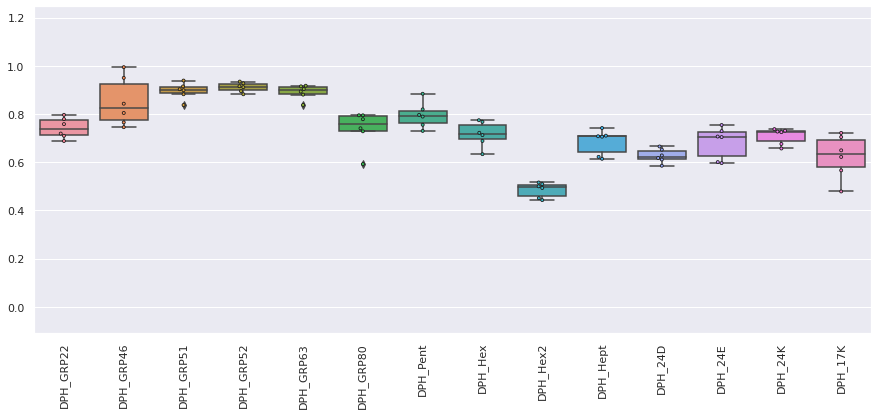

Green_Twinings


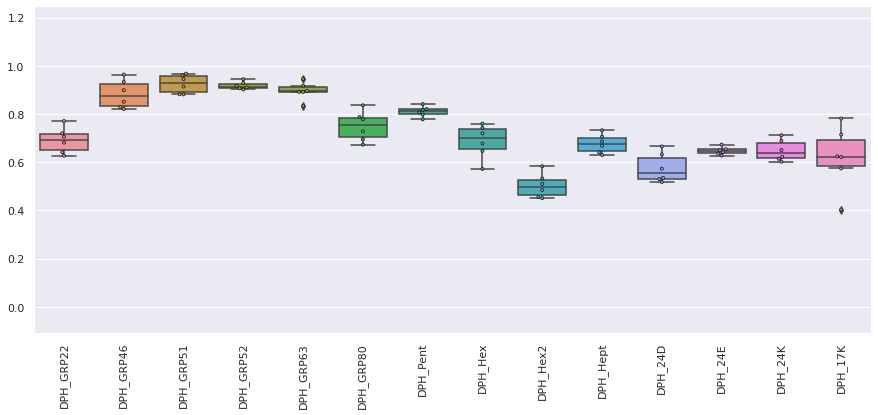

Grey_Asda


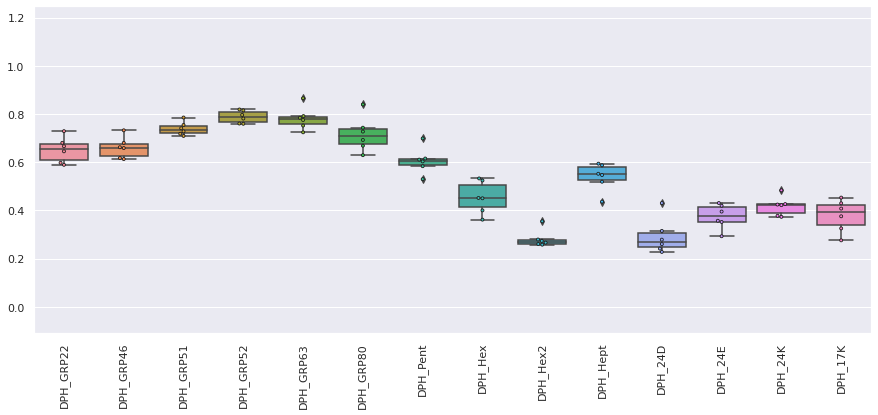

Grey_Clipper


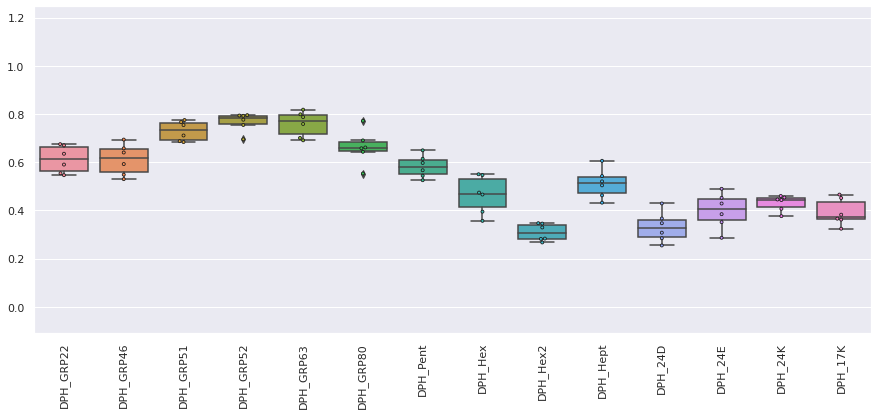

Grey_Coop


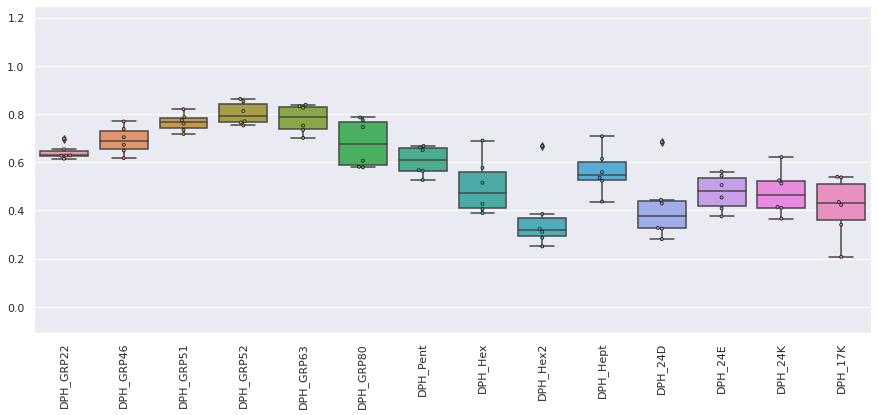

Grey_Devonshire


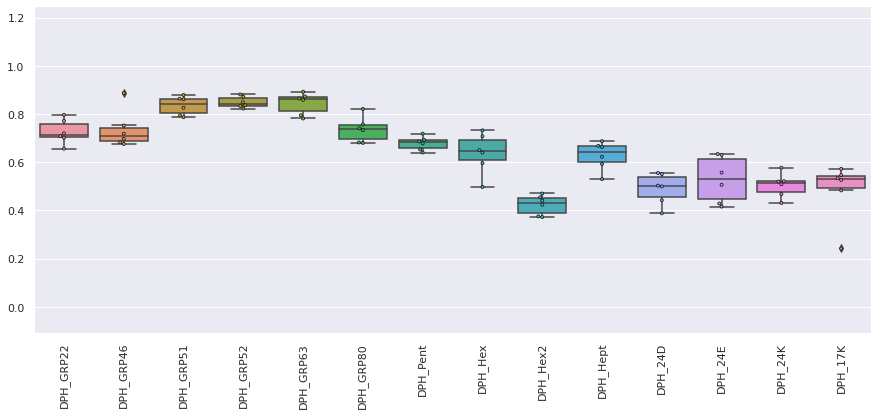

Grey_Diplomat


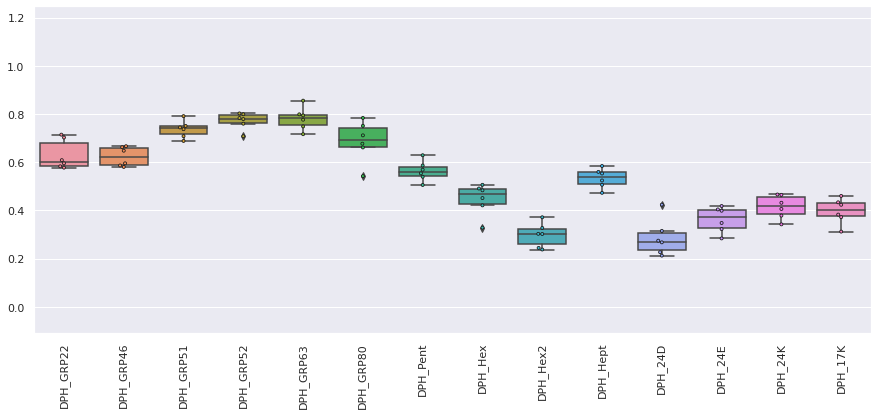

Grey_Joes


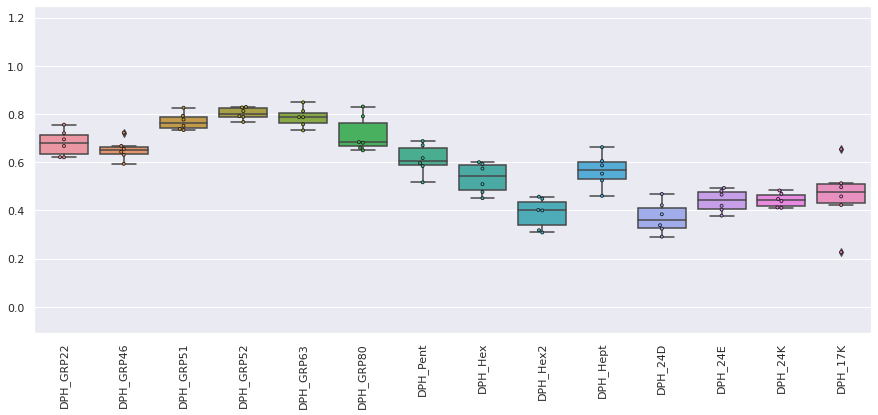

Grey_Mands


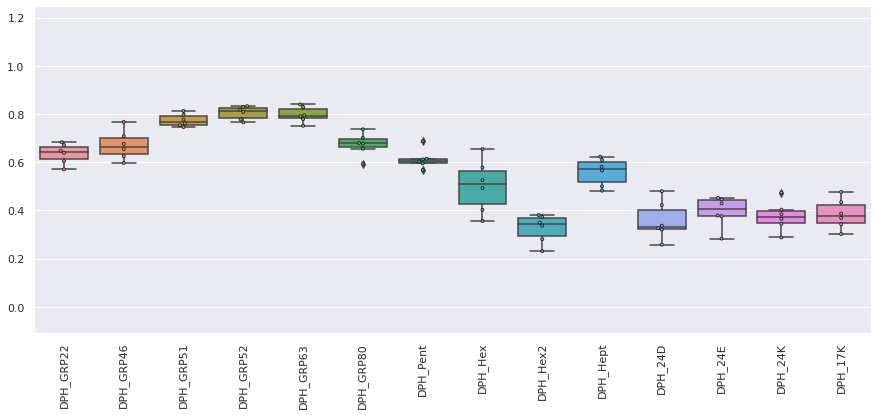

Grey_Pukka


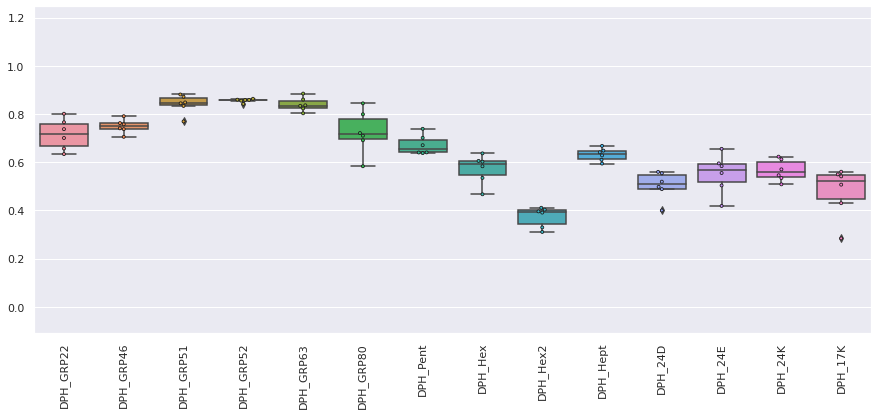

Grey_Tesco


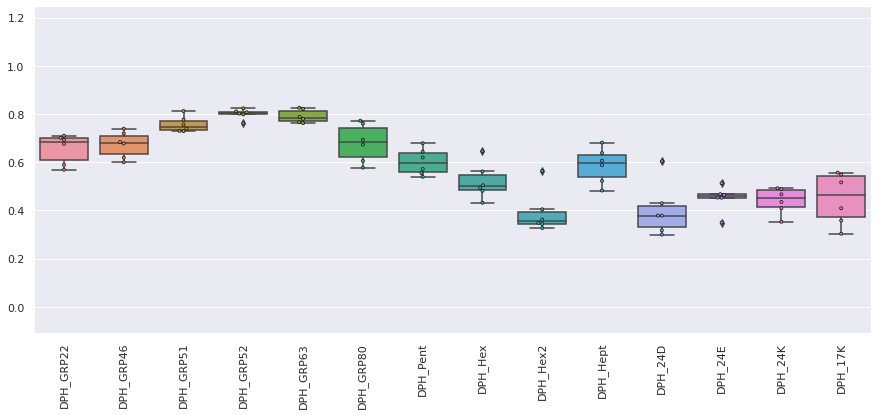

Grey_Twinings


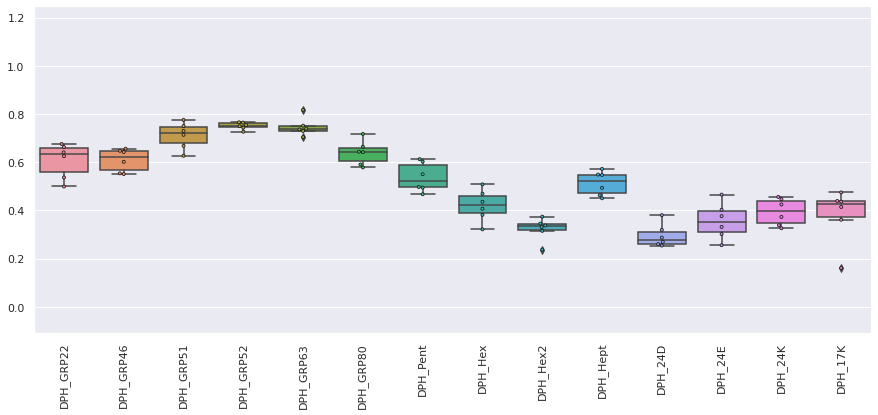




Scaled_data:



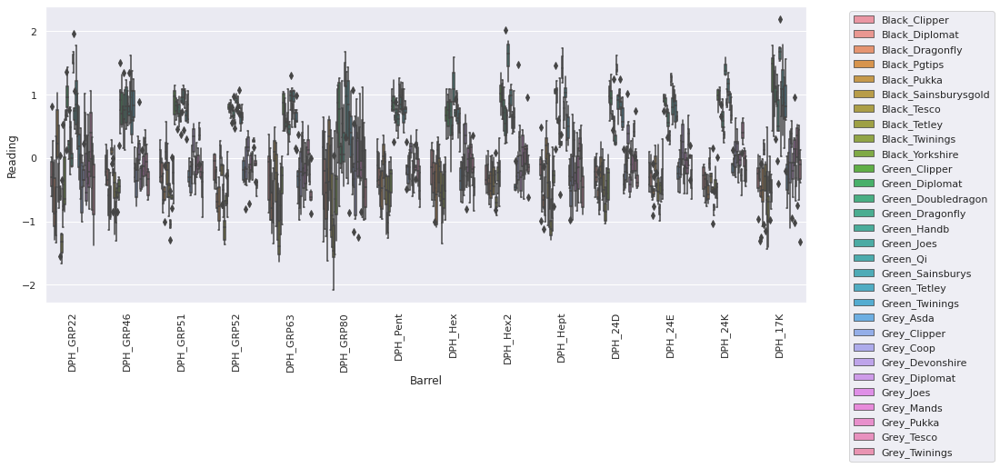

Black_Clipper


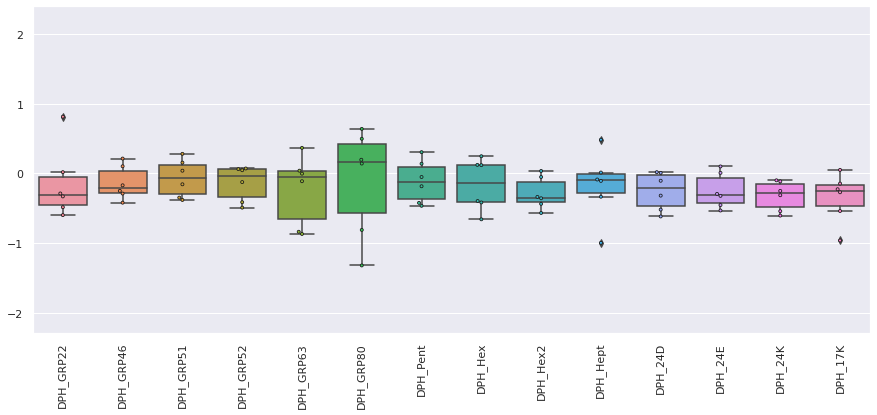

Black_Diplomat


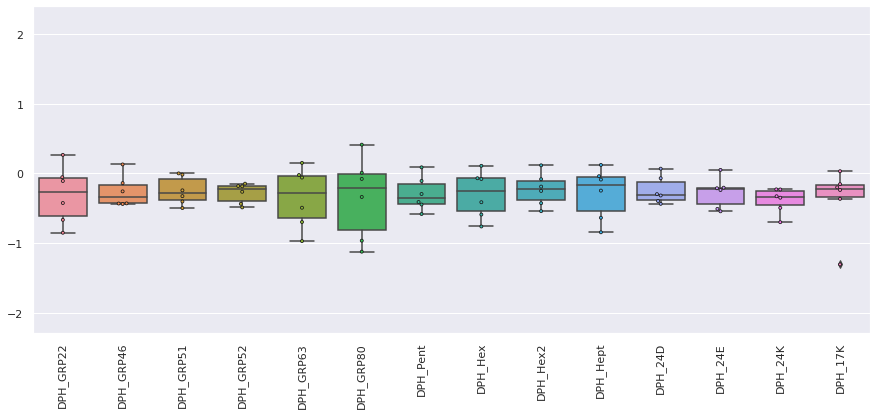

Black_Dragonfly


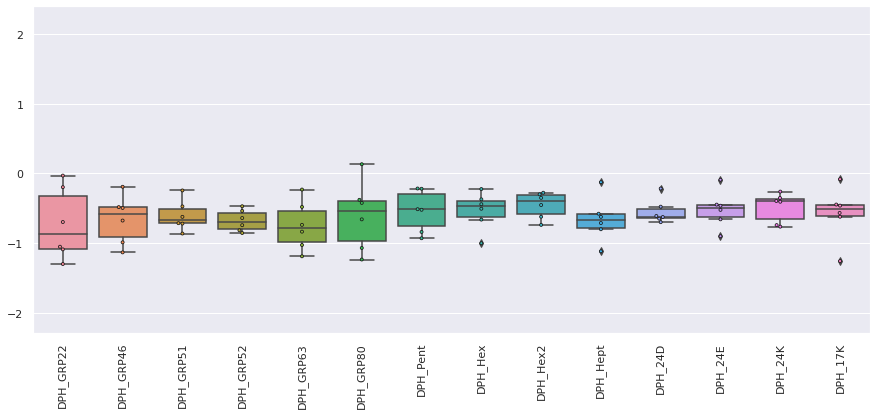

Black_Pgtips


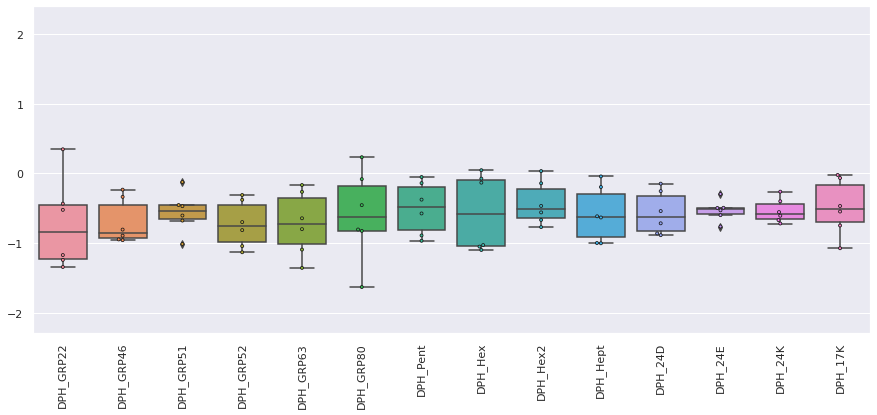

Black_Pukka


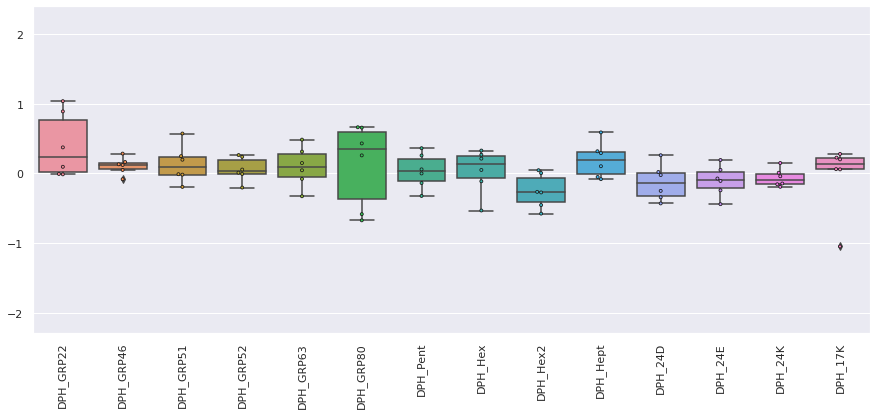

Black_Sainsburysgold


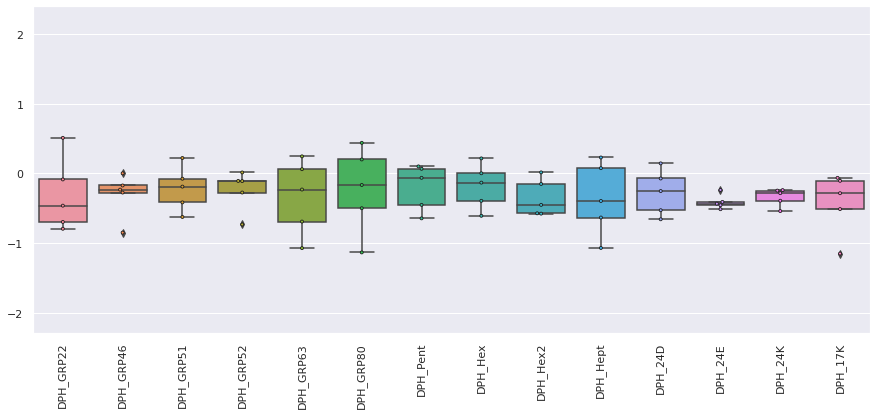

Black_Tesco


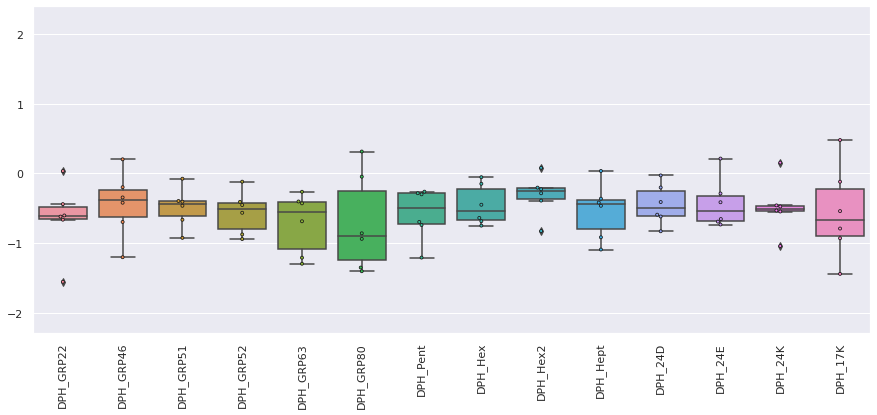

Black_Tetley


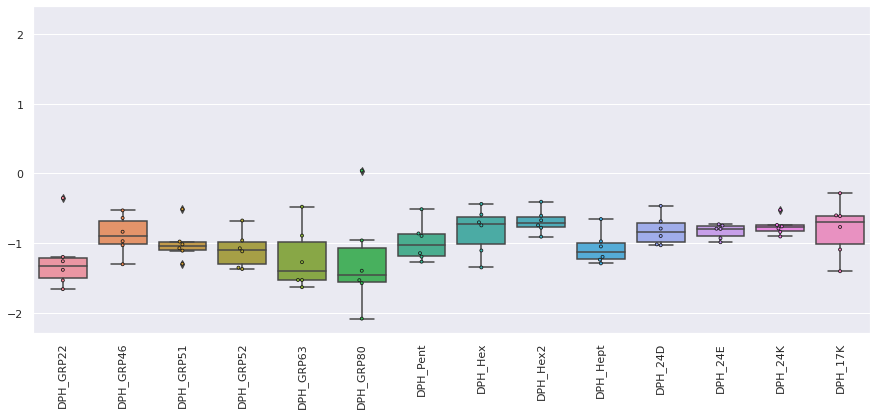

Black_Twinings


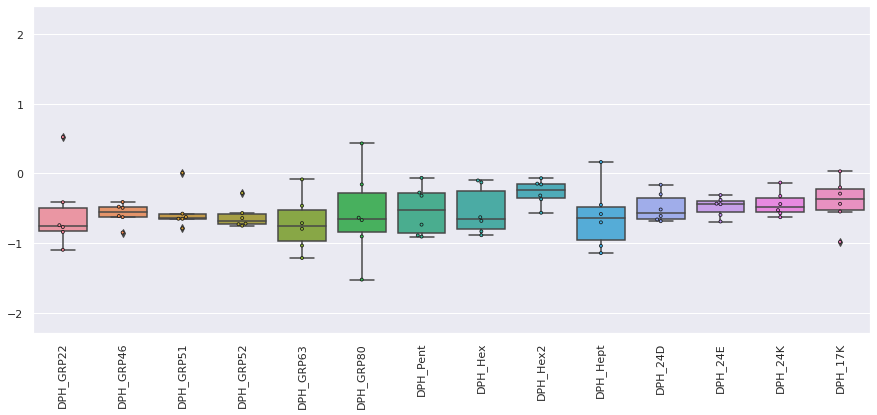

Black_Yorkshire


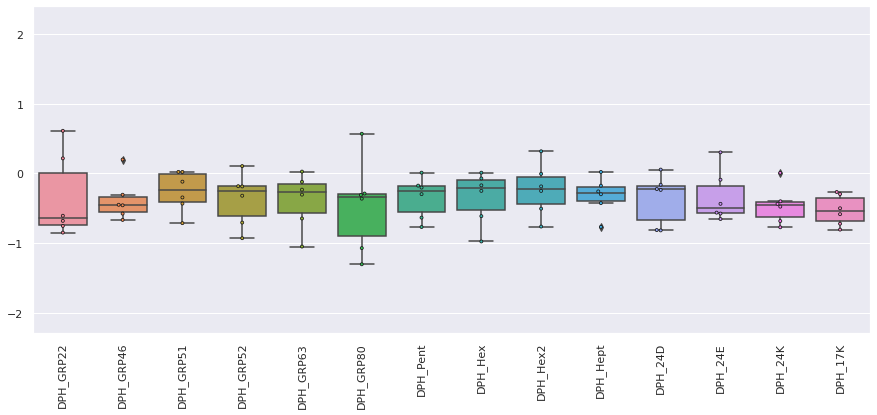

Green_Clipper


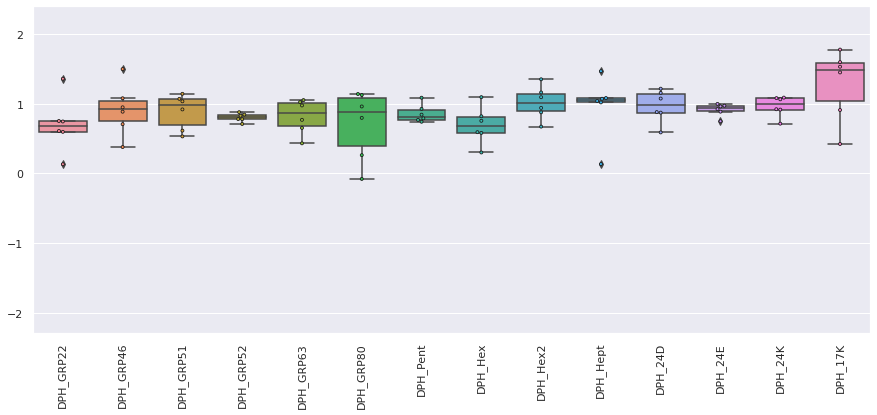

Green_Diplomat


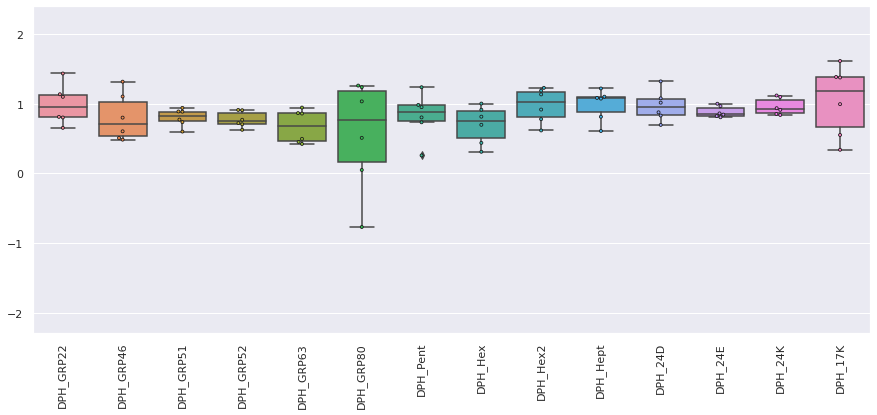

Green_Doubledragon


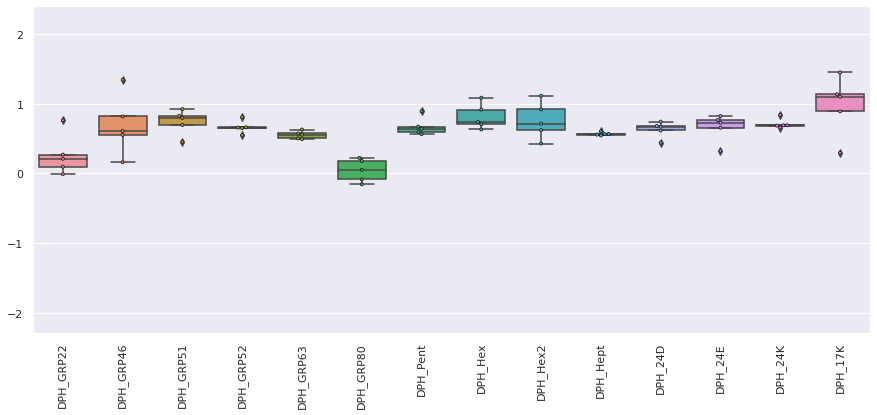

Green_Dragonfly


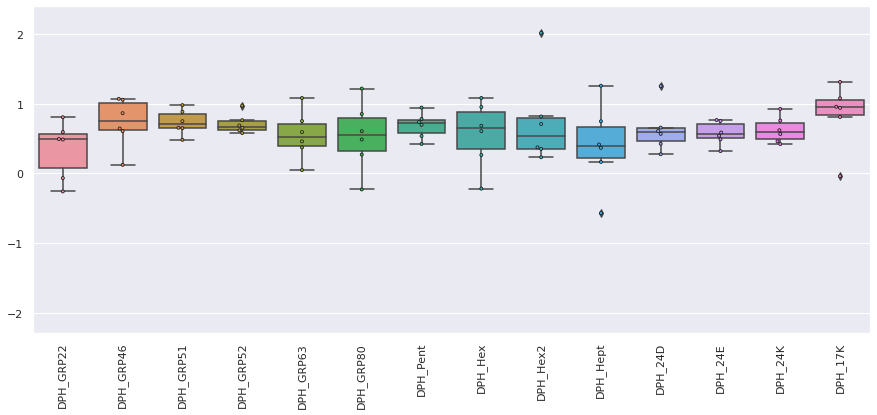

Green_Handb


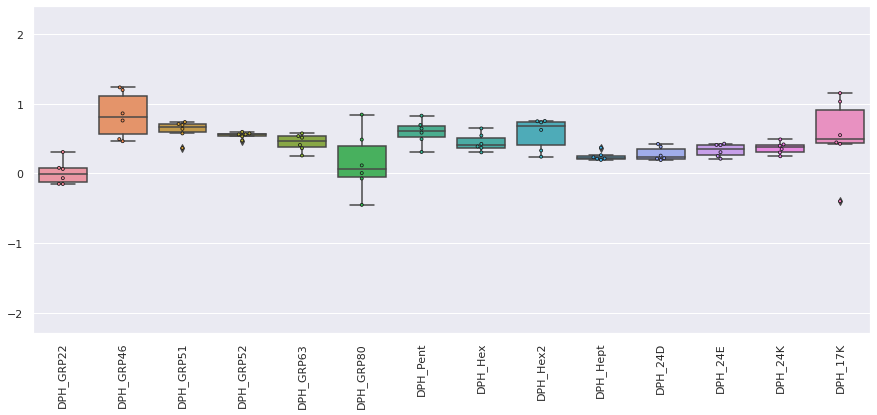

Green_Joes


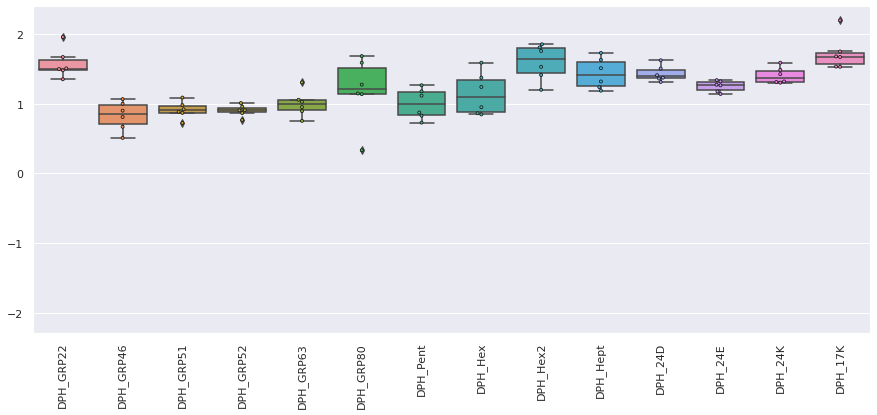

Green_Qi


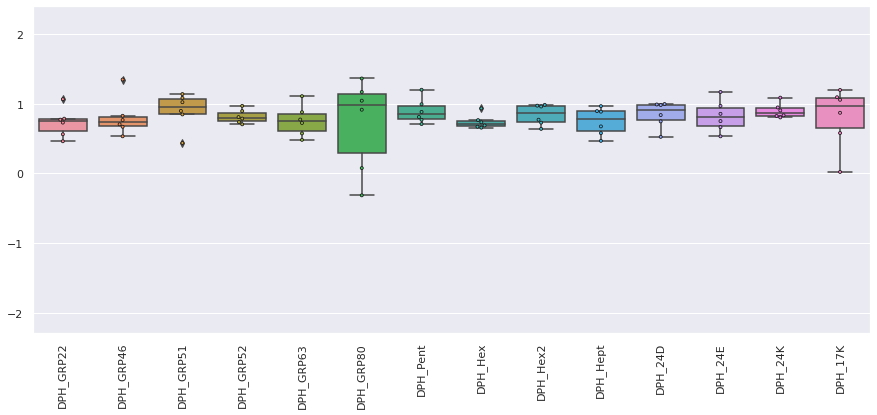

Green_Sainsburys


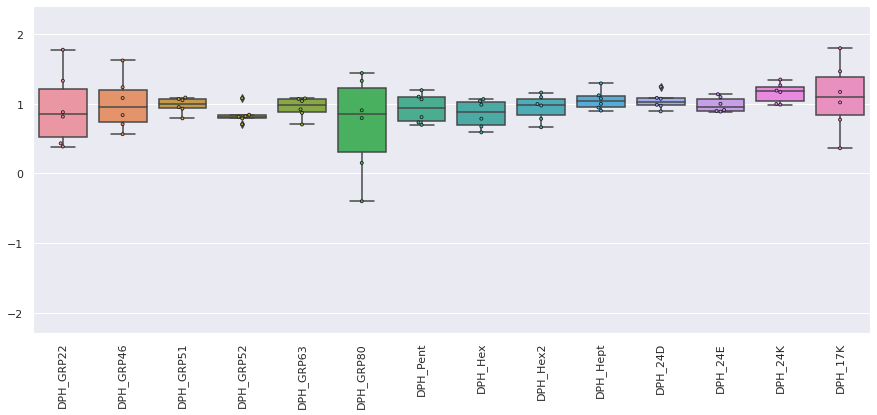

Green_Tetley


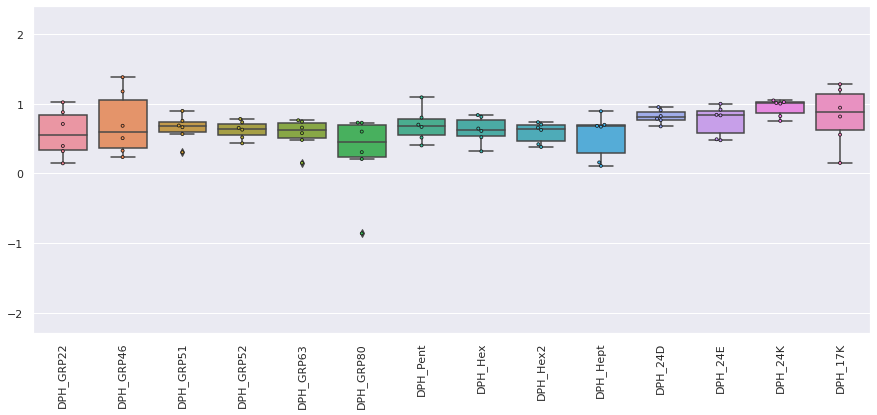

Green_Twinings


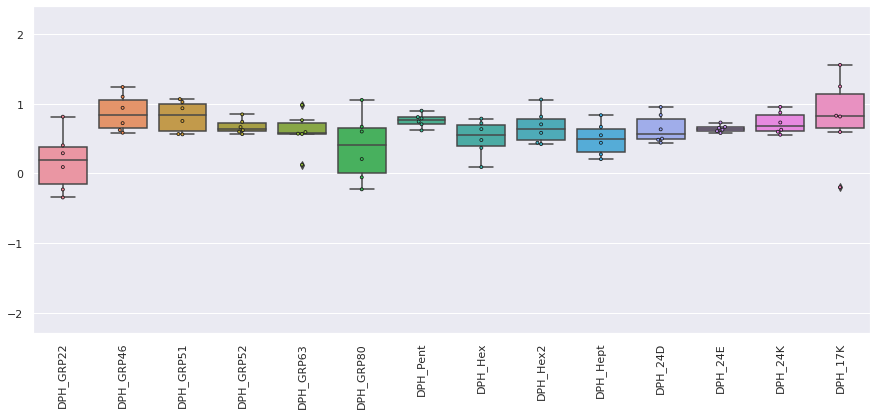

Grey_Asda


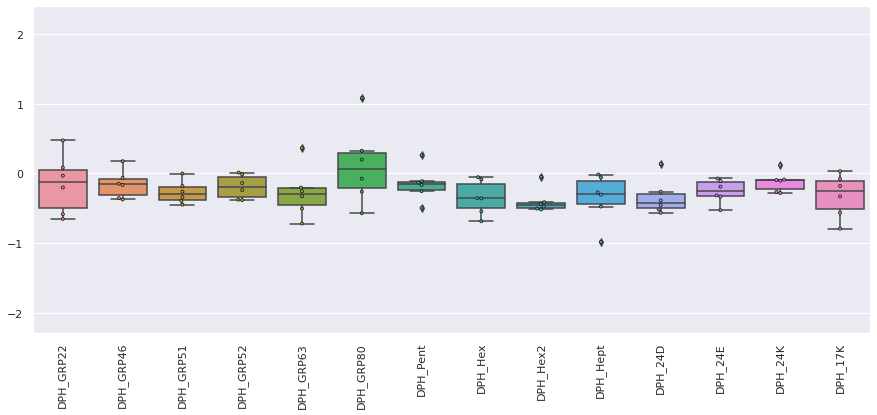

Grey_Clipper


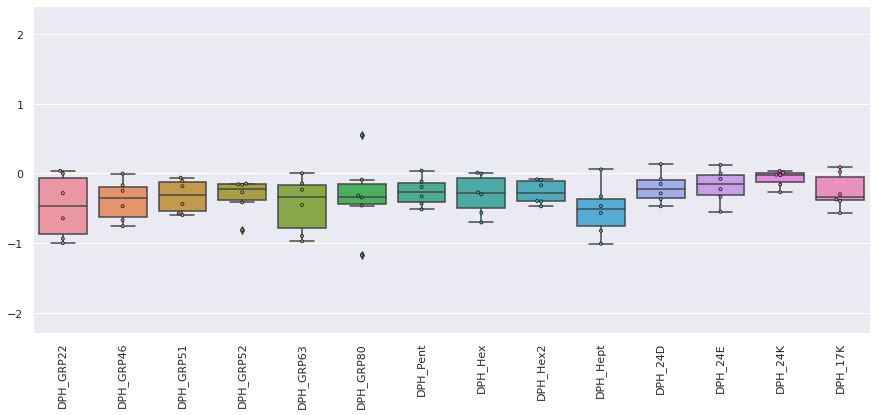

Grey_Coop


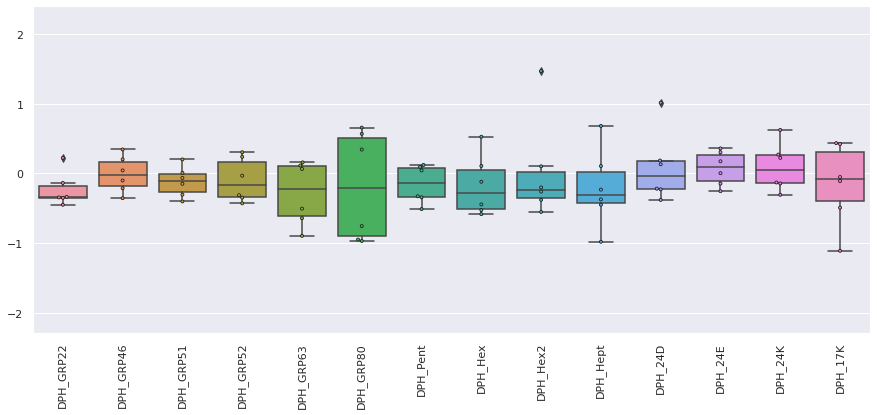

Grey_Devonshire


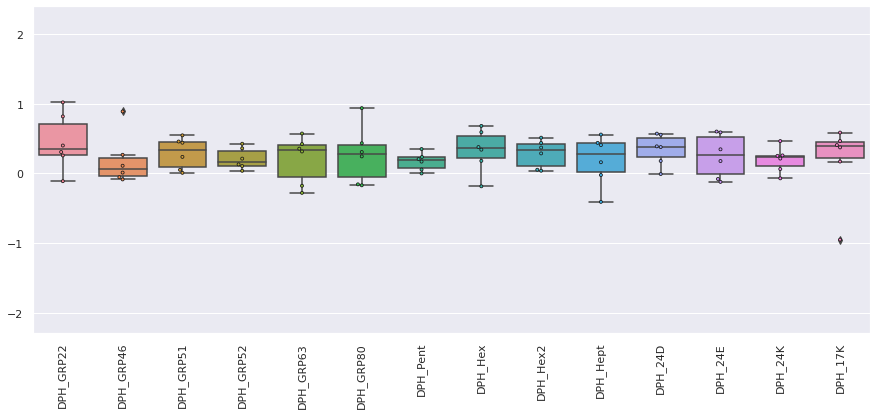

Grey_Diplomat


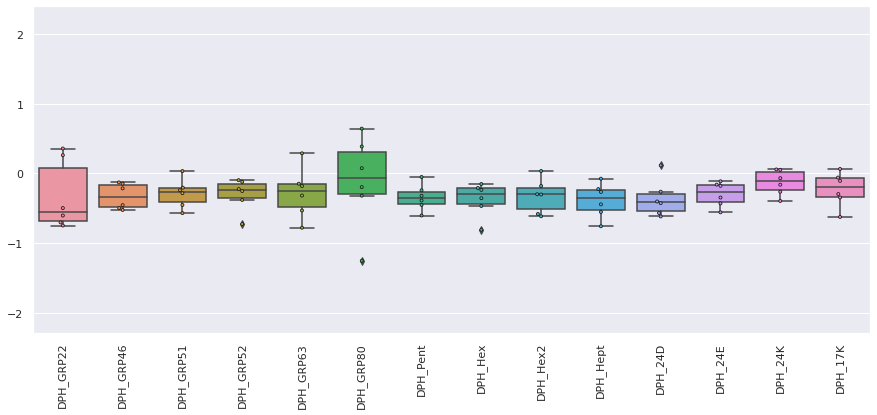

Grey_Joes


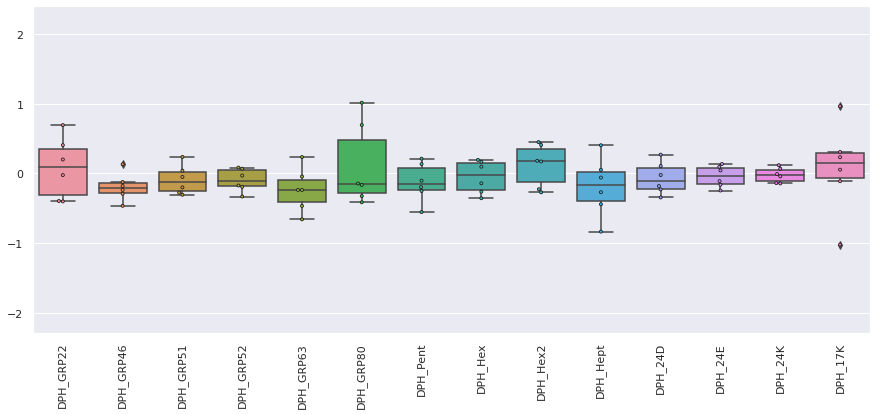

Grey_Mands


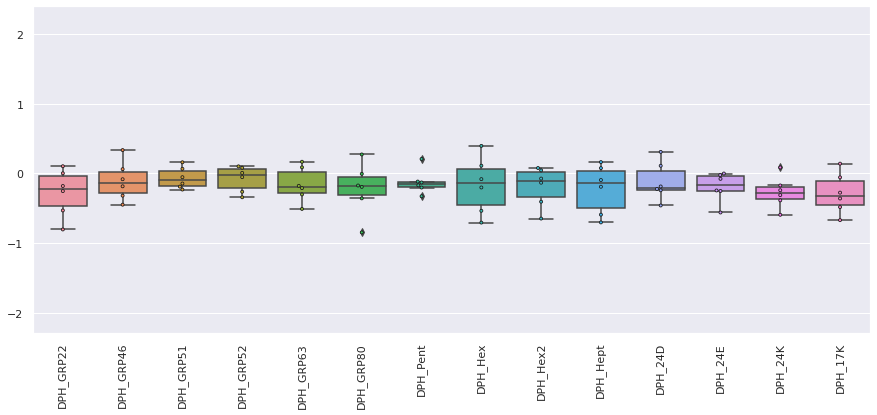

Grey_Pukka


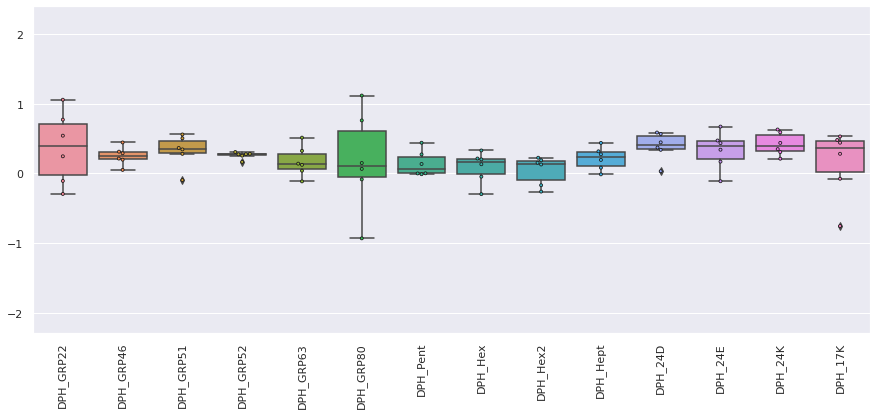

Grey_Tesco


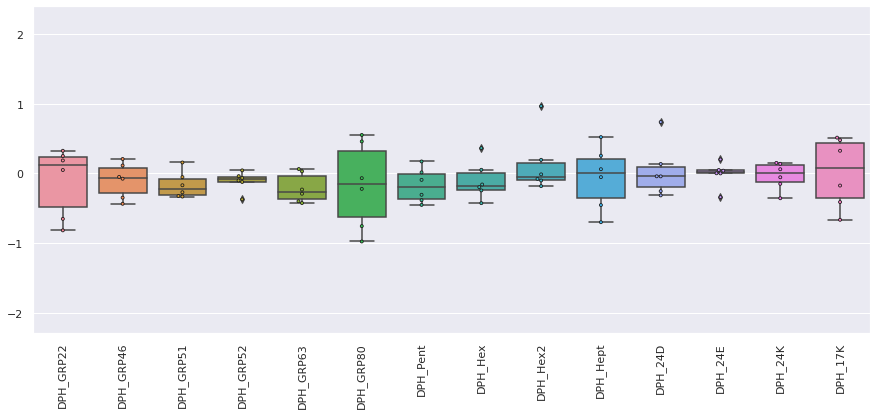

Grey_Twinings


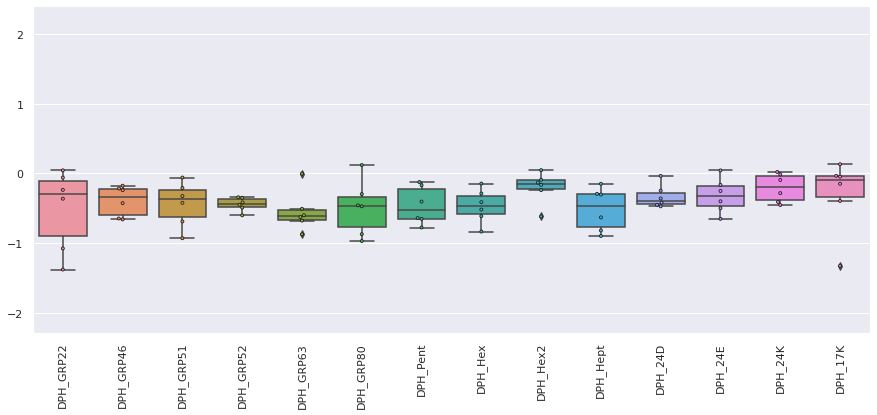

In [8]:
plot_dir = '/home/ks17361/ML_environment/BADASS/Tea_analysis_standard_array/Tea_split_brand/Tea_subclasses'
if os.path.isdir(plot_dir):
    shutil.rmtree(plot_dir)
os.mkdir(plot_dir)

tea_fluor_data.display_data_distribution(prefix='Tea_subclasses', results_dir=plot_dir)

- When looking at the scaled data, there are no peptides that (by eye) obviously have a much larger overlap between classes as compared to the others => will not discard any peptides prior to ML analysis.
- There is a clear separation between the readings for the different classes (black, green and grey) for most of the peptides. This difference is clearer in the box plots below.

In [9]:
orig_ml_fluor_data = copy.deepcopy(tea_fluor_data.ml_fluor_data)

In [10]:
tea_fluor_data.ml_fluor_data['Sub_analyte'] = copy.deepcopy(
    tea_fluor_data.ml_fluor_data['Analyte'].tolist()
)
tea_fluor_data.ml_fluor_data['Analyte'] = [
    sub_analyte.split('_')[0] for sub_analyte in tea_fluor_data.ml_fluor_data['Sub_analyte'].tolist()
]

In [11]:
tea_fluor_data.ml_fluor_data

,DPH_GRP22,DPH_GRP46,DPH_GRP51,DPH_GRP52,DPH_GRP63,DPH_GRP80,DPH_Pent,DPH_Hex,DPH_Hex2,DPH_Hept,DPH_24D,DPH_24E,DPH_24K,DPH_17K,Analyte,Sub_analyte
0,0.770833,0.740506,0.833402,0.826160,0.865524,0.783126,0.708304,0.579495,0.371518,0.675242,0.392812,0.363492,0.418844,0.397297,Black,Black_Clipper
1,0.609858,0.657056,0.758733,0.827553,0.822795,0.765054,0.671219,0.614158,0.353727,0.578904,0.395564,0.315192,0.423071,0.414861,Black,Black_Clipper
2,0.629071,0.639836,0.811886,0.823772,0.817308,0.726695,0.599096,0.580502,0.290787,0.598415,0.360077,0.482610,0.364503,0.457071,Black,Black_Clipper
3,0.672202,0.716471,0.792045,0.798166,0.803099,0.719799,0.628737,0.439975,0.294794,0.582105,0.298486,0.454646,0.381460,0.330124,Black,Black_Clipper
4,0.595809,0.631378,0.726129,0.743110,0.708506,0.533542,0.545902,0.368947,0.247321,0.541889,0.212210,0.291503,0.284471,0.387989,Black,Black_Clipper
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.536609,0.550725,0.626597,0.726449,0.739340,0.663978,0.497152,0.469164,0.314888,0.493544,0.287103,0.255387,0.325865,0.414155,Grey,Grey_Twinings
174,0.499031,0.553648,0.667708,0.743179,0.729430,0.643352,0.466987,0.321256,0.237205,0.450170,0.253987,0.331324,0.338234,0.438871,Grey,Grey_Twinings
175,0.675419,0.655930,0.775342,0.764359,0.751502,0.578219,0.494607,0.406853,0.345350,0.572141,0.318987,0.465430,0.424531,0.361179,Grey,Grey_Twinings
176,0.662545,0.641927,0.729803,0.754484,0.735942,0.590698,0.612460,0.381349,0.330478,0.546958,0.260175,0.376118,0.446114,0.474494,Grey,Grey_Twinings





Original_data:


Black


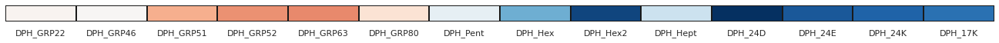


Green


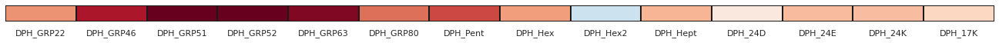


Grey


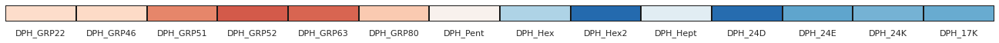




Scaled_data:


Black


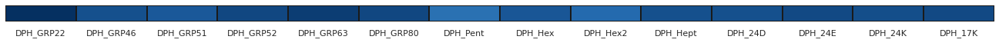


Green


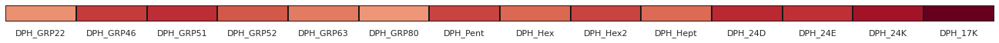


Grey


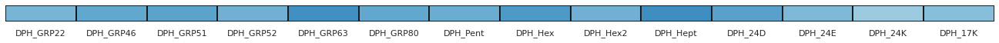




Original_data:



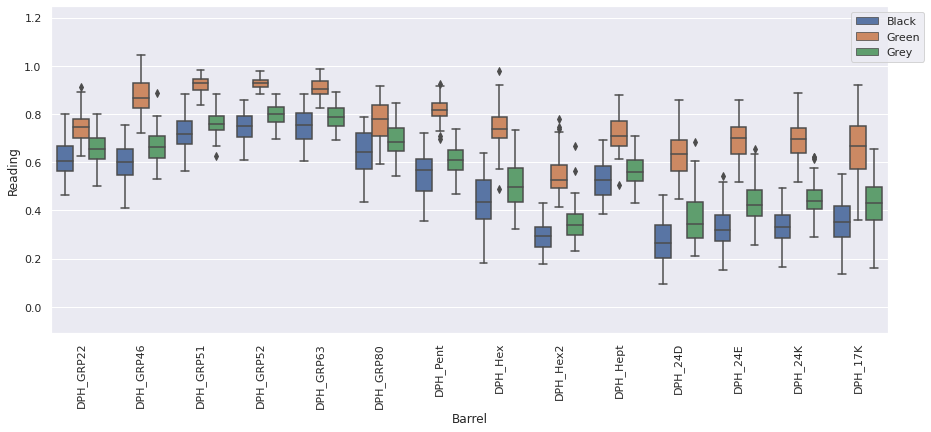

Black


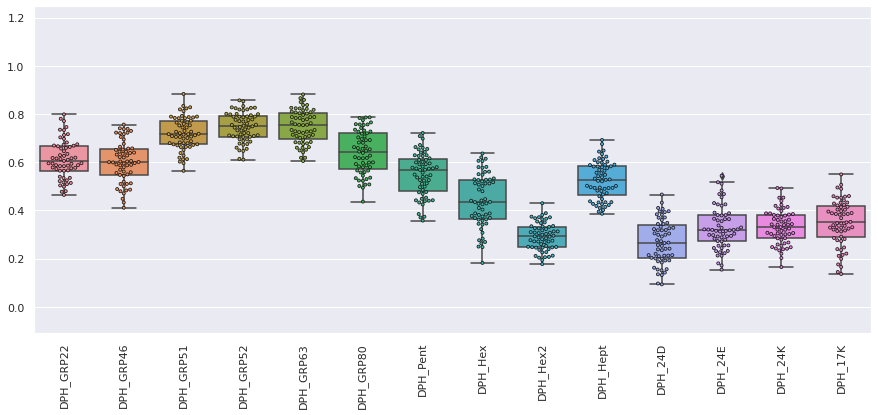

Green


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 13.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


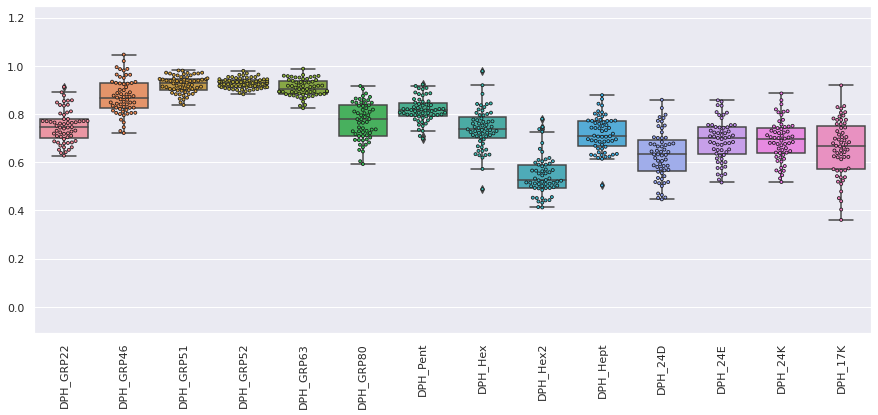

Grey


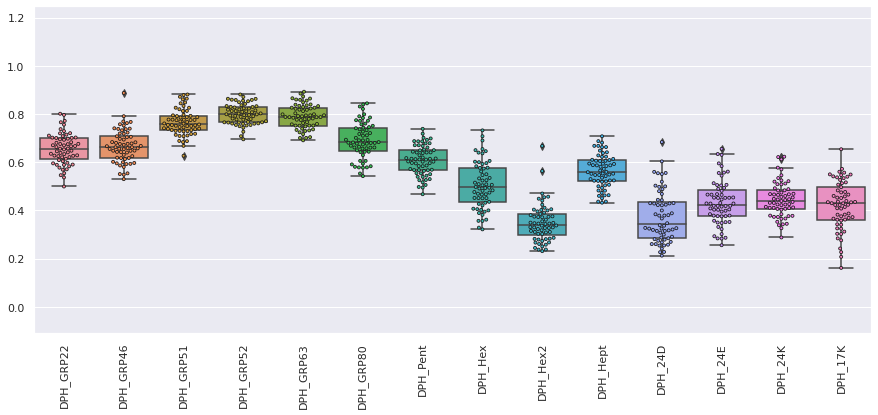




Scaled_data:



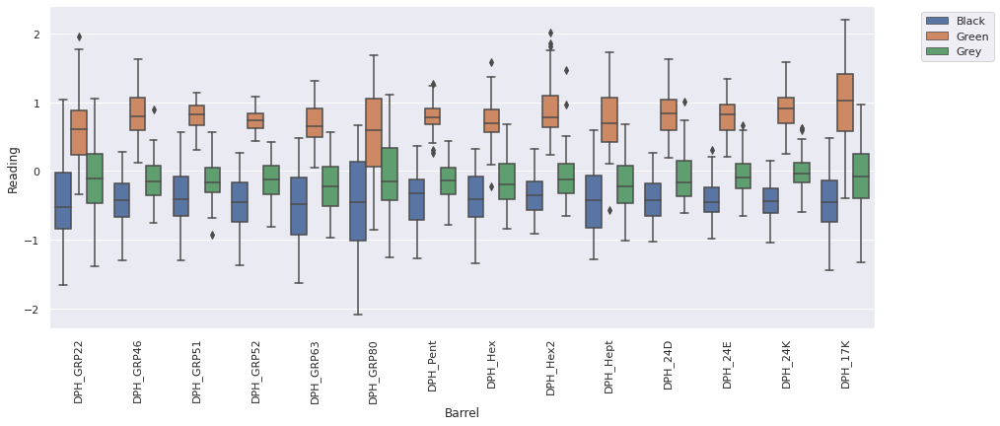

Black


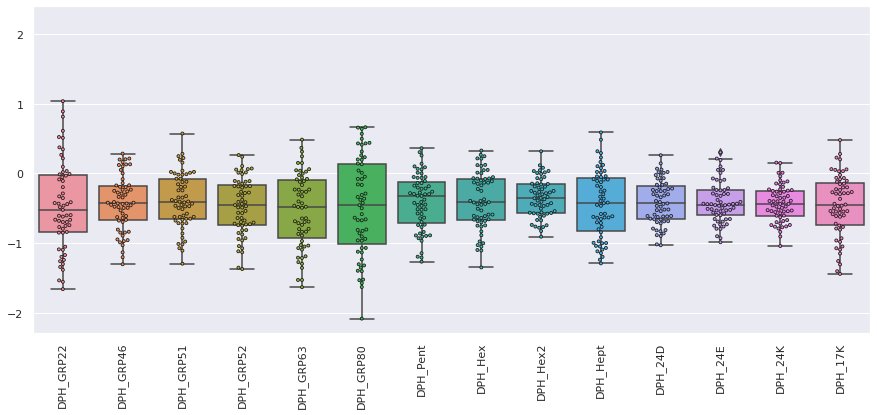

Green


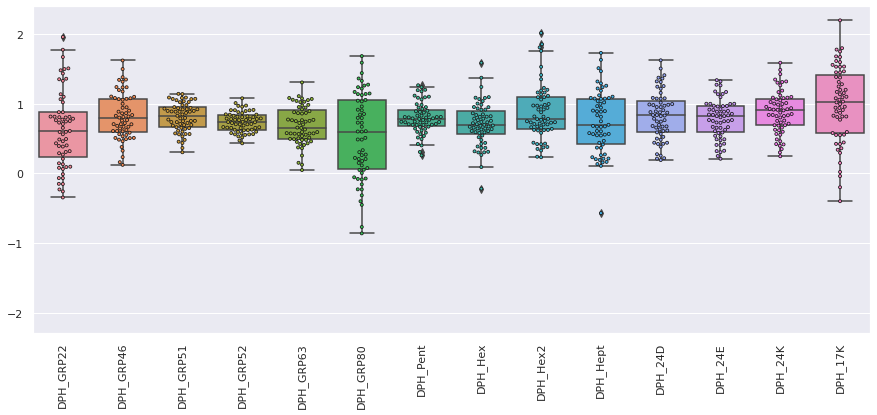

Grey


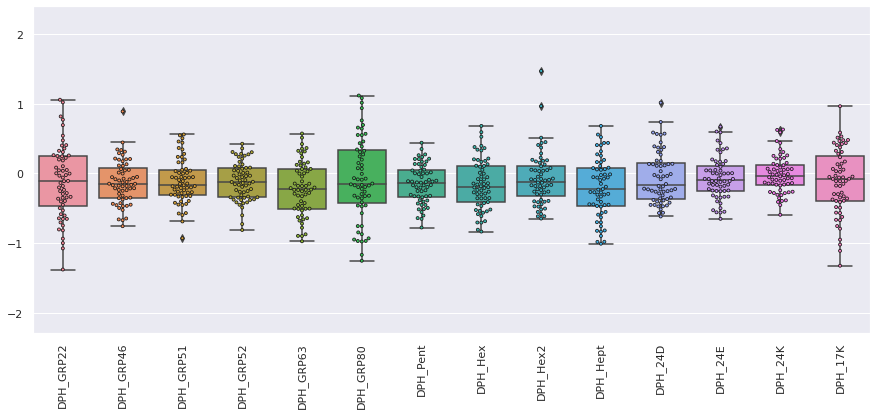

In [12]:
plot_dir = '/home/ks17361/ML_environment/BADASS/Tea_analysis_standard_array/Tea_split_brand/Tea_classes'
if os.path.isdir(plot_dir):
    shutil.rmtree(plot_dir)
os.mkdir(plot_dir)

tea_fluor_data.display_data_distribution(
    ml_fluor_data=tea_fluor_data.ml_fluor_data.drop(['Sub_analyte'], axis=1), results_dir=plot_dir,
    prefix='Tea_classes'
)

Even by eye there is a clear difference in the readings for the three classes, especially the green tea (which makes sense when one considers that grey tea is black tea plus bergamot, whereas green tea is chemically more different).

#### ML analysis

In [13]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/home/ks17361/ML_environment/BADASS/Tea_analysis_standard_array/Tea_split_brand/Tea_ML_plots',
    fluor_data=tea_fluor_data.ml_fluor_data.drop(['Analyte', 'Sub_analyte'], axis=1),
    classes=tea_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=tea_fluor_data.ml_fluor_data['Sub_analyte'].tolist(), shuffle=False
)

- Calculate feature correlations

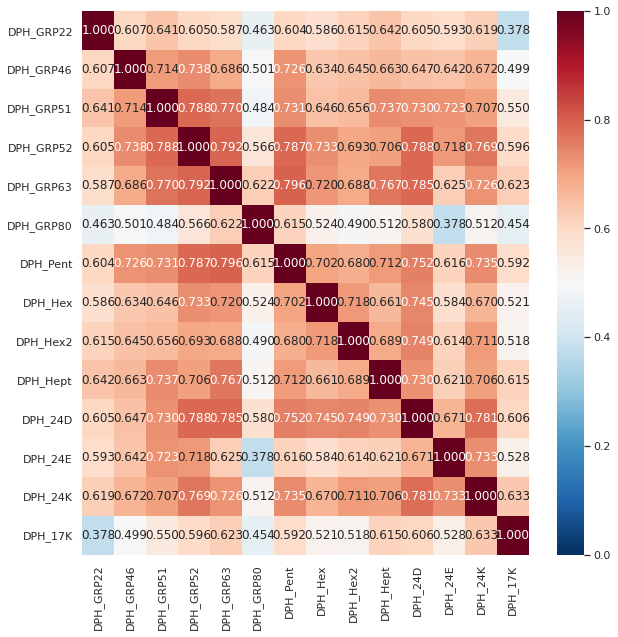

In [14]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

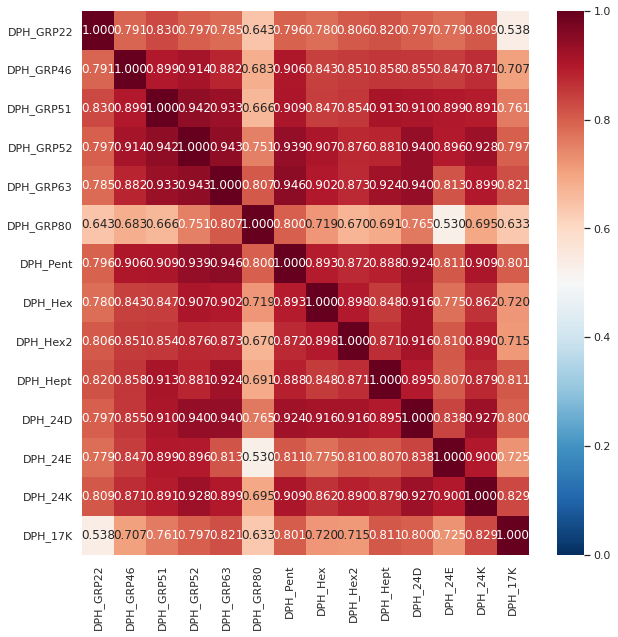

In [15]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

So, there are strong correlations between the readings provided by most of the barrels => likely that they are providing similar information to one another.

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

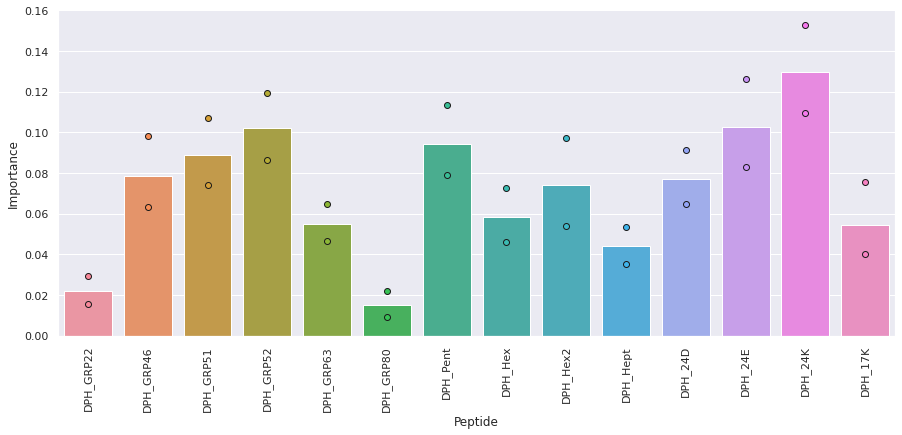

<Figure size 720x720 with 0 Axes>

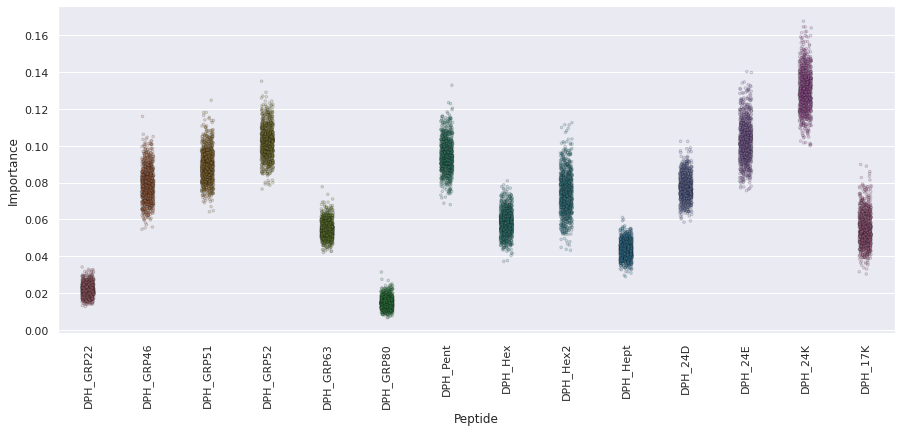

In [16]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [17]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_24K,0.129855
1,DPH_24E,0.102388
2,DPH_GRP52,0.102042
3,DPH_Pent,0.094042
4,DPH_GRP51,0.088760
5,DPH_GRP46,0.078599
6,DPH_24D,0.077226
7,DPH_Hex2,0.074120
8,DPH_Hex,0.058385
9,DPH_GRP63,0.054682


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another.

This analysis indicates that many of the peptides provide substantial information about analyte class. 24K, 24E and GRP52 are the three peptides found to provide the most information by this analysis, whilst GRP22 and GRP80 provide the least.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

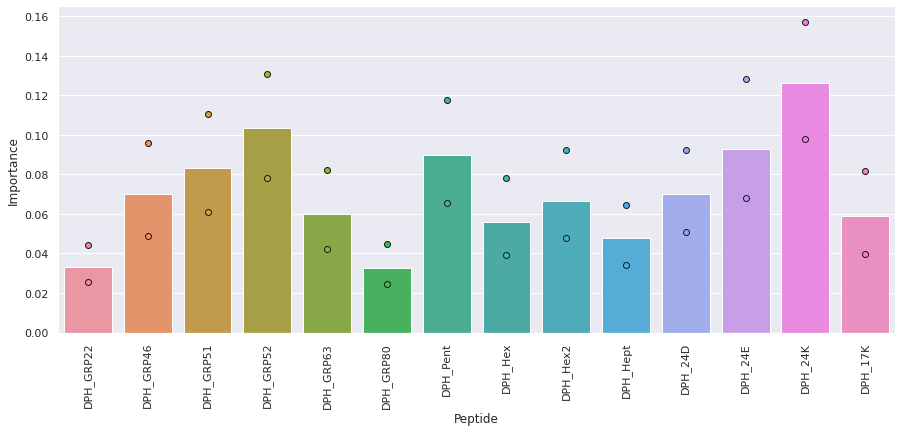

<Figure size 720x720 with 0 Axes>

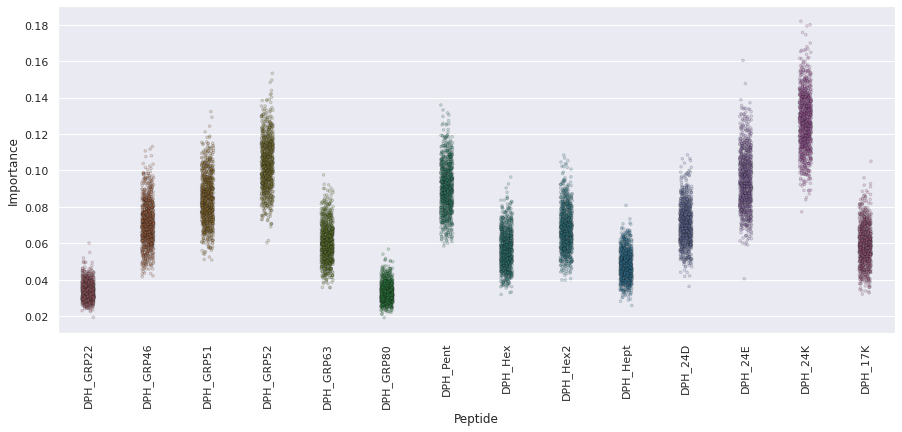

In [18]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [19]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_24K,0.126410
1,DPH_GRP52,0.103239
2,DPH_24E,0.093047
3,DPH_Pent,0.089782
4,DPH_GRP51,0.083335
5,DPH_GRP46,0.070310
6,DPH_24D,0.070016
7,DPH_Hex2,0.066788
8,DPH_GRP63,0.059764
9,DPH_17K,0.058700


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

Whilst there are some small differences in the relative order of the peptides, the ExtraTrees classifier identifies the same peptides as being most and least important as the KBest analysis.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

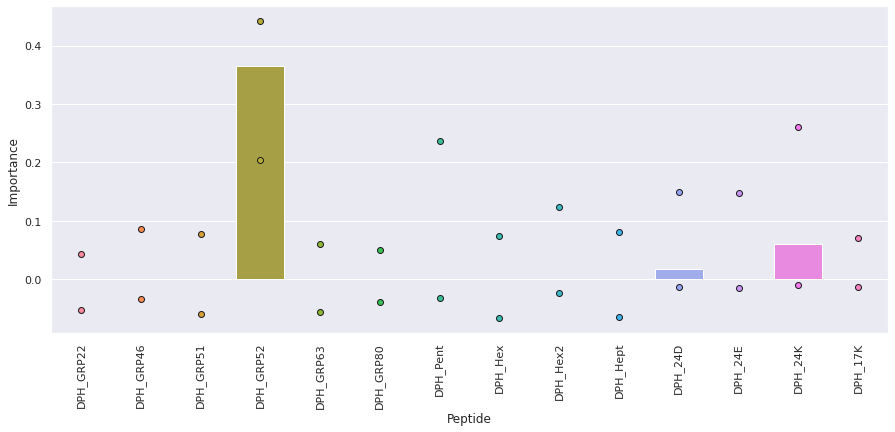

<Figure size 720x720 with 0 Axes>

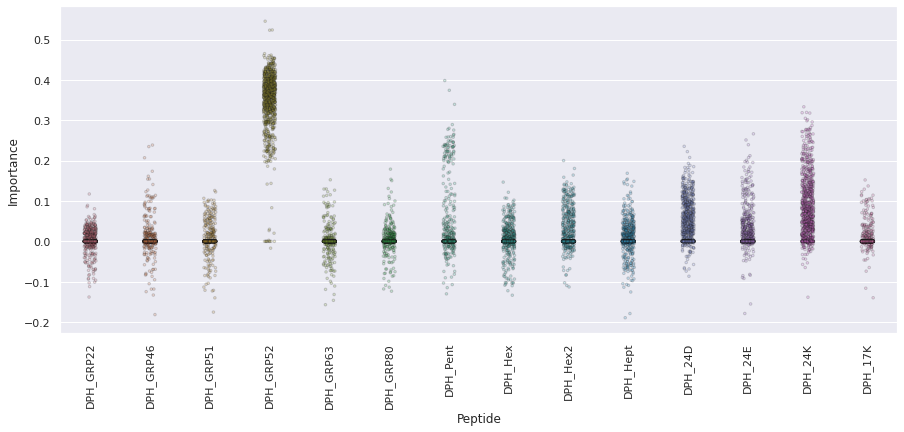

In [20]:
f1 = make_scorer(f1_score, average='weighted')
median_permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1, num_repeats=1000,
    scale=True, plt_name=''
)

In [21]:
print('Peptides ordered by median importance:')
median_permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_GRP52,0.364468
1,DPH_24K,0.061251
2,DPH_24D,0.017200
3,DPH_GRP22,0.000000
4,DPH_GRP46,0.000000
5,DPH_GRP51,0.000000
6,DPH_GRP63,0.000000
7,DPH_GRP80,0.000000
8,DPH_Pent,0.000000
9,DPH_Hex,0.000000


In [22]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [23]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_GRP52,0.351619
1,DPH_24K,0.077960
2,DPH_24D,0.037281
3,DPH_Pent,0.019883
4,DPH_24E,0.017453
5,DPH_Hex2,0.014908
6,DPH_Hept,0.005383
7,DPH_17K,0.004554
8,DPH_GRP46,0.003564
9,DPH_Hex,0.003108


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

The results obtained with permutation look more different as compared to the difference between the KBest and ExtraTrees analysis, which is perhaps not surprising given that as described above permutation analysis takes feature correlation into account (whereas the former two methods do not).

According to permutation analysis, GRP52 contributes by far the most unique information about the output class. In contrast, although the other two methods also highlight GRP52 as one of the most important features, it is one of several similarly important peptides.

- What percentage of the signal in the data can be measured by N principal components?

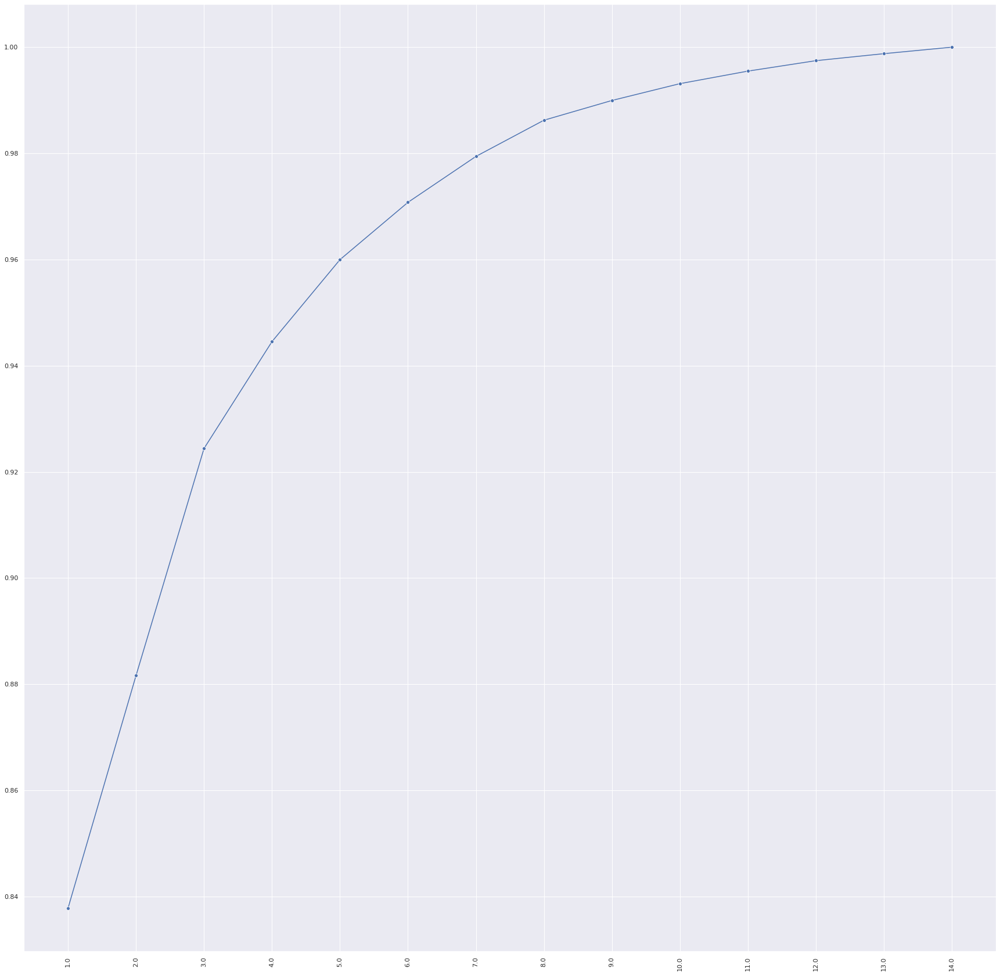

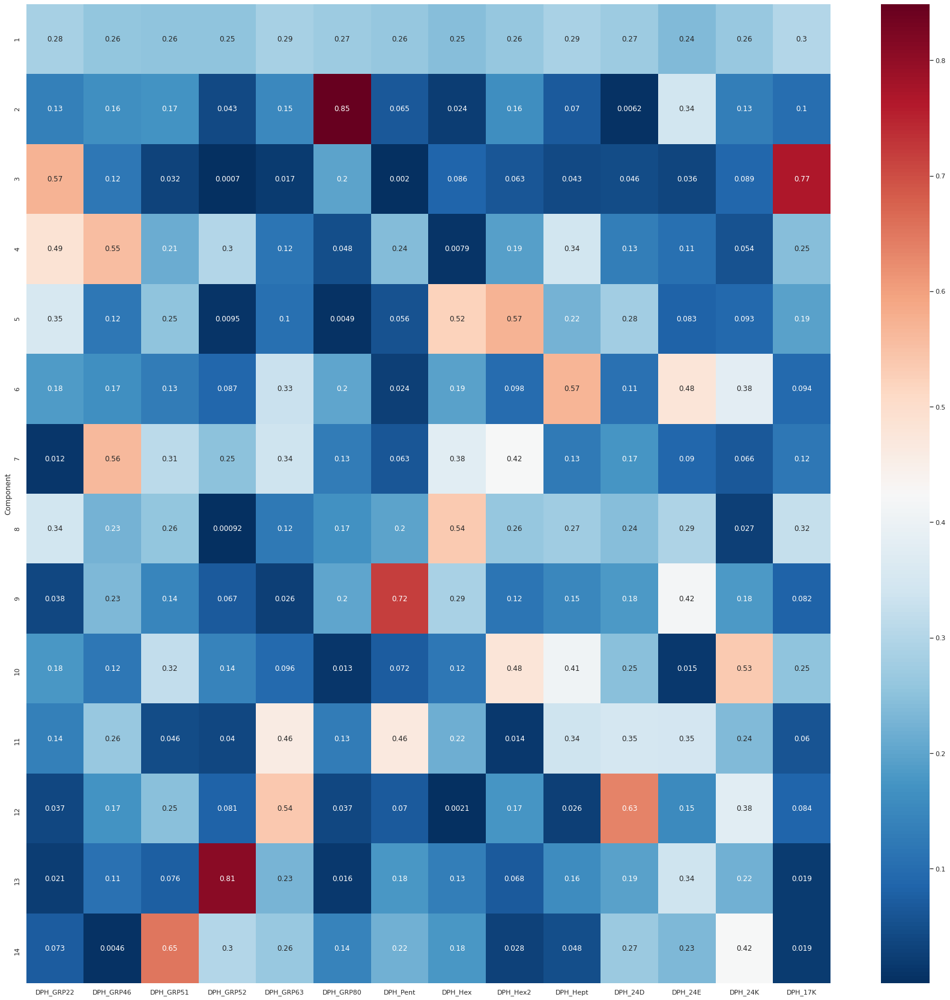

In [24]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(fluor_data=ml.fluor_data, scale=True, plt_name='')
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

Over 92% of the variance in the data can be represented by just three principal components, whilst the first principal component represents almost 84% of the variance. Most of the peptides make similar contributions to the first component, whereas GRP80 makes the dominant contribution to the second component.

Scatter plots of data transformed to PCA dimensions

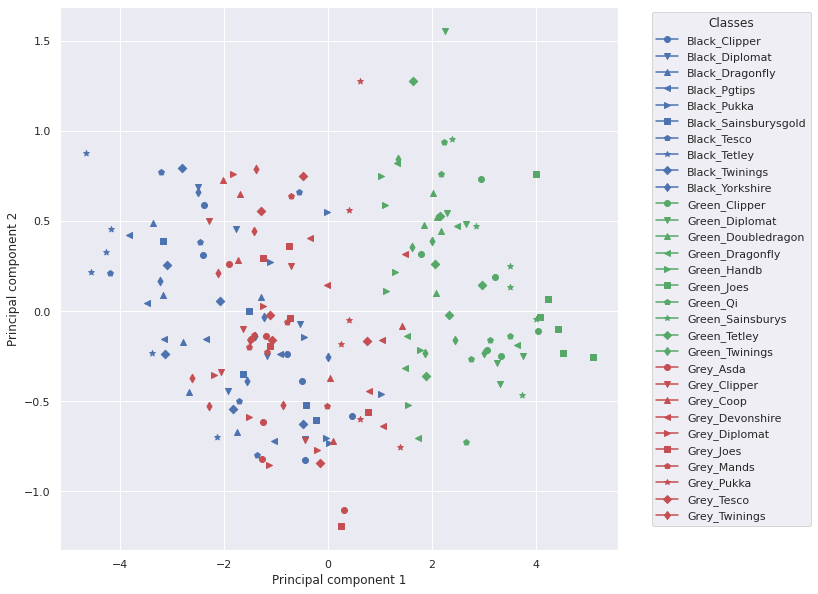

In [25]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=ml.sub_classes, num_dimensions=2, scale=True, plt_name=''
)

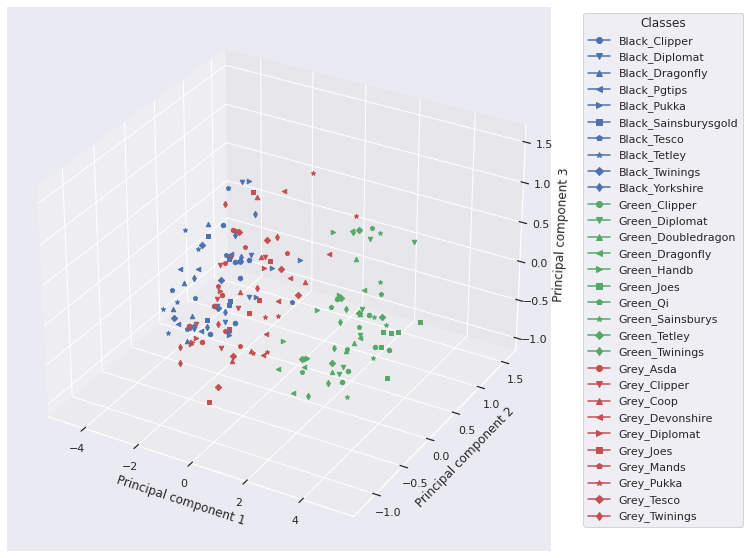

In [26]:
ml.plot_scatter_on_pca_axes(
    x=ml.x, y=ml.y, subclasses=ml.sub_classes, num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter plots of fluorescence readings, the three classes can be distinguished by eye on these scatter plots on PCA axes. In particular, the green tea samples cluster separately, whereas there is more overlap between the black and grey teas (which as described above is what might be predicted given the chemical compositions of the three tea types).

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [27]:
def make_splits(groups_array, input_groups):
    splits_classes = []
    splits_indices = []

    for n in range(groups_array.shape[0]):
        test_groups = groups_array[n]
        train_groups = [group for group in list(groups_array.flatten()) if not group in test_groups]
        splits_classes.append((np.array(train_groups), np.array(test_groups)))

        train_m = [m for m in range(input_groups.shape[0]) if not input_groups[m] in test_groups]
        test_m = [m for m in range(input_groups.shape[0]) if input_groups[m] in test_groups]
        splits_indices.append([np.array(train_m), np.array(test_m)])

    return splits_classes, splits_indices

In [28]:
all_groups = sorted(list(set(list(ml.sub_classes))))

outer_splits_list = [[] for n in range(3)]
for tea in all_groups:
    tea_class = tea.split('_')[0]
    if tea_class == 'Black':
        outer_splits_list[0].append(tea)
    elif tea_class == 'Grey':
        outer_splits_list[1].append(tea)
    elif tea_class == 'Green':
        outer_splits_list[2].append(tea)  

for n in range(len(outer_splits_list)):
    pass  # random.shuffle(outer_splits_list[n])  Comment out to ensure same splits are replicated when re-run the notebook

outer_splits_array = np.array(outer_splits_list).T
outer_splits_classes, outer_splits_indices = make_splits(outer_splits_array, ml.sub_classes)

In [29]:
inner_splits_classes = OrderedDict()
inner_splits_indices = OrderedDict()
for i, split in enumerate(outer_splits_classes):
    outer_train = list(split[0])
    inner_groups = np.array([group for group in ml.sub_classes if group in outer_train])

    inner_splits_list = [[] for n in range(3)]
    for tea in outer_train:
        tea_class = tea.split('_')[0]
        if tea_class == 'Black':
            inner_splits_list[0].append(tea)
        elif tea_class == 'Grey':
            inner_splits_list[1].append(tea)
        elif tea_class == 'Green':
            inner_splits_list[2].append(tea)  

    for n in range(len(inner_splits_list)):
        pass  # random.shuffle(inner_splits_list[n])  Comment out to ensure same splits are replicated when re-run the notebook

    inner_splits_array = np.array(inner_splits_list).T
    inner_splits_classes[i], inner_splits_indices[i] = make_splits(inner_splits_array, inner_groups)

In [30]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 9  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 20
cv_folds_outer_loop = 10  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 20
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})

for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=ml.sub_classes, selected_features=list(ml.features),
            inner_splits=inner_splits_indices, outer_splits=outer_splits_indices, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        # Check group splits have worked as expected
        for i, classes in enumerate(outer_splits_classes):
            if sorted(list(classes[1])) != sorted(list(set(list(nested_cv_search['groups_true'][i])))):
                raise Exception('Data has not been split as expected (outer split)')

        # Print output of nested CV
        for i, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][i]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][i]))





KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 15), ('p', 1), ('weights', 'distance')])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 9), ('p', 1), ('weights', 'distance')])
Accuracy: 0.7222222222222222
F1: 0.7202797202797202




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 14), ('p', 1), ('weights', 'distance')])
Accuracy: 0.9411764705882353
F1: 0.9407651172357054




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.8278943278943278




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights',

In [31]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [32]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,0.810131,0.133567,0.810131,0.133567,0.813793,0.139523,0.807102,0.135746
1,GaussianNB,no_balancing,0.758824,0.131532,0.758824,0.131532,0.761632,0.148962,0.749729,0.139435
2,LinearSVC,no_balancing,0.810131,0.114243,0.810131,0.114243,0.827383,0.118956,0.798307,0.123383
3,SVC,no_balancing,0.798366,0.135910,0.798366,0.135910,0.803069,0.150258,0.790235,0.145066
4,AdaBoostClassifier,no_balancing,0.701307,0.128720,0.701307,0.128720,0.666520,0.163737,0.669606,0.147115


In [33]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

The algorithms mostly perform similarly well, but will select LinearSVC to take forwards (could alternatively have taken KNeighborsClassifier forwards instead as it performs similarly well, decided upon LinearSVC here because the standard deviation for each metric is slightly smaller as compared to KNeighborsClassifier).

In [34]:
all_feat_searches['LinearSVC__no_balancing']['outer_loop_params']

[OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 1.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 16.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 8.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 16.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 16.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 1.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 2.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state

In [35]:
all_feat_searches['LinearSVC__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 8.0)])),
             ('recall',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 8.0)])),
             ('precision',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 8.0)])),
             ('f1',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 8.0)]))])

In [36]:
all_feat_searches['LinearSVC__no_balancing']['test_scores']['accuracy']

[0.7777777777777778,
 0.8333333333333334,
 1.0,
 0.7222222222222222,
 0.6111111111111112,
 0.8235294117647058,
 0.7222222222222222,
 1.0,
 0.7777777777777778,
 0.8333333333333334]

In [37]:
all_feat_nested_pred = all_feat_searches['LinearSVC__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['LinearSVC__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['LinearSVC__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

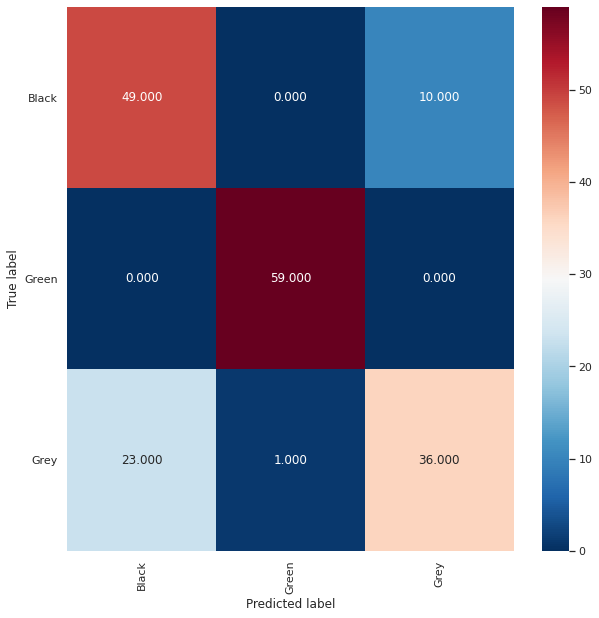

Normalised over true label (rows)


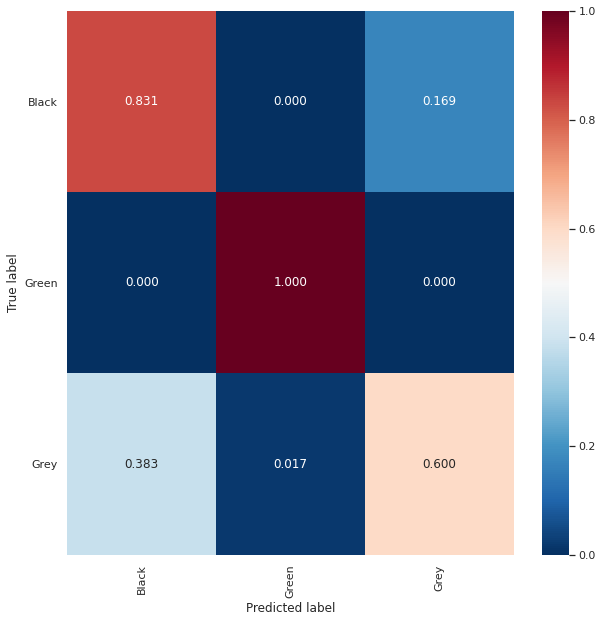

Normalised over pred label (columns)


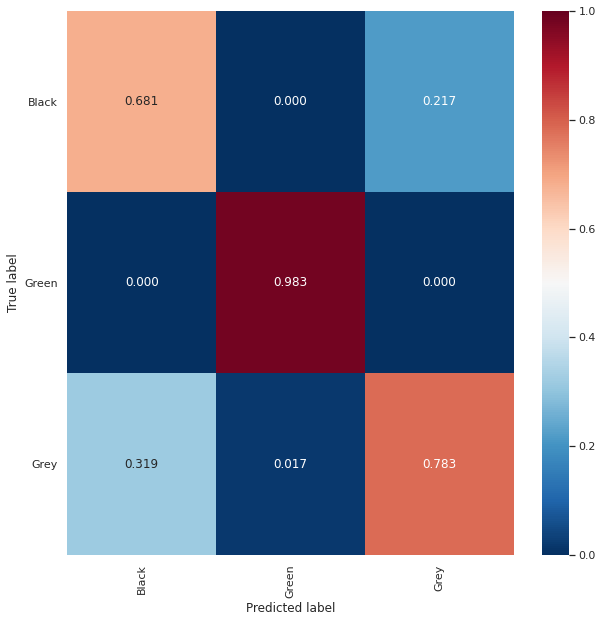

In [38]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [39]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

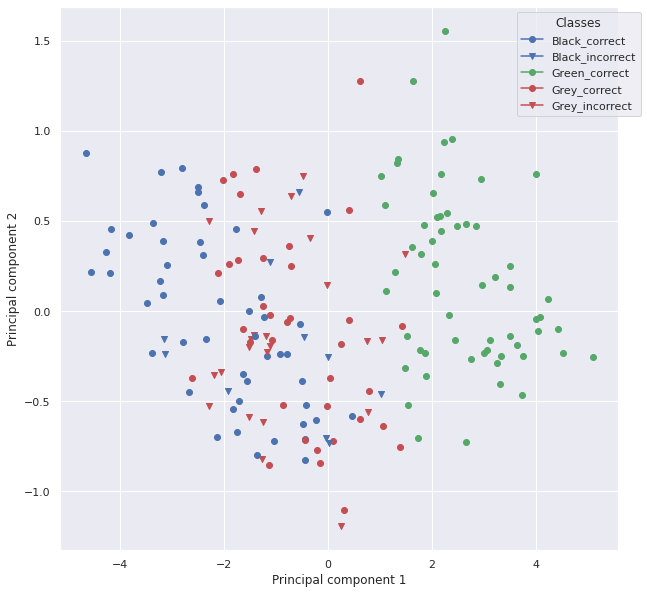

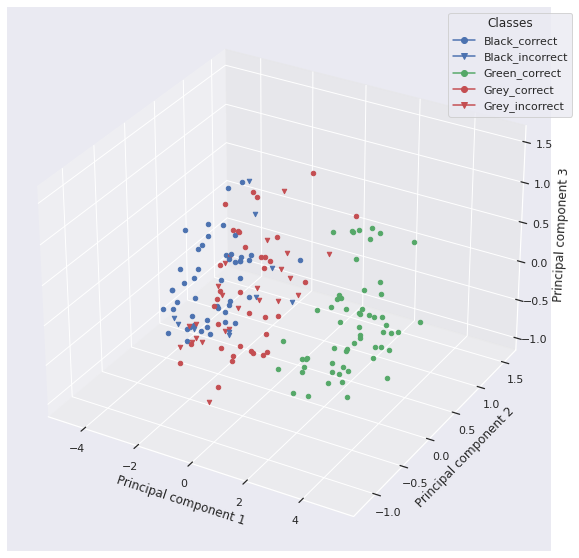

In [40]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Black_incorrect = Value that is actually black is predicted to be something else

It is possible to train an ML model that is able to identify the class labels of subclasses (in this case brands of tea) it was not exposed to during training. This behaviour will be crucial for future applications of the BADASS technology (e.g. identifying the class of biological samples (such as urine or serum) from diseased and healthy patients, etc.). In agreement with the scatter and box plots earlier in this notebook, the model is better able to distinguish the green tea from the other two classes as compared to between the grey and black tea, although it still predicts most of the black and grey samples correctly.

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [47]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 6, 8, 10, 12, 14]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 9  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 20
cv_folds_outer_loop = 10  # Value is irrelevant since am using user-defined split, so just set to an
# integer value between 2 and 20
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs = {accuracy_score: {},
                      recall_score: {'average': 'weighted',
                                     'zero_division': 0},
                      precision_score: {'average': 'weighted',
                                        'zero_division': 0},
                      f1_score: {'average': 'weighted',
                                 'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=ml.sub_classes, selected_features=selected_features,
                    inner_splits=inner_splits_indices, outer_splits=outer_splits_indices, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])
                
                # Check group splits have worked as expected
                for i, classes in enumerate(outer_splits_classes):
                    if sorted(list(classes[1])) != sorted(list(set(list(nested_cv_search['groups_true'][i])))):
                        raise Exception('Data has not been split as expected (outer split)')

                # Print output of nested CV
                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))





KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 10), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 9), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7647058823529411
F1: 0.7506375976964211




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.8888888888888888
F1: 0.8885003885003885




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: Order





KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 14), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 10), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.7777777777777778
F1: 0.7714285714285714




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 12), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.9411764705882353
F1: 0.9407651172357054




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7777777777777778
F1: 0.764102564102564




KNeighborsClassifier: no_balancing,  KBest_Fscore,  5
Parameters: Orde





KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'distance')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 10), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 15), ('p', 2), ('weights', 'distance')])
Accuracy: 0.8823529411764706
F1: 0.8823529411764706




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 1), ('weights', 'distance')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




KNeighborsClassifier: no_balancing,  KBest_Fscore,  12
Paramet





KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8235294117647058
F1: 0.8117647058823529




KNeighborsClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  Permutation





KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 18), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 9), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 2), ('p', 1), ('weights', 'distance')])
Accuracy: 0.8823529411764706
F1: 0.8789915966386554




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'distance')])
Accuracy: 1.0
F1: 1.0




KNeighborsClassifier: no_balancing,  Permutation_score,  8
Parameters: Ordered





GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.8823529411764706
F1: 0.8755244755244755




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.2777777777777778
F1: 0.22222222222222218




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 1.0
F1: 1.0




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




GaussianNB: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




GaussianNB: no_ba





GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.6111111111111112
F1: 0.6083916083916083




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.7222222222222222
F1: 0.7202797202797203




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.8235294117647058
F1: 0.8181818181818181




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7746031746031746




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.5
F1: 0.4666666666666667




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.8235294117647058
F1: 0.8033613445378152




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441





GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6571428571428571




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.7222222222222222
F1: 0.7202797202797203




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.9411764705882353
F1: 0.9411764705882353




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.35000000000000003




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8823529411764706
F1: 0.8760504201680672




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




GaussianNB: no_balancing,  Permutation_score,  5
Parameters: OrderedDict()
Acc





LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.8333333333333334
F1: 0.8222222222222223




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.25)])
Accuracy: 0.7058823529411765
F1: 0.6282913165266106




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.25)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  KBest_Fscore,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 128.0)])
Accuracy: 0.2777777777777778
F1: 0.2671679197994987




LinearSVC: n





LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.7777777777777778
F1: 0.75




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.9411764705882353
F1: 0.9407651172357054




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 512.0)])
Accuracy: 0.8888888888888888
F1: 0.882051282051282




LinearSVC: no_balancing,  KBest_Fscore,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.6666666666666666
F1: 0.6571428571428571




LinearSVC: no_balancing,  KB





LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 16.0)])
Accuracy: 0.8823529411764706
F1: 0.8823529411764706




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 64.0)])
Accuracy: 0.8333333333333334
F1: 0.8156288156288156




LinearSVC: no_balancing,  Permutation_score,  2
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 512.0)])
Accuracy: 0.6111111111111112
F1: 0.6235431





LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 128.0)])
Accuracy: 0.7777777777777778
F1: 0.75




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.8823529411764706
F1: 0.8823529411764706




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Accuracy: 0.8333333333333334
F1: 0.8156288156288156




LinearSVC: no_balancing,  Permutation_score,  8
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.6666666666666666
F1: 0.6571428571428571




Lin





SVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('C', 0.25), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




SVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('C', 0.25), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('C', 0.5), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.8823529411764706
F1: 0.8755244755244755




SVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('C', 0.25), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8888888888888888




SVC: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('random_state', 1), ('C', 0.125), ('gamma', 0.5), ('kernel', 'rbf')])
Accuracy: 0.2777777777777778
F1: 0.22222222222222218




SVC: no_balancing,  KBest_Fscore,  1
Parameters: O





SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 8192.0), ('gamma', 0.00390625), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 2048.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 512.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.8823529411764706
F1: 0.8823529411764706




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.5
F1: 0.4666666666666667




SVC: no_balancing,  KBest_Fscore,  5
Parameters: 





SVC: no_balancing,  KBest_Fscore,  14
Parameters: OrderedDict([('random_state', 1), ('C', 8192.0), ('gamma', 0.00048828125), ('kernel', 'rbf')])
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




SVC: no_balancing,  KBest_Fscore,  14
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




SVC: no_balancing,  KBest_Fscore,  14
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.8235294117647058
F1: 0.8212258329905389




SVC: no_balancing,  KBest_Fscore,  14
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  KBest_Fscore,  14
Parameters: OrderedDict([('random_state', 1), ('C', 128.0), ('gamma', 0.001953125), ('kernel', 'rbf')])
Accuracy: 0.5
F1: 0.4666666666666667




SVC: no_balancing,  KBest_Fscore,  14





SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 2048.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.8857142857142857




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 2.0), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7714285714285715




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 2.0), ('kernel', 'rbf')])
Accuracy: 0.9411764705882353
F1: 0.9407651172357054




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 32768.0), ('gamma', 0.03125), ('kernel', 'rbf')])
Accuracy: 0.8888888888888888
F1: 0.882051282051282




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 128.0), ('gamma', 2.0), ('kernel', 'rbf')])
Accuracy: 0.6666666666666666
F1: 0.6595117845117845




SVC: no_balancing, 





SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 32.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.75




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 4096.0), ('gamma', 0.00048828125), ('kernel', 'rbf')])
Accuracy: 0.8333333333333334
F1: 0.8321678321678321




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.25), ('kernel', 'rbf')])
Accuracy: 0.8823529411764706
F1: 0.8823529411764706




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 64.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




SVC: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('C', 8192.0), ('gamma', 0.00048828125), ('kernel', 'rbf')])
Accuracy: 0.7222222222222222
F1: 0.7037037037037037




SVC: no





AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.6111111111111112
F1: 0.5294117647058824




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.5555555555555556
F1: 0.5428571428571429




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.8235294117647058
F1: 0.8117647058823529




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.5555555555555556
F1: 0.5




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])





AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.7777777777777778
F1: 0.7777777777777778




AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.7777777777777778
F1: 0.75




AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8235294117647058
F1: 0.8117647058823529




AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8333333333333334
F1: 0.8307692307692308




AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.7222222222222222
F1: 0.7202797202797202




AdaBoostClassifier: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)





AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10000)])
Accuracy: 0.5555555555555556
F1: 0.5




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.6666666666666666
F1: 0.5555555555555556




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.8235294117647058
F1: 0.8117647058823529




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.8333333333333334
F1: 0.8156288156288156




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_stat





AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 316)])
Accuracy: 0.7222222222222222
F1: 0.6638655462184873




AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.6666666666666666
F1: 0.625




AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.7647058823529411
F1: 0.7352941176470589




AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.9444444444444444
F1: 0.9440559440559441




AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.7222222222222222
F1: 0.7202797202797202




AdaBoostClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('rando

In [48]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [49]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.765033,0.178453,0.765033,0.178453,0.792061,0.144354,0.750118,0.195646
1,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.777124,0.224668,0.777124,0.224668,0.785532,0.254550,0.762882,0.245820
2,KNeighborsClassifier,no_balancing,KBest_Fscore,3,0.776797,0.146134,0.776797,0.146134,0.804032,0.117891,0.771747,0.143099
3,KNeighborsClassifier,no_balancing,KBest_Fscore,4,0.787582,0.130310,0.787582,0.130310,0.789129,0.142711,0.779027,0.140361
4,KNeighborsClassifier,no_balancing,KBest_Fscore,5,0.804575,0.144730,0.804575,0.144730,0.813343,0.150782,0.797974,0.149724
...,...,...,...,...,...,...,...,...,...,...,...,...
95,AdaBoostClassifier,no_balancing,Permutation_score,6,0.725490,0.099187,0.725490,0.099187,0.717953,0.176457,0.684694,0.130273
96,AdaBoostClassifier,no_balancing,Permutation_score,8,0.753268,0.113566,0.753268,0.113566,0.743450,0.157768,0.727250,0.138873
97,AdaBoostClassifier,no_balancing,Permutation_score,10,0.747059,0.106389,0.747059,0.106389,0.761130,0.137646,0.718900,0.126044
98,AdaBoostClassifier,no_balancing,Permutation_score,12,0.736275,0.110456,0.736275,0.110456,0.718687,0.155868,0.705022,0.131672


In [50]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

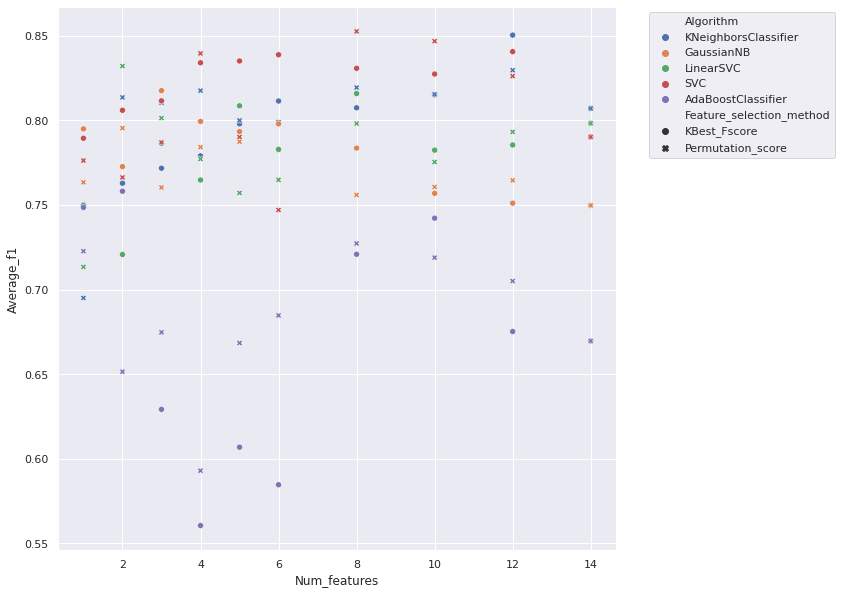

In [51]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

The number of features required to achieve optimal performance varies between algorithms, but is typically reached using the 2-4 most important features (regardless of the feature selection method used). In the case of most of the models, incorporating additional features does not appear to introduce substantial noise into the data, as performance plateaus rather than peaking.

Achieve performance ~ equal to original LinearSVC model (trained with all 14 peptides) with just the 2 most important peptides selected via permutation analysis.

In [52]:
sub_red_feat_score_df = red_feat_score_df[red_feat_score_df['Num_features'] == 2].reset_index(drop=True)

In [53]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.777124,0.224668,0.777124,0.224668,0.785532,0.254550,0.762882,0.245820
1,KNeighborsClassifier,no_balancing,Permutation_score,2,0.815686,0.123650,0.815686,0.123650,0.838544,0.099133,0.813589,0.121810
2,GaussianNB,no_balancing,KBest_Fscore,2,0.782680,0.223928,0.782680,0.223928,0.784930,0.255333,0.772644,0.243374
3,GaussianNB,no_balancing,Permutation_score,2,0.804248,0.155216,0.804248,0.155216,0.828926,0.145869,0.795434,0.162786
4,LinearSVC,no_balancing,KBest_Fscore,2,0.747712,0.179410,0.747712,0.179410,0.780510,0.161283,0.720720,0.192544
5,LinearSVC,no_balancing,Permutation_score,2,0.837908,0.117167,0.837908,0.117167,0.851071,0.113616,0.832107,0.121803
6,SVC,no_balancing,KBest_Fscore,2,0.810458,0.197268,0.810458,0.197268,0.835228,0.162969,0.806003,0.199671
7,SVC,no_balancing,Permutation_score,2,0.775817,0.118301,0.775817,0.118301,0.780597,0.132129,0.766278,0.130838
8,AdaBoostClassifier,no_balancing,KBest_Fscore,2,0.770588,0.155212,0.770588,0.155212,0.806294,0.137169,0.758141,0.163555
9,AdaBoostClassifier,no_balancing,Permutation_score,2,0.686275,0.180213,0.686275,0.180213,0.646984,0.208697,0.651468,0.190071


Will select LinearSVC classifier and feature selection via permutation analysis, as this combination achieves the best performance with two features across all four metrics.

In [54]:
red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['outer_loop_params']

[OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 8.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 16.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 16.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 64.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 512.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 8.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_state', 1),
              ('C', 8.0)]),
 OrderedDict([('dual', False),
              ('max_iter', 10000),
              ('random_sta

In [55]:
red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 32.0)])),
             ('recall',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 32.0)])),
             ('precision',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 32.0)])),
             ('f1',
              OrderedDict([('dual', False),
                           ('max_iter', 10000),
                           ('random_state', 1),
                           ('C', 32.0)]))])

In [56]:
red_feat_nested_pred = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['predictions']
red_feat_nested_y_true = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['y_true']
red_feat_nested_x_true = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

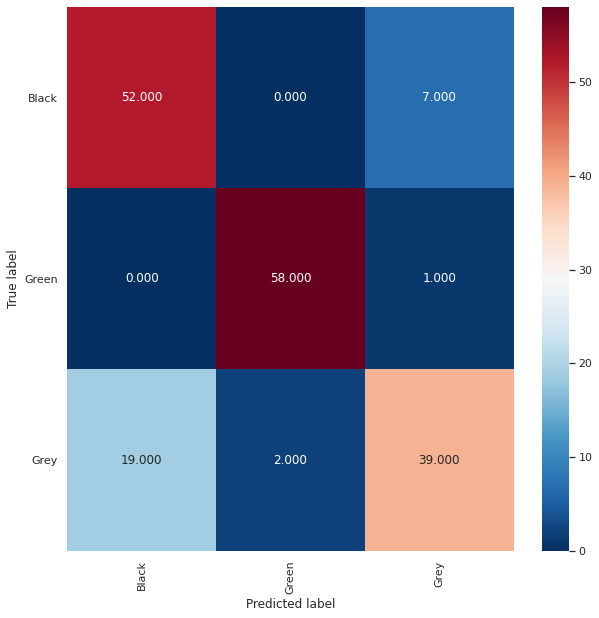

Normalised over true label (rows)


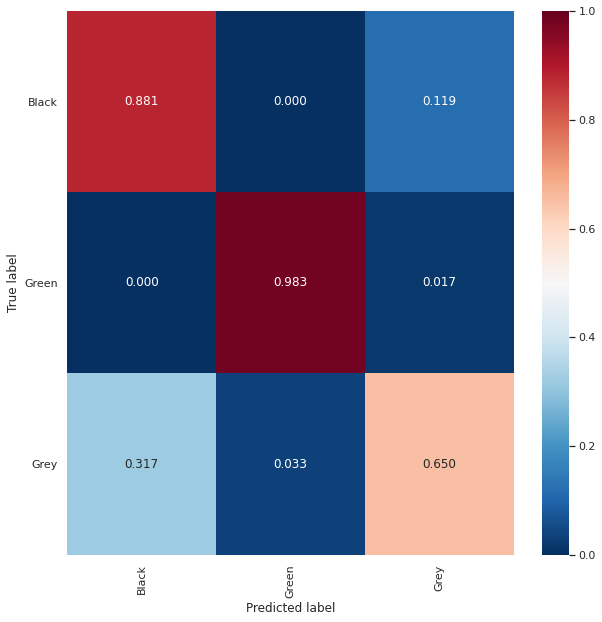

Normalised over pred label (columns)


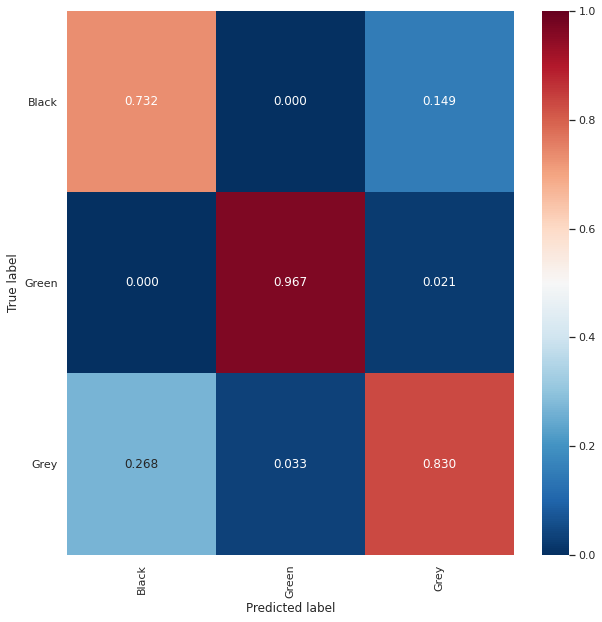

In [57]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [58]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

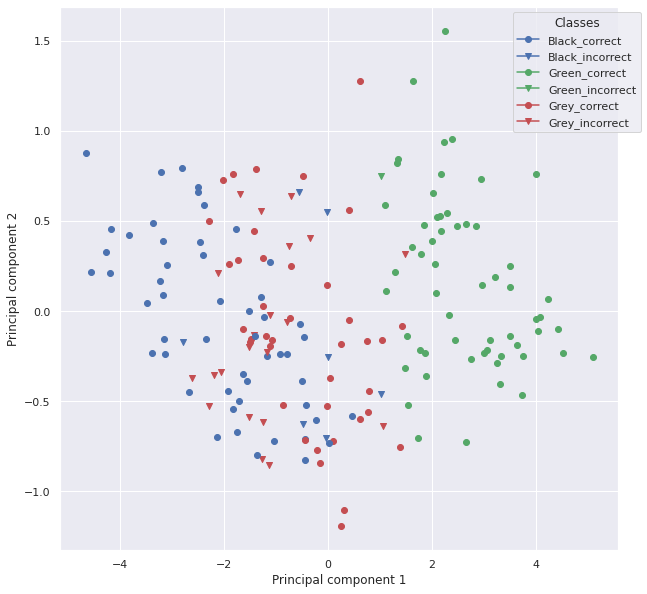

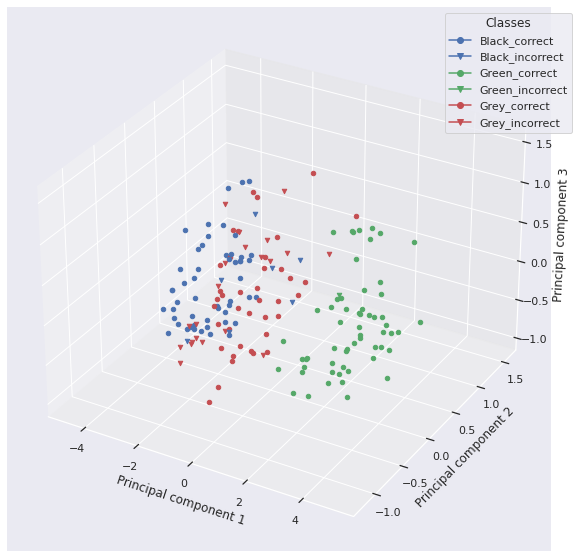

In [59]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Black_incorrect = Value that is actually black is predicted to be something else

So, a LinearSVC model trained with 2 peptides performs similarly well to a LinearSVC model trained with all 14 peptides.

Is there a significant difference between the two models?

In [60]:
params_1 = all_feat_searches['LinearSVC__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['LinearSVC__no_balancing__Permutation_score__2']['best_outer_loop_params']['f1']
selected_features_2 = mean_permut_feat_importances_df['Feature'].tolist()[:2]

print('Model 1:')
print('Algorithm: LinearSVC')
print('Parameters:\n{}'.format(params_1))
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: LinearSVC')
print('Parameters:\n{}'.format(params_2))
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_group_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, groups=ml.sub_classes, selected_features_1=selected_features_1,
    selected_features_2=selected_features_2, classifier_1=LinearSVC, classifier_2=LinearSVC, params_1=params_1,
    params_2=params_2, resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: LinearSVC
Parameters:
OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 8.0)])
Features:
['DPH_GRP22', 'DPH_GRP46', 'DPH_GRP51', 'DPH_GRP52', 'DPH_GRP63', 'DPH_GRP80', 'DPH_Pent', 'DPH_Hex', 'DPH_Hex2', 'DPH_Hept', 'DPH_24D', 'DPH_24E', 'DPH_24K', 'DPH_17K']




Model 2:
Algorithm: LinearSVC
Parameters:
OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 32.0)])
Features:
['DPH_GRP52', 'DPH_24K']


In [61]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 0.8256982915869374
p value: 0.6288050925819234


So, there is no significant difference in performance when reduce the number of peptides used to train the model from 14 to 2.